In [1]:
import os

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

# 解壓縮資料

In [2]:
def unzip_data(path):
    for folder, _, files in os.walk(path):
        for file in files:
            if file.endswith('zip'):
                file_path = os.path.join(folder, file)
                print(file_path)

                sotre_path = os.path.join(folder, file.rsplit('.')[0])
                # 開啟 ZIP 壓縮檔 
                with zipfile.ZipFile(file_path, 'r') as zf:
                    # 解壓縮所有檔案至 /my/folder 目錄
                    zf.extractall(path=sotre_path)

In [3]:
# unzip_data('./swing')

In [4]:
def convert_csv(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=',')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=',')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=',')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=',')
    device_df = pd.read_csv(os.path.join(path, 'meta', 'device.csv'), delimiter=',')
    time_df = pd.read_csv(os.path.join(path, 'meta', 'time.csv'), delimiter=',')
    
    acc_df.to_csv(os.path.join(path, 'Accelerometer.csv'), index=False, sep=';')
    gyo_df.to_csv(os.path.join(path, 'Gyroscope.csv'), index=False, sep=';')
    linacc_df.to_csv(os.path.join(path, 'Linear Accelerometer.csv'), index=False, sep=';')
    mag_df.to_csv(os.path.join(path, 'Magnetometer.csv'), index=False, sep=';')
    device_df.to_csv(os.path.join(path, 'meta', 'device.csv'), index=False, sep=';')
    time_df.to_csv(os.path.join(path, 'meta', 'time.csv'), index=False, sep=';')

In [5]:
# convert_csv('./pocket/202301101952/target')
# convert_csv('./pocket/202301101952/source')

# 讀檔

In [6]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = rename_data(total_df)
    
    return total_df

In [7]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
#     length = datapoint_per_second * duration
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments


def select_data(df):
    return df[['acc_x', 'acc_y', 'acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25):
    pre_df = select_data(df)
    segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [8]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

        print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num):
    pair_data = []

    for folder in os.listdir(root_folder):
        if folder.startswith('.'):
            continue

        folder_path = os.path.join(root_folder, folder)
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        #print(folder_path)
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len)
        target_segs = preprocess_data(target_df, chunk_size, seq_len)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [9]:
datapoint_per_second = 20
duration = 2
chunk_size = 20
seq_len = 11
classes = {'target': 0, 'front_pocket': 1, 'pocket': 2, 'swing': 3}

In [10]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [11]:
front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1)
pocket_pair_data = load_pair_data('./pocket', class_num=2)
swing_pair_data = load_pair_data('./swing', class_num=3)

./front_pocket/202302071628/source ./front_pocket/202302071628/target
./front_pocket/202302071652/source ./front_pocket/202302071652/target
./front_pocket/202302071523/source ./front_pocket/202302071523/target
./front_pocket/202302071531/source ./front_pocket/202302071531/target
./front_pocket/202302071715/source ./front_pocket/202302071715/target
./front_pocket/202302071641/source ./front_pocket/202302071641/target
./front_pocket/202302071541/source ./front_pocket/202302071541/target
./front_pocket/202302071619/source ./front_pocket/202302071619/target
./front_pocket/202302071704/source ./front_pocket/202302071704/target
./front_pocket/202302071724/source ./front_pocket/202302071724/target
./pocket/202302132108/source ./pocket/202302132108/target
./pocket/202302131750/source ./pocket/202302131750/target
./pocket/202302131601/source ./pocket/202302131601/target
./pocket/202302071606/source ./pocket/202302071606/target
./pocket/202302132053/source ./pocket/202302132053/target
./pocket/2

In [12]:
print(len(front_pocket_pair_data), len(pocket_pair_data), len(swing_pair_data))

257 247 241


In [13]:
front_pocket_pair_data[0][0][0, -1], front_pocket_pair_data[0][2][0, -1]

(array([-1.97663956e+00,  8.86711075e+00,  3.91136627e-01, -1.14967659e-01,
         5.08137286e-01, -2.88144440e-01, -5.83233668e-01,  1.58409960e+00,
        -2.65234453e-01,  2.58135452e+01, -1.72178955e+01,  3.18394165e+01,
         1.67575811e+09]),
 array([-4.13589935e-01,  7.06530762e+00,  3.47532303e+00,  3.33424210e-01,
        -2.83569545e-01, -9.29359943e-02,  1.27573235e-01, -8.32500252e-01,
        -2.15068193e+00, -4.01689987e+01, -2.68133926e+00, -2.19891357e+01,
         1.67575811e+09]))

# 建立dataloader

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [15]:
# class ClassDataset(Dataset):
#     def __init__(self, data, label):
#         self.data = data
#         self.label = label

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         return self.data[idx], self.label[idx]

In [16]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(9, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        ################
        ### Imu Part ###
        ################
        self.classifier = Classifier(chunk_size, seq_len, num_of_classes)
        
        ################
        ### Mag Part ###
        ################
        self.imu_embedding = nn.Sequential(
            nn.Linear(9, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU()
        )
        
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        
        self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16 * self.seq_len),
            nn.LeakyReLU(),
            nn.Linear(16 * self.seq_len, 3 * self.seq_len),
        )
        
    def forward(self, source_imu, source_mag, target_mag=None):

        if target_mag != None:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            #source_imu_h = self.imu_embedding(source_imu)
            #source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            #source_mag_h += source_imu_h
            
            target_mag = torch.concat([torch.zeros(len(target_mag), 1, self.seq_len, 3).to(source_mag.device), target_mag], dim=1)
            tgt = self.mag_layer(target_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            tgt = self.pos_encoder(tgt)  # (batch, chunk_size, seq_len * 64)
            
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            mem_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz, tgt_mask, mem_mask)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)
            predict_mag = self.mag_last(predict_mag_latent)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)

            return predict_mag
        
        else:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            #source_imu_h = self.imu_embedding(source_imu)
            #source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            #source_mag_h += source_imu_h
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt = torch.zeros(len(source_mag), 1, self.seq_len, 3).to(source_mag.device)
            tgt = self.mag_layer(tgt)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), 1, -1))
        
            for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
                tgt_pos = self.pos_encoder(tgt.clone())
                tgt_mask = get_tgt_mask(tgt.size(1)).to(source_mag.device)
                decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], tgt_mask, tgt_mask, memory_key_padding_mask=None)
                tgt = torch.concat([tgt, decode_position[:, -1:]], dim=1)
            predict_mag = self.mag_last(tgt)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size + 1, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)
            
            return predict_mag[:, 1:]


In [19]:
# class NotSimpleRNN(nn.Module):
#     def __init__(self, seq_len=100, num_of_classes=2):
#         super(NotSimpleRNN, self).__init__()
        
#         self.seq_len = seq_len
        
#         ################
#         ### Imu Part ###
#         ################
#         self.imu_layer = nn.Sequential(
#             nn.Linear(8, 16),
#             nn.Tanh(),
#             nn.Linear(16, 32),
#             nn.LeakyReLU(),
#         )
        
#         self.imu_rnn = nn.LSTM(input_size=32, hidden_size=32, num_layers=2, batch_first=True)
# #         self.lstm = nn.LSTM(input_size=16, hidden_size=16, num_layers=2, batch_first=True, bidirectional=True)
        
#         self.imu_last = nn.Sequential(
#             nn.Linear(32, 32),
#             nn.LeakyReLU(),
#             nn.Linear(32, num_of_classes),
#             nn.Softmax(dim=1),
#         )
        
#         ################
#         ### Mag Part ###
#         ################
#         self.mag_layer = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 16),
#             nn.LeakyReLU(),
#         )
        
#         self.mag_rnn_encoder = nn.LSTM(input_size=16, hidden_size=16, num_layers=4, batch_first=True)
#         self.mag_rnn_decoder = nn.LSTM(input_size=48, hidden_size=16, num_layers=4, batch_first=True)
#         self.mag_last = nn.Sequential(
#             nn.Linear(16, 8),
#             nn.LeakyReLU(),
#             nn.Linear(8, 3),
#         )
        
#     def forward(self, source_imu, source_mag):
#         ### imu part ###
#         source_h = self.imu_layer(source_imu)
#         source_hz, _ = self.imu_rnn(source_h)
#         source_predict_probability = self.imu_last(source_hz[:, -1])
        
#         ### mag part ###
#         source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#         source_mag_hz, _ = self.mag_rnn_encoder(source_mag_h)  # (batch, seq_len, 16)
        
#         source_latent = torch.concat([source_hz, source_mag_hz], dim=-1)  # (batch, seq_len, 48)
        
#         predict_mag_latent, _ = self.mag_rnn_decoder(source_latent)
#         predict_mag = self.mag_last(predict_mag_latent)
        
#         return source_predict_probability, predict_mag

In [20]:
# class NotSimpleTransformer(nn.Module):
#     def __init__(self, seq_len=100, num_of_classes=2):
#         super(NotSimpleTransformer, self).__init__()
        
#         self.seq_len = seq_len
#         self.pos_encoder = PositionalEncoding(64, 0.1)
#         ################
#         ### Imu Part ###
#         ################
# #         self.imu_layer = nn.Sequential(
# #             nn.Linear(8, 16),
# #             nn.LeakyReLU(),
# #             nn.Linear(16, 16),
# #             nn.LeakyReLU(),
# #         )
        
# #         self.imu_rnn = nn.LSTM(input_size=16, hidden_size=16, num_layers=2, batch_first=True)
        
# #         self.imu_last = nn.Sequential(
# #             nn.Linear(16, 16),
# #             nn.LeakyReLU(),
# #             nn.Linear(16, num_of_classes),
# #             nn.Softmax(dim=1),
# #         )
        
#         ################
#         ### Mag Part ###
#         ################
#         self.mag_layer = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 64),
#             nn.LeakyReLU(),
#         )
        
#         self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
#         self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
#         self.mag_last = nn.Sequential(
#             nn.Linear(64, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 3),
#         )
        
#     def forward(self, source_mag, target_mag=None):
#         ### imu part ###
#         if target_mag != None:
# #             source_h = self.imu_layer(source_imu)
# #             source_hz, _ = self.imu_rnn(source_h)
# #             source_predict_probability = self.imu_last(source_hz[:, -1])

#             ### mag part ###
#             source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#             source_mag_h = self.pos_encoder(source_mag_h)
#             tgt = self.mag_layer(target_mag)
#             tgt = self.pos_encoder(tgt)
#             source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, seq_len, 16)

# #             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, seq_len, 48)
#             predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz)
#             predict_mag = self.mag_last(predict_mag_latent)

#             return predict_mag
        
#         else:
            
# #             source_h = self.imu_layer(source_imu)
# #             source_hz, _ = self.imu_rnn(source_h)
# #             source_predict_probability = self.imu_last(source_hz[:, -1])

#             ### mag part ###
#             source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#             source_mag_h = self.pos_encoder(source_mag_h)
#             source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, seq_len, 16)

# #             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, seq_len, 48)
#             tgt = torch.zeros_like(source_mag_hz)
#             for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
#                 decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], memory_key_padding_mask=None)
#                 tgt[:, i, :] = decode_position[:, -1, :]
#             predict_mag = self.mag_last(tgt)
#             return predict_mag
        
# class PositionalEncoding(nn.Module):
#     def __init__(self, d_model, dropout=0.1, max_len=5000):
#         super(PositionalEncoding, self).__init__()
#         self.dropout = nn.Dropout(p=dropout)

#         pe = torch.zeros(max_len, d_model)
#         position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
#         div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
#         pe[:, 0::2] = torch.sin(position * div_term)
#         pe[:, 1::2] = torch.cos(position * div_term)
#         pe = pe.unsqueeze(0).transpose(0, 1)
#         self.register_buffer('pe', pe)

#     def forward(self, x):
#         x = x + self.pe[:x.size(0), :].to(x.device)
#         return self.dropout(x)


In [21]:
front_pocket_half = int(len(front_pocket_pair_data) * 0.8)
pocket_half = int(len(pocket_pair_data) * 0.8)
swing_half = int(len(swing_pair_data) * 0.8)

train_data = front_pocket_pair_data[:front_pocket_half] #+ pocket_pair_data[:pocket_half] + swing_pair_data[:swing_half]
valid_data = front_pocket_pair_data[front_pocket_half:] #+ pocket_pair_data[pocket_half:] + swing_pair_data[swing_half:]

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=32)

In [22]:
batch = next(iter(train_loader))

In [23]:
len(batch), len(batch[0]), len(batch[0][0]), len(batch[0][0][0]), len(batch[0][0][0][0])

(4, 32, 20, 11, 13)

In [24]:
EPOCH = 2000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()

In [25]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

In [26]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [27]:
def train(model, dataloader, optimizer, draw=False):
    model.train()

    losses = []
    pred_loss = []

    for source_data, source_label, target_data, target_label in tqdm(dataloader):
        optimizer.zero_grad()

        source_data = source_data.to(device)
        target_data = target_data.to(device)

        one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

        predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12], target_data[:, :-1, :, 9:12])
        torch.cuda.empty_cache()
        #_, predict_classes = torch.max(predict_probability, 1)

#         class_loss = ce_loss(predict_probability, one_hot)
        predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
        loss = predict_loss

        # backward
        loss.backward()
#         class_loss.backward()
#         predict_loss.backward()
        optimizer.step()
        
        losses.append(loss.item())
        pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

In [28]:
def evalute(model, dataloader, draw=False):
    model.eval()

    losses = []
    pred_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)
            
            one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12])
            #_, predict_classes = torch.max(predict_probability, 1)

            #class_loss = ce_loss(predict_probability, one_hot)
            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            loss = predict_loss
            
            losses.append(loss.item())
            pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

100%|██████████| 7/7 [00:00<00:00, 27.94it/s]


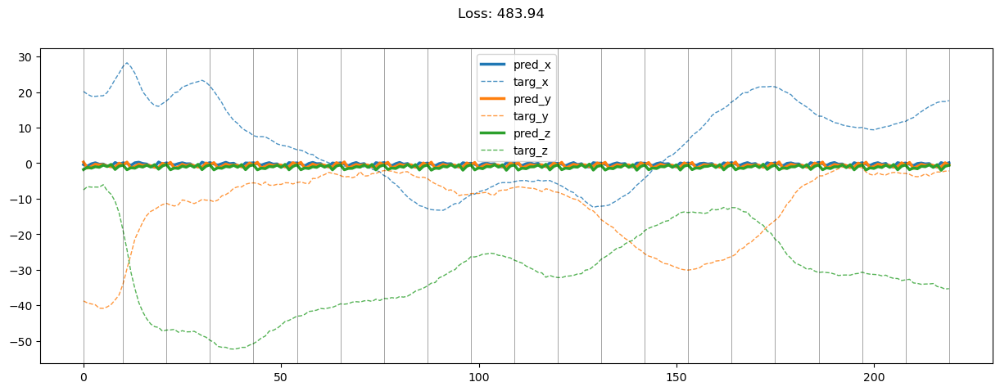

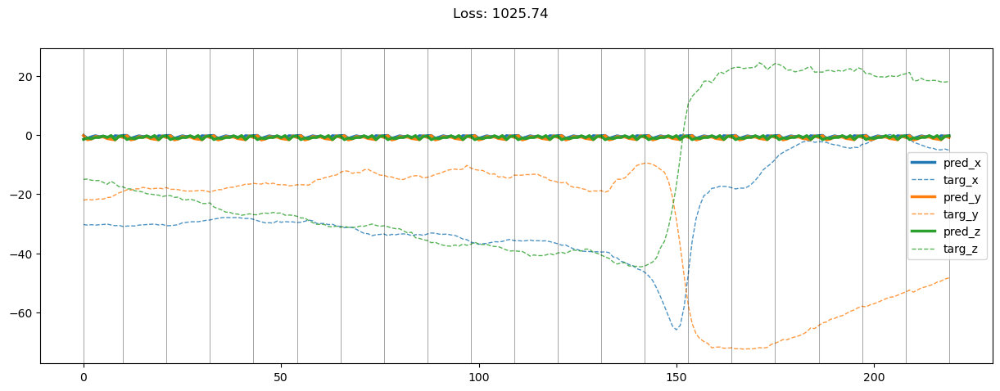

00000: train total loss:  649.472, pred loss:  649.472, valid total loss:  673.739, pred loss:  673.739


100%|██████████| 7/7 [00:00<00:00, 27.71it/s]


00001: train total loss:  628.149, pred loss:  628.149, valid total loss:  659.486, pred loss:  659.486


100%|██████████| 7/7 [00:00<00:00, 23.98it/s]


00002: train total loss:  619.075, pred loss:  619.075, valid total loss:  652.091, pred loss:  652.091


100%|██████████| 7/7 [00:00<00:00, 25.87it/s]


00003: train total loss:  608.752, pred loss:  608.752, valid total loss:  646.613, pred loss:  646.613


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


00004: train total loss:  605.504, pred loss:  605.504, valid total loss:  644.903, pred loss:  644.903


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


00005: train total loss:  592.348, pred loss:  592.348, valid total loss:  642.346, pred loss:  642.346


100%|██████████| 7/7 [00:00<00:00, 30.55it/s]


00006: train total loss:  592.083, pred loss:  592.083, valid total loss:  634.131, pred loss:  634.131


100%|██████████| 7/7 [00:00<00:00, 30.49it/s]


00007: train total loss:  575.906, pred loss:  575.906, valid total loss:  626.391, pred loss:  626.391


100%|██████████| 7/7 [00:00<00:00, 30.46it/s]


00008: train total loss:  571.504, pred loss:  571.504, valid total loss:  616.934, pred loss:  616.934


100%|██████████| 7/7 [00:00<00:00, 25.79it/s]


00009: train total loss:  565.873, pred loss:  565.873, valid total loss:  606.609, pred loss:  606.609


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


00010: train total loss:  555.495, pred loss:  555.495, valid total loss:  595.575, pred loss:  595.575


100%|██████████| 7/7 [00:00<00:00, 29.45it/s]


00011: train total loss:  543.911, pred loss:  543.911, valid total loss:  585.408, pred loss:  585.408


100%|██████████| 7/7 [00:00<00:00, 30.44it/s]


00012: train total loss:  531.147, pred loss:  531.147, valid total loss:  575.694, pred loss:  575.694


100%|██████████| 7/7 [00:00<00:00, 29.44it/s]


00013: train total loss:  519.204, pred loss:  519.204, valid total loss:  565.914, pred loss:  565.914


100%|██████████| 7/7 [00:00<00:00, 30.80it/s]


00014: train total loss:  505.973, pred loss:  505.973, valid total loss:  559.911, pred loss:  559.911


100%|██████████| 7/7 [00:00<00:00, 29.97it/s]


00015: train total loss:  502.416, pred loss:  502.416, valid total loss:  550.598, pred loss:  550.598


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


00016: train total loss:  483.830, pred loss:  483.830, valid total loss:  531.256, pred loss:  531.256


100%|██████████| 7/7 [00:00<00:00, 29.83it/s]


00017: train total loss:  472.735, pred loss:  472.735, valid total loss:  514.381, pred loss:  514.381


100%|██████████| 7/7 [00:00<00:00, 29.91it/s]


00018: train total loss:  455.206, pred loss:  455.206, valid total loss:  504.355, pred loss:  504.355


100%|██████████| 7/7 [00:00<00:00, 30.19it/s]


00019: train total loss:  449.546, pred loss:  449.546, valid total loss:  491.015, pred loss:  491.015


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


00020: train total loss:  441.139, pred loss:  441.139, valid total loss:  494.578, pred loss:  494.578


100%|██████████| 7/7 [00:00<00:00, 29.60it/s]


00021: train total loss:  419.681, pred loss:  419.681, valid total loss:  471.113, pred loss:  471.113


100%|██████████| 7/7 [00:00<00:00, 30.72it/s]


00022: train total loss:  414.144, pred loss:  414.144, valid total loss:  462.733, pred loss:  462.733


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


00023: train total loss:  402.339, pred loss:  402.339, valid total loss:  442.134, pred loss:  442.134


100%|██████████| 7/7 [00:00<00:00, 31.32it/s]


00024: train total loss:  376.914, pred loss:  376.914, valid total loss:  437.950, pred loss:  437.950


100%|██████████| 7/7 [00:00<00:00, 35.14it/s]


00025: train total loss:  370.012, pred loss:  370.012, valid total loss:  417.193, pred loss:  417.193


100%|██████████| 7/7 [00:00<00:00, 35.11it/s]


00026: train total loss:  353.642, pred loss:  353.642, valid total loss:  411.977, pred loss:  411.977


100%|██████████| 7/7 [00:00<00:00, 32.92it/s]


00027: train total loss:  340.251, pred loss:  340.251, valid total loss:  406.650, pred loss:  406.650


100%|██████████| 7/7 [00:00<00:00, 34.66it/s]


00028: train total loss:  337.172, pred loss:  337.172, valid total loss:  386.473, pred loss:  386.473


100%|██████████| 7/7 [00:00<00:00, 34.46it/s]


00029: train total loss:  318.422, pred loss:  318.422, valid total loss:  376.280, pred loss:  376.280


100%|██████████| 7/7 [00:00<00:00, 33.27it/s]


00030: train total loss:  307.317, pred loss:  307.317, valid total loss:  366.894, pred loss:  366.894


100%|██████████| 7/7 [00:00<00:00, 34.65it/s]


00031: train total loss:  298.096, pred loss:  298.096, valid total loss:  364.990, pred loss:  364.990


100%|██████████| 7/7 [00:00<00:00, 34.90it/s]


00032: train total loss:  283.952, pred loss:  283.952, valid total loss:  341.737, pred loss:  341.737


100%|██████████| 7/7 [00:00<00:00, 34.24it/s]


00033: train total loss:  277.274, pred loss:  277.274, valid total loss:  333.760, pred loss:  333.760


100%|██████████| 7/7 [00:00<00:00, 34.76it/s]


00034: train total loss:  273.166, pred loss:  273.166, valid total loss:  323.613, pred loss:  323.613


100%|██████████| 7/7 [00:00<00:00, 34.86it/s]


00035: train total loss:  256.082, pred loss:  256.082, valid total loss:  325.600, pred loss:  325.600


100%|██████████| 7/7 [00:00<00:00, 34.79it/s]


00036: train total loss:  244.820, pred loss:  244.820, valid total loss:  315.245, pred loss:  315.245


100%|██████████| 7/7 [00:00<00:00, 34.69it/s]


00037: train total loss:  243.937, pred loss:  243.937, valid total loss:  317.934, pred loss:  317.934


100%|██████████| 7/7 [00:00<00:00, 34.89it/s]


00038: train total loss:  228.644, pred loss:  228.644, valid total loss:  327.845, pred loss:  327.845


100%|██████████| 7/7 [00:00<00:00, 33.82it/s]


00039: train total loss:  224.324, pred loss:  224.324, valid total loss:  286.770, pred loss:  286.770


100%|██████████| 7/7 [00:00<00:00, 34.84it/s]


00040: train total loss:  211.567, pred loss:  211.567, valid total loss:  299.737, pred loss:  299.737


100%|██████████| 7/7 [00:00<00:00, 34.91it/s]


00041: train total loss:  208.644, pred loss:  208.644, valid total loss:  304.727, pred loss:  304.727


100%|██████████| 7/7 [00:00<00:00, 34.81it/s]


00042: train total loss:  202.943, pred loss:  202.943, valid total loss:  285.999, pred loss:  285.999


100%|██████████| 7/7 [00:00<00:00, 29.81it/s]


00043: train total loss:  192.365, pred loss:  192.365, valid total loss:  290.868, pred loss:  290.868


100%|██████████| 7/7 [00:00<00:00, 30.79it/s]


00044: train total loss:  185.247, pred loss:  185.247, valid total loss:  260.951, pred loss:  260.951


100%|██████████| 7/7 [00:00<00:00, 32.55it/s]


00045: train total loss:  179.902, pred loss:  179.902, valid total loss:  269.156, pred loss:  269.156


100%|██████████| 7/7 [00:00<00:00, 34.70it/s]


00046: train total loss:  169.464, pred loss:  169.464, valid total loss:  250.580, pred loss:  250.580


100%|██████████| 7/7 [00:00<00:00, 34.91it/s]


00047: train total loss:  164.076, pred loss:  164.076, valid total loss:  287.564, pred loss:  287.564


100%|██████████| 7/7 [00:00<00:00, 34.79it/s]


00048: train total loss:  161.104, pred loss:  161.104, valid total loss:  254.577, pred loss:  254.577


100%|██████████| 7/7 [00:00<00:00, 34.90it/s]


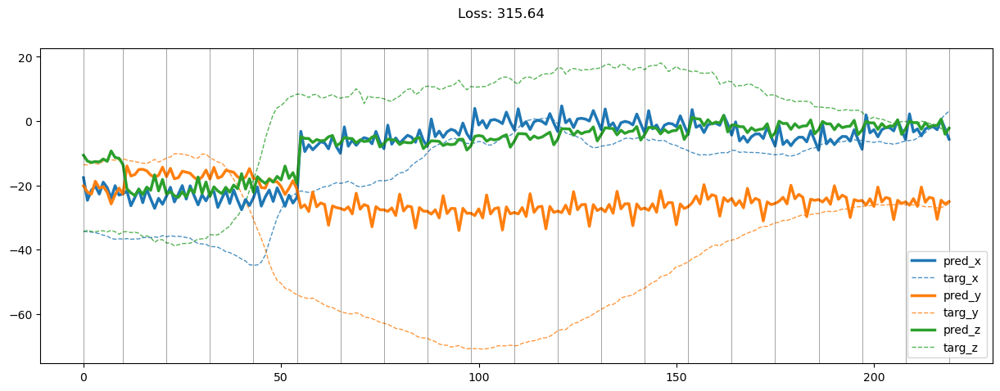

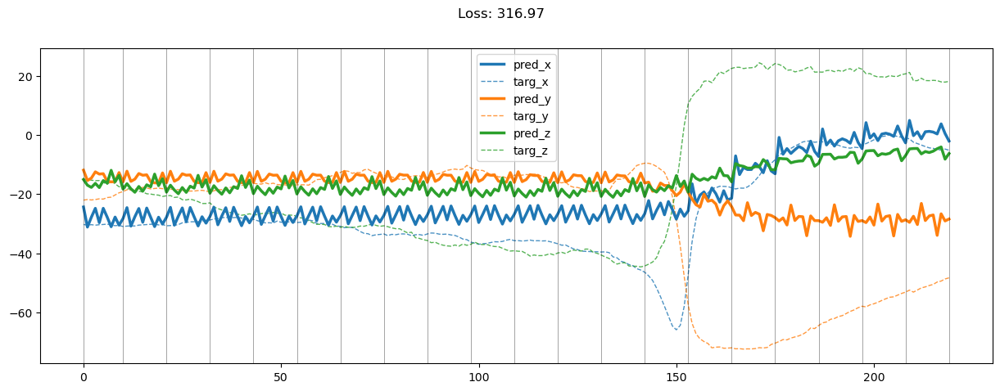

00049: train total loss:  152.399, pred loss:  152.399, valid total loss:  229.569, pred loss:  229.569


100%|██████████| 7/7 [00:00<00:00, 34.52it/s]


00050: train total loss:  145.570, pred loss:  145.570, valid total loss:  223.803, pred loss:  223.803


100%|██████████| 7/7 [00:00<00:00, 34.93it/s]


00051: train total loss:  140.400, pred loss:  140.400, valid total loss:  229.974, pred loss:  229.974


100%|██████████| 7/7 [00:00<00:00, 35.05it/s]


00052: train total loss:  135.202, pred loss:  135.202, valid total loss:  236.863, pred loss:  236.863


100%|██████████| 7/7 [00:00<00:00, 35.01it/s]


00053: train total loss:  125.553, pred loss:  125.553, valid total loss:  223.341, pred loss:  223.341


100%|██████████| 7/7 [00:00<00:00, 32.54it/s]


00054: train total loss:  124.531, pred loss:  124.531, valid total loss:  213.294, pred loss:  213.294


100%|██████████| 7/7 [00:00<00:00, 29.37it/s]


00055: train total loss:  119.090, pred loss:  119.090, valid total loss:  213.437, pred loss:  213.437


100%|██████████| 7/7 [00:00<00:00, 29.87it/s]


00056: train total loss:  112.069, pred loss:  112.069, valid total loss:  205.330, pred loss:  205.330


100%|██████████| 7/7 [00:00<00:00, 29.42it/s]


00057: train total loss:  109.051, pred loss:  109.051, valid total loss:  196.776, pred loss:  196.776


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


00058: train total loss:  103.856, pred loss:  103.856, valid total loss:  192.267, pred loss:  192.267


100%|██████████| 7/7 [00:00<00:00, 29.68it/s]


00059: train total loss:  102.355, pred loss:  102.355, valid total loss:  194.467, pred loss:  194.467


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


00060: train total loss:  95.749, pred loss:  95.749, valid total loss:  207.701, pred loss:  207.701


100%|██████████| 7/7 [00:00<00:00, 28.72it/s]


00061: train total loss:  96.360, pred loss:  96.360, valid total loss:  183.480, pred loss:  183.480


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


00062: train total loss:  90.821, pred loss:  90.821, valid total loss:  198.619, pred loss:  198.619


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


00063: train total loss:  87.338, pred loss:  87.338, valid total loss:  182.942, pred loss:  182.942


100%|██████████| 7/7 [00:00<00:00, 29.78it/s]


00064: train total loss:  85.555, pred loss:  85.555, valid total loss:  187.414, pred loss:  187.414


100%|██████████| 7/7 [00:00<00:00, 30.18it/s]


00065: train total loss:  79.081, pred loss:  79.081, valid total loss:  181.820, pred loss:  181.820


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


00066: train total loss:  77.550, pred loss:  77.550, valid total loss:  159.313, pred loss:  159.313


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


00067: train total loss:  73.304, pred loss:  73.304, valid total loss:  161.999, pred loss:  161.999


100%|██████████| 7/7 [00:00<00:00, 26.29it/s]


00068: train total loss:  72.721, pred loss:  72.721, valid total loss:  161.764, pred loss:  161.764


100%|██████████| 7/7 [00:00<00:00, 27.09it/s]


00069: train total loss:  67.847, pred loss:  67.847, valid total loss:  152.393, pred loss:  152.393


100%|██████████| 7/7 [00:00<00:00, 30.26it/s]


00070: train total loss:  66.936, pred loss:  66.936, valid total loss:  151.932, pred loss:  151.932


100%|██████████| 7/7 [00:00<00:00, 26.93it/s]


00071: train total loss:  63.768, pred loss:  63.768, valid total loss:  149.927, pred loss:  149.927


100%|██████████| 7/7 [00:00<00:00, 23.31it/s]


00072: train total loss:  60.917, pred loss:  60.917, valid total loss:  160.893, pred loss:  160.893


100%|██████████| 7/7 [00:00<00:00, 28.97it/s]


00073: train total loss:  57.941, pred loss:  57.941, valid total loss:  143.228, pred loss:  143.228


100%|██████████| 7/7 [00:00<00:00, 24.71it/s]


00074: train total loss:  56.658, pred loss:  56.658, valid total loss:  157.541, pred loss:  157.541


100%|██████████| 7/7 [00:00<00:00, 29.64it/s]


00075: train total loss:  53.991, pred loss:  53.991, valid total loss:  138.047, pred loss:  138.047


100%|██████████| 7/7 [00:00<00:00, 29.85it/s]


00076: train total loss:  55.530, pred loss:  55.530, valid total loss:  154.063, pred loss:  154.063


100%|██████████| 7/7 [00:00<00:00, 30.61it/s]


00077: train total loss:  51.616, pred loss:  51.616, valid total loss:  141.897, pred loss:  141.897


100%|██████████| 7/7 [00:00<00:00, 30.11it/s]


00078: train total loss:  51.976, pred loss:  51.976, valid total loss:  145.708, pred loss:  145.708


100%|██████████| 7/7 [00:00<00:00, 30.18it/s]


00079: train total loss:  49.026, pred loss:  49.026, valid total loss:  130.426, pred loss:  130.426


100%|██████████| 7/7 [00:00<00:00, 30.18it/s]


00080: train total loss:  47.649, pred loss:  47.649, valid total loss:  149.591, pred loss:  149.591


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


00081: train total loss:  45.202, pred loss:  45.202, valid total loss:  133.270, pred loss:  133.270


100%|██████████| 7/7 [00:00<00:00, 29.74it/s]


00082: train total loss:  44.313, pred loss:  44.313, valid total loss:  140.408, pred loss:  140.408


100%|██████████| 7/7 [00:00<00:00, 30.64it/s]


00083: train total loss:  43.634, pred loss:  43.634, valid total loss:  148.209, pred loss:  148.209


100%|██████████| 7/7 [00:00<00:00, 28.33it/s]


00084: train total loss:  42.212, pred loss:  42.212, valid total loss:  144.140, pred loss:  144.140


100%|██████████| 7/7 [00:00<00:00, 28.15it/s]


00085: train total loss:  40.833, pred loss:  40.833, valid total loss:  138.341, pred loss:  138.341


100%|██████████| 7/7 [00:00<00:00, 27.33it/s]


00086: train total loss:  39.941, pred loss:  39.941, valid total loss:  140.949, pred loss:  140.949


100%|██████████| 7/7 [00:00<00:00, 24.68it/s]


00087: train total loss:  38.895, pred loss:  38.895, valid total loss:  132.759, pred loss:  132.759


100%|██████████| 7/7 [00:00<00:00, 29.73it/s]


00088: train total loss:  37.900, pred loss:  37.900, valid total loss:  141.960, pred loss:  141.960


100%|██████████| 7/7 [00:00<00:00, 34.53it/s]


00089: train total loss:  36.848, pred loss:  36.848, valid total loss:  145.334, pred loss:  145.334


100%|██████████| 7/7 [00:00<00:00, 34.59it/s]


00090: train total loss:  36.116, pred loss:  36.116, valid total loss:  144.795, pred loss:  144.795


100%|██████████| 7/7 [00:00<00:00, 34.77it/s]


00091: train total loss:  36.118, pred loss:  36.118, valid total loss:  139.253, pred loss:  139.253


100%|██████████| 7/7 [00:00<00:00, 34.81it/s]


00092: train total loss:  34.946, pred loss:  34.946, valid total loss:  138.605, pred loss:  138.605


100%|██████████| 7/7 [00:00<00:00, 33.73it/s]


00093: train total loss:  33.773, pred loss:  33.773, valid total loss:  129.846, pred loss:  129.846


100%|██████████| 7/7 [00:00<00:00, 34.65it/s]


00094: train total loss:  32.602, pred loss:  32.602, valid total loss:  135.889, pred loss:  135.889


100%|██████████| 7/7 [00:00<00:00, 34.36it/s]


00095: train total loss:  32.015, pred loss:  32.015, valid total loss:  147.937, pred loss:  147.937


100%|██████████| 7/7 [00:00<00:00, 34.36it/s]


00096: train total loss:  31.763, pred loss:  31.763, valid total loss:  137.562, pred loss:  137.562


100%|██████████| 7/7 [00:00<00:00, 34.61it/s]


00097: train total loss:  31.344, pred loss:  31.344, valid total loss:  137.290, pred loss:  137.290


100%|██████████| 7/7 [00:00<00:00, 34.58it/s]


00098: train total loss:  30.571, pred loss:  30.571, valid total loss:  126.710, pred loss:  126.710


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


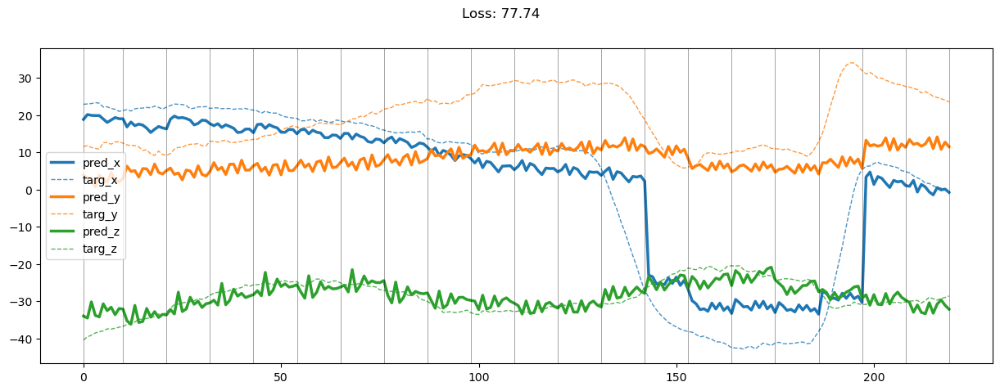

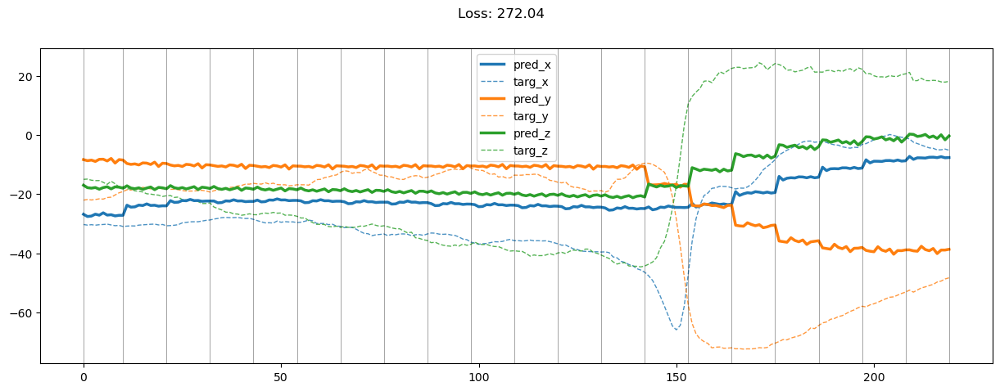

00099: train total loss:  30.672, pred loss:  30.672, valid total loss:  148.821, pred loss:  148.821


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


00100: train total loss:  30.272, pred loss:  30.272, valid total loss:  131.136, pred loss:  131.136


100%|██████████| 7/7 [00:00<00:00, 34.38it/s]


00101: train total loss:  29.061, pred loss:  29.061, valid total loss:  130.283, pred loss:  130.283


100%|██████████| 7/7 [00:00<00:00, 33.11it/s]


00102: train total loss:  28.486, pred loss:  28.486, valid total loss:  124.807, pred loss:  124.807


100%|██████████| 7/7 [00:00<00:00, 34.75it/s]


00103: train total loss:  28.332, pred loss:  28.332, valid total loss:  119.713, pred loss:  119.713


100%|██████████| 7/7 [00:00<00:00, 32.96it/s]


00104: train total loss:  27.439, pred loss:  27.439, valid total loss:  133.153, pred loss:  133.153


100%|██████████| 7/7 [00:00<00:00, 34.60it/s]


00105: train total loss:  26.652, pred loss:  26.652, valid total loss:  123.726, pred loss:  123.726


100%|██████████| 7/7 [00:00<00:00, 34.65it/s]


00106: train total loss:  26.935, pred loss:  26.935, valid total loss:  123.369, pred loss:  123.369


100%|██████████| 7/7 [00:00<00:00, 34.77it/s]


00107: train total loss:  26.300, pred loss:  26.300, valid total loss:  118.219, pred loss:  118.219


100%|██████████| 7/7 [00:00<00:00, 34.76it/s]


00108: train total loss:  26.037, pred loss:  26.037, valid total loss:  137.641, pred loss:  137.641


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


00109: train total loss:  26.171, pred loss:  26.171, valid total loss:  127.739, pred loss:  127.739


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


00110: train total loss:  25.364, pred loss:  25.364, valid total loss:  134.766, pred loss:  134.766


100%|██████████| 7/7 [00:00<00:00, 34.58it/s]


00111: train total loss:  24.620, pred loss:  24.620, valid total loss:  126.638, pred loss:  126.638


100%|██████████| 7/7 [00:00<00:00, 34.53it/s]


00112: train total loss:  24.726, pred loss:  24.726, valid total loss:  133.557, pred loss:  133.557


100%|██████████| 7/7 [00:00<00:00, 34.57it/s]


00113: train total loss:  23.810, pred loss:  23.810, valid total loss:  121.898, pred loss:  121.898


100%|██████████| 7/7 [00:00<00:00, 34.53it/s]


00114: train total loss:  24.458, pred loss:  24.458, valid total loss:  121.303, pred loss:  121.303


100%|██████████| 7/7 [00:00<00:00, 34.48it/s]


00115: train total loss:  23.905, pred loss:  23.905, valid total loss:  118.891, pred loss:  118.891


100%|██████████| 7/7 [00:00<00:00, 33.04it/s]


00116: train total loss:  23.599, pred loss:  23.599, valid total loss:  130.283, pred loss:  130.283


100%|██████████| 7/7 [00:00<00:00, 34.65it/s]


00117: train total loss:  23.509, pred loss:  23.509, valid total loss:  122.702, pred loss:  122.702


100%|██████████| 7/7 [00:00<00:00, 34.52it/s]


00118: train total loss:  23.045, pred loss:  23.045, valid total loss:  120.582, pred loss:  120.582


100%|██████████| 7/7 [00:00<00:00, 34.53it/s]


00119: train total loss:  22.406, pred loss:  22.406, valid total loss:  125.985, pred loss:  125.985


100%|██████████| 7/7 [00:00<00:00, 34.53it/s]


00120: train total loss:  22.281, pred loss:  22.281, valid total loss:  122.449, pred loss:  122.449


100%|██████████| 7/7 [00:00<00:00, 34.60it/s]


00121: train total loss:  21.651, pred loss:  21.651, valid total loss:  127.548, pred loss:  127.548


100%|██████████| 7/7 [00:00<00:00, 32.79it/s]


00122: train total loss:  21.422, pred loss:  21.422, valid total loss:  120.191, pred loss:  120.191


100%|██████████| 7/7 [00:00<00:00, 34.25it/s]


00123: train total loss:  21.710, pred loss:  21.710, valid total loss:  125.765, pred loss:  125.765


100%|██████████| 7/7 [00:00<00:00, 34.74it/s]


00124: train total loss:  21.071, pred loss:  21.071, valid total loss:  126.432, pred loss:  126.432


100%|██████████| 7/7 [00:00<00:00, 34.65it/s]


00125: train total loss:  21.045, pred loss:  21.045, valid total loss:  125.063, pred loss:  125.063


100%|██████████| 7/7 [00:00<00:00, 34.73it/s]


00126: train total loss:  20.845, pred loss:  20.845, valid total loss:  122.066, pred loss:  122.066


100%|██████████| 7/7 [00:00<00:00, 34.70it/s]


00127: train total loss:  20.490, pred loss:  20.490, valid total loss:  135.577, pred loss:  135.577


100%|██████████| 7/7 [00:00<00:00, 32.82it/s]


00128: train total loss:  20.919, pred loss:  20.919, valid total loss:  126.568, pred loss:  126.568


100%|██████████| 7/7 [00:00<00:00, 34.45it/s]


00129: train total loss:  20.544, pred loss:  20.544, valid total loss:  119.939, pred loss:  119.939


100%|██████████| 7/7 [00:00<00:00, 34.55it/s]


00130: train total loss:  20.505, pred loss:  20.505, valid total loss:  116.476, pred loss:  116.476


100%|██████████| 7/7 [00:00<00:00, 34.67it/s]


00131: train total loss:  20.775, pred loss:  20.775, valid total loss:  124.431, pred loss:  124.431


100%|██████████| 7/7 [00:00<00:00, 34.72it/s]


00132: train total loss:  19.904, pred loss:  19.904, valid total loss:  117.117, pred loss:  117.117


100%|██████████| 7/7 [00:00<00:00, 34.23it/s]


00133: train total loss:  19.770, pred loss:  19.770, valid total loss:  130.437, pred loss:  130.437


100%|██████████| 7/7 [00:00<00:00, 27.76it/s]


00134: train total loss:  19.465, pred loss:  19.465, valid total loss:  122.712, pred loss:  122.712


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


00135: train total loss:  19.708, pred loss:  19.708, valid total loss:  121.022, pred loss:  121.022


100%|██████████| 7/7 [00:00<00:00, 29.82it/s]


00136: train total loss:  20.098, pred loss:  20.098, valid total loss:  126.382, pred loss:  126.382


100%|██████████| 7/7 [00:00<00:00, 29.83it/s]


00137: train total loss:  19.456, pred loss:  19.456, valid total loss:  115.692, pred loss:  115.692


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


00138: train total loss:  18.907, pred loss:  18.907, valid total loss:  119.321, pred loss:  119.321


100%|██████████| 7/7 [00:00<00:00, 29.02it/s]


00139: train total loss:  18.658, pred loss:  18.658, valid total loss:  122.283, pred loss:  122.283


100%|██████████| 7/7 [00:00<00:00, 29.30it/s]


00140: train total loss:  18.978, pred loss:  18.978, valid total loss:  118.688, pred loss:  118.688


100%|██████████| 7/7 [00:00<00:00, 30.50it/s]


00141: train total loss:  19.209, pred loss:  19.209, valid total loss:  130.168, pred loss:  130.168


100%|██████████| 7/7 [00:00<00:00, 31.18it/s]


00142: train total loss:  18.474, pred loss:  18.474, valid total loss:  115.821, pred loss:  115.821


100%|██████████| 7/7 [00:00<00:00, 34.38it/s]


00143: train total loss:  18.583, pred loss:  18.583, valid total loss:  122.287, pred loss:  122.287


100%|██████████| 7/7 [00:00<00:00, 34.49it/s]


00144: train total loss:  18.415, pred loss:  18.415, valid total loss:  113.523, pred loss:  113.523


100%|██████████| 7/7 [00:00<00:00, 29.52it/s]


00145: train total loss:  17.392, pred loss:  17.392, valid total loss:  120.643, pred loss:  120.643


100%|██████████| 7/7 [00:00<00:00, 30.66it/s]


00146: train total loss:  17.761, pred loss:  17.761, valid total loss:  131.467, pred loss:  131.467


100%|██████████| 7/7 [00:00<00:00, 26.65it/s]


00147: train total loss:  18.431, pred loss:  18.431, valid total loss:  118.653, pred loss:  118.653


100%|██████████| 7/7 [00:00<00:00, 26.59it/s]


00148: train total loss:  17.373, pred loss:  17.373, valid total loss:  117.094, pred loss:  117.094


100%|██████████| 7/7 [00:00<00:00, 30.61it/s]


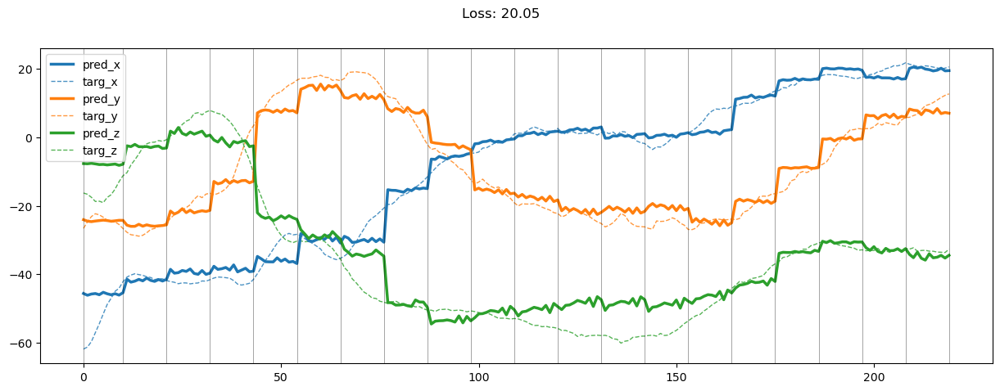

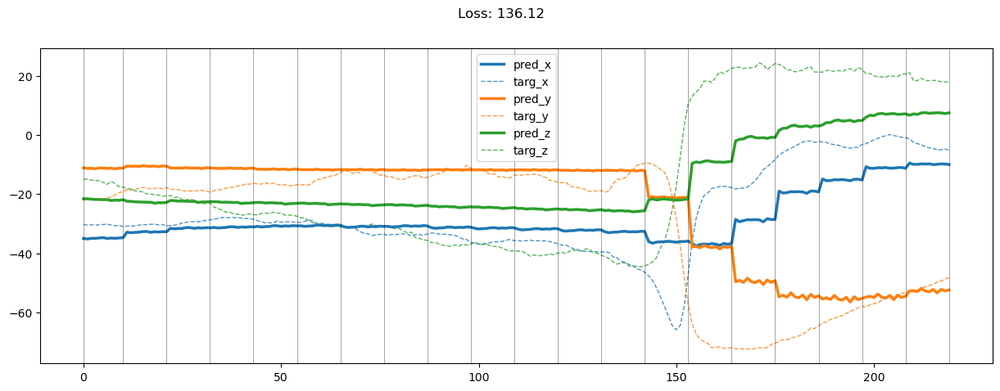

00149: train total loss:  17.913, pred loss:  17.913, valid total loss:  118.093, pred loss:  118.093


100%|██████████| 7/7 [00:00<00:00, 29.16it/s]


00150: train total loss:  17.157, pred loss:  17.157, valid total loss:  119.347, pred loss:  119.347


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


00151: train total loss:  17.135, pred loss:  17.135, valid total loss:  116.622, pred loss:  116.622


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


00152: train total loss:  17.248, pred loss:  17.248, valid total loss:  116.761, pred loss:  116.761


100%|██████████| 7/7 [00:00<00:00, 29.91it/s]


00153: train total loss:  16.189, pred loss:  16.189, valid total loss:  117.737, pred loss:  117.737


100%|██████████| 7/7 [00:00<00:00, 26.84it/s]


00154: train total loss:  16.176, pred loss:  16.176, valid total loss:  109.684, pred loss:  109.684


100%|██████████| 7/7 [00:00<00:00, 27.58it/s]


00155: train total loss:  16.699, pred loss:  16.699, valid total loss:  115.654, pred loss:  115.654


100%|██████████| 7/7 [00:00<00:00, 28.42it/s]


00156: train total loss:  16.186, pred loss:  16.186, valid total loss:  121.146, pred loss:  121.146


100%|██████████| 7/7 [00:00<00:00, 26.94it/s]


00157: train total loss:  16.353, pred loss:  16.353, valid total loss:  118.794, pred loss:  118.794


100%|██████████| 7/7 [00:00<00:00, 26.32it/s]


00158: train total loss:  17.094, pred loss:  17.094, valid total loss:  109.623, pred loss:  109.623


100%|██████████| 7/7 [00:00<00:00, 28.79it/s]


00159: train total loss:  16.444, pred loss:  16.444, valid total loss:  119.607, pred loss:  119.607


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


00160: train total loss:  16.750, pred loss:  16.750, valid total loss:  115.821, pred loss:  115.821


100%|██████████| 7/7 [00:00<00:00, 30.20it/s]


00161: train total loss:  15.930, pred loss:  15.930, valid total loss:  116.325, pred loss:  116.325


100%|██████████| 7/7 [00:00<00:00, 30.65it/s]


00162: train total loss:  16.398, pred loss:  16.398, valid total loss:  116.187, pred loss:  116.187


100%|██████████| 7/7 [00:00<00:00, 34.33it/s]


00163: train total loss:  15.460, pred loss:  15.460, valid total loss:  111.800, pred loss:  111.800


100%|██████████| 7/7 [00:00<00:00, 34.36it/s]


00164: train total loss:  15.523, pred loss:  15.523, valid total loss:  115.513, pred loss:  115.513


100%|██████████| 7/7 [00:00<00:00, 31.89it/s]


00165: train total loss:  16.177, pred loss:  16.177, valid total loss:  116.773, pred loss:  116.773


100%|██████████| 7/7 [00:00<00:00, 34.18it/s]


00166: train total loss:  15.394, pred loss:  15.394, valid total loss:  109.451, pred loss:  109.451


100%|██████████| 7/7 [00:00<00:00, 30.73it/s]


00167: train total loss:  15.186, pred loss:  15.186, valid total loss:  117.521, pred loss:  117.521


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


00168: train total loss:  14.706, pred loss:  14.706, valid total loss:  117.169, pred loss:  117.169


100%|██████████| 7/7 [00:00<00:00, 29.48it/s]


00169: train total loss:  14.790, pred loss:  14.790, valid total loss:  111.124, pred loss:  111.124


100%|██████████| 7/7 [00:00<00:00, 25.97it/s]


00170: train total loss:  15.355, pred loss:  15.355, valid total loss:  117.758, pred loss:  117.758


100%|██████████| 7/7 [00:00<00:00, 27.19it/s]


00171: train total loss:  15.267, pred loss:  15.267, valid total loss:  118.387, pred loss:  118.387


100%|██████████| 7/7 [00:00<00:00, 34.33it/s]


00172: train total loss:  14.905, pred loss:  14.905, valid total loss:  118.536, pred loss:  118.536


100%|██████████| 7/7 [00:00<00:00, 30.56it/s]


00173: train total loss:  15.106, pred loss:  15.106, valid total loss:  111.646, pred loss:  111.646


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


00174: train total loss:  14.901, pred loss:  14.901, valid total loss:  114.191, pred loss:  114.191


100%|██████████| 7/7 [00:00<00:00, 29.66it/s]


00175: train total loss:  14.533, pred loss:  14.533, valid total loss:  112.520, pred loss:  112.520


100%|██████████| 7/7 [00:00<00:00, 28.58it/s]


00176: train total loss:  15.128, pred loss:  15.128, valid total loss:  112.655, pred loss:  112.655


100%|██████████| 7/7 [00:00<00:00, 26.44it/s]


00177: train total loss:  15.133, pred loss:  15.133, valid total loss:  108.423, pred loss:  108.423


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


00178: train total loss:  14.695, pred loss:  14.695, valid total loss:  114.546, pred loss:  114.546


100%|██████████| 7/7 [00:00<00:00, 29.03it/s]


00179: train total loss:  14.561, pred loss:  14.561, valid total loss:  106.223, pred loss:  106.223


100%|██████████| 7/7 [00:00<00:00, 26.05it/s]


00180: train total loss:  14.826, pred loss:  14.826, valid total loss:  106.541, pred loss:  106.541


100%|██████████| 7/7 [00:00<00:00, 34.44it/s]


00181: train total loss:  14.646, pred loss:  14.646, valid total loss:  105.987, pred loss:  105.987


100%|██████████| 7/7 [00:00<00:00, 29.63it/s]


00182: train total loss:  14.394, pred loss:  14.394, valid total loss:  113.894, pred loss:  113.894


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00183: train total loss:  13.854, pred loss:  13.854, valid total loss:  108.228, pred loss:  108.228


100%|██████████| 7/7 [00:00<00:00, 34.45it/s]


00184: train total loss:  14.243, pred loss:  14.243, valid total loss:  111.127, pred loss:  111.127


100%|██████████| 7/7 [00:00<00:00, 34.50it/s]


00185: train total loss:  13.926, pred loss:  13.926, valid total loss:  110.019, pred loss:  110.019


100%|██████████| 7/7 [00:00<00:00, 34.27it/s]


00186: train total loss:  14.384, pred loss:  14.384, valid total loss:  103.775, pred loss:  103.775


100%|██████████| 7/7 [00:00<00:00, 33.97it/s]


00187: train total loss:  13.849, pred loss:  13.849, valid total loss:  104.530, pred loss:  104.530


100%|██████████| 7/7 [00:00<00:00, 34.44it/s]


00188: train total loss:  13.855, pred loss:  13.855, valid total loss:  103.956, pred loss:  103.956


100%|██████████| 7/7 [00:00<00:00, 25.12it/s]


00189: train total loss:  13.986, pred loss:  13.986, valid total loss:  107.902, pred loss:  107.902


100%|██████████| 7/7 [00:00<00:00, 30.35it/s]


00190: train total loss:  13.460, pred loss:  13.460, valid total loss:  108.873, pred loss:  108.873


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


00191: train total loss:  13.848, pred loss:  13.848, valid total loss:  105.622, pred loss:  105.622


100%|██████████| 7/7 [00:00<00:00, 29.80it/s]


00192: train total loss:  13.253, pred loss:  13.253, valid total loss:  109.623, pred loss:  109.623


100%|██████████| 7/7 [00:00<00:00, 27.81it/s]


00193: train total loss:  13.554, pred loss:  13.554, valid total loss:  112.014, pred loss:  112.014


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


00194: train total loss:  13.591, pred loss:  13.591, valid total loss:  107.359, pred loss:  107.359


100%|██████████| 7/7 [00:00<00:00, 24.00it/s]


00195: train total loss:  13.443, pred loss:  13.443, valid total loss:  110.910, pred loss:  110.910


100%|██████████| 7/7 [00:00<00:00, 33.84it/s]


00196: train total loss:  13.039, pred loss:  13.039, valid total loss:  113.149, pred loss:  113.149


100%|██████████| 7/7 [00:00<00:00, 34.28it/s]


00197: train total loss:  13.318, pred loss:  13.318, valid total loss:  113.484, pred loss:  113.484


100%|██████████| 7/7 [00:00<00:00, 33.56it/s]


00198: train total loss:  13.052, pred loss:  13.052, valid total loss:  105.865, pred loss:  105.865


100%|██████████| 7/7 [00:00<00:00, 33.86it/s]


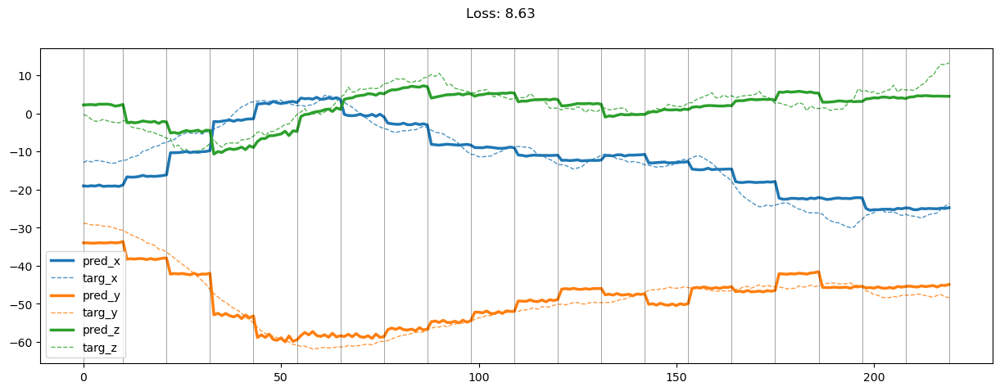

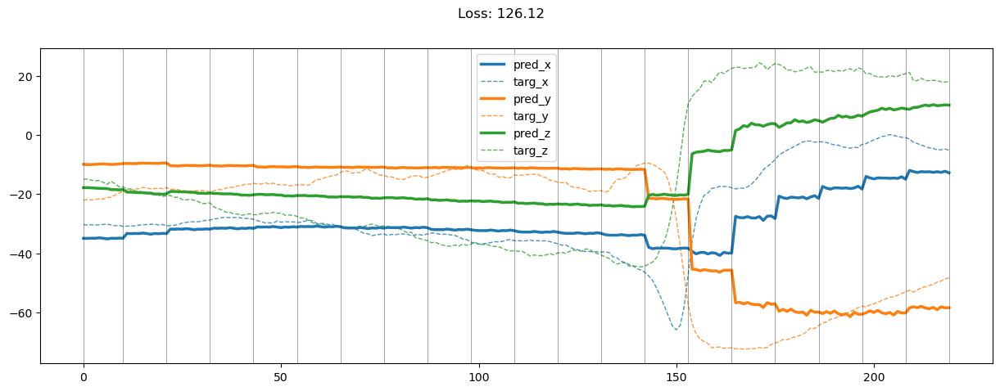

00199: train total loss:  13.249, pred loss:  13.249, valid total loss:  105.611, pred loss:  105.611


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


00200: train total loss:  13.224, pred loss:  13.224, valid total loss:  108.843, pred loss:  108.843


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


00201: train total loss:  13.203, pred loss:  13.203, valid total loss:  111.266, pred loss:  111.266


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


00202: train total loss:  13.471, pred loss:  13.471, valid total loss:  111.263, pred loss:  111.263


100%|██████████| 7/7 [00:00<00:00, 32.84it/s]


00203: train total loss:  12.743, pred loss:  12.743, valid total loss:  107.556, pred loss:  107.556


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


00204: train total loss:  13.104, pred loss:  13.104, valid total loss:  100.786, pred loss:  100.786


100%|██████████| 7/7 [00:00<00:00, 33.84it/s]


00205: train total loss:  12.689, pred loss:  12.689, valid total loss:  101.936, pred loss:  101.936


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


00206: train total loss:  12.866, pred loss:  12.866, valid total loss:  106.168, pred loss:  106.168


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


00207: train total loss:  12.508, pred loss:  12.508, valid total loss:  110.042, pred loss:  110.042


100%|██████████| 7/7 [00:00<00:00, 34.14it/s]


00208: train total loss:  12.415, pred loss:  12.415, valid total loss:  108.269, pred loss:  108.269


100%|██████████| 7/7 [00:00<00:00, 34.24it/s]


00209: train total loss:  12.080, pred loss:  12.080, valid total loss:  108.034, pred loss:  108.034


100%|██████████| 7/7 [00:00<00:00, 34.29it/s]


00210: train total loss:  12.214, pred loss:  12.214, valid total loss:  111.318, pred loss:  111.318


100%|██████████| 7/7 [00:00<00:00, 28.76it/s]


00211: train total loss:  12.047, pred loss:  12.047, valid total loss:  112.191, pred loss:  112.191


100%|██████████| 7/7 [00:00<00:00, 23.19it/s]


00212: train total loss:  12.040, pred loss:  12.040, valid total loss:  105.935, pred loss:  105.935


100%|██████████| 7/7 [00:00<00:00, 23.29it/s]


00213: train total loss:  12.042, pred loss:  12.042, valid total loss:  104.676, pred loss:  104.676


100%|██████████| 7/7 [00:00<00:00, 29.41it/s]


00214: train total loss:  12.295, pred loss:  12.295, valid total loss:  103.769, pred loss:  103.769


100%|██████████| 7/7 [00:00<00:00, 23.68it/s]


00215: train total loss:  11.909, pred loss:  11.909, valid total loss:  109.376, pred loss:  109.376


100%|██████████| 7/7 [00:00<00:00, 24.28it/s]


00216: train total loss:  12.260, pred loss:  12.260, valid total loss:  108.869, pred loss:  108.869


100%|██████████| 7/7 [00:00<00:00, 29.36it/s]


00217: train total loss:  12.486, pred loss:  12.486, valid total loss:  107.077, pred loss:  107.077


100%|██████████| 7/7 [00:00<00:00, 25.69it/s]


00218: train total loss:  12.393, pred loss:  12.393, valid total loss:  104.477, pred loss:  104.477


100%|██████████| 7/7 [00:00<00:00, 34.14it/s]


00219: train total loss:  12.188, pred loss:  12.188, valid total loss:  107.117, pred loss:  107.117


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


00220: train total loss:  12.504, pred loss:  12.504, valid total loss:  102.743, pred loss:  102.743


100%|██████████| 7/7 [00:00<00:00, 34.24it/s]


00221: train total loss:  12.574, pred loss:  12.574, valid total loss:  106.034, pred loss:  106.034


100%|██████████| 7/7 [00:00<00:00, 34.17it/s]


00222: train total loss:  11.912, pred loss:  11.912, valid total loss:  110.214, pred loss:  110.214


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


00223: train total loss:  12.127, pred loss:  12.127, valid total loss:  104.013, pred loss:  104.013


100%|██████████| 7/7 [00:00<00:00, 32.78it/s]


00224: train total loss:  11.830, pred loss:  11.830, valid total loss:  104.696, pred loss:  104.696


100%|██████████| 7/7 [00:00<00:00, 30.50it/s]


00225: train total loss:  12.151, pred loss:  12.151, valid total loss:  104.082, pred loss:  104.082


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


00226: train total loss:  11.474, pred loss:  11.474, valid total loss:  106.461, pred loss:  106.461


100%|██████████| 7/7 [00:00<00:00, 29.08it/s]


00227: train total loss:  11.640, pred loss:  11.640, valid total loss:  113.545, pred loss:  113.545


100%|██████████| 7/7 [00:00<00:00, 30.49it/s]


00228: train total loss:  11.862, pred loss:  11.862, valid total loss:  111.757, pred loss:  111.757


100%|██████████| 7/7 [00:00<00:00, 24.27it/s]


00229: train total loss:  11.844, pred loss:  11.844, valid total loss:  107.721, pred loss:  107.721


100%|██████████| 7/7 [00:00<00:00, 30.38it/s]


00230: train total loss:  12.334, pred loss:  12.334, valid total loss:  111.019, pred loss:  111.019


100%|██████████| 7/7 [00:00<00:00, 24.63it/s]


00231: train total loss:  12.300, pred loss:  12.300, valid total loss:  107.641, pred loss:  107.641


100%|██████████| 7/7 [00:00<00:00, 34.54it/s]


00232: train total loss:  11.719, pred loss:  11.719, valid total loss:  109.343, pred loss:  109.343


100%|██████████| 7/7 [00:00<00:00, 34.51it/s]


00233: train total loss:  11.473, pred loss:  11.473, valid total loss:  112.282, pred loss:  112.282


100%|██████████| 7/7 [00:00<00:00, 34.58it/s]


00234: train total loss:  11.746, pred loss:  11.746, valid total loss:  102.532, pred loss:  102.532


100%|██████████| 7/7 [00:00<00:00, 32.12it/s]


00235: train total loss:  11.483, pred loss:  11.483, valid total loss:  111.642, pred loss:  111.642


100%|██████████| 7/7 [00:00<00:00, 34.50it/s]


00236: train total loss:  11.568, pred loss:  11.568, valid total loss:  115.045, pred loss:  115.045


100%|██████████| 7/7 [00:00<00:00, 34.31it/s]


00237: train total loss:  11.958, pred loss:  11.958, valid total loss:  110.469, pred loss:  110.469


100%|██████████| 7/7 [00:00<00:00, 34.48it/s]


00238: train total loss:  11.499, pred loss:  11.499, valid total loss:  108.970, pred loss:  108.970


100%|██████████| 7/7 [00:00<00:00, 34.43it/s]


00239: train total loss:  11.306, pred loss:  11.306, valid total loss:  113.706, pred loss:  113.706


100%|██████████| 7/7 [00:00<00:00, 34.47it/s]


00240: train total loss:  11.460, pred loss:  11.460, valid total loss:  106.320, pred loss:  106.320


100%|██████████| 7/7 [00:00<00:00, 32.41it/s]


00241: train total loss:  11.273, pred loss:  11.273, valid total loss:  98.445, pred loss:  98.445


100%|██████████| 7/7 [00:00<00:00, 34.34it/s]


00242: train total loss:  11.437, pred loss:  11.437, valid total loss:  105.765, pred loss:  105.765


100%|██████████| 7/7 [00:00<00:00, 34.47it/s]


00243: train total loss:  11.336, pred loss:  11.336, valid total loss:  107.218, pred loss:  107.218


100%|██████████| 7/7 [00:00<00:00, 34.42it/s]


00244: train total loss:  11.466, pred loss:  11.466, valid total loss:  105.862, pred loss:  105.862


100%|██████████| 7/7 [00:00<00:00, 34.51it/s]


00245: train total loss:  11.150, pred loss:  11.150, valid total loss:  109.235, pred loss:  109.235


100%|██████████| 7/7 [00:00<00:00, 34.51it/s]


00246: train total loss:  11.012, pred loss:  11.012, valid total loss:  106.003, pred loss:  106.003


100%|██████████| 7/7 [00:00<00:00, 32.72it/s]


00247: train total loss:  10.910, pred loss:  10.910, valid total loss:  104.407, pred loss:  104.407


100%|██████████| 7/7 [00:00<00:00, 34.43it/s]


00248: train total loss:  11.051, pred loss:  11.051, valid total loss:  104.144, pred loss:  104.144


100%|██████████| 7/7 [00:00<00:00, 34.42it/s]


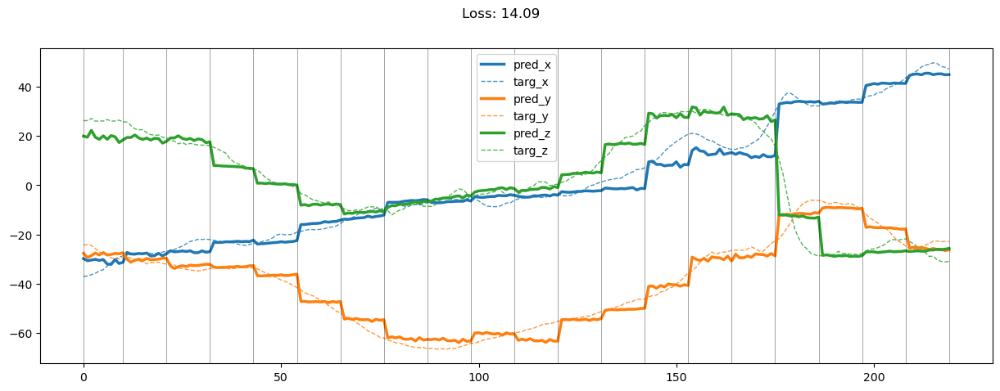

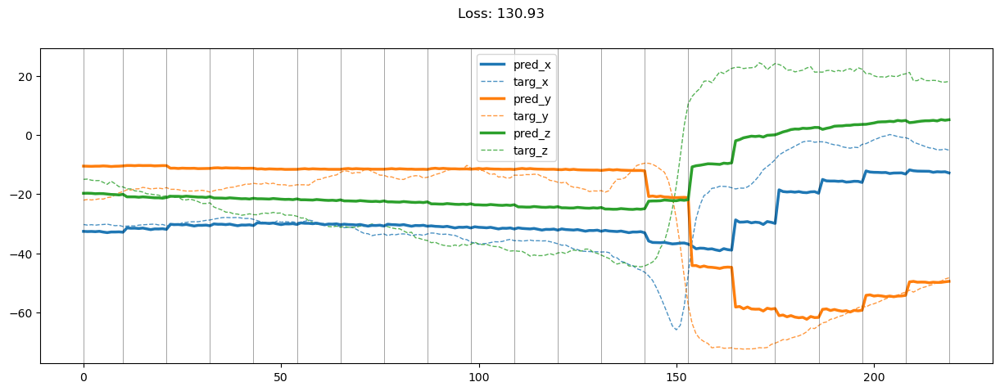

00249: train total loss:  11.036, pred loss:  11.036, valid total loss:  103.631, pred loss:  103.631


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


00250: train total loss:  11.031, pred loss:  11.031, valid total loss:  101.607, pred loss:  101.607


100%|██████████| 7/7 [00:00<00:00, 34.15it/s]


00251: train total loss:  10.892, pred loss:  10.892, valid total loss:  102.183, pred loss:  102.183


100%|██████████| 7/7 [00:00<00:00, 33.73it/s]


00252: train total loss:  10.522, pred loss:  10.522, valid total loss:  102.925, pred loss:  102.925


100%|██████████| 7/7 [00:00<00:00, 34.27it/s]


00253: train total loss:  10.532, pred loss:  10.532, valid total loss:  100.034, pred loss:  100.034


100%|██████████| 7/7 [00:00<00:00, 34.11it/s]


00254: train total loss:  10.775, pred loss:  10.775, valid total loss:  110.133, pred loss:  110.133


100%|██████████| 7/7 [00:00<00:00, 34.10it/s]


00255: train total loss:  10.516, pred loss:  10.516, valid total loss:  104.114, pred loss:  104.114


100%|██████████| 7/7 [00:00<00:00, 34.34it/s]


00256: train total loss:  10.626, pred loss:  10.626, valid total loss:  101.480, pred loss:  101.480


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


00257: train total loss:  10.515, pred loss:  10.515, valid total loss:  106.569, pred loss:  106.569


100%|██████████| 7/7 [00:00<00:00, 33.89it/s]


00258: train total loss:  10.462, pred loss:  10.462, valid total loss:  99.621, pred loss:  99.621


100%|██████████| 7/7 [00:00<00:00, 34.12it/s]


00259: train total loss:  10.725, pred loss:  10.725, valid total loss:  100.499, pred loss:  100.499


100%|██████████| 7/7 [00:00<00:00, 34.34it/s]


00260: train total loss:  10.582, pred loss:  10.582, valid total loss:  109.846, pred loss:  109.846


100%|██████████| 7/7 [00:00<00:00, 34.21it/s]


00261: train total loss:  10.615, pred loss:  10.615, valid total loss:  102.928, pred loss:  102.928


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


00262: train total loss:  10.667, pred loss:  10.667, valid total loss:  104.046, pred loss:  104.046


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


00263: train total loss:  10.589, pred loss:  10.589, valid total loss:  103.652, pred loss:  103.652


100%|██████████| 7/7 [00:00<00:00, 22.23it/s]


00264: train total loss:  10.571, pred loss:  10.571, valid total loss:  103.594, pred loss:  103.594


100%|██████████| 7/7 [00:00<00:00, 34.31it/s]


00265: train total loss:  10.527, pred loss:  10.527, valid total loss:  93.128, pred loss:  93.128


100%|██████████| 7/7 [00:00<00:00, 34.44it/s]


00266: train total loss:  10.491, pred loss:  10.491, valid total loss:  100.343, pred loss:  100.343


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


00267: train total loss:  10.697, pred loss:  10.697, valid total loss:  101.103, pred loss:  101.103


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


00268: train total loss:  10.718, pred loss:  10.718, valid total loss:  99.334, pred loss:  99.334


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


00269: train total loss:  11.483, pred loss:  11.483, valid total loss:  97.314, pred loss:  97.314


100%|██████████| 7/7 [00:00<00:00, 33.99it/s]


00270: train total loss:  11.333, pred loss:  11.333, valid total loss:  105.291, pred loss:  105.291


100%|██████████| 7/7 [00:00<00:00, 33.53it/s]


00271: train total loss:  11.150, pred loss:  11.150, valid total loss:  102.899, pred loss:  102.899


100%|██████████| 7/7 [00:00<00:00, 33.93it/s]


00272: train total loss:  11.022, pred loss:  11.022, valid total loss:  104.030, pred loss:  104.030


100%|██████████| 7/7 [00:00<00:00, 33.86it/s]


00273: train total loss:  10.801, pred loss:  10.801, valid total loss:  100.300, pred loss:  100.300


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


00274: train total loss:  10.562, pred loss:  10.562, valid total loss:  101.425, pred loss:  101.425


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


00275: train total loss:  10.264, pred loss:  10.264, valid total loss:  104.647, pred loss:  104.647


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


00276: train total loss:  10.491, pred loss:  10.491, valid total loss:  103.380, pred loss:  103.380


100%|██████████| 7/7 [00:00<00:00, 33.33it/s]


00277: train total loss:  10.213, pred loss:  10.213, valid total loss:  97.767, pred loss:  97.767


100%|██████████| 7/7 [00:00<00:00, 33.99it/s]


00278: train total loss:  10.286, pred loss:  10.286, valid total loss:  93.320, pred loss:  93.320


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


00279: train total loss:  10.297, pred loss:  10.297, valid total loss:  95.403, pred loss:  95.403


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


00280: train total loss:  10.689, pred loss:  10.689, valid total loss:  93.827, pred loss:  93.827


100%|██████████| 7/7 [00:00<00:00, 32.08it/s]


00281: train total loss:  10.691, pred loss:  10.691, valid total loss:  92.474, pred loss:  92.474


100%|██████████| 7/7 [00:00<00:00, 33.31it/s]


00282: train total loss:  10.039, pred loss:  10.039, valid total loss:  104.601, pred loss:  104.601


100%|██████████| 7/7 [00:00<00:00, 28.71it/s]


00283: train total loss:  10.049, pred loss:  10.049, valid total loss:  100.670, pred loss:  100.670


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


00284: train total loss:  9.957, pred loss:  9.957, valid total loss:  93.421, pred loss:  93.421


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


00285: train total loss:  9.849, pred loss:  9.849, valid total loss:  97.058, pred loss:  97.058


100%|██████████| 7/7 [00:00<00:00, 29.59it/s]


00286: train total loss:  9.912, pred loss:  9.912, valid total loss:  95.106, pred loss:  95.106


100%|██████████| 7/7 [00:00<00:00, 30.19it/s]


00287: train total loss:  10.135, pred loss:  10.135, valid total loss:  98.960, pred loss:  98.960


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


00288: train total loss:  9.608, pred loss:  9.608, valid total loss:  104.221, pred loss:  104.221


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


00289: train total loss:  9.861, pred loss:  9.861, valid total loss:  99.348, pred loss:  99.348


100%|██████████| 7/7 [00:00<00:00, 29.87it/s]


00290: train total loss:  9.574, pred loss:  9.574, valid total loss:  99.667, pred loss:  99.667


100%|██████████| 7/7 [00:00<00:00, 29.87it/s]


00291: train total loss:  9.874, pred loss:  9.874, valid total loss:  98.944, pred loss:  98.944


100%|██████████| 7/7 [00:00<00:00, 28.87it/s]


00292: train total loss:  10.189, pred loss:  10.189, valid total loss:  98.608, pred loss:  98.608


100%|██████████| 7/7 [00:00<00:00, 30.74it/s]


00293: train total loss:  9.775, pred loss:  9.775, valid total loss:  99.265, pred loss:  99.265


100%|██████████| 7/7 [00:00<00:00, 29.71it/s]


00294: train total loss:  9.780, pred loss:  9.780, valid total loss:  97.608, pred loss:  97.608


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


00295: train total loss:  9.763, pred loss:  9.763, valid total loss:  105.216, pred loss:  105.216


100%|██████████| 7/7 [00:00<00:00, 30.57it/s]


00296: train total loss:  9.641, pred loss:  9.641, valid total loss:  97.928, pred loss:  97.928


100%|██████████| 7/7 [00:00<00:00, 30.41it/s]


00297: train total loss:  9.876, pred loss:  9.876, valid total loss:  93.133, pred loss:  93.133


100%|██████████| 7/7 [00:00<00:00, 25.28it/s]


00298: train total loss:  9.694, pred loss:  9.694, valid total loss:  96.181, pred loss:  96.181


100%|██████████| 7/7 [00:00<00:00, 30.53it/s]


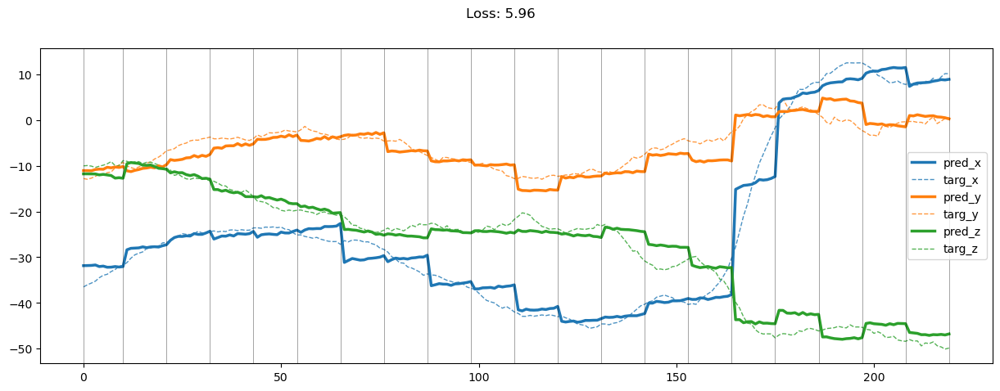

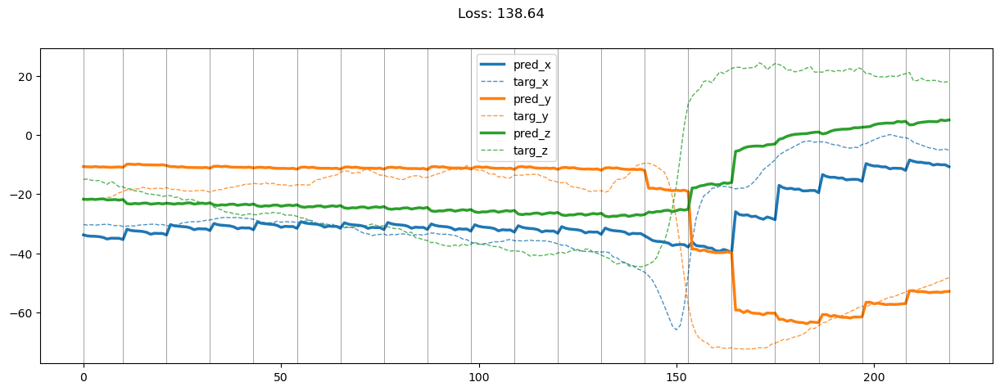

00299: train total loss:  9.751, pred loss:  9.751, valid total loss:  103.344, pred loss:  103.344


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


00300: train total loss:  9.416, pred loss:  9.416, valid total loss:  96.315, pred loss:  96.315


100%|██████████| 7/7 [00:00<00:00, 30.29it/s]


00301: train total loss:  9.398, pred loss:  9.398, valid total loss:  100.403, pred loss:  100.403


100%|██████████| 7/7 [00:00<00:00, 29.17it/s]


00302: train total loss:  9.587, pred loss:  9.587, valid total loss:  95.462, pred loss:  95.462


100%|██████████| 7/7 [00:00<00:00, 29.45it/s]


00303: train total loss:  9.330, pred loss:  9.330, valid total loss:  93.471, pred loss:  93.471


100%|██████████| 7/7 [00:00<00:00, 28.47it/s]


00304: train total loss:  9.678, pred loss:  9.678, valid total loss:  98.108, pred loss:  98.108


100%|██████████| 7/7 [00:00<00:00, 33.91it/s]


00305: train total loss:  9.606, pred loss:  9.606, valid total loss:  95.012, pred loss:  95.012


100%|██████████| 7/7 [00:00<00:00, 33.78it/s]


00306: train total loss:  9.595, pred loss:  9.595, valid total loss:  104.846, pred loss:  104.846


100%|██████████| 7/7 [00:00<00:00, 33.35it/s]


00307: train total loss:  9.771, pred loss:  9.771, valid total loss:  100.559, pred loss:  100.559


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


00308: train total loss:  9.505, pred loss:  9.505, valid total loss:  91.935, pred loss:  91.935


100%|██████████| 7/7 [00:00<00:00, 31.12it/s]


00309: train total loss:  9.385, pred loss:  9.385, valid total loss:  100.011, pred loss:  100.011


100%|██████████| 7/7 [00:00<00:00, 23.79it/s]


00310: train total loss:  9.406, pred loss:  9.406, valid total loss:  96.583, pred loss:  96.583


100%|██████████| 7/7 [00:00<00:00, 29.25it/s]


00311: train total loss:  9.438, pred loss:  9.438, valid total loss:  100.729, pred loss:  100.729


100%|██████████| 7/7 [00:00<00:00, 28.12it/s]


00312: train total loss:  9.737, pred loss:  9.737, valid total loss:  99.580, pred loss:  99.580


100%|██████████| 7/7 [00:00<00:00, 28.84it/s]


00313: train total loss:  9.495, pred loss:  9.495, valid total loss:  90.624, pred loss:  90.624


100%|██████████| 7/7 [00:00<00:00, 30.26it/s]


00314: train total loss:  9.420, pred loss:  9.420, valid total loss:  100.064, pred loss:  100.064


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


00315: train total loss:  9.671, pred loss:  9.671, valid total loss:  96.341, pred loss:  96.341


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00316: train total loss:  9.585, pred loss:  9.585, valid total loss:  92.776, pred loss:  92.776


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


00317: train total loss:  9.469, pred loss:  9.469, valid total loss:  102.089, pred loss:  102.089


100%|██████████| 7/7 [00:00<00:00, 29.70it/s]


00318: train total loss:  9.428, pred loss:  9.428, valid total loss:  95.191, pred loss:  95.191


100%|██████████| 7/7 [00:00<00:00, 29.51it/s]


00319: train total loss:  8.996, pred loss:  8.996, valid total loss:  103.167, pred loss:  103.167


100%|██████████| 7/7 [00:00<00:00, 30.26it/s]


00320: train total loss:  9.084, pred loss:  9.084, valid total loss:  106.130, pred loss:  106.130


100%|██████████| 7/7 [00:00<00:00, 25.89it/s]


00321: train total loss:  9.159, pred loss:  9.159, valid total loss:  93.532, pred loss:  93.532


100%|██████████| 7/7 [00:00<00:00, 29.34it/s]


00322: train total loss:  9.297, pred loss:  9.297, valid total loss:  98.804, pred loss:  98.804


100%|██████████| 7/7 [00:00<00:00, 29.09it/s]


00323: train total loss:  9.627, pred loss:  9.627, valid total loss:  97.432, pred loss:  97.432


100%|██████████| 7/7 [00:00<00:00, 26.38it/s]


00324: train total loss:  9.243, pred loss:  9.243, valid total loss:  91.638, pred loss:  91.638


100%|██████████| 7/7 [00:00<00:00, 30.50it/s]


00325: train total loss:  9.272, pred loss:  9.272, valid total loss:  94.951, pred loss:  94.951


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


00326: train total loss:  9.021, pred loss:  9.021, valid total loss:  95.729, pred loss:  95.729


100%|██████████| 7/7 [00:00<00:00, 30.15it/s]


00327: train total loss:  8.905, pred loss:  8.905, valid total loss:  96.282, pred loss:  96.282


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


00328: train total loss:  8.859, pred loss:  8.859, valid total loss:  97.352, pred loss:  97.352


100%|██████████| 7/7 [00:00<00:00, 28.72it/s]


00329: train total loss:  8.922, pred loss:  8.922, valid total loss:  97.923, pred loss:  97.923


100%|██████████| 7/7 [00:00<00:00, 30.22it/s]


00330: train total loss:  8.801, pred loss:  8.801, valid total loss:  97.183, pred loss:  97.183


100%|██████████| 7/7 [00:00<00:00, 29.50it/s]


00331: train total loss:  8.787, pred loss:  8.787, valid total loss:  97.789, pred loss:  97.789


100%|██████████| 7/7 [00:00<00:00, 28.32it/s]


00332: train total loss:  8.802, pred loss:  8.802, valid total loss:  97.242, pred loss:  97.242


100%|██████████| 7/7 [00:00<00:00, 33.44it/s]


00333: train total loss:  9.003, pred loss:  9.003, valid total loss:  96.916, pred loss:  96.916


100%|██████████| 7/7 [00:00<00:00, 33.01it/s]


00334: train total loss:  8.963, pred loss:  8.963, valid total loss:  105.417, pred loss:  105.417


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


00335: train total loss:  9.239, pred loss:  9.239, valid total loss:  97.923, pred loss:  97.923


100%|██████████| 7/7 [00:00<00:00, 33.43it/s]


00336: train total loss:  9.153, pred loss:  9.153, valid total loss:  104.605, pred loss:  104.605


100%|██████████| 7/7 [00:00<00:00, 33.40it/s]


00337: train total loss:  8.941, pred loss:  8.941, valid total loss:  98.553, pred loss:  98.553


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


00338: train total loss:  8.919, pred loss:  8.919, valid total loss:  92.625, pred loss:  92.625


100%|██████████| 7/7 [00:00<00:00, 32.88it/s]


00339: train total loss:  8.877, pred loss:  8.877, valid total loss:  92.340, pred loss:  92.340


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


00340: train total loss:  8.741, pred loss:  8.741, valid total loss:  94.460, pred loss:  94.460


100%|██████████| 7/7 [00:00<00:00, 33.18it/s]


00341: train total loss:  8.866, pred loss:  8.866, valid total loss:  96.091, pred loss:  96.091


100%|██████████| 7/7 [00:00<00:00, 33.02it/s]


00342: train total loss:  8.571, pred loss:  8.571, valid total loss:  97.479, pred loss:  97.479


100%|██████████| 7/7 [00:00<00:00, 33.80it/s]


00343: train total loss:  8.854, pred loss:  8.854, valid total loss:  93.431, pred loss:  93.431


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


00344: train total loss:  8.632, pred loss:  8.632, valid total loss:  94.262, pred loss:  94.262


100%|██████████| 7/7 [00:00<00:00, 32.99it/s]


00345: train total loss:  8.596, pred loss:  8.596, valid total loss:  96.106, pred loss:  96.106


100%|██████████| 7/7 [00:00<00:00, 32.88it/s]


00346: train total loss:  8.634, pred loss:  8.634, valid total loss:  94.095, pred loss:  94.095


100%|██████████| 7/7 [00:00<00:00, 32.91it/s]


00347: train total loss:  8.647, pred loss:  8.647, valid total loss:  94.620, pred loss:  94.620


100%|██████████| 7/7 [00:00<00:00, 33.28it/s]


00348: train total loss:  8.691, pred loss:  8.691, valid total loss:  90.607, pred loss:  90.607


100%|██████████| 7/7 [00:00<00:00, 32.99it/s]


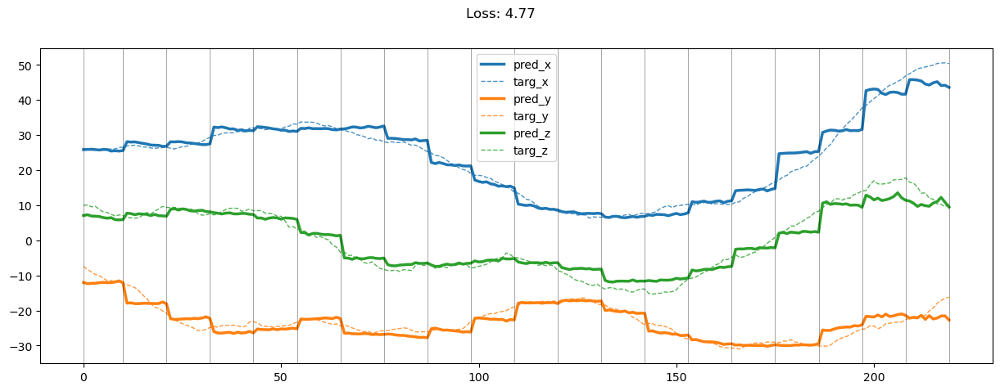

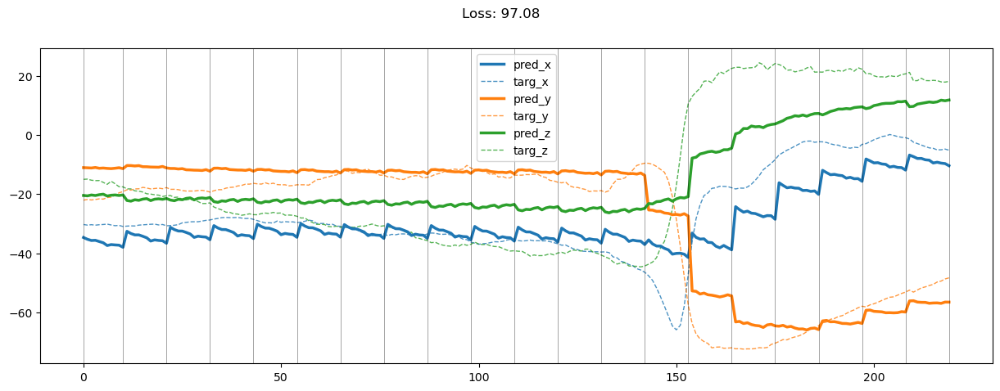

00349: train total loss:  8.505, pred loss:  8.505, valid total loss:  93.344, pred loss:  93.344


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


00350: train total loss:  8.657, pred loss:  8.657, valid total loss:  96.181, pred loss:  96.181


100%|██████████| 7/7 [00:00<00:00, 33.11it/s]


00351: train total loss:  8.411, pred loss:  8.411, valid total loss:  95.596, pred loss:  95.596


100%|██████████| 7/7 [00:00<00:00, 33.15it/s]


00352: train total loss:  8.413, pred loss:  8.413, valid total loss:  93.192, pred loss:  93.192


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


00353: train total loss:  8.209, pred loss:  8.209, valid total loss:  93.938, pred loss:  93.938


100%|██████████| 7/7 [00:00<00:00, 33.21it/s]


00354: train total loss:  8.362, pred loss:  8.362, valid total loss:  93.156, pred loss:  93.156


100%|██████████| 7/7 [00:00<00:00, 33.09it/s]


00355: train total loss:  8.230, pred loss:  8.230, valid total loss:  95.044, pred loss:  95.044


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


00356: train total loss:  8.305, pred loss:  8.305, valid total loss:  96.397, pred loss:  96.397


100%|██████████| 7/7 [00:00<00:00, 31.55it/s]


00357: train total loss:  8.328, pred loss:  8.328, valid total loss:  95.358, pred loss:  95.358


100%|██████████| 7/7 [00:00<00:00, 33.40it/s]


00358: train total loss:  8.569, pred loss:  8.569, valid total loss:  91.991, pred loss:  91.991


100%|██████████| 7/7 [00:00<00:00, 33.31it/s]


00359: train total loss:  8.444, pred loss:  8.444, valid total loss:  99.847, pred loss:  99.847


100%|██████████| 7/7 [00:00<00:00, 33.95it/s]


00360: train total loss:  8.167, pred loss:  8.167, valid total loss:  93.652, pred loss:  93.652


100%|██████████| 7/7 [00:00<00:00, 33.11it/s]


00361: train total loss:  8.543, pred loss:  8.543, valid total loss:  91.539, pred loss:  91.539


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


00362: train total loss:  8.399, pred loss:  8.399, valid total loss:  91.412, pred loss:  91.412


100%|██████████| 7/7 [00:00<00:00, 33.25it/s]


00363: train total loss:  8.358, pred loss:  8.358, valid total loss:  92.445, pred loss:  92.445


100%|██████████| 7/7 [00:00<00:00, 32.99it/s]


00364: train total loss:  8.456, pred loss:  8.456, valid total loss:  91.249, pred loss:  91.249


100%|██████████| 7/7 [00:00<00:00, 31.99it/s]


00365: train total loss:  8.528, pred loss:  8.528, valid total loss:  94.250, pred loss:  94.250


100%|██████████| 7/7 [00:00<00:00, 30.82it/s]


00366: train total loss:  8.249, pred loss:  8.249, valid total loss:  93.410, pred loss:  93.410


100%|██████████| 7/7 [00:00<00:00, 29.47it/s]


00367: train total loss:  7.992, pred loss:  7.992, valid total loss:  98.018, pred loss:  98.018


100%|██████████| 7/7 [00:00<00:00, 28.12it/s]


00368: train total loss:  8.215, pred loss:  8.215, valid total loss:  93.145, pred loss:  93.145


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


00369: train total loss:  8.080, pred loss:  8.080, valid total loss:  96.699, pred loss:  96.699


100%|██████████| 7/7 [00:00<00:00, 30.64it/s]


00370: train total loss:  8.510, pred loss:  8.510, valid total loss:  96.819, pred loss:  96.819


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


00371: train total loss:  8.013, pred loss:  8.013, valid total loss:  96.270, pred loss:  96.270


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


00372: train total loss:  8.249, pred loss:  8.249, valid total loss:  95.020, pred loss:  95.020


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


00373: train total loss:  8.061, pred loss:  8.061, valid total loss:  93.745, pred loss:  93.745


100%|██████████| 7/7 [00:00<00:00, 27.45it/s]


00374: train total loss:  8.268, pred loss:  8.268, valid total loss:  94.918, pred loss:  94.918


100%|██████████| 7/7 [00:00<00:00, 30.38it/s]


00375: train total loss:  8.261, pred loss:  8.261, valid total loss:  98.347, pred loss:  98.347


100%|██████████| 7/7 [00:00<00:00, 30.61it/s]


00376: train total loss:  8.106, pred loss:  8.106, valid total loss:  97.912, pred loss:  97.912


100%|██████████| 7/7 [00:00<00:00, 30.12it/s]


00377: train total loss:  7.837, pred loss:  7.837, valid total loss:  98.522, pred loss:  98.522


100%|██████████| 7/7 [00:00<00:00, 30.41it/s]


00378: train total loss:  7.881, pred loss:  7.881, valid total loss:  93.634, pred loss:  93.634


100%|██████████| 7/7 [00:00<00:00, 29.65it/s]


00379: train total loss:  7.893, pred loss:  7.893, valid total loss:  93.698, pred loss:  93.698


100%|██████████| 7/7 [00:00<00:00, 30.37it/s]


00380: train total loss:  8.282, pred loss:  8.282, valid total loss:  93.694, pred loss:  93.694


100%|██████████| 7/7 [00:00<00:00, 30.56it/s]


00381: train total loss:  8.181, pred loss:  8.181, valid total loss:  94.944, pred loss:  94.944


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


00382: train total loss:  8.233, pred loss:  8.233, valid total loss:  97.369, pred loss:  97.369


100%|██████████| 7/7 [00:00<00:00, 30.32it/s]


00383: train total loss:  8.412, pred loss:  8.412, valid total loss:  94.691, pred loss:  94.691


100%|██████████| 7/7 [00:00<00:00, 29.17it/s]


00384: train total loss:  7.879, pred loss:  7.879, valid total loss:  93.439, pred loss:  93.439


100%|██████████| 7/7 [00:00<00:00, 30.54it/s]


00385: train total loss:  7.646, pred loss:  7.646, valid total loss:  95.785, pred loss:  95.785


100%|██████████| 7/7 [00:00<00:00, 27.20it/s]


00386: train total loss:  7.710, pred loss:  7.710, valid total loss:  97.745, pred loss:  97.745


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


00387: train total loss:  7.828, pred loss:  7.828, valid total loss:  91.795, pred loss:  91.795


100%|██████████| 7/7 [00:00<00:00, 31.92it/s]


00388: train total loss:  7.586, pred loss:  7.586, valid total loss:  102.762, pred loss:  102.762


100%|██████████| 7/7 [00:00<00:00, 32.64it/s]


00389: train total loss:  7.828, pred loss:  7.828, valid total loss:  94.340, pred loss:  94.340


100%|██████████| 7/7 [00:00<00:00, 32.47it/s]


00390: train total loss:  7.894, pred loss:  7.894, valid total loss:  104.887, pred loss:  104.887


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


00391: train total loss:  7.794, pred loss:  7.794, valid total loss:  99.128, pred loss:  99.128


100%|██████████| 7/7 [00:00<00:00, 29.79it/s]


00392: train total loss:  7.685, pred loss:  7.685, valid total loss:  91.207, pred loss:  91.207


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00393: train total loss:  7.493, pred loss:  7.493, valid total loss:  92.421, pred loss:  92.421


100%|██████████| 7/7 [00:00<00:00, 29.84it/s]


00394: train total loss:  7.747, pred loss:  7.747, valid total loss:  92.767, pred loss:  92.767


100%|██████████| 7/7 [00:00<00:00, 29.72it/s]


00395: train total loss:  7.752, pred loss:  7.752, valid total loss:  97.263, pred loss:  97.263


100%|██████████| 7/7 [00:00<00:00, 26.21it/s]


00396: train total loss:  7.814, pred loss:  7.814, valid total loss:  89.941, pred loss:  89.941


100%|██████████| 7/7 [00:00<00:00, 22.65it/s]


00397: train total loss:  7.733, pred loss:  7.733, valid total loss:  94.462, pred loss:  94.462


100%|██████████| 7/7 [00:00<00:00, 23.52it/s]


00398: train total loss:  7.828, pred loss:  7.828, valid total loss:  96.352, pred loss:  96.352


100%|██████████| 7/7 [00:00<00:00, 22.71it/s]


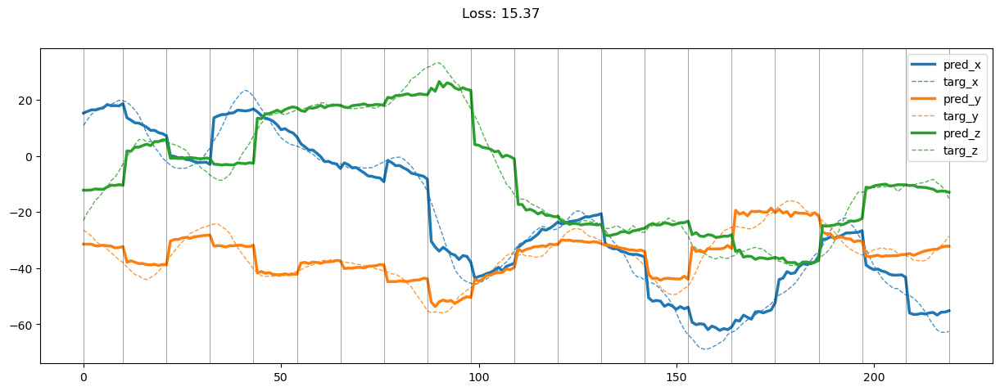

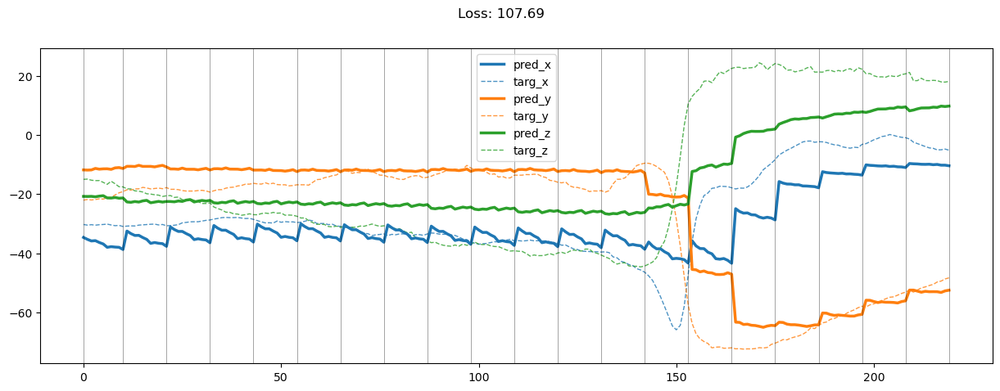

00399: train total loss:  7.735, pred loss:  7.735, valid total loss:  94.148, pred loss:  94.148


100%|██████████| 7/7 [00:00<00:00, 28.65it/s]


00400: train total loss:  7.558, pred loss:  7.558, valid total loss:  97.466, pred loss:  97.466


100%|██████████| 7/7 [00:00<00:00, 33.35it/s]


00401: train total loss:  7.646, pred loss:  7.646, valid total loss:  94.261, pred loss:  94.261


100%|██████████| 7/7 [00:00<00:00, 32.91it/s]


00402: train total loss:  7.677, pred loss:  7.677, valid total loss:  97.450, pred loss:  97.450


100%|██████████| 7/7 [00:00<00:00, 32.60it/s]


00403: train total loss:  7.598, pred loss:  7.598, valid total loss:  96.564, pred loss:  96.564


100%|██████████| 7/7 [00:00<00:00, 32.29it/s]


00404: train total loss:  7.629, pred loss:  7.629, valid total loss:  100.402, pred loss:  100.402


100%|██████████| 7/7 [00:00<00:00, 27.77it/s]


00405: train total loss:  7.558, pred loss:  7.558, valid total loss:  98.197, pred loss:  98.197


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


00406: train total loss:  7.860, pred loss:  7.860, valid total loss:  91.738, pred loss:  91.738


100%|██████████| 7/7 [00:00<00:00, 28.87it/s]


00407: train total loss:  7.715, pred loss:  7.715, valid total loss:  91.932, pred loss:  91.932


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


00408: train total loss:  7.386, pred loss:  7.386, valid total loss:  101.532, pred loss:  101.532


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


00409: train total loss:  7.394, pred loss:  7.394, valid total loss:  92.657, pred loss:  92.657


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


00410: train total loss:  7.168, pred loss:  7.168, valid total loss:  94.496, pred loss:  94.496


100%|██████████| 7/7 [00:00<00:00, 33.33it/s]


00411: train total loss:  7.116, pred loss:  7.116, valid total loss:  96.590, pred loss:  96.590


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


00412: train total loss:  7.046, pred loss:  7.046, valid total loss:  99.967, pred loss:  99.967


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


00413: train total loss:  7.071, pred loss:  7.071, valid total loss:  99.704, pred loss:  99.704


100%|██████████| 7/7 [00:00<00:00, 22.59it/s]


00414: train total loss:  7.321, pred loss:  7.321, valid total loss:  98.756, pred loss:  98.756


100%|██████████| 7/7 [00:00<00:00, 29.63it/s]


00415: train total loss:  7.101, pred loss:  7.101, valid total loss:  96.955, pred loss:  96.955


100%|██████████| 7/7 [00:00<00:00, 25.39it/s]


00416: train total loss:  7.091, pred loss:  7.091, valid total loss:  97.879, pred loss:  97.879


100%|██████████| 7/7 [00:00<00:00, 29.03it/s]


00417: train total loss:  6.950, pred loss:  6.950, valid total loss:  99.301, pred loss:  99.301


100%|██████████| 7/7 [00:00<00:00, 22.26it/s]


00418: train total loss:  7.193, pred loss:  7.193, valid total loss:  101.582, pred loss:  101.582


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


00419: train total loss:  7.055, pred loss:  7.055, valid total loss:  96.276, pred loss:  96.276


100%|██████████| 7/7 [00:00<00:00, 31.70it/s]


00420: train total loss:  7.234, pred loss:  7.234, valid total loss:  91.002, pred loss:  91.002


100%|██████████| 7/7 [00:00<00:00, 29.15it/s]


00421: train total loss:  7.313, pred loss:  7.313, valid total loss:  87.694, pred loss:  87.694


100%|██████████| 7/7 [00:00<00:00, 30.62it/s]


00422: train total loss:  7.199, pred loss:  7.199, valid total loss:  95.125, pred loss:  95.125


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


00423: train total loss:  7.313, pred loss:  7.313, valid total loss:  93.556, pred loss:  93.556


100%|██████████| 7/7 [00:00<00:00, 30.23it/s]


00424: train total loss:  6.947, pred loss:  6.947, valid total loss:  92.926, pred loss:  92.926


100%|██████████| 7/7 [00:00<00:00, 30.34it/s]


00425: train total loss:  7.240, pred loss:  7.240, valid total loss:  95.115, pred loss:  95.115


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


00426: train total loss:  7.146, pred loss:  7.146, valid total loss:  92.505, pred loss:  92.505


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


00427: train total loss:  7.199, pred loss:  7.199, valid total loss:  92.540, pred loss:  92.540


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


00428: train total loss:  7.195, pred loss:  7.195, valid total loss:  90.873, pred loss:  90.873


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


00429: train total loss:  6.955, pred loss:  6.955, valid total loss:  95.647, pred loss:  95.647


100%|██████████| 7/7 [00:00<00:00, 30.29it/s]


00430: train total loss:  7.205, pred loss:  7.205, valid total loss:  97.170, pred loss:  97.170


100%|██████████| 7/7 [00:00<00:00, 29.57it/s]


00431: train total loss:  7.139, pred loss:  7.139, valid total loss:  103.208, pred loss:  103.208


100%|██████████| 7/7 [00:00<00:00, 29.32it/s]


00432: train total loss:  7.250, pred loss:  7.250, valid total loss:  99.015, pred loss:  99.015


100%|██████████| 7/7 [00:00<00:00, 30.69it/s]


00433: train total loss:  7.245, pred loss:  7.245, valid total loss:  100.694, pred loss:  100.694


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


00434: train total loss:  7.054, pred loss:  7.054, valid total loss:  95.884, pred loss:  95.884


100%|██████████| 7/7 [00:00<00:00, 30.29it/s]


00435: train total loss:  6.915, pred loss:  6.915, valid total loss:  94.743, pred loss:  94.743


100%|██████████| 7/7 [00:00<00:00, 29.28it/s]


00436: train total loss:  7.395, pred loss:  7.395, valid total loss:  93.620, pred loss:  93.620


100%|██████████| 7/7 [00:00<00:00, 29.18it/s]


00437: train total loss:  6.852, pred loss:  6.852, valid total loss:  88.426, pred loss:  88.426


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


00438: train total loss:  6.791, pred loss:  6.791, valid total loss:  90.780, pred loss:  90.780


100%|██████████| 7/7 [00:00<00:00, 30.38it/s]


00439: train total loss:  6.958, pred loss:  6.958, valid total loss:  94.199, pred loss:  94.199


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


00440: train total loss:  6.642, pred loss:  6.642, valid total loss:  91.676, pred loss:  91.676


100%|██████████| 7/7 [00:00<00:00, 27.56it/s]


00441: train total loss:  6.892, pred loss:  6.892, valid total loss:  96.387, pred loss:  96.387


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


00442: train total loss:  6.885, pred loss:  6.885, valid total loss:  95.745, pred loss:  95.745


100%|██████████| 7/7 [00:00<00:00, 26.81it/s]


00443: train total loss:  6.693, pred loss:  6.693, valid total loss:  98.425, pred loss:  98.425


100%|██████████| 7/7 [00:00<00:00, 30.16it/s]


00444: train total loss:  6.888, pred loss:  6.888, valid total loss:  95.436, pred loss:  95.436


100%|██████████| 7/7 [00:00<00:00, 28.20it/s]


00445: train total loss:  6.698, pred loss:  6.698, valid total loss:  95.872, pred loss:  95.872


100%|██████████| 7/7 [00:00<00:00, 30.84it/s]


00446: train total loss:  6.734, pred loss:  6.734, valid total loss:  96.248, pred loss:  96.248


100%|██████████| 7/7 [00:00<00:00, 29.97it/s]


00447: train total loss:  6.703, pred loss:  6.703, valid total loss:  98.659, pred loss:  98.659


100%|██████████| 7/7 [00:00<00:00, 26.46it/s]


00448: train total loss:  6.817, pred loss:  6.817, valid total loss:  96.725, pred loss:  96.725


100%|██████████| 7/7 [00:00<00:00, 28.60it/s]


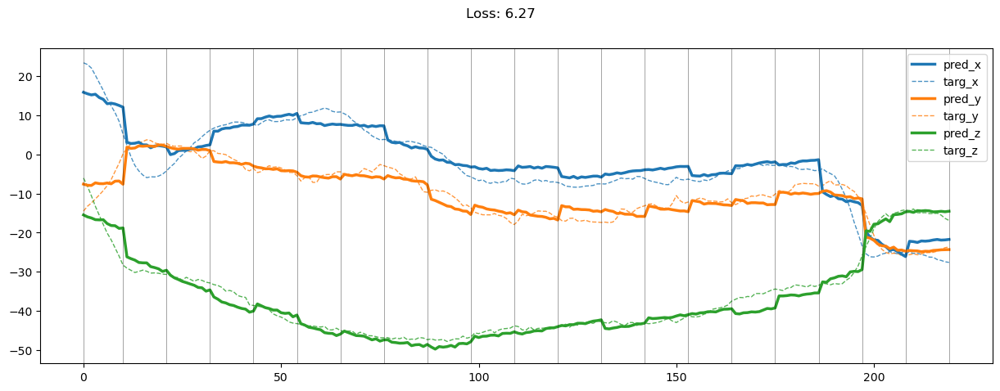

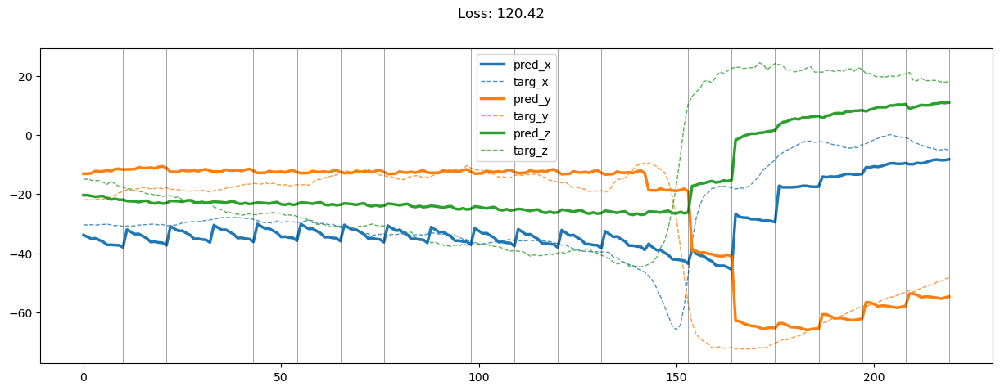

00449: train total loss:  6.791, pred loss:  6.791, valid total loss:  100.171, pred loss:  100.171


100%|██████████| 7/7 [00:00<00:00, 29.46it/s]


00450: train total loss:  6.725, pred loss:  6.725, valid total loss:  97.165, pred loss:  97.165


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


00451: train total loss:  6.661, pred loss:  6.661, valid total loss:  97.769, pred loss:  97.769


100%|██████████| 7/7 [00:00<00:00, 28.38it/s]


00452: train total loss:  6.499, pred loss:  6.499, valid total loss:  93.542, pred loss:  93.542


100%|██████████| 7/7 [00:00<00:00, 30.04it/s]


00453: train total loss:  6.603, pred loss:  6.603, valid total loss:  91.571, pred loss:  91.571


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


00454: train total loss:  6.716, pred loss:  6.716, valid total loss:  94.323, pred loss:  94.323


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


00455: train total loss:  6.654, pred loss:  6.654, valid total loss:  95.954, pred loss:  95.954


100%|██████████| 7/7 [00:00<00:00, 31.89it/s]


00456: train total loss:  6.609, pred loss:  6.609, valid total loss:  94.021, pred loss:  94.021


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


00457: train total loss:  6.590, pred loss:  6.590, valid total loss:  93.449, pred loss:  93.449


100%|██████████| 7/7 [00:00<00:00, 28.68it/s]


00458: train total loss:  6.851, pred loss:  6.851, valid total loss:  96.678, pred loss:  96.678


100%|██████████| 7/7 [00:00<00:00, 29.52it/s]


00459: train total loss:  6.559, pred loss:  6.559, valid total loss:  96.828, pred loss:  96.828


100%|██████████| 7/7 [00:00<00:00, 30.22it/s]


00460: train total loss:  6.632, pred loss:  6.632, valid total loss:  95.103, pred loss:  95.103


100%|██████████| 7/7 [00:00<00:00, 29.80it/s]


00461: train total loss:  6.475, pred loss:  6.475, valid total loss:  94.347, pred loss:  94.347


100%|██████████| 7/7 [00:00<00:00, 30.17it/s]


00462: train total loss:  6.393, pred loss:  6.393, valid total loss:  88.924, pred loss:  88.924


100%|██████████| 7/7 [00:00<00:00, 28.59it/s]


00463: train total loss:  6.411, pred loss:  6.411, valid total loss:  92.684, pred loss:  92.684


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


00464: train total loss:  6.403, pred loss:  6.403, valid total loss:  93.847, pred loss:  93.847


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


00465: train total loss:  6.318, pred loss:  6.318, valid total loss:  95.125, pred loss:  95.125


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


00466: train total loss:  6.411, pred loss:  6.411, valid total loss:  91.931, pred loss:  91.931


100%|██████████| 7/7 [00:00<00:00, 25.83it/s]


00467: train total loss:  6.418, pred loss:  6.418, valid total loss:  96.668, pred loss:  96.668


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


00468: train total loss:  6.475, pred loss:  6.475, valid total loss:  92.008, pred loss:  92.008


100%|██████████| 7/7 [00:00<00:00, 26.85it/s]


00469: train total loss:  6.377, pred loss:  6.377, valid total loss:  96.192, pred loss:  96.192


100%|██████████| 7/7 [00:00<00:00, 30.43it/s]


00470: train total loss:  6.451, pred loss:  6.451, valid total loss:  98.236, pred loss:  98.236


100%|██████████| 7/7 [00:00<00:00, 28.85it/s]


00471: train total loss:  6.701, pred loss:  6.701, valid total loss:  98.157, pred loss:  98.157


100%|██████████| 7/7 [00:00<00:00, 23.46it/s]


00472: train total loss:  6.299, pred loss:  6.299, valid total loss:  99.070, pred loss:  99.070


100%|██████████| 7/7 [00:00<00:00, 33.93it/s]


00473: train total loss:  6.314, pred loss:  6.314, valid total loss:  103.039, pred loss:  103.039


100%|██████████| 7/7 [00:00<00:00, 32.70it/s]


00474: train total loss:  6.327, pred loss:  6.327, valid total loss:  101.312, pred loss:  101.312


100%|██████████| 7/7 [00:00<00:00, 33.42it/s]


00475: train total loss:  6.729, pred loss:  6.729, valid total loss:  106.437, pred loss:  106.437


100%|██████████| 7/7 [00:00<00:00, 31.10it/s]


00476: train total loss:  6.835, pred loss:  6.835, valid total loss:  93.854, pred loss:  93.854


100%|██████████| 7/7 [00:00<00:00, 28.90it/s]


00477: train total loss:  6.448, pred loss:  6.448, valid total loss:  92.176, pred loss:  92.176


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


00478: train total loss:  6.589, pred loss:  6.589, valid total loss:  100.593, pred loss:  100.593


100%|██████████| 7/7 [00:00<00:00, 33.26it/s]


00479: train total loss:  6.635, pred loss:  6.635, valid total loss:  95.738, pred loss:  95.738


100%|██████████| 7/7 [00:00<00:00, 33.82it/s]


00480: train total loss:  6.473, pred loss:  6.473, valid total loss:  93.576, pred loss:  93.576


100%|██████████| 7/7 [00:00<00:00, 33.78it/s]


00481: train total loss:  6.449, pred loss:  6.449, valid total loss:  94.763, pred loss:  94.763


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


00482: train total loss:  6.501, pred loss:  6.501, valid total loss:  98.726, pred loss:  98.726


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


00483: train total loss:  6.416, pred loss:  6.416, valid total loss:  93.334, pred loss:  93.334


100%|██████████| 7/7 [00:00<00:00, 33.47it/s]


00484: train total loss:  6.480, pred loss:  6.480, valid total loss:  96.930, pred loss:  96.930


100%|██████████| 7/7 [00:00<00:00, 31.70it/s]


00485: train total loss:  6.546, pred loss:  6.546, valid total loss:  104.613, pred loss:  104.613


100%|██████████| 7/7 [00:00<00:00, 33.87it/s]


00486: train total loss:  6.358, pred loss:  6.358, valid total loss:  98.287, pred loss:  98.287


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


00487: train total loss:  6.313, pred loss:  6.313, valid total loss:  102.549, pred loss:  102.549


100%|██████████| 7/7 [00:00<00:00, 33.88it/s]


00488: train total loss:  6.110, pred loss:  6.110, valid total loss:  97.855, pred loss:  97.855


100%|██████████| 7/7 [00:00<00:00, 23.33it/s]


00489: train total loss:  6.279, pred loss:  6.279, valid total loss:  91.728, pred loss:  91.728


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


00490: train total loss:  6.044, pred loss:  6.044, valid total loss:  95.528, pred loss:  95.528


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


00491: train total loss:  5.869, pred loss:  5.869, valid total loss:  98.795, pred loss:  98.795


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


00492: train total loss:  6.032, pred loss:  6.032, valid total loss:  96.048, pred loss:  96.048


100%|██████████| 7/7 [00:00<00:00, 33.93it/s]


00493: train total loss:  6.106, pred loss:  6.106, valid total loss:  96.930, pred loss:  96.930


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


00494: train total loss:  5.982, pred loss:  5.982, valid total loss:  97.773, pred loss:  97.773


100%|██████████| 7/7 [00:00<00:00, 33.79it/s]


00495: train total loss:  6.015, pred loss:  6.015, valid total loss:  102.722, pred loss:  102.722


100%|██████████| 7/7 [00:00<00:00, 34.09it/s]


00496: train total loss:  6.099, pred loss:  6.099, valid total loss:  96.339, pred loss:  96.339


100%|██████████| 7/7 [00:00<00:00, 30.88it/s]


00497: train total loss:  5.883, pred loss:  5.883, valid total loss:  98.984, pred loss:  98.984


100%|██████████| 7/7 [00:00<00:00, 30.38it/s]


00498: train total loss:  5.909, pred loss:  5.909, valid total loss:  100.962, pred loss:  100.962


100%|██████████| 7/7 [00:00<00:00, 29.97it/s]


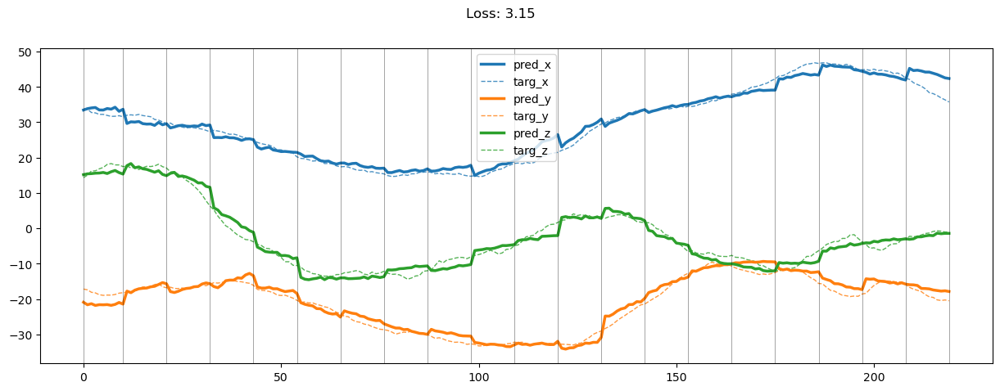

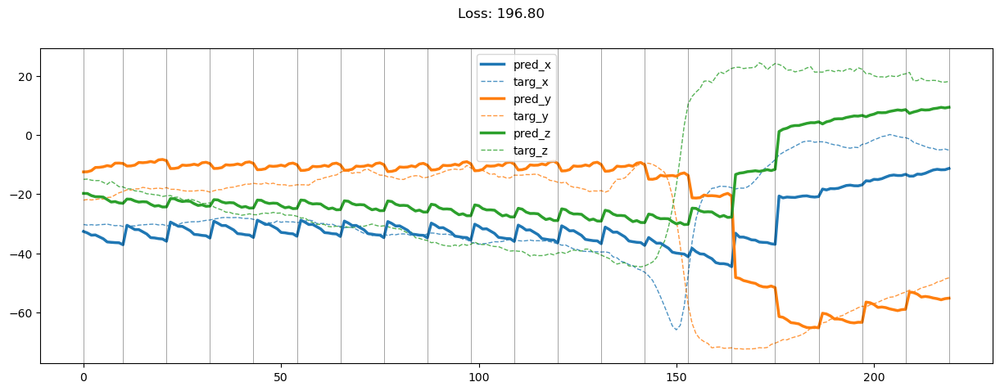

00499: train total loss:  5.760, pred loss:  5.760, valid total loss:  100.608, pred loss:  100.608


100%|██████████| 7/7 [00:00<00:00, 30.65it/s]


00500: train total loss:  5.863, pred loss:  5.863, valid total loss:  100.446, pred loss:  100.446


100%|██████████| 7/7 [00:00<00:00, 26.12it/s]


00501: train total loss:  5.772, pred loss:  5.772, valid total loss:  99.669, pred loss:  99.669


100%|██████████| 7/7 [00:00<00:00, 29.48it/s]


00502: train total loss:  5.937, pred loss:  5.937, valid total loss:  99.642, pred loss:  99.642


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


00503: train total loss:  5.986, pred loss:  5.986, valid total loss:  99.521, pred loss:  99.521


100%|██████████| 7/7 [00:00<00:00, 30.50it/s]


00504: train total loss:  5.841, pred loss:  5.841, valid total loss:  99.979, pred loss:  99.979


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


00505: train total loss:  5.777, pred loss:  5.777, valid total loss:  100.055, pred loss:  100.055


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


00506: train total loss:  5.737, pred loss:  5.737, valid total loss:  96.163, pred loss:  96.163


100%|██████████| 7/7 [00:00<00:00, 33.07it/s]


00507: train total loss:  5.810, pred loss:  5.810, valid total loss:  100.066, pred loss:  100.066


100%|██████████| 7/7 [00:00<00:00, 33.19it/s]


00508: train total loss:  5.929, pred loss:  5.929, valid total loss:  93.757, pred loss:  93.757


100%|██████████| 7/7 [00:00<00:00, 22.44it/s]


00509: train total loss:  5.979, pred loss:  5.979, valid total loss:  90.291, pred loss:  90.291


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


00510: train total loss:  5.879, pred loss:  5.879, valid total loss:  99.502, pred loss:  99.502


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


00511: train total loss:  5.938, pred loss:  5.938, valid total loss:  92.422, pred loss:  92.422


100%|██████████| 7/7 [00:00<00:00, 27.91it/s]


00512: train total loss:  5.951, pred loss:  5.951, valid total loss:  94.912, pred loss:  94.912


100%|██████████| 7/7 [00:00<00:00, 30.43it/s]


00513: train total loss:  5.912, pred loss:  5.912, valid total loss:  99.078, pred loss:  99.078


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


00514: train total loss:  5.772, pred loss:  5.772, valid total loss:  94.695, pred loss:  94.695


100%|██████████| 7/7 [00:00<00:00, 29.99it/s]


00515: train total loss:  5.696, pred loss:  5.696, valid total loss:  102.200, pred loss:  102.200


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00516: train total loss:  5.682, pred loss:  5.682, valid total loss:  96.666, pred loss:  96.666


100%|██████████| 7/7 [00:00<00:00, 29.97it/s]


00517: train total loss:  5.839, pred loss:  5.839, valid total loss:  96.133, pred loss:  96.133


100%|██████████| 7/7 [00:00<00:00, 30.22it/s]


00518: train total loss:  5.686, pred loss:  5.686, valid total loss:  96.300, pred loss:  96.300


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


00519: train total loss:  5.868, pred loss:  5.868, valid total loss:  93.067, pred loss:  93.067


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


00520: train total loss:  5.795, pred loss:  5.795, valid total loss:  97.503, pred loss:  97.503


100%|██████████| 7/7 [00:00<00:00, 30.16it/s]


00521: train total loss:  5.800, pred loss:  5.800, valid total loss:  98.788, pred loss:  98.788


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


00522: train total loss:  5.578, pred loss:  5.578, valid total loss:  92.033, pred loss:  92.033


100%|██████████| 7/7 [00:00<00:00, 28.56it/s]


00523: train total loss:  5.526, pred loss:  5.526, valid total loss:  93.720, pred loss:  93.720


100%|██████████| 7/7 [00:00<00:00, 30.42it/s]


00524: train total loss:  5.582, pred loss:  5.582, valid total loss:  94.524, pred loss:  94.524


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


00525: train total loss:  5.591, pred loss:  5.591, valid total loss:  97.385, pred loss:  97.385


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


00526: train total loss:  5.392, pred loss:  5.392, valid total loss:  98.618, pred loss:  98.618


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


00527: train total loss:  5.653, pred loss:  5.653, valid total loss:  95.755, pred loss:  95.755


100%|██████████| 7/7 [00:00<00:00, 30.32it/s]


00528: train total loss:  5.734, pred loss:  5.734, valid total loss:  94.665, pred loss:  94.665


100%|██████████| 7/7 [00:00<00:00, 30.42it/s]


00529: train total loss:  5.508, pred loss:  5.508, valid total loss:  96.219, pred loss:  96.219


100%|██████████| 7/7 [00:00<00:00, 28.49it/s]


00530: train total loss:  5.588, pred loss:  5.588, valid total loss:  99.992, pred loss:  99.992


100%|██████████| 7/7 [00:00<00:00, 28.16it/s]


00531: train total loss:  5.676, pred loss:  5.676, valid total loss:  99.769, pred loss:  99.769


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


00532: train total loss:  5.601, pred loss:  5.601, valid total loss:  94.470, pred loss:  94.470


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


00533: train total loss:  5.687, pred loss:  5.687, valid total loss:  92.266, pred loss:  92.266


100%|██████████| 7/7 [00:00<00:00, 29.36it/s]


00534: train total loss:  5.530, pred loss:  5.530, valid total loss:  89.927, pred loss:  89.927


100%|██████████| 7/7 [00:00<00:00, 25.97it/s]


00535: train total loss:  5.643, pred loss:  5.643, valid total loss:  90.499, pred loss:  90.499


100%|██████████| 7/7 [00:00<00:00, 22.78it/s]


00536: train total loss:  5.384, pred loss:  5.384, valid total loss:  92.570, pred loss:  92.570


100%|██████████| 7/7 [00:00<00:00, 27.33it/s]


00537: train total loss:  5.499, pred loss:  5.499, valid total loss:  93.837, pred loss:  93.837


100%|██████████| 7/7 [00:00<00:00, 33.52it/s]


00538: train total loss:  5.572, pred loss:  5.572, valid total loss:  90.546, pred loss:  90.546


100%|██████████| 7/7 [00:00<00:00, 33.07it/s]


00539: train total loss:  5.584, pred loss:  5.584, valid total loss:  90.540, pred loss:  90.540


100%|██████████| 7/7 [00:00<00:00, 33.97it/s]


00540: train total loss:  5.644, pred loss:  5.644, valid total loss:  95.378, pred loss:  95.378


100%|██████████| 7/7 [00:00<00:00, 28.39it/s]


00541: train total loss:  5.495, pred loss:  5.495, valid total loss:  95.555, pred loss:  95.555


100%|██████████| 7/7 [00:00<00:00, 28.07it/s]


00542: train total loss:  5.536, pred loss:  5.536, valid total loss:  93.048, pred loss:  93.048


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


00543: train total loss:  5.502, pred loss:  5.502, valid total loss:  92.677, pred loss:  92.677


100%|██████████| 7/7 [00:00<00:00, 32.47it/s]


00544: train total loss:  5.214, pred loss:  5.214, valid total loss:  93.195, pred loss:  93.195


100%|██████████| 7/7 [00:00<00:00, 29.19it/s]


00545: train total loss:  5.259, pred loss:  5.259, valid total loss:  97.105, pred loss:  97.105


100%|██████████| 7/7 [00:00<00:00, 29.23it/s]


00546: train total loss:  5.312, pred loss:  5.312, valid total loss:  94.138, pred loss:  94.138


100%|██████████| 7/7 [00:00<00:00, 22.29it/s]


00547: train total loss:  5.230, pred loss:  5.230, valid total loss:  98.812, pred loss:  98.812


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


00548: train total loss:  5.295, pred loss:  5.295, valid total loss:  98.212, pred loss:  98.212


100%|██████████| 7/7 [00:00<00:00, 29.31it/s]


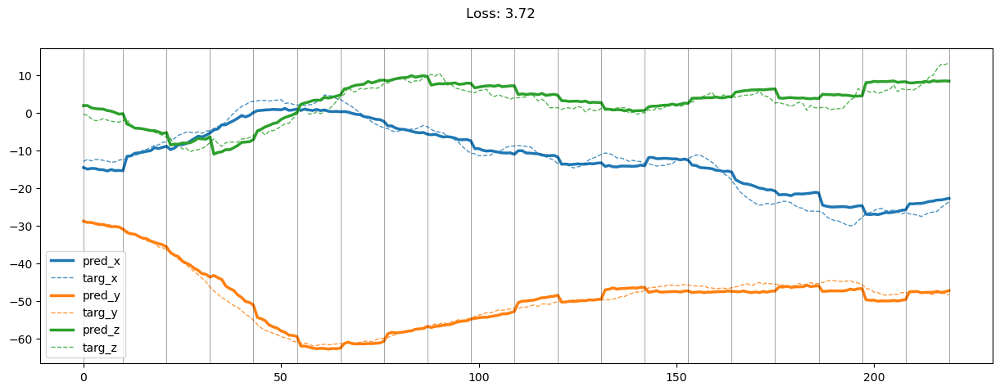

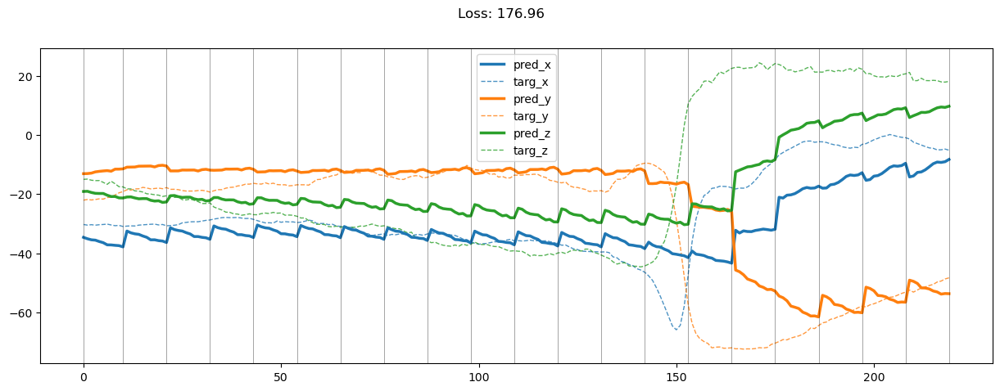

00549: train total loss:  5.241, pred loss:  5.241, valid total loss:  97.483, pred loss:  97.483


100%|██████████| 7/7 [00:00<00:00, 29.42it/s]


00550: train total loss:  5.088, pred loss:  5.088, valid total loss:  97.400, pred loss:  97.400


100%|██████████| 7/7 [00:00<00:00, 30.83it/s]


00551: train total loss:  5.257, pred loss:  5.257, valid total loss:  96.227, pred loss:  96.227


100%|██████████| 7/7 [00:00<00:00, 30.17it/s]


00552: train total loss:  5.273, pred loss:  5.273, valid total loss:  100.302, pred loss:  100.302


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


00553: train total loss:  5.201, pred loss:  5.201, valid total loss:  99.345, pred loss:  99.345


100%|██████████| 7/7 [00:00<00:00, 29.59it/s]


00554: train total loss:  5.219, pred loss:  5.219, valid total loss:  98.751, pred loss:  98.751


100%|██████████| 7/7 [00:00<00:00, 22.56it/s]


00555: train total loss:  5.043, pred loss:  5.043, valid total loss:  96.971, pred loss:  96.971


100%|██████████| 7/7 [00:00<00:00, 22.50it/s]


00556: train total loss:  5.122, pred loss:  5.122, valid total loss:  92.935, pred loss:  92.935


100%|██████████| 7/7 [00:00<00:00, 27.41it/s]


00557: train total loss:  5.184, pred loss:  5.184, valid total loss:  95.745, pred loss:  95.745


100%|██████████| 7/7 [00:00<00:00, 27.15it/s]


00558: train total loss:  5.194, pred loss:  5.194, valid total loss:  99.632, pred loss:  99.632


100%|██████████| 7/7 [00:00<00:00, 26.29it/s]


00559: train total loss:  5.077, pred loss:  5.077, valid total loss:  96.210, pred loss:  96.210


100%|██████████| 7/7 [00:00<00:00, 30.42it/s]


00560: train total loss:  5.046, pred loss:  5.046, valid total loss:  95.240, pred loss:  95.240


100%|██████████| 7/7 [00:00<00:00, 30.26it/s]


00561: train total loss:  5.148, pred loss:  5.148, valid total loss:  95.509, pred loss:  95.509


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00562: train total loss:  5.061, pred loss:  5.061, valid total loss:  95.598, pred loss:  95.598


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


00563: train total loss:  5.233, pred loss:  5.233, valid total loss:  92.217, pred loss:  92.217


100%|██████████| 7/7 [00:00<00:00, 29.51it/s]


00564: train total loss:  5.068, pred loss:  5.068, valid total loss:  96.229, pred loss:  96.229


100%|██████████| 7/7 [00:00<00:00, 30.77it/s]


00565: train total loss:  4.949, pred loss:  4.949, valid total loss:  95.848, pred loss:  95.848


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


00566: train total loss:  5.029, pred loss:  5.029, valid total loss:  90.461, pred loss:  90.461


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


00567: train total loss:  5.129, pred loss:  5.129, valid total loss:  96.579, pred loss:  96.579


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


00568: train total loss:  5.041, pred loss:  5.041, valid total loss:  96.949, pred loss:  96.949


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


00569: train total loss:  4.962, pred loss:  4.962, valid total loss:  93.575, pred loss:  93.575


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


00570: train total loss:  4.966, pred loss:  4.966, valid total loss:  95.573, pred loss:  95.573


100%|██████████| 7/7 [00:00<00:00, 26.17it/s]


00571: train total loss:  4.916, pred loss:  4.916, valid total loss:  90.810, pred loss:  90.810


100%|██████████| 7/7 [00:00<00:00, 23.78it/s]


00572: train total loss:  4.846, pred loss:  4.846, valid total loss:  95.246, pred loss:  95.246


100%|██████████| 7/7 [00:00<00:00, 30.60it/s]


00573: train total loss:  4.958, pred loss:  4.958, valid total loss:  95.029, pred loss:  95.029


100%|██████████| 7/7 [00:00<00:00, 29.87it/s]


00574: train total loss:  5.007, pred loss:  5.007, valid total loss:  91.162, pred loss:  91.162


100%|██████████| 7/7 [00:00<00:00, 28.82it/s]


00575: train total loss:  4.928, pred loss:  4.928, valid total loss:  94.541, pred loss:  94.541


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


00576: train total loss:  5.045, pred loss:  5.045, valid total loss:  94.577, pred loss:  94.577


100%|██████████| 7/7 [00:00<00:00, 26.01it/s]


00577: train total loss:  4.996, pred loss:  4.996, valid total loss:  96.573, pred loss:  96.573


100%|██████████| 7/7 [00:00<00:00, 22.61it/s]


00578: train total loss:  5.027, pred loss:  5.027, valid total loss:  96.897, pred loss:  96.897


100%|██████████| 7/7 [00:00<00:00, 22.54it/s]


00579: train total loss:  5.203, pred loss:  5.203, valid total loss:  93.977, pred loss:  93.977


100%|██████████| 7/7 [00:00<00:00, 22.84it/s]


00580: train total loss:  5.049, pred loss:  5.049, valid total loss:  96.367, pred loss:  96.367


100%|██████████| 7/7 [00:00<00:00, 22.57it/s]


00581: train total loss:  5.066, pred loss:  5.066, valid total loss:  95.649, pred loss:  95.649


100%|██████████| 7/7 [00:00<00:00, 27.50it/s]


00582: train total loss:  4.968, pred loss:  4.968, valid total loss:  92.651, pred loss:  92.651


100%|██████████| 7/7 [00:00<00:00, 29.85it/s]


00583: train total loss:  4.976, pred loss:  4.976, valid total loss:  99.298, pred loss:  99.298


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


00584: train total loss:  4.803, pred loss:  4.803, valid total loss:  96.550, pred loss:  96.550


100%|██████████| 7/7 [00:00<00:00, 30.22it/s]


00585: train total loss:  4.788, pred loss:  4.788, valid total loss:  97.226, pred loss:  97.226


100%|██████████| 7/7 [00:00<00:00, 29.67it/s]


00586: train total loss:  4.872, pred loss:  4.872, valid total loss:  91.689, pred loss:  91.689


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


00587: train total loss:  4.860, pred loss:  4.860, valid total loss:  90.771, pred loss:  90.771


100%|██████████| 7/7 [00:00<00:00, 29.68it/s]


00588: train total loss:  4.782, pred loss:  4.782, valid total loss:  95.257, pred loss:  95.257


100%|██████████| 7/7 [00:00<00:00, 29.80it/s]


00589: train total loss:  4.966, pred loss:  4.966, valid total loss:  89.733, pred loss:  89.733


100%|██████████| 7/7 [00:00<00:00, 28.62it/s]


00590: train total loss:  5.226, pred loss:  5.226, valid total loss:  97.372, pred loss:  97.372


100%|██████████| 7/7 [00:00<00:00, 27.93it/s]


00591: train total loss:  5.189, pred loss:  5.189, valid total loss:  103.445, pred loss:  103.445


100%|██████████| 7/7 [00:00<00:00, 33.40it/s]


00592: train total loss:  5.131, pred loss:  5.131, valid total loss:  93.692, pred loss:  93.692


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


00593: train total loss:  4.897, pred loss:  4.897, valid total loss:  93.455, pred loss:  93.455


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


00594: train total loss:  5.043, pred loss:  5.043, valid total loss:  99.149, pred loss:  99.149


100%|██████████| 7/7 [00:00<00:00, 28.43it/s]


00595: train total loss:  4.894, pred loss:  4.894, valid total loss:  99.155, pred loss:  99.155


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


00596: train total loss:  4.983, pred loss:  4.983, valid total loss:  95.946, pred loss:  95.946


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


00597: train total loss:  4.962, pred loss:  4.962, valid total loss:  95.047, pred loss:  95.047


100%|██████████| 7/7 [00:00<00:00, 28.22it/s]


00598: train total loss:  4.877, pred loss:  4.877, valid total loss:  93.699, pred loss:  93.699


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


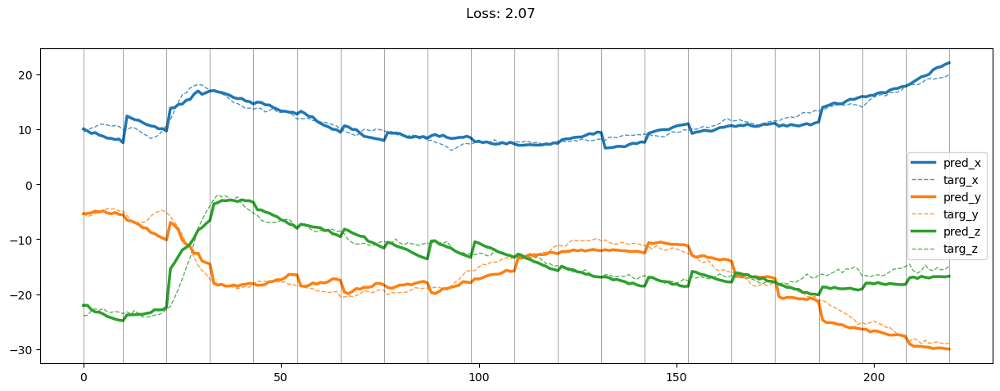

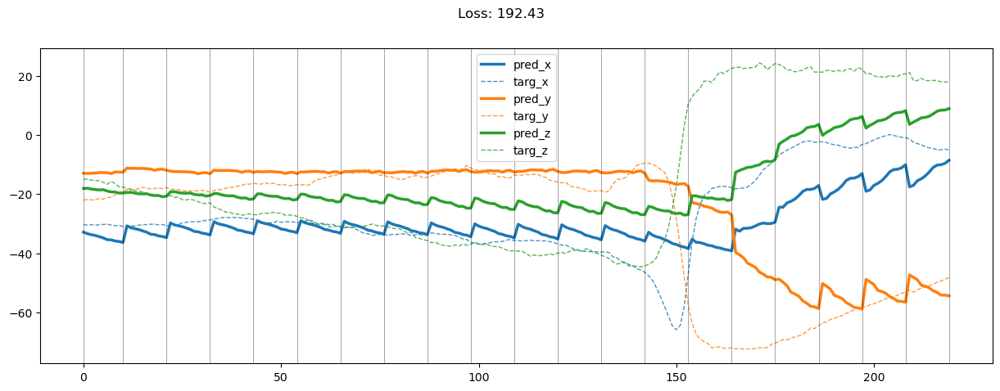

00599: train total loss:  4.943, pred loss:  4.943, valid total loss:  93.711, pred loss:  93.711


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


00600: train total loss:  4.807, pred loss:  4.807, valid total loss:  91.669, pred loss:  91.669


100%|██████████| 7/7 [00:00<00:00, 29.35it/s]


00601: train total loss:  4.723, pred loss:  4.723, valid total loss:  95.793, pred loss:  95.793


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


00602: train total loss:  4.828, pred loss:  4.828, valid total loss:  90.414, pred loss:  90.414


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


00603: train total loss:  4.745, pred loss:  4.745, valid total loss:  95.237, pred loss:  95.237


100%|██████████| 7/7 [00:00<00:00, 30.44it/s]


00604: train total loss:  4.657, pred loss:  4.657, valid total loss:  99.318, pred loss:  99.318


100%|██████████| 7/7 [00:00<00:00, 29.03it/s]


00605: train total loss:  4.879, pred loss:  4.879, valid total loss:  96.259, pred loss:  96.259


100%|██████████| 7/7 [00:00<00:00, 30.62it/s]


00606: train total loss:  4.872, pred loss:  4.872, valid total loss:  94.984, pred loss:  94.984


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


00607: train total loss:  4.711, pred loss:  4.711, valid total loss:  96.553, pred loss:  96.553


100%|██████████| 7/7 [00:00<00:00, 30.22it/s]


00608: train total loss:  4.647, pred loss:  4.647, valid total loss:  102.811, pred loss:  102.811


100%|██████████| 7/7 [00:00<00:00, 28.03it/s]


00609: train total loss:  4.637, pred loss:  4.637, valid total loss:  93.263, pred loss:  93.263


100%|██████████| 7/7 [00:00<00:00, 33.43it/s]


00610: train total loss:  4.609, pred loss:  4.609, valid total loss:  92.846, pred loss:  92.846


100%|██████████| 7/7 [00:00<00:00, 34.21it/s]


00611: train total loss:  4.616, pred loss:  4.616, valid total loss:  97.681, pred loss:  97.681


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


00612: train total loss:  4.617, pred loss:  4.617, valid total loss:  94.421, pred loss:  94.421


100%|██████████| 7/7 [00:00<00:00, 34.10it/s]


00613: train total loss:  4.617, pred loss:  4.617, valid total loss:  95.513, pred loss:  95.513


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


00614: train total loss:  4.579, pred loss:  4.579, valid total loss:  95.220, pred loss:  95.220


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


00615: train total loss:  4.596, pred loss:  4.596, valid total loss:  94.037, pred loss:  94.037


100%|██████████| 7/7 [00:00<00:00, 34.21it/s]


00616: train total loss:  4.816, pred loss:  4.816, valid total loss:  97.400, pred loss:  97.400


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


00617: train total loss:  4.639, pred loss:  4.639, valid total loss:  98.719, pred loss:  98.719


100%|██████████| 7/7 [00:00<00:00, 33.52it/s]


00618: train total loss:  4.637, pred loss:  4.637, valid total loss:  89.302, pred loss:  89.302


100%|██████████| 7/7 [00:00<00:00, 34.17it/s]


00619: train total loss:  4.444, pred loss:  4.444, valid total loss:  96.180, pred loss:  96.180


100%|██████████| 7/7 [00:00<00:00, 33.89it/s]


00620: train total loss:  4.425, pred loss:  4.425, valid total loss:  96.161, pred loss:  96.161


100%|██████████| 7/7 [00:00<00:00, 33.94it/s]


00621: train total loss:  4.527, pred loss:  4.527, valid total loss:  95.414, pred loss:  95.414


100%|██████████| 7/7 [00:00<00:00, 34.25it/s]


00622: train total loss:  4.457, pred loss:  4.457, valid total loss:  95.568, pred loss:  95.568


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


00623: train total loss:  4.430, pred loss:  4.430, valid total loss:  97.919, pred loss:  97.919


100%|██████████| 7/7 [00:00<00:00, 34.15it/s]


00624: train total loss:  4.404, pred loss:  4.404, valid total loss:  96.065, pred loss:  96.065


100%|██████████| 7/7 [00:00<00:00, 34.10it/s]


00625: train total loss:  4.402, pred loss:  4.402, valid total loss:  98.492, pred loss:  98.492


100%|██████████| 7/7 [00:00<00:00, 33.56it/s]


00626: train total loss:  4.491, pred loss:  4.491, valid total loss:  93.662, pred loss:  93.662


100%|██████████| 7/7 [00:00<00:00, 34.11it/s]


00627: train total loss:  4.505, pred loss:  4.505, valid total loss:  90.273, pred loss:  90.273


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


00628: train total loss:  4.437, pred loss:  4.437, valid total loss:  92.837, pred loss:  92.837


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


00629: train total loss:  4.357, pred loss:  4.357, valid total loss:  94.702, pred loss:  94.702


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


00630: train total loss:  4.266, pred loss:  4.266, valid total loss:  94.646, pred loss:  94.646


100%|██████████| 7/7 [00:00<00:00, 30.64it/s]


00631: train total loss:  4.230, pred loss:  4.230, valid total loss:  94.967, pred loss:  94.967


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


00632: train total loss:  4.283, pred loss:  4.283, valid total loss:  94.723, pred loss:  94.723


100%|██████████| 7/7 [00:00<00:00, 28.40it/s]


00633: train total loss:  4.300, pred loss:  4.300, valid total loss:  97.986, pred loss:  97.986


100%|██████████| 7/7 [00:00<00:00, 28.24it/s]


00634: train total loss:  4.369, pred loss:  4.369, valid total loss:  94.385, pred loss:  94.385


100%|██████████| 7/7 [00:00<00:00, 23.55it/s]


00635: train total loss:  4.396, pred loss:  4.396, valid total loss:  93.276, pred loss:  93.276


100%|██████████| 7/7 [00:00<00:00, 33.13it/s]


00636: train total loss:  4.445, pred loss:  4.445, valid total loss:  97.269, pred loss:  97.269


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


00637: train total loss:  4.527, pred loss:  4.527, valid total loss:  99.129, pred loss:  99.129


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


00638: train total loss:  4.376, pred loss:  4.376, valid total loss:  96.526, pred loss:  96.526


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


00639: train total loss:  4.437, pred loss:  4.437, valid total loss:  90.359, pred loss:  90.359


100%|██████████| 7/7 [00:00<00:00, 33.19it/s]


00640: train total loss:  4.360, pred loss:  4.360, valid total loss:  93.389, pred loss:  93.389


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


00641: train total loss:  4.298, pred loss:  4.298, valid total loss:  93.678, pred loss:  93.678


100%|██████████| 7/7 [00:00<00:00, 33.25it/s]


00642: train total loss:  4.327, pred loss:  4.327, valid total loss:  93.836, pred loss:  93.836


100%|██████████| 7/7 [00:00<00:00, 30.37it/s]


00643: train total loss:  4.319, pred loss:  4.319, valid total loss:  92.245, pred loss:  92.245


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


00644: train total loss:  4.292, pred loss:  4.292, valid total loss:  97.763, pred loss:  97.763


100%|██████████| 7/7 [00:00<00:00, 29.44it/s]


00645: train total loss:  4.198, pred loss:  4.198, valid total loss:  98.720, pred loss:  98.720


100%|██████████| 7/7 [00:00<00:00, 30.63it/s]


00646: train total loss:  4.416, pred loss:  4.416, valid total loss:  96.685, pred loss:  96.685


100%|██████████| 7/7 [00:00<00:00, 29.97it/s]


00647: train total loss:  4.369, pred loss:  4.369, valid total loss:  96.433, pred loss:  96.433


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


00648: train total loss:  4.262, pred loss:  4.262, valid total loss:  95.426, pred loss:  95.426


100%|██████████| 7/7 [00:00<00:00, 29.04it/s]


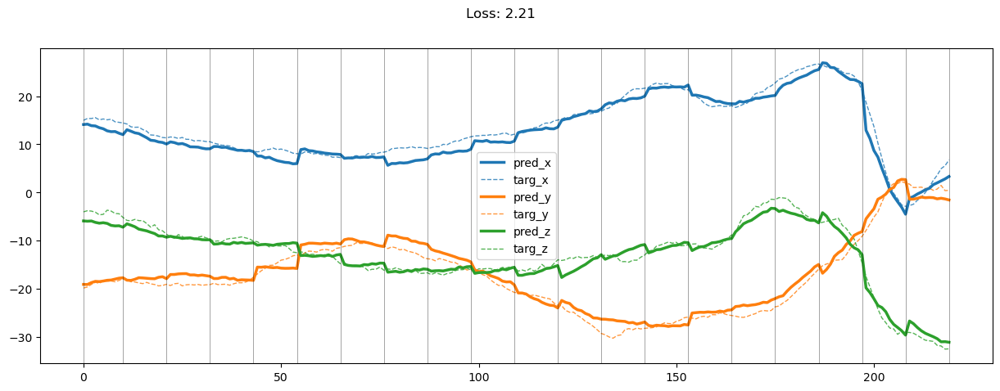

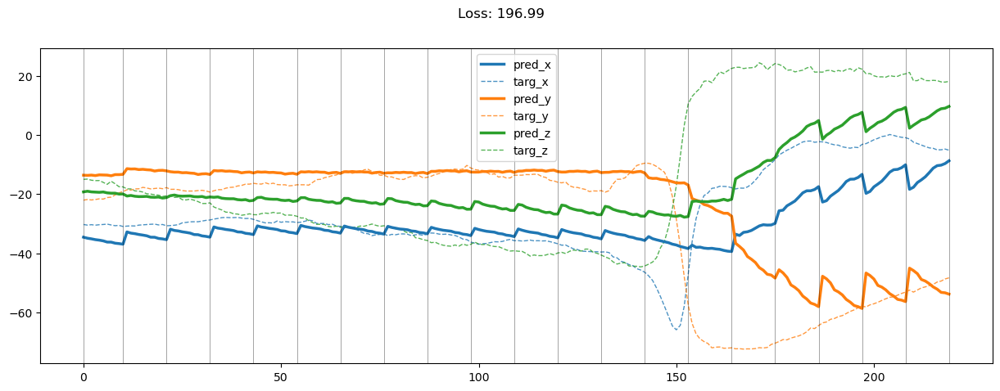

00649: train total loss:  4.440, pred loss:  4.440, valid total loss:  94.084, pred loss:  94.084


100%|██████████| 7/7 [00:00<00:00, 34.17it/s]


00650: train total loss:  4.483, pred loss:  4.483, valid total loss:  98.366, pred loss:  98.366


100%|██████████| 7/7 [00:00<00:00, 33.91it/s]


00651: train total loss:  4.339, pred loss:  4.339, valid total loss:  95.115, pred loss:  95.115


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


00652: train total loss:  4.294, pred loss:  4.294, valid total loss:  95.204, pred loss:  95.204


100%|██████████| 7/7 [00:00<00:00, 33.84it/s]


00653: train total loss:  4.126, pred loss:  4.126, valid total loss:  91.907, pred loss:  91.907


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


00654: train total loss:  4.501, pred loss:  4.501, valid total loss:  93.951, pred loss:  93.951


100%|██████████| 7/7 [00:00<00:00, 29.84it/s]


00655: train total loss:  4.324, pred loss:  4.324, valid total loss:  95.302, pred loss:  95.302


100%|██████████| 7/7 [00:00<00:00, 30.01it/s]


00656: train total loss:  4.183, pred loss:  4.183, valid total loss:  96.297, pred loss:  96.297


100%|██████████| 7/7 [00:00<00:00, 29.89it/s]


00657: train total loss:  4.163, pred loss:  4.163, valid total loss:  92.791, pred loss:  92.791


100%|██████████| 7/7 [00:00<00:00, 29.69it/s]


00658: train total loss:  4.341, pred loss:  4.341, valid total loss:  95.855, pred loss:  95.855


100%|██████████| 7/7 [00:00<00:00, 30.01it/s]


00659: train total loss:  4.382, pred loss:  4.382, valid total loss:  92.413, pred loss:  92.413


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


00660: train total loss:  4.348, pred loss:  4.348, valid total loss:  93.946, pred loss:  93.946


100%|██████████| 7/7 [00:00<00:00, 28.30it/s]


00661: train total loss:  4.171, pred loss:  4.171, valid total loss:  96.099, pred loss:  96.099


100%|██████████| 7/7 [00:00<00:00, 30.54it/s]


00662: train total loss:  4.075, pred loss:  4.075, valid total loss:  94.120, pred loss:  94.120


100%|██████████| 7/7 [00:00<00:00, 29.71it/s]


00663: train total loss:  4.108, pred loss:  4.108, valid total loss:  91.943, pred loss:  91.943


100%|██████████| 7/7 [00:00<00:00, 29.35it/s]


00664: train total loss:  4.122, pred loss:  4.122, valid total loss:  95.005, pred loss:  95.005


100%|██████████| 7/7 [00:00<00:00, 28.33it/s]


00665: train total loss:  4.313, pred loss:  4.313, valid total loss:  95.065, pred loss:  95.065


100%|██████████| 7/7 [00:00<00:00, 29.72it/s]


00666: train total loss:  4.148, pred loss:  4.148, valid total loss:  94.154, pred loss:  94.154


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


00667: train total loss:  4.335, pred loss:  4.335, valid total loss:  99.837, pred loss:  99.837


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00668: train total loss:  4.239, pred loss:  4.239, valid total loss:  96.214, pred loss:  96.214


100%|██████████| 7/7 [00:00<00:00, 29.79it/s]


00669: train total loss:  4.329, pred loss:  4.329, valid total loss:  96.712, pred loss:  96.712


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


00670: train total loss:  4.203, pred loss:  4.203, valid total loss:  97.583, pred loss:  97.583


100%|██████████| 7/7 [00:00<00:00, 30.29it/s]


00671: train total loss:  4.207, pred loss:  4.207, valid total loss:  95.608, pred loss:  95.608


100%|██████████| 7/7 [00:00<00:00, 30.36it/s]


00672: train total loss:  4.097, pred loss:  4.097, valid total loss:  97.593, pred loss:  97.593


100%|██████████| 7/7 [00:00<00:00, 31.90it/s]


00673: train total loss:  3.998, pred loss:  3.998, valid total loss:  96.726, pred loss:  96.726


100%|██████████| 7/7 [00:00<00:00, 29.78it/s]


00674: train total loss:  4.105, pred loss:  4.105, valid total loss:  100.056, pred loss:  100.056


100%|██████████| 7/7 [00:00<00:00, 30.01it/s]


00675: train total loss:  4.019, pred loss:  4.019, valid total loss:  94.799, pred loss:  94.799


100%|██████████| 7/7 [00:00<00:00, 29.93it/s]


00676: train total loss:  3.926, pred loss:  3.926, valid total loss:  97.568, pred loss:  97.568


100%|██████████| 7/7 [00:00<00:00, 28.63it/s]


00677: train total loss:  4.034, pred loss:  4.034, valid total loss:  96.676, pred loss:  96.676


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


00678: train total loss:  4.103, pred loss:  4.103, valid total loss:  95.821, pred loss:  95.821


100%|██████████| 7/7 [00:00<00:00, 31.48it/s]


00679: train total loss:  4.072, pred loss:  4.072, valid total loss:  91.613, pred loss:  91.613


100%|██████████| 7/7 [00:00<00:00, 31.42it/s]


00680: train total loss:  4.120, pred loss:  4.120, valid total loss:  92.613, pred loss:  92.613


100%|██████████| 7/7 [00:00<00:00, 29.69it/s]


00681: train total loss:  4.137, pred loss:  4.137, valid total loss:  96.454, pred loss:  96.454


100%|██████████| 7/7 [00:00<00:00, 29.39it/s]


00682: train total loss:  4.066, pred loss:  4.066, valid total loss:  94.470, pred loss:  94.470


100%|██████████| 7/7 [00:00<00:00, 28.63it/s]


00683: train total loss:  4.087, pred loss:  4.087, valid total loss:  97.476, pred loss:  97.476


100%|██████████| 7/7 [00:00<00:00, 30.62it/s]


00684: train total loss:  3.871, pred loss:  3.871, valid total loss:  98.956, pred loss:  98.956


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


00685: train total loss:  4.045, pred loss:  4.045, valid total loss:  93.618, pred loss:  93.618


100%|██████████| 7/7 [00:00<00:00, 29.63it/s]


00686: train total loss:  3.982, pred loss:  3.982, valid total loss:  92.259, pred loss:  92.259


100%|██████████| 7/7 [00:00<00:00, 30.58it/s]


00687: train total loss:  4.041, pred loss:  4.041, valid total loss:  93.529, pred loss:  93.529


100%|██████████| 7/7 [00:00<00:00, 29.68it/s]


00688: train total loss:  4.157, pred loss:  4.157, valid total loss:  98.554, pred loss:  98.554


100%|██████████| 7/7 [00:00<00:00, 30.57it/s]


00689: train total loss:  4.245, pred loss:  4.245, valid total loss:  97.056, pred loss:  97.056


100%|██████████| 7/7 [00:00<00:00, 28.01it/s]


00690: train total loss:  4.106, pred loss:  4.106, valid total loss:  97.043, pred loss:  97.043


100%|██████████| 7/7 [00:00<00:00, 29.08it/s]


00691: train total loss:  4.136, pred loss:  4.136, valid total loss:  99.894, pred loss:  99.894


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


00692: train total loss:  4.076, pred loss:  4.076, valid total loss:  100.415, pred loss:  100.415


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


00693: train total loss:  3.985, pred loss:  3.985, valid total loss:  98.244, pred loss:  98.244


100%|██████████| 7/7 [00:00<00:00, 30.63it/s]


00694: train total loss:  3.982, pred loss:  3.982, valid total loss:  97.141, pred loss:  97.141


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


00695: train total loss:  4.005, pred loss:  4.005, valid total loss:  99.355, pred loss:  99.355


100%|██████████| 7/7 [00:00<00:00, 31.21it/s]


00696: train total loss:  3.909, pred loss:  3.909, valid total loss:  99.889, pred loss:  99.889


100%|██████████| 7/7 [00:00<00:00, 29.07it/s]


00697: train total loss:  4.087, pred loss:  4.087, valid total loss:  96.671, pred loss:  96.671


100%|██████████| 7/7 [00:00<00:00, 29.02it/s]


00698: train total loss:  4.027, pred loss:  4.027, valid total loss:  102.150, pred loss:  102.150


100%|██████████| 7/7 [00:00<00:00, 33.20it/s]


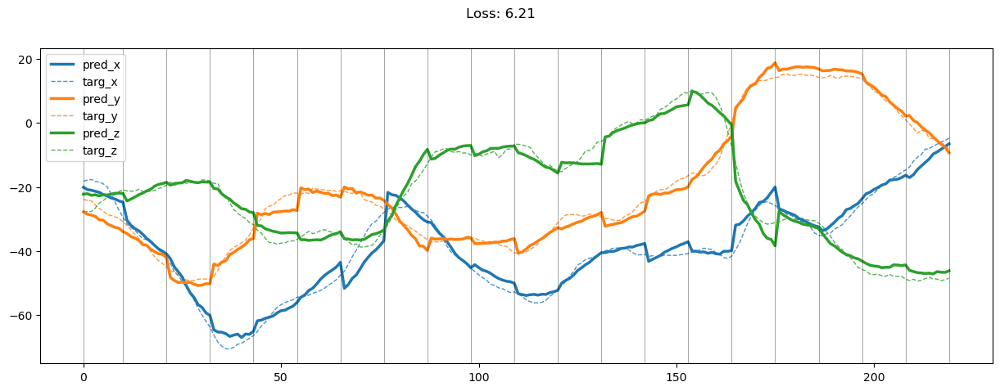

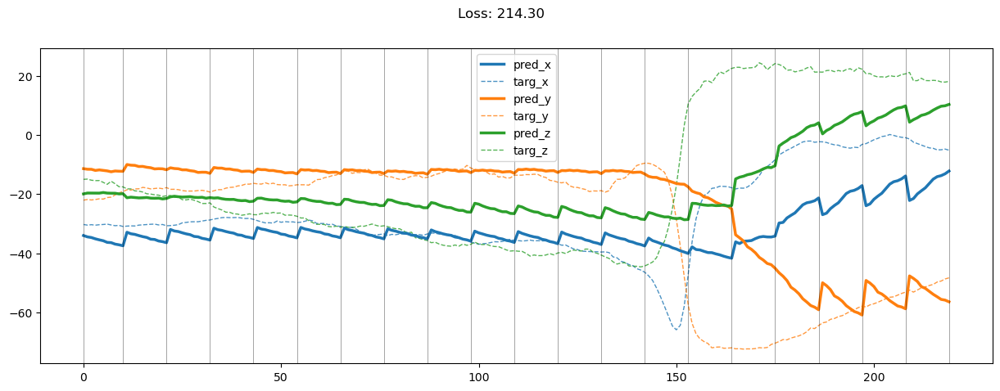

00699: train total loss:  4.140, pred loss:  4.140, valid total loss:  103.368, pred loss:  103.368


100%|██████████| 7/7 [00:00<00:00, 28.48it/s]


00700: train total loss:  4.048, pred loss:  4.048, valid total loss:  100.678, pred loss:  100.678


100%|██████████| 7/7 [00:00<00:00, 31.31it/s]


00701: train total loss:  3.912, pred loss:  3.912, valid total loss:  102.381, pred loss:  102.381


100%|██████████| 7/7 [00:00<00:00, 33.98it/s]


00702: train total loss:  3.886, pred loss:  3.886, valid total loss:  97.236, pred loss:  97.236


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


00703: train total loss:  3.973, pred loss:  3.973, valid total loss:  96.509, pred loss:  96.509


100%|██████████| 7/7 [00:00<00:00, 34.01it/s]


00704: train total loss:  3.931, pred loss:  3.931, valid total loss:  101.703, pred loss:  101.703


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


00705: train total loss:  4.063, pred loss:  4.063, valid total loss:  102.708, pred loss:  102.708


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


00706: train total loss:  3.883, pred loss:  3.883, valid total loss:  103.852, pred loss:  103.852


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


00707: train total loss:  3.848, pred loss:  3.848, valid total loss:  103.700, pred loss:  103.700


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


00708: train total loss:  3.843, pred loss:  3.843, valid total loss:  101.605, pred loss:  101.605


100%|██████████| 7/7 [00:00<00:00, 34.10it/s]


00709: train total loss:  3.785, pred loss:  3.785, valid total loss:  103.737, pred loss:  103.737


100%|██████████| 7/7 [00:00<00:00, 33.88it/s]


00710: train total loss:  3.783, pred loss:  3.783, valid total loss:  101.616, pred loss:  101.616


100%|██████████| 7/7 [00:00<00:00, 33.82it/s]


00711: train total loss:  4.008, pred loss:  4.008, valid total loss:  100.588, pred loss:  100.588


100%|██████████| 7/7 [00:00<00:00, 34.01it/s]


00712: train total loss:  3.752, pred loss:  3.752, valid total loss:  104.406, pred loss:  104.406


100%|██████████| 7/7 [00:00<00:00, 34.09it/s]


00713: train total loss:  3.876, pred loss:  3.876, valid total loss:  108.205, pred loss:  108.205


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


00714: train total loss:  3.930, pred loss:  3.930, valid total loss:  99.465, pred loss:  99.465


100%|██████████| 7/7 [00:00<00:00, 34.14it/s]


00715: train total loss:  3.824, pred loss:  3.824, valid total loss:  98.285, pred loss:  98.285


100%|██████████| 7/7 [00:00<00:00, 31.80it/s]


00716: train total loss:  3.910, pred loss:  3.910, valid total loss:  107.028, pred loss:  107.028


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


00717: train total loss:  3.757, pred loss:  3.757, valid total loss:  102.157, pred loss:  102.157


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


00718: train total loss:  3.874, pred loss:  3.874, valid total loss:  98.127, pred loss:  98.127


100%|██████████| 7/7 [00:00<00:00, 27.45it/s]


00719: train total loss:  3.898, pred loss:  3.898, valid total loss:  101.771, pred loss:  101.771


100%|██████████| 7/7 [00:00<00:00, 29.08it/s]


00720: train total loss:  3.684, pred loss:  3.684, valid total loss:  101.266, pred loss:  101.266


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


00721: train total loss:  3.692, pred loss:  3.692, valid total loss:  100.249, pred loss:  100.249


100%|██████████| 7/7 [00:00<00:00, 33.85it/s]


00722: train total loss:  3.739, pred loss:  3.739, valid total loss:  99.947, pred loss:  99.947


100%|██████████| 7/7 [00:00<00:00, 33.53it/s]


00723: train total loss:  3.676, pred loss:  3.676, valid total loss:  97.898, pred loss:  97.898


100%|██████████| 7/7 [00:00<00:00, 28.02it/s]


00724: train total loss:  3.698, pred loss:  3.698, valid total loss:  101.502, pred loss:  101.502


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


00725: train total loss:  3.691, pred loss:  3.691, valid total loss:  100.637, pred loss:  100.637


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


00726: train total loss:  3.756, pred loss:  3.756, valid total loss:  100.708, pred loss:  100.708


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


00727: train total loss:  3.681, pred loss:  3.681, valid total loss:  103.240, pred loss:  103.240


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


00728: train total loss:  3.636, pred loss:  3.636, valid total loss:  103.054, pred loss:  103.054


100%|██████████| 7/7 [00:00<00:00, 33.79it/s]


00729: train total loss:  3.627, pred loss:  3.627, valid total loss:  102.361, pred loss:  102.361


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


00730: train total loss:  3.588, pred loss:  3.588, valid total loss:  104.679, pred loss:  104.679


100%|██████████| 7/7 [00:00<00:00, 33.98it/s]


00731: train total loss:  3.608, pred loss:  3.608, valid total loss:  99.046, pred loss:  99.046


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


00732: train total loss:  3.622, pred loss:  3.622, valid total loss:  100.864, pred loss:  100.864


100%|██████████| 7/7 [00:00<00:00, 33.23it/s]


00733: train total loss:  3.677, pred loss:  3.677, valid total loss:  98.027, pred loss:  98.027


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


00734: train total loss:  3.718, pred loss:  3.718, valid total loss:  97.564, pred loss:  97.564


100%|██████████| 7/7 [00:00<00:00, 33.08it/s]


00735: train total loss:  3.550, pred loss:  3.550, valid total loss:  101.840, pred loss:  101.840


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


00736: train total loss:  3.498, pred loss:  3.498, valid total loss:  102.499, pred loss:  102.499


100%|██████████| 7/7 [00:00<00:00, 32.19it/s]


00737: train total loss:  3.572, pred loss:  3.572, valid total loss:  101.484, pred loss:  101.484


100%|██████████| 7/7 [00:00<00:00, 29.43it/s]


00738: train total loss:  3.592, pred loss:  3.592, valid total loss:  100.547, pred loss:  100.547


100%|██████████| 7/7 [00:00<00:00, 29.92it/s]


00739: train total loss:  3.652, pred loss:  3.652, valid total loss:  99.740, pred loss:  99.740


100%|██████████| 7/7 [00:00<00:00, 30.34it/s]


00740: train total loss:  3.764, pred loss:  3.764, valid total loss:  106.790, pred loss:  106.790


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


00741: train total loss:  3.964, pred loss:  3.964, valid total loss:  104.246, pred loss:  104.246


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


00742: train total loss:  3.878, pred loss:  3.878, valid total loss:  94.532, pred loss:  94.532


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


00743: train total loss:  3.793, pred loss:  3.793, valid total loss:  97.884, pred loss:  97.884


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


00744: train total loss:  3.744, pred loss:  3.744, valid total loss:  96.309, pred loss:  96.309


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


00745: train total loss:  3.835, pred loss:  3.835, valid total loss:  95.007, pred loss:  95.007


100%|██████████| 7/7 [00:00<00:00, 33.95it/s]


00746: train total loss:  3.732, pred loss:  3.732, valid total loss:  98.130, pred loss:  98.130


100%|██████████| 7/7 [00:00<00:00, 33.71it/s]


00747: train total loss:  3.692, pred loss:  3.692, valid total loss:  97.495, pred loss:  97.495


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


00748: train total loss:  3.752, pred loss:  3.752, valid total loss:  99.738, pred loss:  99.738


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


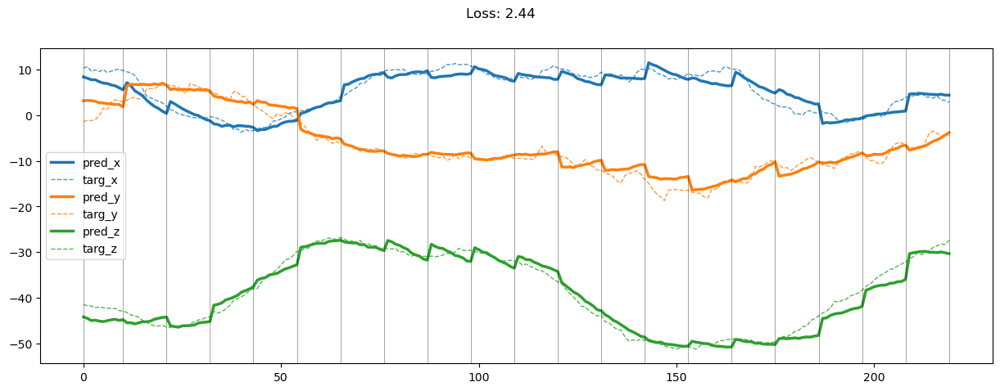

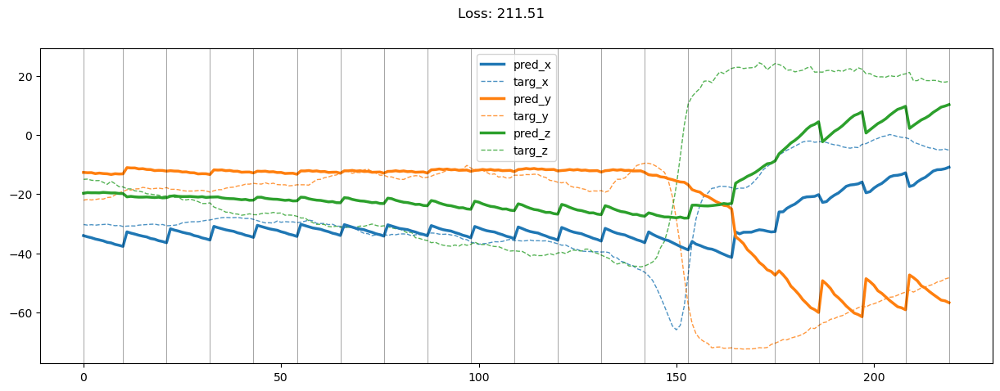

00749: train total loss:  3.599, pred loss:  3.599, valid total loss:  100.936, pred loss:  100.936


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


00750: train total loss:  3.822, pred loss:  3.822, valid total loss:  102.164, pred loss:  102.164


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


00751: train total loss:  3.616, pred loss:  3.616, valid total loss:  104.828, pred loss:  104.828


100%|██████████| 7/7 [00:00<00:00, 34.01it/s]


00752: train total loss:  3.540, pred loss:  3.540, valid total loss:  101.622, pred loss:  101.622


100%|██████████| 7/7 [00:00<00:00, 33.43it/s]


00753: train total loss:  3.586, pred loss:  3.586, valid total loss:  100.193, pred loss:  100.193


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


00754: train total loss:  3.619, pred loss:  3.619, valid total loss:  98.005, pred loss:  98.005


100%|██████████| 7/7 [00:00<00:00, 33.26it/s]


00755: train total loss:  3.538, pred loss:  3.538, valid total loss:  99.581, pred loss:  99.581


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


00756: train total loss:  3.505, pred loss:  3.505, valid total loss:  97.022, pred loss:  97.022


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


00757: train total loss:  3.606, pred loss:  3.606, valid total loss:  101.127, pred loss:  101.127


100%|██████████| 7/7 [00:00<00:00, 31.68it/s]


00758: train total loss:  3.618, pred loss:  3.618, valid total loss:  103.674, pred loss:  103.674


100%|██████████| 7/7 [00:00<00:00, 29.38it/s]


00759: train total loss:  3.578, pred loss:  3.578, valid total loss:  95.864, pred loss:  95.864


100%|██████████| 7/7 [00:00<00:00, 28.19it/s]


00760: train total loss:  3.477, pred loss:  3.477, valid total loss:  96.319, pred loss:  96.319


100%|██████████| 7/7 [00:00<00:00, 33.12it/s]


00761: train total loss:  3.598, pred loss:  3.598, valid total loss:  100.079, pred loss:  100.079


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


00762: train total loss:  3.502, pred loss:  3.502, valid total loss:  98.158, pred loss:  98.158


100%|██████████| 7/7 [00:00<00:00, 34.20it/s]


00763: train total loss:  3.556, pred loss:  3.556, valid total loss:  95.599, pred loss:  95.599


100%|██████████| 7/7 [00:00<00:00, 33.21it/s]


00764: train total loss:  3.611, pred loss:  3.611, valid total loss:  98.101, pred loss:  98.101


100%|██████████| 7/7 [00:00<00:00, 28.75it/s]


00765: train total loss:  3.546, pred loss:  3.546, valid total loss:  104.346, pred loss:  104.346


100%|██████████| 7/7 [00:00<00:00, 32.39it/s]


00766: train total loss:  3.509, pred loss:  3.509, valid total loss:  98.998, pred loss:  98.998


100%|██████████| 7/7 [00:00<00:00, 33.35it/s]


00767: train total loss:  3.460, pred loss:  3.460, valid total loss:  97.212, pred loss:  97.212


100%|██████████| 7/7 [00:00<00:00, 33.31it/s]


00768: train total loss:  3.524, pred loss:  3.524, valid total loss:  103.793, pred loss:  103.793


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


00769: train total loss:  3.587, pred loss:  3.587, valid total loss:  95.643, pred loss:  95.643


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


00770: train total loss:  3.482, pred loss:  3.482, valid total loss:  100.474, pred loss:  100.474


100%|██████████| 7/7 [00:00<00:00, 34.04it/s]


00771: train total loss:  3.466, pred loss:  3.466, valid total loss:  101.438, pred loss:  101.438


100%|██████████| 7/7 [00:00<00:00, 33.03it/s]


00772: train total loss:  3.599, pred loss:  3.599, valid total loss:  94.609, pred loss:  94.609


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


00773: train total loss:  3.421, pred loss:  3.421, valid total loss:  97.964, pred loss:  97.964


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


00774: train total loss:  3.519, pred loss:  3.519, valid total loss:  102.923, pred loss:  102.923


100%|██████████| 7/7 [00:00<00:00, 33.28it/s]


00775: train total loss:  3.615, pred loss:  3.615, valid total loss:  102.752, pred loss:  102.752


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


00776: train total loss:  3.525, pred loss:  3.525, valid total loss:  96.672, pred loss:  96.672


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


00777: train total loss:  3.624, pred loss:  3.624, valid total loss:  98.541, pred loss:  98.541


100%|██████████| 7/7 [00:00<00:00, 29.71it/s]


00778: train total loss:  3.461, pred loss:  3.461, valid total loss:  98.987, pred loss:  98.987


100%|██████████| 7/7 [00:00<00:00, 29.62it/s]


00779: train total loss:  3.417, pred loss:  3.417, valid total loss:  95.686, pred loss:  95.686


100%|██████████| 7/7 [00:00<00:00, 27.32it/s]


00780: train total loss:  3.393, pred loss:  3.393, valid total loss:  96.438, pred loss:  96.438


100%|██████████| 7/7 [00:00<00:00, 29.70it/s]


00781: train total loss:  3.416, pred loss:  3.416, valid total loss:  94.800, pred loss:  94.800


100%|██████████| 7/7 [00:00<00:00, 30.48it/s]


00782: train total loss:  3.451, pred loss:  3.451, valid total loss:  99.245, pred loss:  99.245


100%|██████████| 7/7 [00:00<00:00, 27.63it/s]


00783: train total loss:  3.403, pred loss:  3.403, valid total loss:  98.637, pred loss:  98.637


100%|██████████| 7/7 [00:00<00:00, 28.28it/s]


00784: train total loss:  3.481, pred loss:  3.481, valid total loss:  102.147, pred loss:  102.147


100%|██████████| 7/7 [00:00<00:00, 23.31it/s]


00785: train total loss:  3.392, pred loss:  3.392, valid total loss:  99.430, pred loss:  99.430


100%|██████████| 7/7 [00:00<00:00, 28.71it/s]


00786: train total loss:  3.454, pred loss:  3.454, valid total loss:  95.310, pred loss:  95.310


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


00787: train total loss:  3.464, pred loss:  3.464, valid total loss:  100.629, pred loss:  100.629


100%|██████████| 7/7 [00:00<00:00, 32.12it/s]


00788: train total loss:  3.328, pred loss:  3.328, valid total loss:  97.124, pred loss:  97.124


100%|██████████| 7/7 [00:00<00:00, 33.20it/s]


00789: train total loss:  3.430, pred loss:  3.430, valid total loss:  94.791, pred loss:  94.791


100%|██████████| 7/7 [00:00<00:00, 33.09it/s]


00790: train total loss:  3.416, pred loss:  3.416, valid total loss:  97.224, pred loss:  97.224


100%|██████████| 7/7 [00:00<00:00, 32.98it/s]


00791: train total loss:  3.400, pred loss:  3.400, valid total loss:  95.484, pred loss:  95.484


100%|██████████| 7/7 [00:00<00:00, 33.79it/s]


00792: train total loss:  3.392, pred loss:  3.392, valid total loss:  97.554, pred loss:  97.554


100%|██████████| 7/7 [00:00<00:00, 33.34it/s]


00793: train total loss:  3.438, pred loss:  3.438, valid total loss:  100.017, pred loss:  100.017


100%|██████████| 7/7 [00:00<00:00, 31.37it/s]


00794: train total loss:  3.713, pred loss:  3.713, valid total loss:  100.536, pred loss:  100.536


100%|██████████| 7/7 [00:00<00:00, 33.30it/s]


00795: train total loss:  3.455, pred loss:  3.455, valid total loss:  98.163, pred loss:  98.163


100%|██████████| 7/7 [00:00<00:00, 33.07it/s]


00796: train total loss:  3.555, pred loss:  3.555, valid total loss:  98.368, pred loss:  98.368


100%|██████████| 7/7 [00:00<00:00, 33.27it/s]


00797: train total loss:  3.316, pred loss:  3.316, valid total loss:  95.003, pred loss:  95.003


100%|██████████| 7/7 [00:00<00:00, 31.00it/s]


00798: train total loss:  3.479, pred loss:  3.479, valid total loss:  99.182, pred loss:  99.182


100%|██████████| 7/7 [00:00<00:00, 29.48it/s]


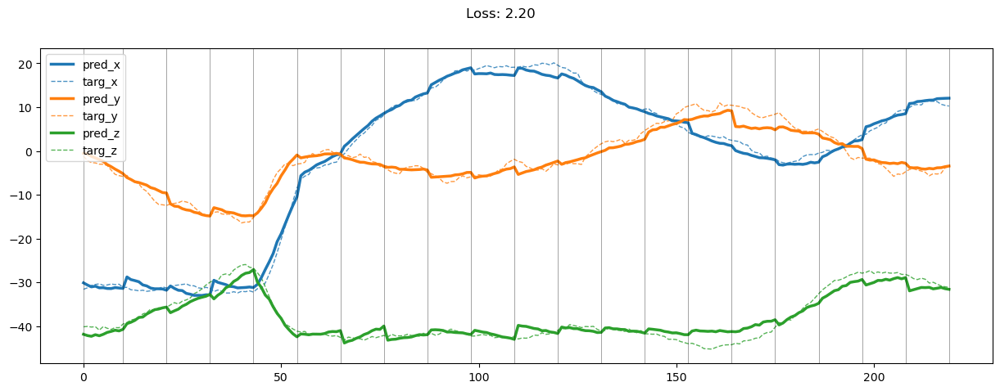

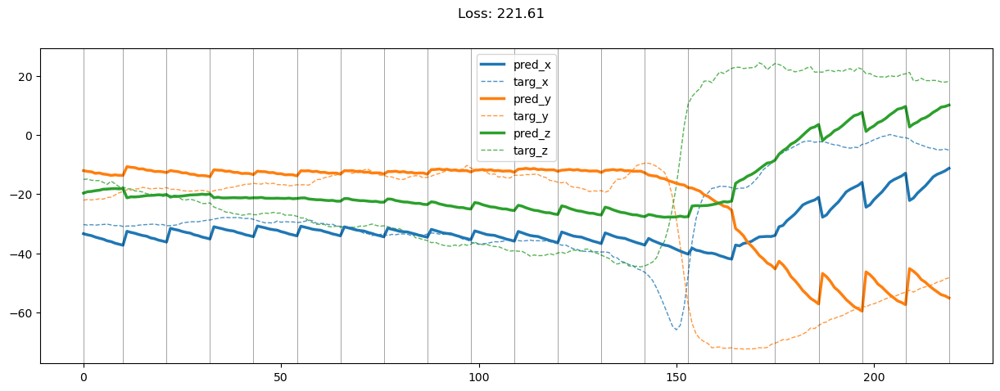

00799: train total loss:  3.328, pred loss:  3.328, valid total loss:  96.760, pred loss:  96.760


100%|██████████| 7/7 [00:00<00:00, 28.54it/s]


00800: train total loss:  3.326, pred loss:  3.326, valid total loss:  95.547, pred loss:  95.547


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


00801: train total loss:  3.285, pred loss:  3.285, valid total loss:  101.137, pred loss:  101.137


100%|██████████| 7/7 [00:00<00:00, 33.34it/s]


00802: train total loss:  3.291, pred loss:  3.291, valid total loss:  100.142, pred loss:  100.142


100%|██████████| 7/7 [00:00<00:00, 22.46it/s]


00803: train total loss:  3.426, pred loss:  3.426, valid total loss:  100.919, pred loss:  100.919


100%|██████████| 7/7 [00:00<00:00, 28.38it/s]


00804: train total loss:  3.237, pred loss:  3.237, valid total loss:  100.342, pred loss:  100.342


100%|██████████| 7/7 [00:00<00:00, 27.49it/s]


00805: train total loss:  3.295, pred loss:  3.295, valid total loss:  101.093, pred loss:  101.093


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


00806: train total loss:  3.146, pred loss:  3.146, valid total loss:  96.290, pred loss:  96.290


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


00807: train total loss:  3.367, pred loss:  3.367, valid total loss:  96.853, pred loss:  96.853


100%|██████████| 7/7 [00:00<00:00, 24.19it/s]


00808: train total loss:  3.262, pred loss:  3.262, valid total loss:  101.140, pred loss:  101.140


100%|██████████| 7/7 [00:00<00:00, 28.73it/s]


00809: train total loss:  3.332, pred loss:  3.332, valid total loss:  96.475, pred loss:  96.475


100%|██████████| 7/7 [00:00<00:00, 29.60it/s]


00810: train total loss:  3.249, pred loss:  3.249, valid total loss:  101.060, pred loss:  101.060


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


00811: train total loss:  3.252, pred loss:  3.252, valid total loss:  104.669, pred loss:  104.669


100%|██████████| 7/7 [00:00<00:00, 30.28it/s]


00812: train total loss:  3.292, pred loss:  3.292, valid total loss:  98.644, pred loss:  98.644


100%|██████████| 7/7 [00:00<00:00, 29.92it/s]


00813: train total loss:  3.305, pred loss:  3.305, valid total loss:  100.405, pred loss:  100.405


100%|██████████| 7/7 [00:00<00:00, 34.31it/s]


00814: train total loss:  3.197, pred loss:  3.197, valid total loss:  105.111, pred loss:  105.111


100%|██████████| 7/7 [00:00<00:00, 33.18it/s]


00815: train total loss:  3.232, pred loss:  3.232, valid total loss:  99.230, pred loss:  99.230


100%|██████████| 7/7 [00:00<00:00, 22.54it/s]


00816: train total loss:  3.283, pred loss:  3.283, valid total loss:  102.166, pred loss:  102.166


100%|██████████| 7/7 [00:00<00:00, 30.42it/s]


00817: train total loss:  3.207, pred loss:  3.207, valid total loss:  97.059, pred loss:  97.059


100%|██████████| 7/7 [00:00<00:00, 30.52it/s]


00818: train total loss:  3.299, pred loss:  3.299, valid total loss:  102.533, pred loss:  102.533


100%|██████████| 7/7 [00:00<00:00, 27.12it/s]


00819: train total loss:  3.365, pred loss:  3.365, valid total loss:  99.537, pred loss:  99.537


100%|██████████| 7/7 [00:00<00:00, 29.18it/s]


00820: train total loss:  3.274, pred loss:  3.274, valid total loss:  99.357, pred loss:  99.357


100%|██████████| 7/7 [00:00<00:00, 30.35it/s]


00821: train total loss:  3.247, pred loss:  3.247, valid total loss:  101.060, pred loss:  101.060


100%|██████████| 7/7 [00:00<00:00, 30.59it/s]


00822: train total loss:  3.115, pred loss:  3.115, valid total loss:  101.398, pred loss:  101.398


100%|██████████| 7/7 [00:00<00:00, 33.19it/s]


00823: train total loss:  3.180, pred loss:  3.180, valid total loss:  99.909, pred loss:  99.909


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


00824: train total loss:  3.184, pred loss:  3.184, valid total loss:  99.242, pred loss:  99.242


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


00825: train total loss:  3.254, pred loss:  3.254, valid total loss:  100.897, pred loss:  100.897


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


00826: train total loss:  3.141, pred loss:  3.141, valid total loss:  101.272, pred loss:  101.272


100%|██████████| 7/7 [00:00<00:00, 30.17it/s]


00827: train total loss:  3.223, pred loss:  3.223, valid total loss:  102.868, pred loss:  102.868


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


00828: train total loss:  3.250, pred loss:  3.250, valid total loss:  103.591, pred loss:  103.591


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


00829: train total loss:  3.269, pred loss:  3.269, valid total loss:  108.117, pred loss:  108.117


100%|██████████| 7/7 [00:00<00:00, 33.47it/s]


00830: train total loss:  3.438, pred loss:  3.438, valid total loss:  99.485, pred loss:  99.485


100%|██████████| 7/7 [00:00<00:00, 31.73it/s]


00831: train total loss:  3.131, pred loss:  3.131, valid total loss:  98.356, pred loss:  98.356


100%|██████████| 7/7 [00:00<00:00, 33.30it/s]


00832: train total loss:  3.183, pred loss:  3.183, valid total loss:  104.271, pred loss:  104.271


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


00833: train total loss:  3.099, pred loss:  3.099, valid total loss:  100.736, pred loss:  100.736


100%|██████████| 7/7 [00:00<00:00, 33.05it/s]


00834: train total loss:  3.248, pred loss:  3.248, valid total loss:  99.453, pred loss:  99.453


100%|██████████| 7/7 [00:00<00:00, 32.99it/s]


00835: train total loss:  3.115, pred loss:  3.115, valid total loss:  98.745, pred loss:  98.745


100%|██████████| 7/7 [00:00<00:00, 33.17it/s]


00836: train total loss:  3.167, pred loss:  3.167, valid total loss:  99.691, pred loss:  99.691


100%|██████████| 7/7 [00:00<00:00, 33.04it/s]


00837: train total loss:  3.120, pred loss:  3.120, valid total loss:  102.840, pred loss:  102.840


100%|██████████| 7/7 [00:00<00:00, 33.71it/s]


00838: train total loss:  3.061, pred loss:  3.061, valid total loss:  104.909, pred loss:  104.909


100%|██████████| 7/7 [00:00<00:00, 33.18it/s]


00839: train total loss:  3.172, pred loss:  3.172, valid total loss:  105.917, pred loss:  105.917


100%|██████████| 7/7 [00:00<00:00, 26.22it/s]


00840: train total loss:  3.250, pred loss:  3.250, valid total loss:  105.888, pred loss:  105.888


100%|██████████| 7/7 [00:00<00:00, 29.10it/s]


00841: train total loss:  3.306, pred loss:  3.306, valid total loss:  106.425, pred loss:  106.425


100%|██████████| 7/7 [00:00<00:00, 29.28it/s]


00842: train total loss:  3.159, pred loss:  3.159, valid total loss:  104.753, pred loss:  104.753


100%|██████████| 7/7 [00:00<00:00, 29.15it/s]


00843: train total loss:  3.337, pred loss:  3.337, valid total loss:  106.029, pred loss:  106.029


100%|██████████| 7/7 [00:00<00:00, 30.39it/s]


00844: train total loss:  3.472, pred loss:  3.472, valid total loss:  99.674, pred loss:  99.674


100%|██████████| 7/7 [00:00<00:00, 29.71it/s]


00845: train total loss:  3.331, pred loss:  3.331, valid total loss:  99.336, pred loss:  99.336


100%|██████████| 7/7 [00:00<00:00, 30.40it/s]


00846: train total loss:  3.315, pred loss:  3.315, valid total loss:  96.569, pred loss:  96.569


100%|██████████| 7/7 [00:00<00:00, 30.23it/s]


00847: train total loss:  3.332, pred loss:  3.332, valid total loss:  98.687, pred loss:  98.687


100%|██████████| 7/7 [00:00<00:00, 28.75it/s]


00848: train total loss:  3.501, pred loss:  3.501, valid total loss:  96.481, pred loss:  96.481


100%|██████████| 7/7 [00:00<00:00, 30.63it/s]


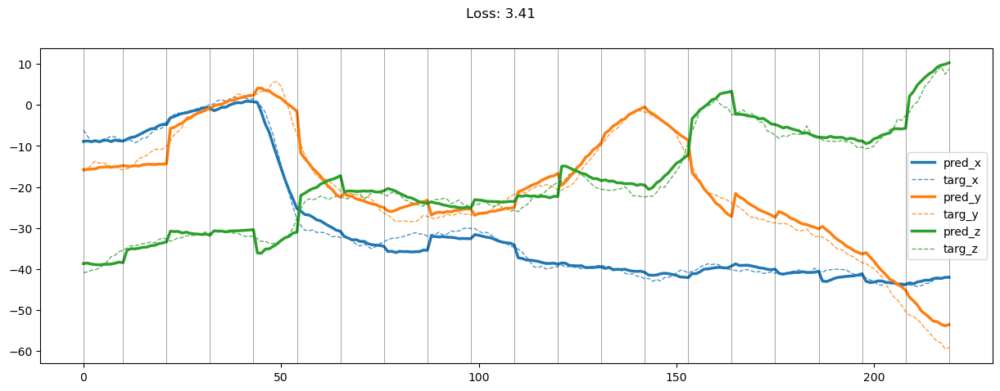

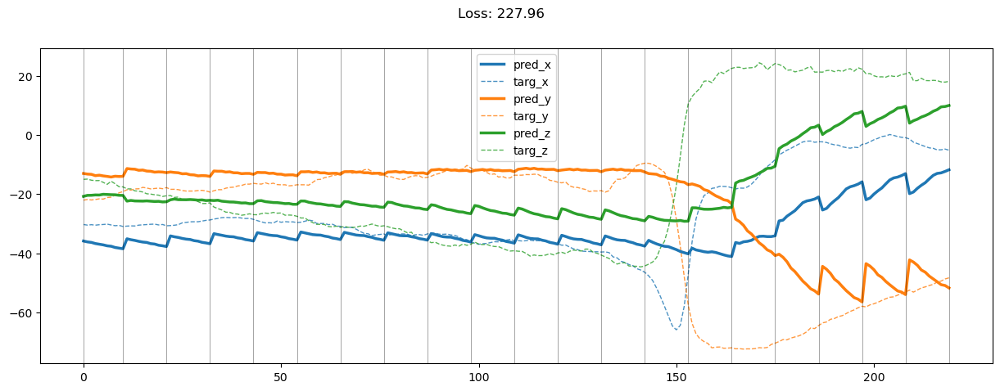

00849: train total loss:  3.459, pred loss:  3.459, valid total loss:  96.286, pred loss:  96.286


100%|██████████| 7/7 [00:00<00:00, 29.48it/s]


00850: train total loss:  3.277, pred loss:  3.277, valid total loss:  98.808, pred loss:  98.808


100%|██████████| 7/7 [00:00<00:00, 29.09it/s]


00851: train total loss:  3.238, pred loss:  3.238, valid total loss:  96.016, pred loss:  96.016


100%|██████████| 7/7 [00:00<00:00, 27.64it/s]


00852: train total loss:  3.248, pred loss:  3.248, valid total loss:  98.426, pred loss:  98.426


100%|██████████| 7/7 [00:00<00:00, 23.88it/s]


00853: train total loss:  3.292, pred loss:  3.292, valid total loss:  99.140, pred loss:  99.140


100%|██████████| 7/7 [00:00<00:00, 22.61it/s]


00854: train total loss:  3.343, pred loss:  3.343, valid total loss:  95.970, pred loss:  95.970


100%|██████████| 7/7 [00:00<00:00, 30.44it/s]


00855: train total loss:  3.202, pred loss:  3.202, valid total loss:  104.432, pred loss:  104.432


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


00856: train total loss:  3.274, pred loss:  3.274, valid total loss:  97.771, pred loss:  97.771


100%|██████████| 7/7 [00:00<00:00, 29.39it/s]


00857: train total loss:  3.122, pred loss:  3.122, valid total loss:  98.049, pred loss:  98.049


100%|██████████| 7/7 [00:00<00:00, 27.73it/s]


00858: train total loss:  3.055, pred loss:  3.055, valid total loss:  103.194, pred loss:  103.194


100%|██████████| 7/7 [00:00<00:00, 28.52it/s]


00859: train total loss:  3.028, pred loss:  3.028, valid total loss:  101.455, pred loss:  101.455


100%|██████████| 7/7 [00:00<00:00, 33.93it/s]


00860: train total loss:  3.032, pred loss:  3.032, valid total loss:  100.819, pred loss:  100.819


100%|██████████| 7/7 [00:00<00:00, 34.07it/s]


00861: train total loss:  2.995, pred loss:  2.995, valid total loss:  98.169, pred loss:  98.169


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


00862: train total loss:  3.014, pred loss:  3.014, valid total loss:  102.390, pred loss:  102.390


100%|██████████| 7/7 [00:00<00:00, 23.18it/s]


00863: train total loss:  2.967, pred loss:  2.967, valid total loss:  101.571, pred loss:  101.571


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


00864: train total loss:  3.111, pred loss:  3.111, valid total loss:  100.245, pred loss:  100.245


100%|██████████| 7/7 [00:00<00:00, 28.06it/s]


00865: train total loss:  3.100, pred loss:  3.100, valid total loss:  93.189, pred loss:  93.189


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


00866: train total loss:  3.180, pred loss:  3.180, valid total loss:  102.823, pred loss:  102.823


100%|██████████| 7/7 [00:00<00:00, 33.87it/s]


00867: train total loss:  3.219, pred loss:  3.219, valid total loss:  101.256, pred loss:  101.256


100%|██████████| 7/7 [00:00<00:00, 33.26it/s]


00868: train total loss:  3.335, pred loss:  3.335, valid total loss:  96.706, pred loss:  96.706


100%|██████████| 7/7 [00:00<00:00, 33.93it/s]


00869: train total loss:  3.159, pred loss:  3.159, valid total loss:  104.226, pred loss:  104.226


100%|██████████| 7/7 [00:00<00:00, 33.47it/s]


00870: train total loss:  3.268, pred loss:  3.268, valid total loss:  97.739, pred loss:  97.739


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


00871: train total loss:  3.129, pred loss:  3.129, valid total loss:  104.299, pred loss:  104.299


100%|██████████| 7/7 [00:00<00:00, 33.80it/s]


00872: train total loss:  3.116, pred loss:  3.116, valid total loss:  103.261, pred loss:  103.261


100%|██████████| 7/7 [00:00<00:00, 31.69it/s]


00873: train total loss:  3.108, pred loss:  3.108, valid total loss:  99.869, pred loss:  99.869


100%|██████████| 7/7 [00:00<00:00, 27.98it/s]


00874: train total loss:  3.160, pred loss:  3.160, valid total loss:  102.832, pred loss:  102.832


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


00875: train total loss:  3.069, pred loss:  3.069, valid total loss:  101.821, pred loss:  101.821


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


00876: train total loss:  3.044, pred loss:  3.044, valid total loss:  100.398, pred loss:  100.398


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


00877: train total loss:  3.133, pred loss:  3.133, valid total loss:  99.244, pred loss:  99.244


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


00878: train total loss:  2.961, pred loss:  2.961, valid total loss:  99.451, pred loss:  99.451


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


00879: train total loss:  2.988, pred loss:  2.988, valid total loss:  99.687, pred loss:  99.687


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


00880: train total loss:  3.139, pred loss:  3.139, valid total loss:  97.807, pred loss:  97.807


100%|██████████| 7/7 [00:00<00:00, 33.98it/s]


00881: train total loss:  3.000, pred loss:  3.000, valid total loss:  105.109, pred loss:  105.109


100%|██████████| 7/7 [00:00<00:00, 33.85it/s]


00882: train total loss:  3.097, pred loss:  3.097, valid total loss:  104.972, pred loss:  104.972


100%|██████████| 7/7 [00:00<00:00, 34.30it/s]


00883: train total loss:  3.034, pred loss:  3.034, valid total loss:  97.728, pred loss:  97.728


100%|██████████| 7/7 [00:00<00:00, 22.31it/s]


00884: train total loss:  3.025, pred loss:  3.025, valid total loss:  100.506, pred loss:  100.506


100%|██████████| 7/7 [00:00<00:00, 28.91it/s]


00885: train total loss:  2.883, pred loss:  2.883, valid total loss:  105.170, pred loss:  105.170


100%|██████████| 7/7 [00:00<00:00, 30.28it/s]


00886: train total loss:  2.897, pred loss:  2.897, valid total loss:  106.287, pred loss:  106.287


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


00887: train total loss:  2.879, pred loss:  2.879, valid total loss:  98.230, pred loss:  98.230


100%|██████████| 7/7 [00:00<00:00, 29.64it/s]


00888: train total loss:  2.888, pred loss:  2.888, valid total loss:  101.394, pred loss:  101.394


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


00889: train total loss:  2.819, pred loss:  2.819, valid total loss:  109.575, pred loss:  109.575


100%|██████████| 7/7 [00:00<00:00, 29.64it/s]


00890: train total loss:  2.892, pred loss:  2.892, valid total loss:  101.975, pred loss:  101.975


100%|██████████| 7/7 [00:00<00:00, 23.75it/s]


00891: train total loss:  2.924, pred loss:  2.924, valid total loss:  101.908, pred loss:  101.908


100%|██████████| 7/7 [00:00<00:00, 30.24it/s]


00892: train total loss:  2.919, pred loss:  2.919, valid total loss:  98.899, pred loss:  98.899


100%|██████████| 7/7 [00:00<00:00, 29.18it/s]


00893: train total loss:  3.063, pred loss:  3.063, valid total loss:  96.486, pred loss:  96.486


100%|██████████| 7/7 [00:00<00:00, 29.43it/s]


00894: train total loss:  2.818, pred loss:  2.818, valid total loss:  103.771, pred loss:  103.771


100%|██████████| 7/7 [00:00<00:00, 29.68it/s]


00895: train total loss:  2.929, pred loss:  2.929, valid total loss:  99.899, pred loss:  99.899


100%|██████████| 7/7 [00:00<00:00, 29.08it/s]


00896: train total loss:  2.967, pred loss:  2.967, valid total loss:  100.801, pred loss:  100.801


100%|██████████| 7/7 [00:00<00:00, 26.59it/s]


00897: train total loss:  2.956, pred loss:  2.956, valid total loss:  102.376, pred loss:  102.376


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


00898: train total loss:  2.933, pred loss:  2.933, valid total loss:  98.837, pred loss:  98.837


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


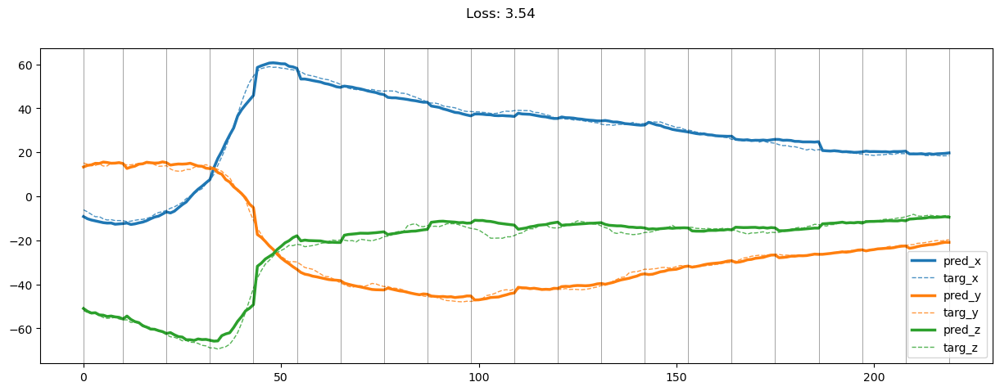

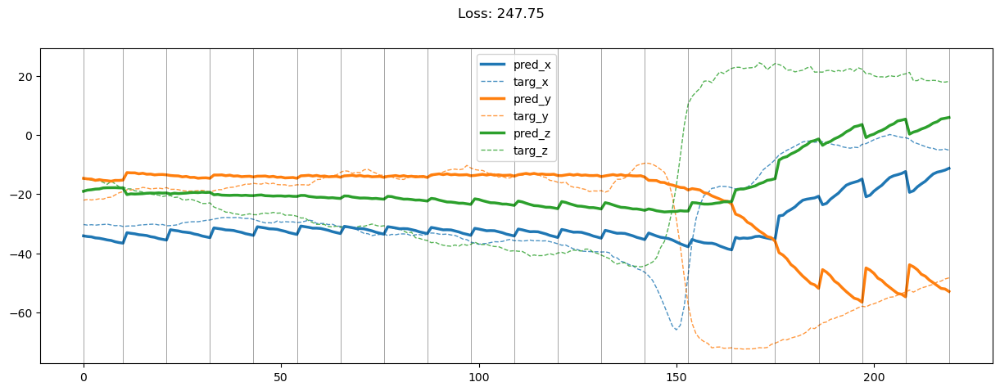

00899: train total loss:  3.055, pred loss:  3.055, valid total loss:  96.826, pred loss:  96.826


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


00900: train total loss:  3.033, pred loss:  3.033, valid total loss:  100.504, pred loss:  100.504


100%|██████████| 7/7 [00:00<00:00, 33.21it/s]


00901: train total loss:  3.131, pred loss:  3.131, valid total loss:  105.560, pred loss:  105.560


100%|██████████| 7/7 [00:00<00:00, 29.75it/s]


00902: train total loss:  3.081, pred loss:  3.081, valid total loss:  105.000, pred loss:  105.000


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


00903: train total loss:  3.052, pred loss:  3.052, valid total loss:  108.399, pred loss:  108.399


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


00904: train total loss:  3.138, pred loss:  3.138, valid total loss:  102.573, pred loss:  102.573


100%|██████████| 7/7 [00:00<00:00, 29.36it/s]


00905: train total loss:  3.205, pred loss:  3.205, valid total loss:  100.188, pred loss:  100.188


100%|██████████| 7/7 [00:00<00:00, 30.55it/s]


00906: train total loss:  3.162, pred loss:  3.162, valid total loss:  100.314, pred loss:  100.314


100%|██████████| 7/7 [00:00<00:00, 29.32it/s]


00907: train total loss:  3.170, pred loss:  3.170, valid total loss:  101.322, pred loss:  101.322


100%|██████████| 7/7 [00:00<00:00, 30.53it/s]


00908: train total loss:  3.105, pred loss:  3.105, valid total loss:  101.760, pred loss:  101.760


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


00909: train total loss:  3.024, pred loss:  3.024, valid total loss:  98.789, pred loss:  98.789


100%|██████████| 7/7 [00:00<00:00, 30.04it/s]


00910: train total loss:  2.987, pred loss:  2.987, valid total loss:  101.354, pred loss:  101.354


100%|██████████| 7/7 [00:00<00:00, 27.22it/s]


00911: train total loss:  3.038, pred loss:  3.038, valid total loss:  99.376, pred loss:  99.376


100%|██████████| 7/7 [00:00<00:00, 29.80it/s]


00912: train total loss:  2.954, pred loss:  2.954, valid total loss:  104.485, pred loss:  104.485


100%|██████████| 7/7 [00:00<00:00, 26.47it/s]


00913: train total loss:  2.920, pred loss:  2.920, valid total loss:  100.663, pred loss:  100.663


100%|██████████| 7/7 [00:00<00:00, 30.62it/s]


00914: train total loss:  3.042, pred loss:  3.042, valid total loss:  104.950, pred loss:  104.950


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


00915: train total loss:  2.978, pred loss:  2.978, valid total loss:  101.842, pred loss:  101.842


100%|██████████| 7/7 [00:00<00:00, 30.88it/s]


00916: train total loss:  2.946, pred loss:  2.946, valid total loss:  103.639, pred loss:  103.639


100%|██████████| 7/7 [00:00<00:00, 30.28it/s]


00917: train total loss:  2.919, pred loss:  2.919, valid total loss:  103.892, pred loss:  103.892


100%|██████████| 7/7 [00:00<00:00, 29.87it/s]


00918: train total loss:  2.948, pred loss:  2.948, valid total loss:  104.490, pred loss:  104.490


100%|██████████| 7/7 [00:00<00:00, 22.38it/s]


00919: train total loss:  2.848, pred loss:  2.848, valid total loss:  104.237, pred loss:  104.237


100%|██████████| 7/7 [00:00<00:00, 28.37it/s]


00920: train total loss:  2.721, pred loss:  2.721, valid total loss:  100.936, pred loss:  100.936


100%|██████████| 7/7 [00:00<00:00, 27.26it/s]


00921: train total loss:  2.819, pred loss:  2.819, valid total loss:  103.681, pred loss:  103.681


100%|██████████| 7/7 [00:00<00:00, 27.80it/s]


00922: train total loss:  2.774, pred loss:  2.774, valid total loss:  104.418, pred loss:  104.418


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


00923: train total loss:  2.790, pred loss:  2.790, valid total loss:  101.093, pred loss:  101.093


100%|██████████| 7/7 [00:00<00:00, 33.28it/s]


00924: train total loss:  2.844, pred loss:  2.844, valid total loss:  104.309, pred loss:  104.309


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


00925: train total loss:  2.829, pred loss:  2.829, valid total loss:  99.850, pred loss:  99.850


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


00926: train total loss:  2.967, pred loss:  2.967, valid total loss:  102.933, pred loss:  102.933


100%|██████████| 7/7 [00:00<00:00, 33.16it/s]


00927: train total loss:  2.884, pred loss:  2.884, valid total loss:  102.060, pred loss:  102.060


100%|██████████| 7/7 [00:00<00:00, 33.53it/s]


00928: train total loss:  2.875, pred loss:  2.875, valid total loss:  99.507, pred loss:  99.507


100%|██████████| 7/7 [00:00<00:00, 27.09it/s]


00929: train total loss:  2.968, pred loss:  2.968, valid total loss:  99.201, pred loss:  99.201


100%|██████████| 7/7 [00:00<00:00, 30.26it/s]


00930: train total loss:  2.874, pred loss:  2.874, valid total loss:  104.078, pred loss:  104.078


100%|██████████| 7/7 [00:00<00:00, 25.75it/s]


00931: train total loss:  2.849, pred loss:  2.849, valid total loss:  99.354, pred loss:  99.354


100%|██████████| 7/7 [00:00<00:00, 30.60it/s]


00932: train total loss:  2.817, pred loss:  2.817, valid total loss:  99.617, pred loss:  99.617


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


00933: train total loss:  2.839, pred loss:  2.839, valid total loss:  97.830, pred loss:  97.830


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


00934: train total loss:  2.815, pred loss:  2.815, valid total loss:  99.303, pred loss:  99.303


100%|██████████| 7/7 [00:00<00:00, 30.19it/s]


00935: train total loss:  2.810, pred loss:  2.810, valid total loss:  98.961, pred loss:  98.961


100%|██████████| 7/7 [00:00<00:00, 27.97it/s]


00936: train total loss:  2.830, pred loss:  2.830, valid total loss:  101.655, pred loss:  101.655


100%|██████████| 7/7 [00:00<00:00, 27.99it/s]


00937: train total loss:  2.851, pred loss:  2.851, valid total loss:  104.541, pred loss:  104.541


100%|██████████| 7/7 [00:00<00:00, 29.01it/s]


00938: train total loss:  2.942, pred loss:  2.942, valid total loss:  96.963, pred loss:  96.963


100%|██████████| 7/7 [00:00<00:00, 27.37it/s]


00939: train total loss:  2.976, pred loss:  2.976, valid total loss:  100.243, pred loss:  100.243


100%|██████████| 7/7 [00:00<00:00, 29.83it/s]


00940: train total loss:  2.731, pred loss:  2.731, valid total loss:  103.295, pred loss:  103.295


100%|██████████| 7/7 [00:00<00:00, 29.82it/s]


00941: train total loss:  2.766, pred loss:  2.766, valid total loss:  101.250, pred loss:  101.250


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


00942: train total loss:  2.771, pred loss:  2.771, valid total loss:  98.729, pred loss:  98.729


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


00943: train total loss:  2.784, pred loss:  2.784, valid total loss:  107.337, pred loss:  107.337


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


00944: train total loss:  2.792, pred loss:  2.792, valid total loss:  100.918, pred loss:  100.918


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00945: train total loss:  2.794, pred loss:  2.794, valid total loss:  99.978, pred loss:  99.978


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


00946: train total loss:  2.764, pred loss:  2.764, valid total loss:  101.418, pred loss:  101.418


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


00947: train total loss:  2.758, pred loss:  2.758, valid total loss:  105.814, pred loss:  105.814


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


00948: train total loss:  2.661, pred loss:  2.661, valid total loss:  107.641, pred loss:  107.641


100%|██████████| 7/7 [00:00<00:00, 29.84it/s]


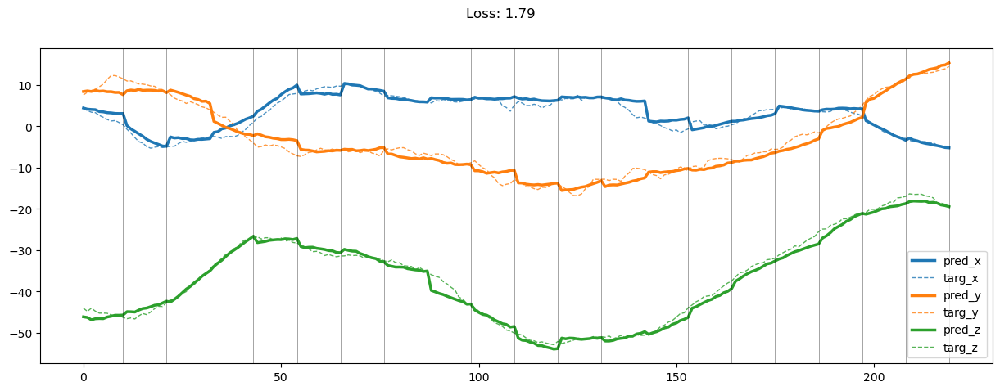

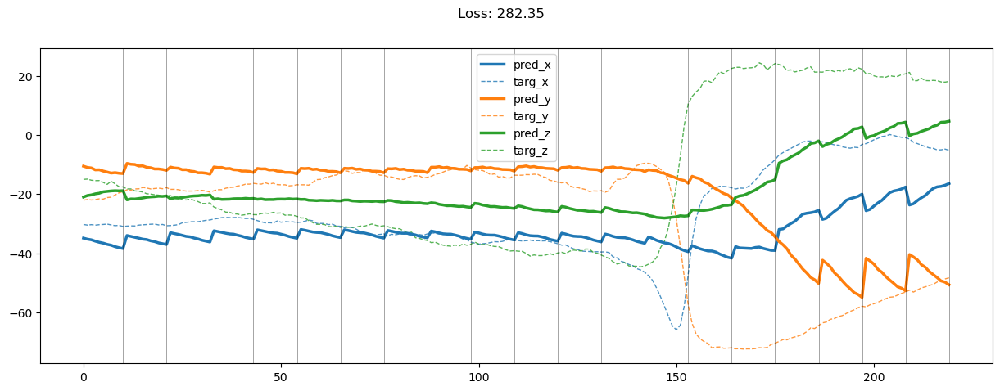

00949: train total loss:  2.720, pred loss:  2.720, valid total loss:  101.123, pred loss:  101.123


100%|██████████| 7/7 [00:00<00:00, 29.40it/s]


00950: train total loss:  2.797, pred loss:  2.797, valid total loss:  101.784, pred loss:  101.784


100%|██████████| 7/7 [00:00<00:00, 30.40it/s]


00951: train total loss:  2.726, pred loss:  2.726, valid total loss:  105.856, pred loss:  105.856


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


00952: train total loss:  2.704, pred loss:  2.704, valid total loss:  101.109, pred loss:  101.109


100%|██████████| 7/7 [00:00<00:00, 29.80it/s]


00953: train total loss:  2.676, pred loss:  2.676, valid total loss:  100.549, pred loss:  100.549


100%|██████████| 7/7 [00:00<00:00, 27.95it/s]


00954: train total loss:  2.638, pred loss:  2.638, valid total loss:  99.378, pred loss:  99.378


100%|██████████| 7/7 [00:00<00:00, 24.32it/s]


00955: train total loss:  2.670, pred loss:  2.670, valid total loss:  100.175, pred loss:  100.175


100%|██████████| 7/7 [00:00<00:00, 29.82it/s]


00956: train total loss:  2.624, pred loss:  2.624, valid total loss:  101.617, pred loss:  101.617


100%|██████████| 7/7 [00:00<00:00, 30.49it/s]


00957: train total loss:  2.672, pred loss:  2.672, valid total loss:  105.353, pred loss:  105.353


100%|██████████| 7/7 [00:00<00:00, 30.18it/s]


00958: train total loss:  2.755, pred loss:  2.755, valid total loss:  100.537, pred loss:  100.537


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


00959: train total loss:  2.705, pred loss:  2.705, valid total loss:  98.986, pred loss:  98.986


100%|██████████| 7/7 [00:00<00:00, 30.03it/s]


00960: train total loss:  2.778, pred loss:  2.778, valid total loss:  100.142, pred loss:  100.142


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


00961: train total loss:  2.720, pred loss:  2.720, valid total loss:  98.594, pred loss:  98.594


100%|██████████| 7/7 [00:00<00:00, 27.23it/s]


00962: train total loss:  2.871, pred loss:  2.871, valid total loss:  99.258, pred loss:  99.258


100%|██████████| 7/7 [00:00<00:00, 30.24it/s]


00963: train total loss:  2.767, pred loss:  2.767, valid total loss:  97.291, pred loss:  97.291


100%|██████████| 7/7 [00:00<00:00, 29.13it/s]


00964: train total loss:  2.774, pred loss:  2.774, valid total loss:  100.889, pred loss:  100.889


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


00965: train total loss:  2.765, pred loss:  2.765, valid total loss:  101.933, pred loss:  101.933


100%|██████████| 7/7 [00:00<00:00, 29.47it/s]


00966: train total loss:  2.850, pred loss:  2.850, valid total loss:  106.271, pred loss:  106.271


100%|██████████| 7/7 [00:00<00:00, 30.20it/s]


00967: train total loss:  2.827, pred loss:  2.827, valid total loss:  102.612, pred loss:  102.612


100%|██████████| 7/7 [00:00<00:00, 29.78it/s]


00968: train total loss:  2.906, pred loss:  2.906, valid total loss:  105.426, pred loss:  105.426


100%|██████████| 7/7 [00:00<00:00, 29.59it/s]


00969: train total loss:  2.976, pred loss:  2.976, valid total loss:  97.497, pred loss:  97.497


100%|██████████| 7/7 [00:00<00:00, 30.45it/s]


00970: train total loss:  2.784, pred loss:  2.784, valid total loss:  102.636, pred loss:  102.636


100%|██████████| 7/7 [00:00<00:00, 22.79it/s]


00971: train total loss:  2.746, pred loss:  2.746, valid total loss:  107.360, pred loss:  107.360


100%|██████████| 7/7 [00:00<00:00, 31.37it/s]


00972: train total loss:  2.903, pred loss:  2.903, valid total loss:  105.067, pred loss:  105.067


100%|██████████| 7/7 [00:00<00:00, 24.75it/s]


00973: train total loss:  2.776, pred loss:  2.776, valid total loss:  103.153, pred loss:  103.153


100%|██████████| 7/7 [00:00<00:00, 31.83it/s]


00974: train total loss:  2.871, pred loss:  2.871, valid total loss:  106.003, pred loss:  106.003


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


00975: train total loss:  2.814, pred loss:  2.814, valid total loss:  104.143, pred loss:  104.143


100%|██████████| 7/7 [00:00<00:00, 33.34it/s]


00976: train total loss:  2.751, pred loss:  2.751, valid total loss:  101.155, pred loss:  101.155


100%|██████████| 7/7 [00:00<00:00, 28.64it/s]


00977: train total loss:  2.785, pred loss:  2.785, valid total loss:  104.399, pred loss:  104.399


100%|██████████| 7/7 [00:00<00:00, 29.55it/s]


00978: train total loss:  2.734, pred loss:  2.734, valid total loss:  99.309, pred loss:  99.309


100%|██████████| 7/7 [00:00<00:00, 29.77it/s]


00979: train total loss:  2.784, pred loss:  2.784, valid total loss:  104.856, pred loss:  104.856


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


00980: train total loss:  2.688, pred loss:  2.688, valid total loss:  101.545, pred loss:  101.545


100%|██████████| 7/7 [00:00<00:00, 30.32it/s]


00981: train total loss:  2.792, pred loss:  2.792, valid total loss:  101.047, pred loss:  101.047


100%|██████████| 7/7 [00:00<00:00, 27.13it/s]


00982: train total loss:  2.639, pred loss:  2.639, valid total loss:  106.098, pred loss:  106.098


100%|██████████| 7/7 [00:00<00:00, 26.42it/s]


00983: train total loss:  2.570, pred loss:  2.570, valid total loss:  103.221, pred loss:  103.221


100%|██████████| 7/7 [00:00<00:00, 29.48it/s]


00984: train total loss:  2.697, pred loss:  2.697, valid total loss:  104.103, pred loss:  104.103


100%|██████████| 7/7 [00:00<00:00, 29.25it/s]


00985: train total loss:  2.659, pred loss:  2.659, valid total loss:  102.322, pred loss:  102.322


100%|██████████| 7/7 [00:00<00:00, 30.39it/s]


00986: train total loss:  2.660, pred loss:  2.660, valid total loss:  104.214, pred loss:  104.214


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


00987: train total loss:  2.633, pred loss:  2.633, valid total loss:  101.781, pred loss:  101.781


100%|██████████| 7/7 [00:00<00:00, 30.55it/s]


00988: train total loss:  2.548, pred loss:  2.548, valid total loss:  101.814, pred loss:  101.814


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


00989: train total loss:  2.614, pred loss:  2.614, valid total loss:  104.070, pred loss:  104.070


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


00990: train total loss:  2.638, pred loss:  2.638, valid total loss:  104.236, pred loss:  104.236


100%|██████████| 7/7 [00:00<00:00, 30.20it/s]


00991: train total loss:  2.592, pred loss:  2.592, valid total loss:  105.285, pred loss:  105.285


100%|██████████| 7/7 [00:00<00:00, 29.74it/s]


00992: train total loss:  2.613, pred loss:  2.613, valid total loss:  104.504, pred loss:  104.504


100%|██████████| 7/7 [00:00<00:00, 27.18it/s]


00993: train total loss:  2.629, pred loss:  2.629, valid total loss:  104.511, pred loss:  104.511


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


00994: train total loss:  2.782, pred loss:  2.782, valid total loss:  112.927, pred loss:  112.927


100%|██████████| 7/7 [00:00<00:00, 28.03it/s]


00995: train total loss:  2.990, pred loss:  2.990, valid total loss:  107.462, pred loss:  107.462


100%|██████████| 7/7 [00:00<00:00, 27.11it/s]


00996: train total loss:  2.957, pred loss:  2.957, valid total loss:  101.035, pred loss:  101.035


100%|██████████| 7/7 [00:00<00:00, 34.24it/s]


00997: train total loss:  2.947, pred loss:  2.947, valid total loss:  109.228, pred loss:  109.228


100%|██████████| 7/7 [00:00<00:00, 34.29it/s]


00998: train total loss:  2.839, pred loss:  2.839, valid total loss:  103.795, pred loss:  103.795


100%|██████████| 7/7 [00:00<00:00, 33.90it/s]


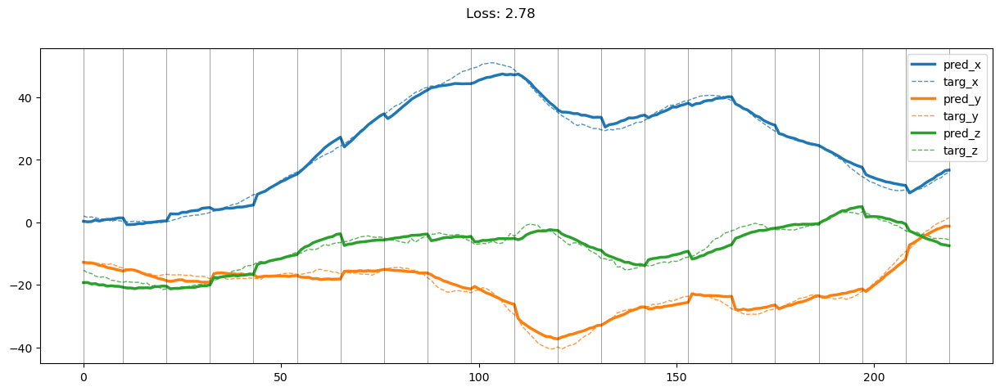

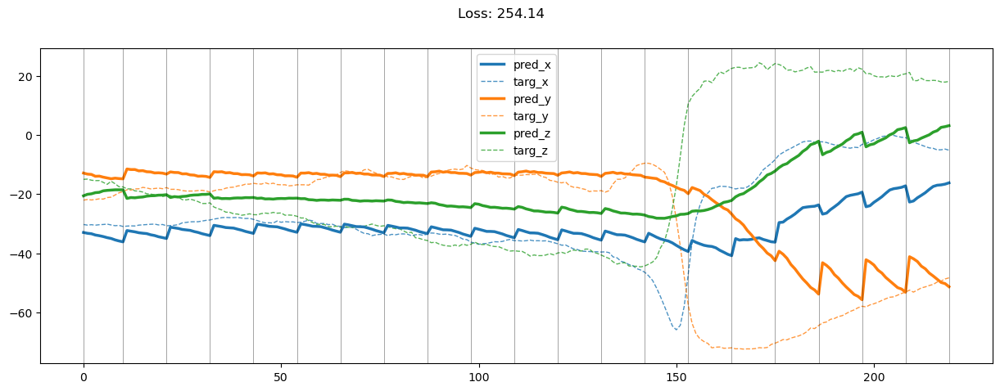

00999: train total loss:  3.003, pred loss:  3.003, valid total loss:  102.645, pred loss:  102.645


100%|██████████| 7/7 [00:00<00:00, 34.09it/s]


01000: train total loss:  2.777, pred loss:  2.777, valid total loss:  102.713, pred loss:  102.713


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


01001: train total loss:  2.751, pred loss:  2.751, valid total loss:  98.842, pred loss:  98.842


100%|██████████| 7/7 [00:00<00:00, 34.16it/s]


01002: train total loss:  2.819, pred loss:  2.819, valid total loss:  103.375, pred loss:  103.375


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01003: train total loss:  2.869, pred loss:  2.869, valid total loss:  105.750, pred loss:  105.750


100%|██████████| 7/7 [00:00<00:00, 33.40it/s]


01004: train total loss:  2.739, pred loss:  2.739, valid total loss:  101.230, pred loss:  101.230


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


01005: train total loss:  2.789, pred loss:  2.789, valid total loss:  102.836, pred loss:  102.836


100%|██████████| 7/7 [00:00<00:00, 27.74it/s]


01006: train total loss:  2.789, pred loss:  2.789, valid total loss:  103.451, pred loss:  103.451


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


01007: train total loss:  2.557, pred loss:  2.557, valid total loss:  101.135, pred loss:  101.135


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


01008: train total loss:  2.626, pred loss:  2.626, valid total loss:  102.711, pred loss:  102.711


100%|██████████| 7/7 [00:00<00:00, 30.80it/s]


01009: train total loss:  2.604, pred loss:  2.604, valid total loss:  104.536, pred loss:  104.536


100%|██████████| 7/7 [00:00<00:00, 32.47it/s]


01010: train total loss:  2.556, pred loss:  2.556, valid total loss:  99.534, pred loss:  99.534


100%|██████████| 7/7 [00:00<00:00, 33.42it/s]


01011: train total loss:  2.612, pred loss:  2.612, valid total loss:  102.824, pred loss:  102.824


100%|██████████| 7/7 [00:00<00:00, 33.09it/s]


01012: train total loss:  2.673, pred loss:  2.673, valid total loss:  104.909, pred loss:  104.909


100%|██████████| 7/7 [00:00<00:00, 33.80it/s]


01013: train total loss:  2.672, pred loss:  2.672, valid total loss:  102.732, pred loss:  102.732


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


01014: train total loss:  2.723, pred loss:  2.723, valid total loss:  105.976, pred loss:  105.976


100%|██████████| 7/7 [00:00<00:00, 33.52it/s]


01015: train total loss:  2.687, pred loss:  2.687, valid total loss:  97.175, pred loss:  97.175


100%|██████████| 7/7 [00:00<00:00, 33.94it/s]


01016: train total loss:  2.702, pred loss:  2.702, valid total loss:  101.810, pred loss:  101.810


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


01017: train total loss:  2.580, pred loss:  2.580, valid total loss:  101.715, pred loss:  101.715


100%|██████████| 7/7 [00:00<00:00, 33.11it/s]


01018: train total loss:  2.511, pred loss:  2.511, valid total loss:  99.448, pred loss:  99.448


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01019: train total loss:  2.508, pred loss:  2.508, valid total loss:  99.922, pred loss:  99.922


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01020: train total loss:  2.611, pred loss:  2.611, valid total loss:  100.844, pred loss:  100.844


100%|██████████| 7/7 [00:00<00:00, 32.94it/s]


01021: train total loss:  2.489, pred loss:  2.489, valid total loss:  106.353, pred loss:  106.353


100%|██████████| 7/7 [00:00<00:00, 34.04it/s]


01022: train total loss:  2.590, pred loss:  2.590, valid total loss:  107.045, pred loss:  107.045


100%|██████████| 7/7 [00:00<00:00, 33.70it/s]


01023: train total loss:  2.469, pred loss:  2.469, valid total loss:  99.636, pred loss:  99.636


100%|██████████| 7/7 [00:00<00:00, 29.89it/s]


01024: train total loss:  2.547, pred loss:  2.547, valid total loss:  103.126, pred loss:  103.126


100%|██████████| 7/7 [00:00<00:00, 29.55it/s]


01025: train total loss:  2.529, pred loss:  2.529, valid total loss:  104.297, pred loss:  104.297


100%|██████████| 7/7 [00:00<00:00, 30.44it/s]


01026: train total loss:  2.527, pred loss:  2.527, valid total loss:  103.102, pred loss:  103.102


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


01027: train total loss:  2.588, pred loss:  2.588, valid total loss:  102.906, pred loss:  102.906


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


01028: train total loss:  2.559, pred loss:  2.559, valid total loss:  100.546, pred loss:  100.546


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


01029: train total loss:  2.670, pred loss:  2.670, valid total loss:  96.652, pred loss:  96.652


100%|██████████| 7/7 [00:00<00:00, 29.28it/s]


01030: train total loss:  2.729, pred loss:  2.729, valid total loss:  99.821, pred loss:  99.821


100%|██████████| 7/7 [00:00<00:00, 30.62it/s]


01031: train total loss:  2.661, pred loss:  2.661, valid total loss:  100.711, pred loss:  100.711


100%|██████████| 7/7 [00:00<00:00, 29.99it/s]


01032: train total loss:  2.546, pred loss:  2.546, valid total loss:  101.827, pred loss:  101.827


100%|██████████| 7/7 [00:00<00:00, 29.92it/s]


01033: train total loss:  2.590, pred loss:  2.590, valid total loss:  99.781, pred loss:  99.781


100%|██████████| 7/7 [00:00<00:00, 32.79it/s]


01034: train total loss:  3.289, pred loss:  3.289, valid total loss:  100.249, pred loss:  100.249


100%|██████████| 7/7 [00:00<00:00, 32.75it/s]


01035: train total loss:  3.112, pred loss:  3.112, valid total loss:  108.830, pred loss:  108.830


100%|██████████| 7/7 [00:00<00:00, 34.15it/s]


01036: train total loss:  3.101, pred loss:  3.101, valid total loss:  99.500, pred loss:  99.500


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01037: train total loss:  3.004, pred loss:  3.004, valid total loss:  96.547, pred loss:  96.547


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


01038: train total loss:  2.883, pred loss:  2.883, valid total loss:  104.675, pred loss:  104.675


100%|██████████| 7/7 [00:00<00:00, 34.07it/s]


01039: train total loss:  2.786, pred loss:  2.786, valid total loss:  97.396, pred loss:  97.396


100%|██████████| 7/7 [00:00<00:00, 29.63it/s]


01040: train total loss:  2.771, pred loss:  2.771, valid total loss:  96.833, pred loss:  96.833


100%|██████████| 7/7 [00:00<00:00, 30.89it/s]


01041: train total loss:  2.782, pred loss:  2.782, valid total loss:  101.126, pred loss:  101.126


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


01042: train total loss:  2.779, pred loss:  2.779, valid total loss:  97.907, pred loss:  97.907


100%|██████████| 7/7 [00:00<00:00, 34.23it/s]


01043: train total loss:  2.626, pred loss:  2.626, valid total loss:  104.730, pred loss:  104.730


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


01044: train total loss:  2.600, pred loss:  2.600, valid total loss:  106.354, pred loss:  106.354


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


01045: train total loss:  2.664, pred loss:  2.664, valid total loss:  100.686, pred loss:  100.686


100%|██████████| 7/7 [00:00<00:00, 34.31it/s]


01046: train total loss:  2.595, pred loss:  2.595, valid total loss:  99.120, pred loss:  99.120


100%|██████████| 7/7 [00:00<00:00, 33.15it/s]


01047: train total loss:  2.568, pred loss:  2.568, valid total loss:  103.519, pred loss:  103.519


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


01048: train total loss:  2.506, pred loss:  2.506, valid total loss:  100.487, pred loss:  100.487


100%|██████████| 7/7 [00:00<00:00, 34.11it/s]


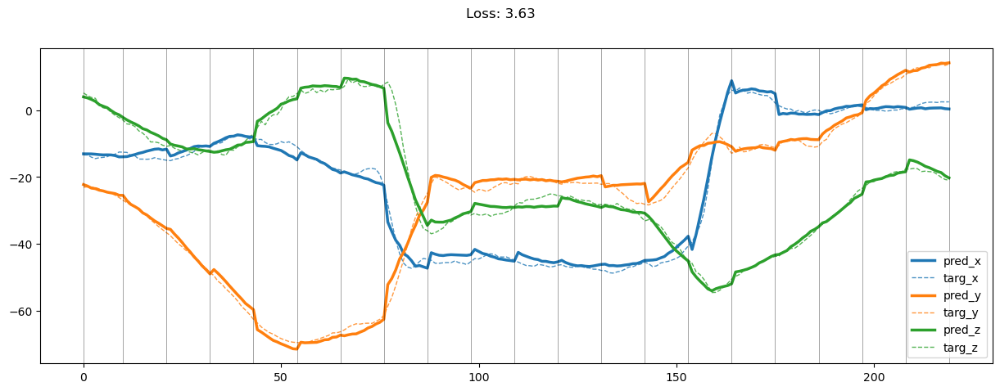

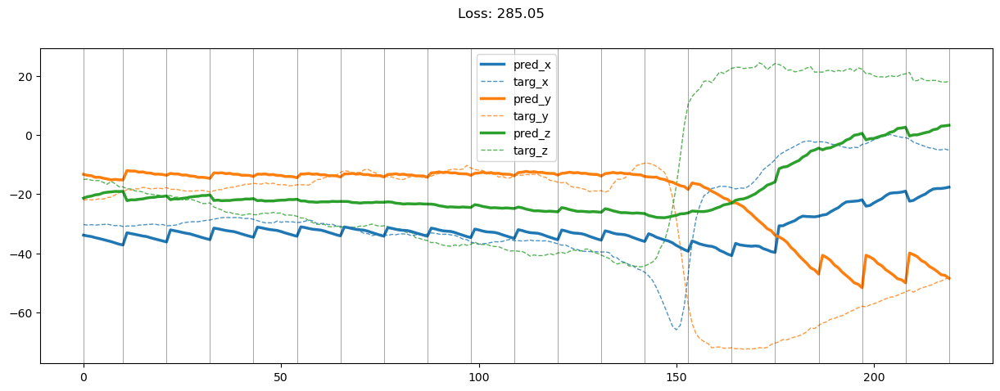

01049: train total loss:  2.552, pred loss:  2.552, valid total loss:  97.917, pred loss:  97.917


100%|██████████| 7/7 [00:00<00:00, 31.52it/s]


01050: train total loss:  2.571, pred loss:  2.571, valid total loss:  104.715, pred loss:  104.715


100%|██████████| 7/7 [00:00<00:00, 31.76it/s]


01051: train total loss:  2.605, pred loss:  2.605, valid total loss:  99.319, pred loss:  99.319


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


01052: train total loss:  2.496, pred loss:  2.496, valid total loss:  100.363, pred loss:  100.363


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


01053: train total loss:  2.755, pred loss:  2.755, valid total loss:  102.303, pred loss:  102.303


100%|██████████| 7/7 [00:00<00:00, 33.56it/s]


01054: train total loss:  2.508, pred loss:  2.508, valid total loss:  100.845, pred loss:  100.845


100%|██████████| 7/7 [00:00<00:00, 34.23it/s]


01055: train total loss:  2.570, pred loss:  2.570, valid total loss:  102.547, pred loss:  102.547


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01056: train total loss:  2.557, pred loss:  2.557, valid total loss:  98.994, pred loss:  98.994


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


01057: train total loss:  2.496, pred loss:  2.496, valid total loss:  100.455, pred loss:  100.455


100%|██████████| 7/7 [00:00<00:00, 33.95it/s]


01058: train total loss:  2.484, pred loss:  2.484, valid total loss:  100.955, pred loss:  100.955


100%|██████████| 7/7 [00:00<00:00, 33.78it/s]


01059: train total loss:  2.493, pred loss:  2.493, valid total loss:  100.472, pred loss:  100.472


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


01060: train total loss:  2.442, pred loss:  2.442, valid total loss:  106.103, pred loss:  106.103


100%|██████████| 7/7 [00:00<00:00, 34.21it/s]


01061: train total loss:  2.517, pred loss:  2.517, valid total loss:  100.496, pred loss:  100.496


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01062: train total loss:  2.450, pred loss:  2.450, valid total loss:  101.738, pred loss:  101.738


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01063: train total loss:  2.463, pred loss:  2.463, valid total loss:  99.255, pred loss:  99.255


100%|██████████| 7/7 [00:00<00:00, 33.47it/s]


01064: train total loss:  2.461, pred loss:  2.461, valid total loss:  105.156, pred loss:  105.156


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


01065: train total loss:  2.477, pred loss:  2.477, valid total loss:  102.608, pred loss:  102.608


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


01066: train total loss:  2.450, pred loss:  2.450, valid total loss:  99.341, pred loss:  99.341


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


01067: train total loss:  2.428, pred loss:  2.428, valid total loss:  105.385, pred loss:  105.385


100%|██████████| 7/7 [00:00<00:00, 25.15it/s]


01068: train total loss:  2.473, pred loss:  2.473, valid total loss:  104.741, pred loss:  104.741


100%|██████████| 7/7 [00:00<00:00, 26.37it/s]


01069: train total loss:  2.476, pred loss:  2.476, valid total loss:  97.912, pred loss:  97.912


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


01070: train total loss:  2.487, pred loss:  2.487, valid total loss:  106.029, pred loss:  106.029


100%|██████████| 7/7 [00:00<00:00, 28.88it/s]


01071: train total loss:  2.542, pred loss:  2.542, valid total loss:  102.582, pred loss:  102.582


100%|██████████| 7/7 [00:00<00:00, 24.36it/s]


01072: train total loss:  2.516, pred loss:  2.516, valid total loss:  99.846, pred loss:  99.846


100%|██████████| 7/7 [00:00<00:00, 23.64it/s]


01073: train total loss:  2.451, pred loss:  2.451, valid total loss:  100.980, pred loss:  100.980


100%|██████████| 7/7 [00:00<00:00, 22.21it/s]


01074: train total loss:  2.416, pred loss:  2.416, valid total loss:  106.276, pred loss:  106.276


100%|██████████| 7/7 [00:00<00:00, 27.70it/s]


01075: train total loss:  2.418, pred loss:  2.418, valid total loss:  101.544, pred loss:  101.544


100%|██████████| 7/7 [00:00<00:00, 28.43it/s]


01076: train total loss:  2.353, pred loss:  2.353, valid total loss:  100.746, pred loss:  100.746


100%|██████████| 7/7 [00:00<00:00, 28.58it/s]


01077: train total loss:  2.391, pred loss:  2.391, valid total loss:  105.656, pred loss:  105.656


100%|██████████| 7/7 [00:00<00:00, 26.63it/s]


01078: train total loss:  2.344, pred loss:  2.344, valid total loss:  103.800, pred loss:  103.800


100%|██████████| 7/7 [00:00<00:00, 29.24it/s]


01079: train total loss:  2.387, pred loss:  2.387, valid total loss:  106.488, pred loss:  106.488


100%|██████████| 7/7 [00:00<00:00, 28.30it/s]


01080: train total loss:  2.324, pred loss:  2.324, valid total loss:  107.297, pred loss:  107.297


100%|██████████| 7/7 [00:00<00:00, 26.75it/s]


01081: train total loss:  2.470, pred loss:  2.470, valid total loss:  104.229, pred loss:  104.229


100%|██████████| 7/7 [00:00<00:00, 30.22it/s]


01082: train total loss:  2.275, pred loss:  2.275, valid total loss:  105.088, pred loss:  105.088


100%|██████████| 7/7 [00:00<00:00, 28.07it/s]


01083: train total loss:  2.298, pred loss:  2.298, valid total loss:  101.305, pred loss:  101.305


100%|██████████| 7/7 [00:00<00:00, 24.42it/s]


01084: train total loss:  2.345, pred loss:  2.345, valid total loss:  105.166, pred loss:  105.166


100%|██████████| 7/7 [00:00<00:00, 24.50it/s]


01085: train total loss:  2.375, pred loss:  2.375, valid total loss:  107.222, pred loss:  107.222


100%|██████████| 7/7 [00:00<00:00, 28.41it/s]


01086: train total loss:  2.445, pred loss:  2.445, valid total loss:  108.527, pred loss:  108.527


100%|██████████| 7/7 [00:00<00:00, 33.80it/s]


01087: train total loss:  2.493, pred loss:  2.493, valid total loss:  105.375, pred loss:  105.375


100%|██████████| 7/7 [00:00<00:00, 33.86it/s]


01088: train total loss:  2.479, pred loss:  2.479, valid total loss:  103.972, pred loss:  103.972


100%|██████████| 7/7 [00:00<00:00, 33.07it/s]


01089: train total loss:  2.564, pred loss:  2.564, valid total loss:  106.108, pred loss:  106.108


100%|██████████| 7/7 [00:00<00:00, 33.88it/s]


01090: train total loss:  2.539, pred loss:  2.539, valid total loss:  102.341, pred loss:  102.341


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


01091: train total loss:  2.501, pred loss:  2.501, valid total loss:  110.087, pred loss:  110.087


100%|██████████| 7/7 [00:00<00:00, 33.16it/s]


01092: train total loss:  2.583, pred loss:  2.583, valid total loss:  109.171, pred loss:  109.171


100%|██████████| 7/7 [00:00<00:00, 34.01it/s]


01093: train total loss:  2.575, pred loss:  2.575, valid total loss:  99.971, pred loss:  99.971


100%|██████████| 7/7 [00:00<00:00, 33.91it/s]


01094: train total loss:  2.462, pred loss:  2.462, valid total loss:  106.422, pred loss:  106.422


100%|██████████| 7/7 [00:00<00:00, 33.12it/s]


01095: train total loss:  2.438, pred loss:  2.438, valid total loss:  105.193, pred loss:  105.193


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01096: train total loss:  2.409, pred loss:  2.409, valid total loss:  106.129, pred loss:  106.129


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


01097: train total loss:  2.397, pred loss:  2.397, valid total loss:  105.114, pred loss:  105.114


100%|██████████| 7/7 [00:00<00:00, 31.72it/s]


01098: train total loss:  2.425, pred loss:  2.425, valid total loss:  107.574, pred loss:  107.574


100%|██████████| 7/7 [00:00<00:00, 24.67it/s]


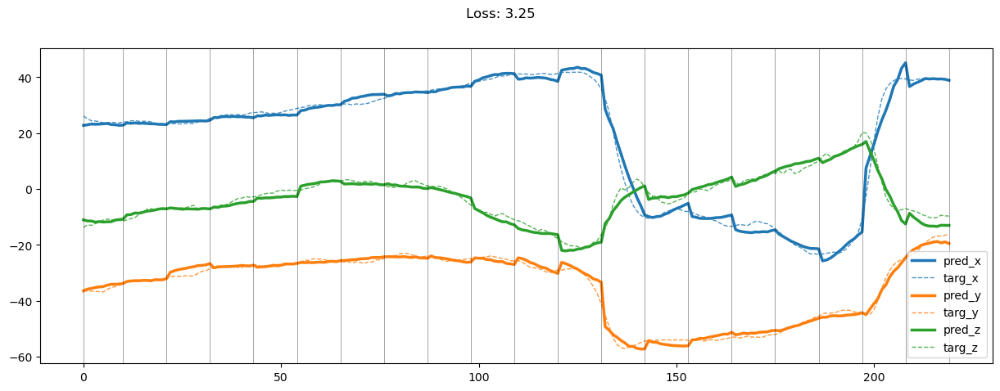

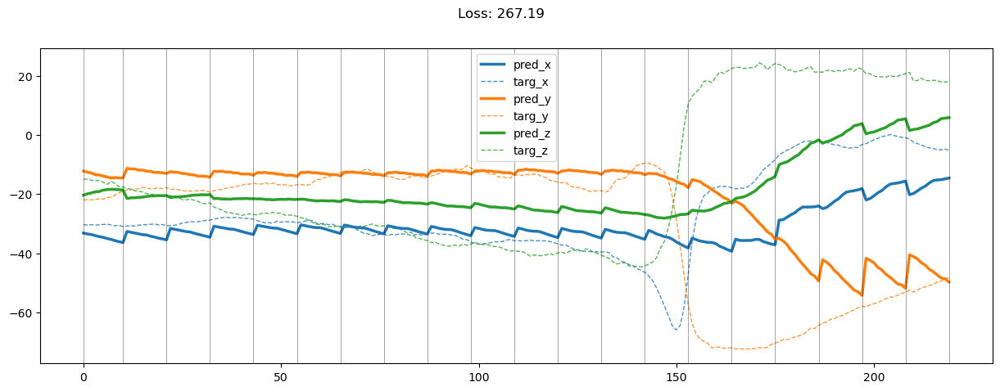

01099: train total loss:  2.434, pred loss:  2.434, valid total loss:  104.748, pred loss:  104.748


100%|██████████| 7/7 [00:00<00:00, 26.78it/s]


01100: train total loss:  2.391, pred loss:  2.391, valid total loss:  105.473, pred loss:  105.473


100%|██████████| 7/7 [00:00<00:00, 22.47it/s]


01101: train total loss:  2.485, pred loss:  2.485, valid total loss:  102.373, pred loss:  102.373


100%|██████████| 7/7 [00:00<00:00, 22.57it/s]


01102: train total loss:  2.440, pred loss:  2.440, valid total loss:  99.509, pred loss:  99.509


100%|██████████| 7/7 [00:00<00:00, 30.63it/s]


01103: train total loss:  2.364, pred loss:  2.364, valid total loss:  103.117, pred loss:  103.117


100%|██████████| 7/7 [00:00<00:00, 30.17it/s]


01104: train total loss:  2.341, pred loss:  2.341, valid total loss:  108.310, pred loss:  108.310


100%|██████████| 7/7 [00:00<00:00, 29.15it/s]


01105: train total loss:  2.471, pred loss:  2.471, valid total loss:  105.176, pred loss:  105.176


100%|██████████| 7/7 [00:00<00:00, 30.56it/s]


01106: train total loss:  2.401, pred loss:  2.401, valid total loss:  103.065, pred loss:  103.065


100%|██████████| 7/7 [00:00<00:00, 29.44it/s]


01107: train total loss:  2.326, pred loss:  2.326, valid total loss:  104.407, pred loss:  104.407


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01108: train total loss:  2.363, pred loss:  2.363, valid total loss:  103.888, pred loss:  103.888


100%|██████████| 7/7 [00:00<00:00, 29.68it/s]


01109: train total loss:  2.371, pred loss:  2.371, valid total loss:  103.306, pred loss:  103.306


100%|██████████| 7/7 [00:00<00:00, 30.12it/s]


01110: train total loss:  2.361, pred loss:  2.361, valid total loss:  105.382, pred loss:  105.382


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01111: train total loss:  2.448, pred loss:  2.448, valid total loss:  108.870, pred loss:  108.870


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


01112: train total loss:  2.334, pred loss:  2.334, valid total loss:  103.960, pred loss:  103.960


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01113: train total loss:  2.324, pred loss:  2.324, valid total loss:  105.200, pred loss:  105.200


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01114: train total loss:  2.355, pred loss:  2.355, valid total loss:  108.756, pred loss:  108.756


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


01115: train total loss:  2.337, pred loss:  2.337, valid total loss:  110.980, pred loss:  110.980


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


01116: train total loss:  2.275, pred loss:  2.275, valid total loss:  110.739, pred loss:  110.739


100%|██████████| 7/7 [00:00<00:00, 30.81it/s]


01117: train total loss:  2.270, pred loss:  2.270, valid total loss:  101.479, pred loss:  101.479


100%|██████████| 7/7 [00:00<00:00, 31.05it/s]


01118: train total loss:  2.349, pred loss:  2.349, valid total loss:  110.252, pred loss:  110.252


100%|██████████| 7/7 [00:00<00:00, 34.11it/s]


01119: train total loss:  2.321, pred loss:  2.321, valid total loss:  109.002, pred loss:  109.002


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


01120: train total loss:  2.360, pred loss:  2.360, valid total loss:  106.718, pred loss:  106.718


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01121: train total loss:  2.312, pred loss:  2.312, valid total loss:  111.879, pred loss:  111.879


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


01122: train total loss:  2.426, pred loss:  2.426, valid total loss:  103.633, pred loss:  103.633


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


01123: train total loss:  2.355, pred loss:  2.355, valid total loss:  104.799, pred loss:  104.799


100%|██████████| 7/7 [00:00<00:00, 33.16it/s]


01124: train total loss:  2.345, pred loss:  2.345, valid total loss:  107.771, pred loss:  107.771


100%|██████████| 7/7 [00:00<00:00, 34.09it/s]


01125: train total loss:  2.340, pred loss:  2.340, valid total loss:  103.370, pred loss:  103.370


100%|██████████| 7/7 [00:00<00:00, 33.71it/s]


01126: train total loss:  2.344, pred loss:  2.344, valid total loss:  103.297, pred loss:  103.297


100%|██████████| 7/7 [00:00<00:00, 33.26it/s]


01127: train total loss:  2.324, pred loss:  2.324, valid total loss:  104.853, pred loss:  104.853


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


01128: train total loss:  2.316, pred loss:  2.316, valid total loss:  107.784, pred loss:  107.784


100%|██████████| 7/7 [00:00<00:00, 29.69it/s]


01129: train total loss:  2.273, pred loss:  2.273, valid total loss:  103.584, pred loss:  103.584


100%|██████████| 7/7 [00:00<00:00, 30.40it/s]


01130: train total loss:  2.291, pred loss:  2.291, valid total loss:  103.954, pred loss:  103.954


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


01131: train total loss:  2.302, pred loss:  2.302, valid total loss:  105.528, pred loss:  105.528


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01132: train total loss:  2.314, pred loss:  2.314, valid total loss:  105.535, pred loss:  105.535


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01133: train total loss:  2.311, pred loss:  2.311, valid total loss:  106.145, pred loss:  106.145


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


01134: train total loss:  2.343, pred loss:  2.343, valid total loss:  106.125, pred loss:  106.125


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


01135: train total loss:  2.377, pred loss:  2.377, valid total loss:  104.326, pred loss:  104.326


100%|██████████| 7/7 [00:00<00:00, 30.35it/s]


01136: train total loss:  2.365, pred loss:  2.365, valid total loss:  105.121, pred loss:  105.121


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


01137: train total loss:  2.426, pred loss:  2.426, valid total loss:  105.263, pred loss:  105.263


100%|██████████| 7/7 [00:00<00:00, 29.76it/s]


01138: train total loss:  2.303, pred loss:  2.303, valid total loss:  105.907, pred loss:  105.907


100%|██████████| 7/7 [00:00<00:00, 30.70it/s]


01139: train total loss:  2.351, pred loss:  2.351, valid total loss:  101.177, pred loss:  101.177


100%|██████████| 7/7 [00:00<00:00, 30.18it/s]


01140: train total loss:  2.334, pred loss:  2.334, valid total loss:  104.910, pred loss:  104.910


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


01141: train total loss:  2.247, pred loss:  2.247, valid total loss:  106.257, pred loss:  106.257


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


01142: train total loss:  2.325, pred loss:  2.325, valid total loss:  104.451, pred loss:  104.451


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


01143: train total loss:  2.278, pred loss:  2.278, valid total loss:  105.014, pred loss:  105.014


100%|██████████| 7/7 [00:00<00:00, 27.33it/s]


01144: train total loss:  2.337, pred loss:  2.337, valid total loss:  107.428, pred loss:  107.428


100%|██████████| 7/7 [00:00<00:00, 27.20it/s]


01145: train total loss:  2.353, pred loss:  2.353, valid total loss:  110.563, pred loss:  110.563


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


01146: train total loss:  2.277, pred loss:  2.277, valid total loss:  107.804, pred loss:  107.804


100%|██████████| 7/7 [00:00<00:00, 30.20it/s]


01147: train total loss:  2.257, pred loss:  2.257, valid total loss:  110.098, pred loss:  110.098


100%|██████████| 7/7 [00:00<00:00, 27.63it/s]


01148: train total loss:  2.254, pred loss:  2.254, valid total loss:  106.533, pred loss:  106.533


100%|██████████| 7/7 [00:00<00:00, 30.39it/s]


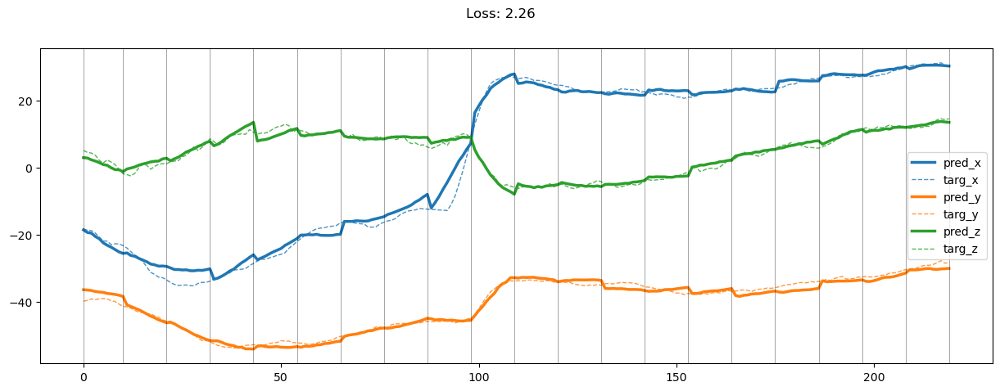

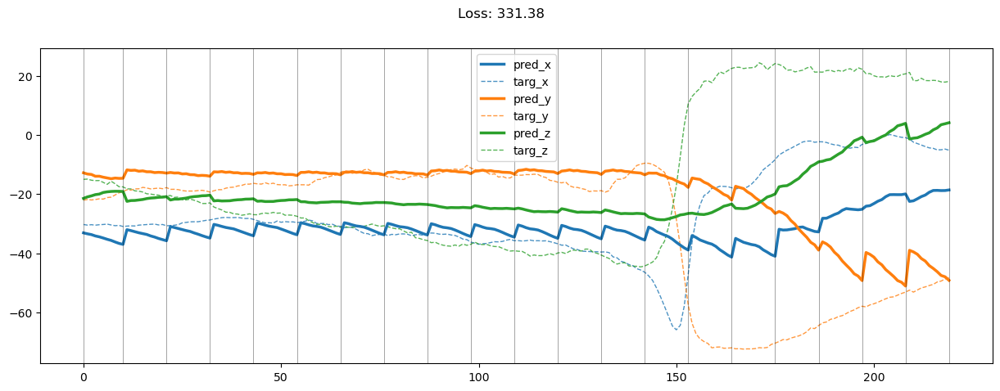

01149: train total loss:  2.343, pred loss:  2.343, valid total loss:  106.699, pred loss:  106.699


100%|██████████| 7/7 [00:00<00:00, 27.91it/s]


01150: train total loss:  2.349, pred loss:  2.349, valid total loss:  108.061, pred loss:  108.061


100%|██████████| 7/7 [00:00<00:00, 30.51it/s]


01151: train total loss:  2.269, pred loss:  2.269, valid total loss:  104.142, pred loss:  104.142


100%|██████████| 7/7 [00:00<00:00, 29.42it/s]


01152: train total loss:  2.370, pred loss:  2.370, valid total loss:  107.224, pred loss:  107.224


100%|██████████| 7/7 [00:00<00:00, 29.93it/s]


01153: train total loss:  2.348, pred loss:  2.348, valid total loss:  107.041, pred loss:  107.041


100%|██████████| 7/7 [00:00<00:00, 29.87it/s]


01154: train total loss:  2.329, pred loss:  2.329, valid total loss:  105.503, pred loss:  105.503


100%|██████████| 7/7 [00:00<00:00, 30.91it/s]


01155: train total loss:  2.314, pred loss:  2.314, valid total loss:  107.838, pred loss:  107.838


100%|██████████| 7/7 [00:00<00:00, 29.54it/s]


01156: train total loss:  2.365, pred loss:  2.365, valid total loss:  112.268, pred loss:  112.268


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


01157: train total loss:  2.275, pred loss:  2.275, valid total loss:  110.076, pred loss:  110.076


100%|██████████| 7/7 [00:00<00:00, 31.85it/s]


01158: train total loss:  2.220, pred loss:  2.220, valid total loss:  104.564, pred loss:  104.564


100%|██████████| 7/7 [00:00<00:00, 28.97it/s]


01159: train total loss:  2.353, pred loss:  2.353, valid total loss:  105.619, pred loss:  105.619


100%|██████████| 7/7 [00:00<00:00, 28.70it/s]


01160: train total loss:  2.305, pred loss:  2.305, valid total loss:  106.249, pred loss:  106.249


100%|██████████| 7/7 [00:00<00:00, 23.30it/s]


01161: train total loss:  2.332, pred loss:  2.332, valid total loss:  106.070, pred loss:  106.070


100%|██████████| 7/7 [00:00<00:00, 27.56it/s]


01162: train total loss:  2.253, pred loss:  2.253, valid total loss:  102.096, pred loss:  102.096


100%|██████████| 7/7 [00:00<00:00, 22.52it/s]


01163: train total loss:  2.262, pred loss:  2.262, valid total loss:  104.919, pred loss:  104.919


100%|██████████| 7/7 [00:00<00:00, 22.85it/s]


01164: train total loss:  2.258, pred loss:  2.258, valid total loss:  108.934, pred loss:  108.934


100%|██████████| 7/7 [00:00<00:00, 29.39it/s]


01165: train total loss:  2.240, pred loss:  2.240, valid total loss:  104.209, pred loss:  104.209


100%|██████████| 7/7 [00:00<00:00, 28.56it/s]


01166: train total loss:  2.257, pred loss:  2.257, valid total loss:  103.313, pred loss:  103.313


100%|██████████| 7/7 [00:00<00:00, 30.52it/s]


01167: train total loss:  2.251, pred loss:  2.251, valid total loss:  108.521, pred loss:  108.521


100%|██████████| 7/7 [00:00<00:00, 29.63it/s]


01168: train total loss:  2.242, pred loss:  2.242, valid total loss:  105.417, pred loss:  105.417


100%|██████████| 7/7 [00:00<00:00, 28.29it/s]


01169: train total loss:  2.182, pred loss:  2.182, valid total loss:  100.568, pred loss:  100.568


100%|██████████| 7/7 [00:00<00:00, 29.77it/s]


01170: train total loss:  2.175, pred loss:  2.175, valid total loss:  103.827, pred loss:  103.827


100%|██████████| 7/7 [00:00<00:00, 29.49it/s]


01171: train total loss:  2.193, pred loss:  2.193, valid total loss:  103.375, pred loss:  103.375


100%|██████████| 7/7 [00:00<00:00, 33.42it/s]


01172: train total loss:  2.184, pred loss:  2.184, valid total loss:  104.165, pred loss:  104.165


100%|██████████| 7/7 [00:00<00:00, 25.33it/s]


01173: train total loss:  2.176, pred loss:  2.176, valid total loss:  104.272, pred loss:  104.272


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


01174: train total loss:  2.155, pred loss:  2.155, valid total loss:  103.981, pred loss:  103.981


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


01175: train total loss:  2.232, pred loss:  2.232, valid total loss:  104.459, pred loss:  104.459


100%|██████████| 7/7 [00:00<00:00, 33.20it/s]


01176: train total loss:  2.236, pred loss:  2.236, valid total loss:  108.204, pred loss:  108.204


100%|██████████| 7/7 [00:00<00:00, 33.35it/s]


01177: train total loss:  2.216, pred loss:  2.216, valid total loss:  108.462, pred loss:  108.462


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01178: train total loss:  2.286, pred loss:  2.286, valid total loss:  105.597, pred loss:  105.597


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01179: train total loss:  2.215, pred loss:  2.215, valid total loss:  106.783, pred loss:  106.783


100%|██████████| 7/7 [00:00<00:00, 30.26it/s]


01180: train total loss:  2.264, pred loss:  2.264, valid total loss:  107.140, pred loss:  107.140


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


01181: train total loss:  2.257, pred loss:  2.257, valid total loss:  108.771, pred loss:  108.771


100%|██████████| 7/7 [00:00<00:00, 27.75it/s]


01182: train total loss:  2.219, pred loss:  2.219, valid total loss:  104.122, pred loss:  104.122


100%|██████████| 7/7 [00:00<00:00, 34.17it/s]


01183: train total loss:  2.200, pred loss:  2.200, valid total loss:  102.669, pred loss:  102.669


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01184: train total loss:  2.153, pred loss:  2.153, valid total loss:  109.235, pred loss:  109.235


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


01185: train total loss:  2.293, pred loss:  2.293, valid total loss:  104.897, pred loss:  104.897


100%|██████████| 7/7 [00:00<00:00, 34.01it/s]


01186: train total loss:  2.208, pred loss:  2.208, valid total loss:  107.024, pred loss:  107.024


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


01187: train total loss:  2.272, pred loss:  2.272, valid total loss:  104.902, pred loss:  104.902


100%|██████████| 7/7 [00:00<00:00, 33.91it/s]


01188: train total loss:  2.262, pred loss:  2.262, valid total loss:  101.103, pred loss:  101.103


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


01189: train total loss:  2.217, pred loss:  2.217, valid total loss:  103.275, pred loss:  103.275


100%|██████████| 7/7 [00:00<00:00, 33.78it/s]


01190: train total loss:  2.174, pred loss:  2.174, valid total loss:  105.706, pred loss:  105.706


100%|██████████| 7/7 [00:00<00:00, 33.47it/s]


01191: train total loss:  2.136, pred loss:  2.136, valid total loss:  103.057, pred loss:  103.057


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


01192: train total loss:  2.116, pred loss:  2.116, valid total loss:  102.940, pred loss:  102.940


100%|██████████| 7/7 [00:00<00:00, 33.40it/s]


01193: train total loss:  2.127, pred loss:  2.127, valid total loss:  102.202, pred loss:  102.202


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


01194: train total loss:  2.188, pred loss:  2.188, valid total loss:  100.410, pred loss:  100.410


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01195: train total loss:  2.170, pred loss:  2.170, valid total loss:  102.917, pred loss:  102.917


100%|██████████| 7/7 [00:00<00:00, 34.14it/s]


01196: train total loss:  2.191, pred loss:  2.191, valid total loss:  98.015, pred loss:  98.015


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


01197: train total loss:  2.191, pred loss:  2.191, valid total loss:  102.038, pred loss:  102.038


100%|██████████| 7/7 [00:00<00:00, 33.85it/s]


01198: train total loss:  2.130, pred loss:  2.130, valid total loss:  101.260, pred loss:  101.260


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


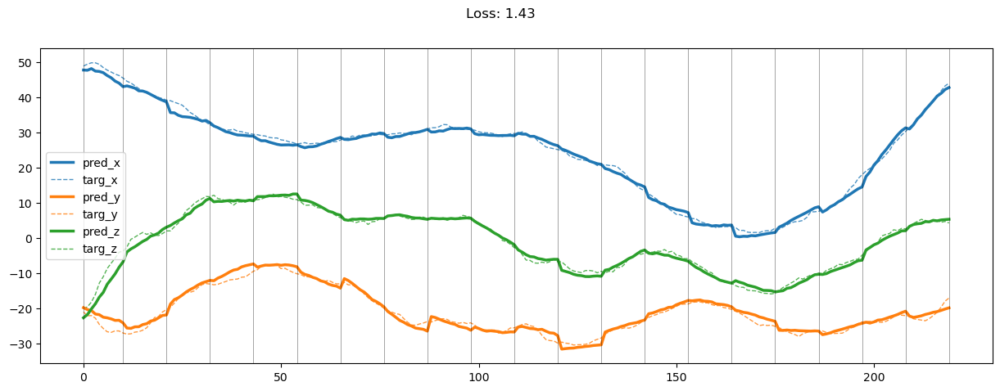

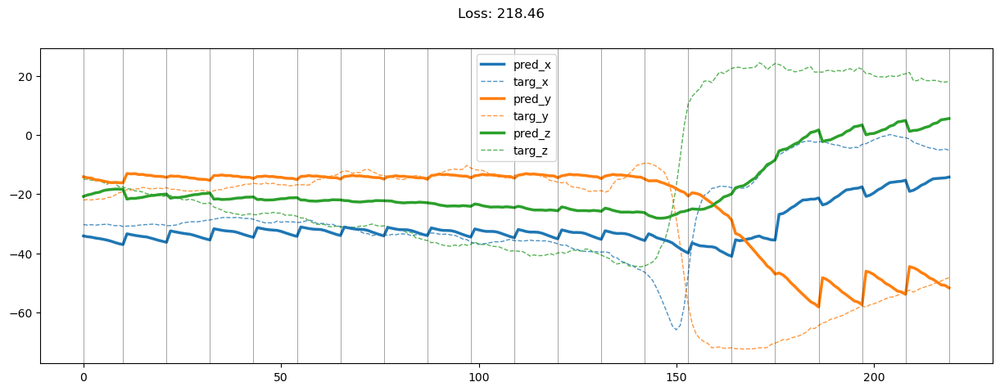

01199: train total loss:  2.158, pred loss:  2.158, valid total loss:  100.765, pred loss:  100.765


100%|██████████| 7/7 [00:00<00:00, 34.07it/s]


01200: train total loss:  2.150, pred loss:  2.150, valid total loss:  102.941, pred loss:  102.941


100%|██████████| 7/7 [00:00<00:00, 34.32it/s]


01201: train total loss:  2.240, pred loss:  2.240, valid total loss:  106.381, pred loss:  106.381


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


01202: train total loss:  2.091, pred loss:  2.091, valid total loss:  102.801, pred loss:  102.801


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01203: train total loss:  2.101, pred loss:  2.101, valid total loss:  104.237, pred loss:  104.237


100%|██████████| 7/7 [00:00<00:00, 34.20it/s]


01204: train total loss:  2.138, pred loss:  2.138, valid total loss:  105.188, pred loss:  105.188


100%|██████████| 7/7 [00:00<00:00, 33.98it/s]


01205: train total loss:  2.130, pred loss:  2.130, valid total loss:  101.816, pred loss:  101.816


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01206: train total loss:  2.093, pred loss:  2.093, valid total loss:  106.370, pred loss:  106.370


100%|██████████| 7/7 [00:00<00:00, 33.98it/s]


01207: train total loss:  2.113, pred loss:  2.113, valid total loss:  100.987, pred loss:  100.987


100%|██████████| 7/7 [00:00<00:00, 33.42it/s]


01208: train total loss:  2.107, pred loss:  2.107, valid total loss:  103.289, pred loss:  103.289


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


01209: train total loss:  2.218, pred loss:  2.218, valid total loss:  106.383, pred loss:  106.383


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


01210: train total loss:  2.091, pred loss:  2.091, valid total loss:  103.856, pred loss:  103.856


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01211: train total loss:  2.152, pred loss:  2.152, valid total loss:  102.909, pred loss:  102.909


100%|██████████| 7/7 [00:00<00:00, 30.47it/s]


01212: train total loss:  2.252, pred loss:  2.252, valid total loss:  105.947, pred loss:  105.947


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


01213: train total loss:  2.194, pred loss:  2.194, valid total loss:  107.826, pred loss:  107.826


100%|██████████| 7/7 [00:00<00:00, 29.83it/s]


01214: train total loss:  2.243, pred loss:  2.243, valid total loss:  107.049, pred loss:  107.049


100%|██████████| 7/7 [00:00<00:00, 30.39it/s]


01215: train total loss:  2.200, pred loss:  2.200, valid total loss:  104.517, pred loss:  104.517


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


01216: train total loss:  2.118, pred loss:  2.118, valid total loss:  102.770, pred loss:  102.770


100%|██████████| 7/7 [00:00<00:00, 30.16it/s]


01217: train total loss:  2.180, pred loss:  2.180, valid total loss:  101.775, pred loss:  101.775


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


01218: train total loss:  2.174, pred loss:  2.174, valid total loss:  106.983, pred loss:  106.983


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


01219: train total loss:  2.131, pred loss:  2.131, valid total loss:  106.898, pred loss:  106.898


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01220: train total loss:  2.203, pred loss:  2.203, valid total loss:  107.722, pred loss:  107.722


100%|██████████| 7/7 [00:00<00:00, 22.25it/s]


01221: train total loss:  2.222, pred loss:  2.222, valid total loss:  106.641, pred loss:  106.641


100%|██████████| 7/7 [00:00<00:00, 29.31it/s]


01222: train total loss:  2.182, pred loss:  2.182, valid total loss:  106.723, pred loss:  106.723


100%|██████████| 7/7 [00:00<00:00, 26.51it/s]


01223: train total loss:  2.224, pred loss:  2.224, valid total loss:  106.947, pred loss:  106.947


100%|██████████| 7/7 [00:00<00:00, 29.44it/s]


01224: train total loss:  2.218, pred loss:  2.218, valid total loss:  105.604, pred loss:  105.604


100%|██████████| 7/7 [00:00<00:00, 28.53it/s]


01225: train total loss:  2.132, pred loss:  2.132, valid total loss:  107.770, pred loss:  107.770


100%|██████████| 7/7 [00:00<00:00, 30.52it/s]


01226: train total loss:  2.245, pred loss:  2.245, valid total loss:  105.758, pred loss:  105.758


100%|██████████| 7/7 [00:00<00:00, 29.79it/s]


01227: train total loss:  2.356, pred loss:  2.356, valid total loss:  105.212, pred loss:  105.212


100%|██████████| 7/7 [00:00<00:00, 29.91it/s]


01228: train total loss:  2.394, pred loss:  2.394, valid total loss:  107.652, pred loss:  107.652


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01229: train total loss:  2.490, pred loss:  2.490, valid total loss:  108.154, pred loss:  108.154


100%|██████████| 7/7 [00:00<00:00, 26.59it/s]


01230: train total loss:  2.486, pred loss:  2.486, valid total loss:  109.993, pred loss:  109.993


100%|██████████| 7/7 [00:00<00:00, 32.02it/s]


01231: train total loss:  2.363, pred loss:  2.363, valid total loss:  101.032, pred loss:  101.032


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


01232: train total loss:  2.339, pred loss:  2.339, valid total loss:  98.275, pred loss:  98.275


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01233: train total loss:  2.185, pred loss:  2.185, valid total loss:  105.587, pred loss:  105.587


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


01234: train total loss:  2.165, pred loss:  2.165, valid total loss:  106.377, pred loss:  106.377


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


01235: train total loss:  2.218, pred loss:  2.218, valid total loss:  108.158, pred loss:  108.158


100%|██████████| 7/7 [00:00<00:00, 31.72it/s]


01236: train total loss:  2.121, pred loss:  2.121, valid total loss:  103.715, pred loss:  103.715


100%|██████████| 7/7 [00:00<00:00, 27.63it/s]


01237: train total loss:  2.187, pred loss:  2.187, valid total loss:  106.888, pred loss:  106.888


100%|██████████| 7/7 [00:00<00:00, 30.45it/s]


01238: train total loss:  2.113, pred loss:  2.113, valid total loss:  105.992, pred loss:  105.992


100%|██████████| 7/7 [00:00<00:00, 27.10it/s]


01239: train total loss:  2.115, pred loss:  2.115, valid total loss:  104.865, pred loss:  104.865


100%|██████████| 7/7 [00:00<00:00, 28.32it/s]


01240: train total loss:  2.145, pred loss:  2.145, valid total loss:  105.624, pred loss:  105.624


100%|██████████| 7/7 [00:00<00:00, 32.60it/s]


01241: train total loss:  2.148, pred loss:  2.148, valid total loss:  105.657, pred loss:  105.657


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


01242: train total loss:  2.112, pred loss:  2.112, valid total loss:  110.538, pred loss:  110.538


100%|██████████| 7/7 [00:00<00:00, 30.46it/s]


01243: train total loss:  2.177, pred loss:  2.177, valid total loss:  107.321, pred loss:  107.321


100%|██████████| 7/7 [00:00<00:00, 30.59it/s]


01244: train total loss:  2.272, pred loss:  2.272, valid total loss:  102.676, pred loss:  102.676


100%|██████████| 7/7 [00:00<00:00, 27.60it/s]


01245: train total loss:  2.286, pred loss:  2.286, valid total loss:  105.073, pred loss:  105.073


100%|██████████| 7/7 [00:00<00:00, 26.52it/s]


01246: train total loss:  2.245, pred loss:  2.245, valid total loss:  103.771, pred loss:  103.771


100%|██████████| 7/7 [00:00<00:00, 30.45it/s]


01247: train total loss:  2.298, pred loss:  2.298, valid total loss:  104.042, pred loss:  104.042


100%|██████████| 7/7 [00:00<00:00, 30.54it/s]


01248: train total loss:  2.299, pred loss:  2.299, valid total loss:  105.067, pred loss:  105.067


100%|██████████| 7/7 [00:00<00:00, 30.52it/s]


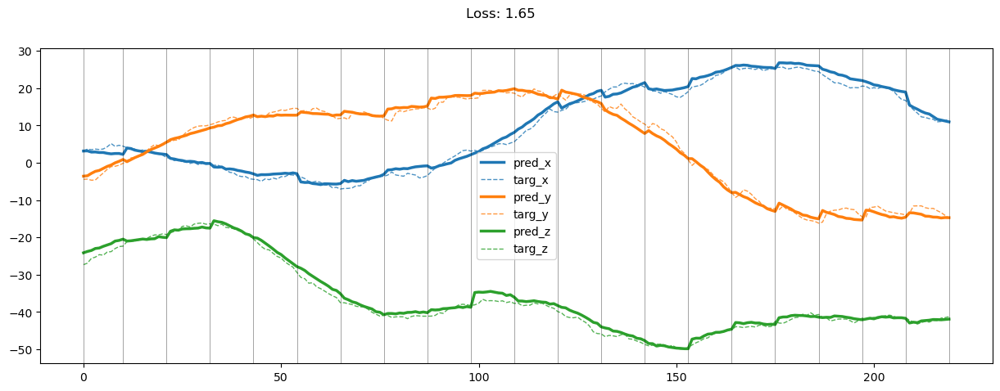

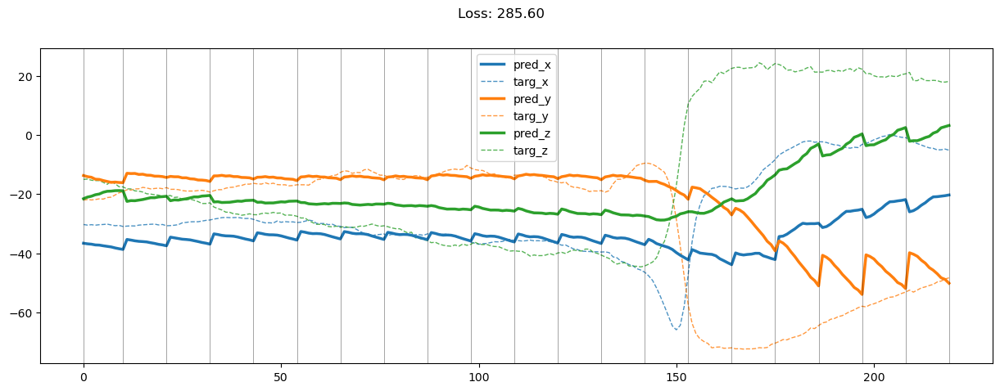

01249: train total loss:  2.200, pred loss:  2.200, valid total loss:  98.578, pred loss:  98.578


100%|██████████| 7/7 [00:00<00:00, 29.48it/s]


01250: train total loss:  2.252, pred loss:  2.252, valid total loss:  102.555, pred loss:  102.555


100%|██████████| 7/7 [00:00<00:00, 28.27it/s]


01251: train total loss:  2.223, pred loss:  2.223, valid total loss:  102.504, pred loss:  102.504


100%|██████████| 7/7 [00:00<00:00, 30.54it/s]


01252: train total loss:  2.147, pred loss:  2.147, valid total loss:  104.376, pred loss:  104.376


100%|██████████| 7/7 [00:00<00:00, 29.91it/s]


01253: train total loss:  2.104, pred loss:  2.104, valid total loss:  101.479, pred loss:  101.479


100%|██████████| 7/7 [00:00<00:00, 29.22it/s]


01254: train total loss:  2.129, pred loss:  2.129, valid total loss:  105.286, pred loss:  105.286


100%|██████████| 7/7 [00:00<00:00, 30.23it/s]


01255: train total loss:  2.170, pred loss:  2.170, valid total loss:  104.673, pred loss:  104.673


100%|██████████| 7/7 [00:00<00:00, 26.09it/s]


01256: train total loss:  2.209, pred loss:  2.209, valid total loss:  108.073, pred loss:  108.073


100%|██████████| 7/7 [00:00<00:00, 30.72it/s]


01257: train total loss:  2.192, pred loss:  2.192, valid total loss:  101.538, pred loss:  101.538


100%|██████████| 7/7 [00:00<00:00, 29.44it/s]


01258: train total loss:  2.131, pred loss:  2.131, valid total loss:  100.487, pred loss:  100.487


100%|██████████| 7/7 [00:00<00:00, 30.19it/s]


01259: train total loss:  2.068, pred loss:  2.068, valid total loss:  105.997, pred loss:  105.997


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


01260: train total loss:  2.179, pred loss:  2.179, valid total loss:  105.179, pred loss:  105.179


100%|██████████| 7/7 [00:00<00:00, 29.71it/s]


01261: train total loss:  2.034, pred loss:  2.034, valid total loss:  102.275, pred loss:  102.275


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


01262: train total loss:  2.016, pred loss:  2.016, valid total loss:  101.417, pred loss:  101.417


100%|██████████| 7/7 [00:00<00:00, 29.71it/s]


01263: train total loss:  2.058, pred loss:  2.058, valid total loss:  102.122, pred loss:  102.122


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


01264: train total loss:  2.043, pred loss:  2.043, valid total loss:  99.945, pred loss:  99.945


100%|██████████| 7/7 [00:00<00:00, 29.84it/s]


01265: train total loss:  2.120, pred loss:  2.120, valid total loss:  103.846, pred loss:  103.846


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


01266: train total loss:  2.042, pred loss:  2.042, valid total loss:  96.948, pred loss:  96.948


100%|██████████| 7/7 [00:00<00:00, 28.51it/s]


01267: train total loss:  2.150, pred loss:  2.150, valid total loss:  102.190, pred loss:  102.190


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


01268: train total loss:  2.162, pred loss:  2.162, valid total loss:  103.022, pred loss:  103.022


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


01269: train total loss:  2.219, pred loss:  2.219, valid total loss:  100.962, pred loss:  100.962


100%|██████████| 7/7 [00:00<00:00, 29.92it/s]


01270: train total loss:  2.310, pred loss:  2.310, valid total loss:  103.704, pred loss:  103.704


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


01271: train total loss:  2.186, pred loss:  2.186, valid total loss:  100.736, pred loss:  100.736


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


01272: train total loss:  2.195, pred loss:  2.195, valid total loss:  97.563, pred loss:  97.563


100%|██████████| 7/7 [00:00<00:00, 31.31it/s]


01273: train total loss:  2.197, pred loss:  2.197, valid total loss:  101.449, pred loss:  101.449


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


01274: train total loss:  2.127, pred loss:  2.127, valid total loss:  104.523, pred loss:  104.523


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


01275: train total loss:  2.088, pred loss:  2.088, valid total loss:  103.681, pred loss:  103.681


100%|██████████| 7/7 [00:00<00:00, 33.26it/s]


01276: train total loss:  2.139, pred loss:  2.139, valid total loss:  103.300, pred loss:  103.300


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01277: train total loss:  2.105, pred loss:  2.105, valid total loss:  102.869, pred loss:  102.869


100%|██████████| 7/7 [00:00<00:00, 33.99it/s]


01278: train total loss:  2.126, pred loss:  2.126, valid total loss:  103.561, pred loss:  103.561


100%|██████████| 7/7 [00:00<00:00, 33.19it/s]


01279: train total loss:  2.026, pred loss:  2.026, valid total loss:  105.320, pred loss:  105.320


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


01280: train total loss:  2.050, pred loss:  2.050, valid total loss:  102.910, pred loss:  102.910


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


01281: train total loss:  2.116, pred loss:  2.116, valid total loss:  100.126, pred loss:  100.126


100%|██████████| 7/7 [00:00<00:00, 32.33it/s]


01282: train total loss:  2.071, pred loss:  2.071, valid total loss:  101.594, pred loss:  101.594


100%|██████████| 7/7 [00:00<00:00, 28.06it/s]


01283: train total loss:  2.106, pred loss:  2.106, valid total loss:  99.223, pred loss:  99.223


100%|██████████| 7/7 [00:00<00:00, 29.05it/s]


01284: train total loss:  2.082, pred loss:  2.082, valid total loss:  100.990, pred loss:  100.990


100%|██████████| 7/7 [00:00<00:00, 26.97it/s]


01285: train total loss:  2.126, pred loss:  2.126, valid total loss:  101.311, pred loss:  101.311


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


01286: train total loss:  2.127, pred loss:  2.127, valid total loss:  102.585, pred loss:  102.585


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01287: train total loss:  2.125, pred loss:  2.125, valid total loss:  103.607, pred loss:  103.607


100%|██████████| 7/7 [00:00<00:00, 33.94it/s]


01288: train total loss:  2.062, pred loss:  2.062, valid total loss:  102.551, pred loss:  102.551


100%|██████████| 7/7 [00:00<00:00, 28.97it/s]


01289: train total loss:  1.983, pred loss:  1.983, valid total loss:  103.981, pred loss:  103.981


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


01290: train total loss:  2.042, pred loss:  2.042, valid total loss:  102.492, pred loss:  102.492


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01291: train total loss:  1.987, pred loss:  1.987, valid total loss:  107.257, pred loss:  107.257


100%|██████████| 7/7 [00:00<00:00, 34.10it/s]


01292: train total loss:  1.963, pred loss:  1.963, valid total loss:  101.399, pred loss:  101.399


100%|██████████| 7/7 [00:00<00:00, 33.44it/s]


01293: train total loss:  2.094, pred loss:  2.094, valid total loss:  99.146, pred loss:  99.146


100%|██████████| 7/7 [00:00<00:00, 34.10it/s]


01294: train total loss:  1.993, pred loss:  1.993, valid total loss:  101.873, pred loss:  101.873


100%|██████████| 7/7 [00:00<00:00, 34.16it/s]


01295: train total loss:  1.995, pred loss:  1.995, valid total loss:  102.225, pred loss:  102.225


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


01296: train total loss:  2.032, pred loss:  2.032, valid total loss:  104.986, pred loss:  104.986


100%|██████████| 7/7 [00:00<00:00, 33.70it/s]


01297: train total loss:  1.988, pred loss:  1.988, valid total loss:  101.779, pred loss:  101.779


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


01298: train total loss:  2.018, pred loss:  2.018, valid total loss:  101.954, pred loss:  101.954


100%|██████████| 7/7 [00:00<00:00, 28.93it/s]


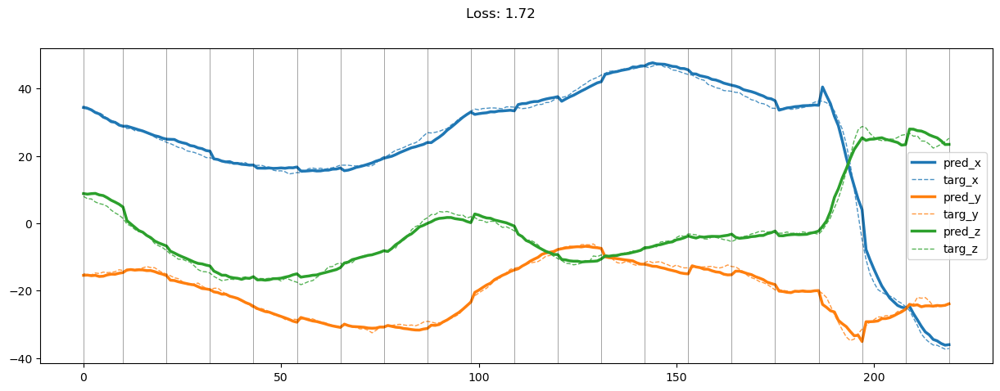

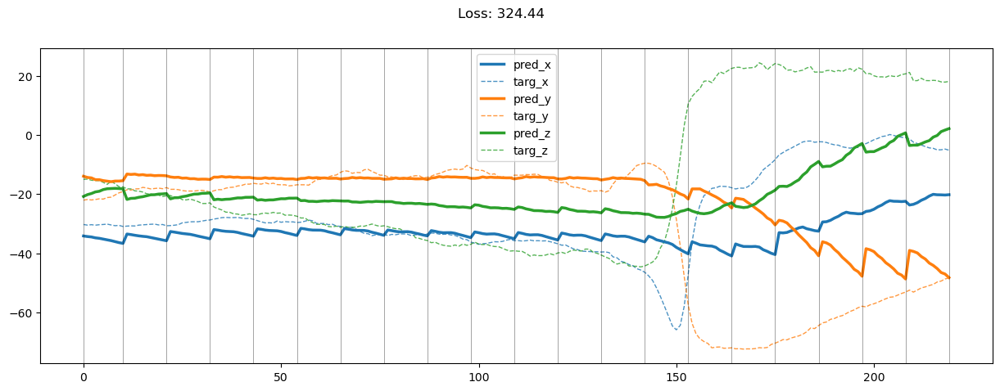

01299: train total loss:  1.943, pred loss:  1.943, valid total loss:  102.012, pred loss:  102.012


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01300: train total loss:  1.987, pred loss:  1.987, valid total loss:  105.819, pred loss:  105.819


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01301: train total loss:  2.021, pred loss:  2.021, valid total loss:  98.956, pred loss:  98.956


100%|██████████| 7/7 [00:00<00:00, 34.38it/s]


01302: train total loss:  1.972, pred loss:  1.972, valid total loss:  105.790, pred loss:  105.790


100%|██████████| 7/7 [00:00<00:00, 33.94it/s]


01303: train total loss:  1.979, pred loss:  1.979, valid total loss:  105.165, pred loss:  105.165


100%|██████████| 7/7 [00:00<00:00, 33.99it/s]


01304: train total loss:  2.060, pred loss:  2.060, valid total loss:  105.109, pred loss:  105.109


100%|██████████| 7/7 [00:00<00:00, 33.26it/s]


01305: train total loss:  2.106, pred loss:  2.106, valid total loss:  108.029, pred loss:  108.029


100%|██████████| 7/7 [00:00<00:00, 33.34it/s]


01306: train total loss:  2.083, pred loss:  2.083, valid total loss:  104.467, pred loss:  104.467


100%|██████████| 7/7 [00:00<00:00, 30.75it/s]


01307: train total loss:  2.028, pred loss:  2.028, valid total loss:  103.423, pred loss:  103.423


100%|██████████| 7/7 [00:00<00:00, 32.48it/s]


01308: train total loss:  1.942, pred loss:  1.942, valid total loss:  102.440, pred loss:  102.440


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


01309: train total loss:  1.969, pred loss:  1.969, valid total loss:  106.690, pred loss:  106.690


100%|██████████| 7/7 [00:00<00:00, 32.73it/s]


01310: train total loss:  1.969, pred loss:  1.969, valid total loss:  102.328, pred loss:  102.328


100%|██████████| 7/7 [00:00<00:00, 31.25it/s]


01311: train total loss:  1.923, pred loss:  1.923, valid total loss:  103.779, pred loss:  103.779


100%|██████████| 7/7 [00:00<00:00, 34.16it/s]


01312: train total loss:  1.978, pred loss:  1.978, valid total loss:  106.469, pred loss:  106.469


100%|██████████| 7/7 [00:00<00:00, 34.23it/s]


01313: train total loss:  1.952, pred loss:  1.952, valid total loss:  103.185, pred loss:  103.185


100%|██████████| 7/7 [00:00<00:00, 33.73it/s]


01314: train total loss:  1.948, pred loss:  1.948, valid total loss:  102.350, pred loss:  102.350


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


01315: train total loss:  1.949, pred loss:  1.949, valid total loss:  105.773, pred loss:  105.773


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01316: train total loss:  1.911, pred loss:  1.911, valid total loss:  106.373, pred loss:  106.373


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01317: train total loss:  1.942, pred loss:  1.942, valid total loss:  103.441, pred loss:  103.441


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


01318: train total loss:  1.921, pred loss:  1.921, valid total loss:  103.430, pred loss:  103.430


100%|██████████| 7/7 [00:00<00:00, 23.75it/s]


01319: train total loss:  1.907, pred loss:  1.907, valid total loss:  102.075, pred loss:  102.075


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


01320: train total loss:  1.895, pred loss:  1.895, valid total loss:  104.030, pred loss:  104.030


100%|██████████| 7/7 [00:00<00:00, 33.90it/s]


01321: train total loss:  1.989, pred loss:  1.989, valid total loss:  105.873, pred loss:  105.873


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


01322: train total loss:  1.993, pred loss:  1.993, valid total loss:  106.984, pred loss:  106.984


100%|██████████| 7/7 [00:00<00:00, 31.76it/s]


01323: train total loss:  2.079, pred loss:  2.079, valid total loss:  109.165, pred loss:  109.165


100%|██████████| 7/7 [00:00<00:00, 28.76it/s]


01324: train total loss:  2.019, pred loss:  2.019, valid total loss:  108.775, pred loss:  108.775


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


01325: train total loss:  2.000, pred loss:  2.000, valid total loss:  109.907, pred loss:  109.907


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01326: train total loss:  2.010, pred loss:  2.010, valid total loss:  107.420, pred loss:  107.420


100%|██████████| 7/7 [00:00<00:00, 23.58it/s]


01327: train total loss:  2.035, pred loss:  2.035, valid total loss:  105.496, pred loss:  105.496


100%|██████████| 7/7 [00:00<00:00, 30.12it/s]


01328: train total loss:  1.992, pred loss:  1.992, valid total loss:  108.766, pred loss:  108.766


100%|██████████| 7/7 [00:00<00:00, 30.38it/s]


01329: train total loss:  1.967, pred loss:  1.967, valid total loss:  111.934, pred loss:  111.934


100%|██████████| 7/7 [00:00<00:00, 30.22it/s]


01330: train total loss:  1.991, pred loss:  1.991, valid total loss:  109.865, pred loss:  109.865


100%|██████████| 7/7 [00:00<00:00, 29.97it/s]


01331: train total loss:  2.020, pred loss:  2.020, valid total loss:  109.403, pred loss:  109.403


100%|██████████| 7/7 [00:00<00:00, 30.25it/s]


01332: train total loss:  2.007, pred loss:  2.007, valid total loss:  108.631, pred loss:  108.631


100%|██████████| 7/7 [00:00<00:00, 30.24it/s]


01333: train total loss:  1.985, pred loss:  1.985, valid total loss:  106.032, pred loss:  106.032


100%|██████████| 7/7 [00:00<00:00, 29.07it/s]


01334: train total loss:  2.041, pred loss:  2.041, valid total loss:  105.954, pred loss:  105.954


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01335: train total loss:  2.080, pred loss:  2.080, valid total loss:  106.863, pred loss:  106.863


100%|██████████| 7/7 [00:00<00:00, 29.89it/s]


01336: train total loss:  2.035, pred loss:  2.035, valid total loss:  109.816, pred loss:  109.816


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


01337: train total loss:  2.056, pred loss:  2.056, valid total loss:  105.652, pred loss:  105.652


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


01338: train total loss:  2.075, pred loss:  2.075, valid total loss:  103.179, pred loss:  103.179


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


01339: train total loss:  2.137, pred loss:  2.137, valid total loss:  103.406, pred loss:  103.406


100%|██████████| 7/7 [00:00<00:00, 30.43it/s]


01340: train total loss:  2.000, pred loss:  2.000, valid total loss:  105.147, pred loss:  105.147


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


01341: train total loss:  2.074, pred loss:  2.074, valid total loss:  101.920, pred loss:  101.920


100%|██████████| 7/7 [00:00<00:00, 30.34it/s]


01342: train total loss:  2.060, pred loss:  2.060, valid total loss:  105.166, pred loss:  105.166


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01343: train total loss:  2.128, pred loss:  2.128, valid total loss:  106.986, pred loss:  106.986


100%|██████████| 7/7 [00:00<00:00, 30.15it/s]


01344: train total loss:  2.105, pred loss:  2.105, valid total loss:  106.626, pred loss:  106.626


100%|██████████| 7/7 [00:00<00:00, 29.80it/s]


01345: train total loss:  2.004, pred loss:  2.004, valid total loss:  107.070, pred loss:  107.070


100%|██████████| 7/7 [00:00<00:00, 30.68it/s]


01346: train total loss:  1.960, pred loss:  1.960, valid total loss:  106.271, pred loss:  106.271


100%|██████████| 7/7 [00:00<00:00, 30.34it/s]


01347: train total loss:  1.974, pred loss:  1.974, valid total loss:  108.427, pred loss:  108.427


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


01348: train total loss:  1.921, pred loss:  1.921, valid total loss:  104.279, pred loss:  104.279


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


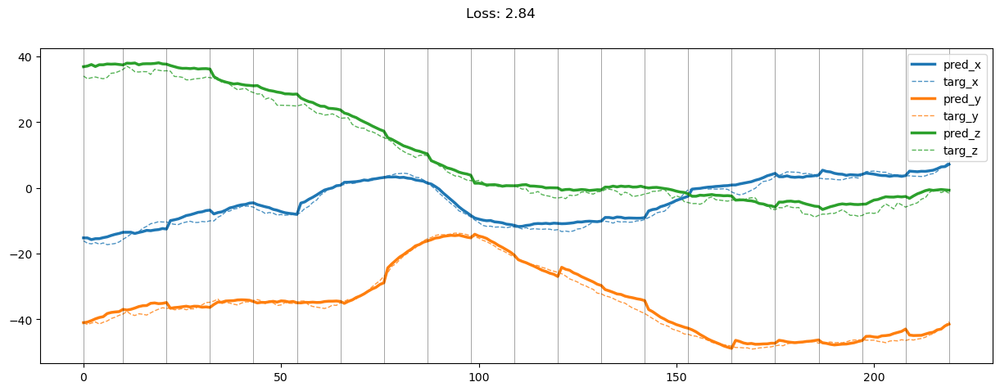

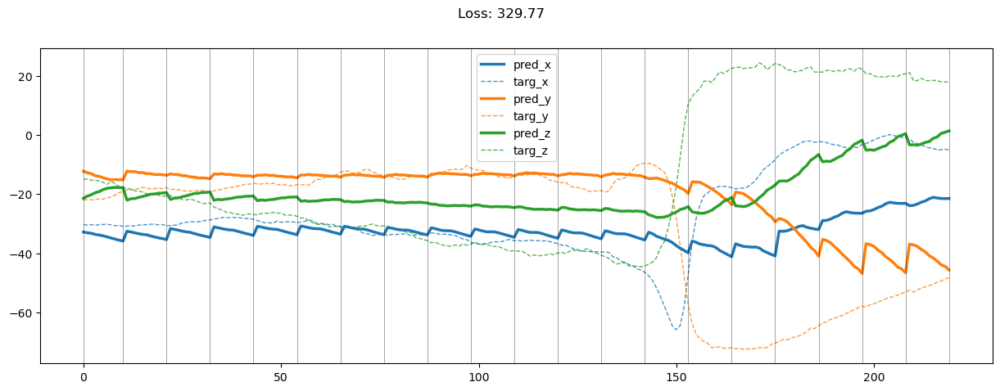

01349: train total loss:  2.005, pred loss:  2.005, valid total loss:  105.736, pred loss:  105.736


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


01350: train total loss:  1.981, pred loss:  1.981, valid total loss:  107.017, pred loss:  107.017


100%|██████████| 7/7 [00:00<00:00, 30.66it/s]


01351: train total loss:  1.976, pred loss:  1.976, valid total loss:  104.619, pred loss:  104.619


100%|██████████| 7/7 [00:00<00:00, 30.16it/s]


01352: train total loss:  1.966, pred loss:  1.966, valid total loss:  106.021, pred loss:  106.021


100%|██████████| 7/7 [00:00<00:00, 30.11it/s]


01353: train total loss:  2.014, pred loss:  2.014, valid total loss:  107.732, pred loss:  107.732


100%|██████████| 7/7 [00:00<00:00, 30.01it/s]


01354: train total loss:  2.089, pred loss:  2.089, valid total loss:  108.283, pred loss:  108.283


100%|██████████| 7/7 [00:00<00:00, 26.37it/s]


01355: train total loss:  2.258, pred loss:  2.258, valid total loss:  110.733, pred loss:  110.733


100%|██████████| 7/7 [00:00<00:00, 30.43it/s]


01356: train total loss:  2.122, pred loss:  2.122, valid total loss:  113.258, pred loss:  113.258


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


01357: train total loss:  2.028, pred loss:  2.028, valid total loss:  108.245, pred loss:  108.245


100%|██████████| 7/7 [00:00<00:00, 33.20it/s]


01358: train total loss:  2.040, pred loss:  2.040, valid total loss:  110.406, pred loss:  110.406


100%|██████████| 7/7 [00:00<00:00, 33.17it/s]


01359: train total loss:  1.995, pred loss:  1.995, valid total loss:  109.835, pred loss:  109.835


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


01360: train total loss:  1.906, pred loss:  1.906, valid total loss:  107.292, pred loss:  107.292


100%|██████████| 7/7 [00:00<00:00, 33.88it/s]


01361: train total loss:  1.933, pred loss:  1.933, valid total loss:  107.251, pred loss:  107.251


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01362: train total loss:  1.969, pred loss:  1.969, valid total loss:  104.314, pred loss:  104.314


100%|██████████| 7/7 [00:00<00:00, 33.53it/s]


01363: train total loss:  1.953, pred loss:  1.953, valid total loss:  105.738, pred loss:  105.738


100%|██████████| 7/7 [00:00<00:00, 33.24it/s]


01364: train total loss:  2.030, pred loss:  2.030, valid total loss:  110.760, pred loss:  110.760


100%|██████████| 7/7 [00:00<00:00, 33.52it/s]


01365: train total loss:  1.926, pred loss:  1.926, valid total loss:  111.048, pred loss:  111.048


100%|██████████| 7/7 [00:00<00:00, 33.19it/s]


01366: train total loss:  1.948, pred loss:  1.948, valid total loss:  109.212, pred loss:  109.212


100%|██████████| 7/7 [00:00<00:00, 33.03it/s]


01367: train total loss:  1.990, pred loss:  1.990, valid total loss:  103.513, pred loss:  103.513


100%|██████████| 7/7 [00:00<00:00, 33.20it/s]


01368: train total loss:  1.952, pred loss:  1.952, valid total loss:  105.496, pred loss:  105.496


100%|██████████| 7/7 [00:00<00:00, 28.47it/s]


01369: train total loss:  1.890, pred loss:  1.890, valid total loss:  109.496, pred loss:  109.496


100%|██████████| 7/7 [00:00<00:00, 23.06it/s]


01370: train total loss:  1.914, pred loss:  1.914, valid total loss:  114.505, pred loss:  114.505


100%|██████████| 7/7 [00:00<00:00, 23.26it/s]


01371: train total loss:  1.924, pred loss:  1.924, valid total loss:  115.992, pred loss:  115.992


100%|██████████| 7/7 [00:00<00:00, 30.35it/s]


01372: train total loss:  2.023, pred loss:  2.023, valid total loss:  114.661, pred loss:  114.661


100%|██████████| 7/7 [00:00<00:00, 29.27it/s]


01373: train total loss:  1.980, pred loss:  1.980, valid total loss:  113.990, pred loss:  113.990


100%|██████████| 7/7 [00:00<00:00, 30.50it/s]


01374: train total loss:  1.961, pred loss:  1.961, valid total loss:  108.086, pred loss:  108.086


100%|██████████| 7/7 [00:00<00:00, 30.23it/s]


01375: train total loss:  1.885, pred loss:  1.885, valid total loss:  107.468, pred loss:  107.468


100%|██████████| 7/7 [00:00<00:00, 30.17it/s]


01376: train total loss:  1.970, pred loss:  1.970, valid total loss:  106.577, pred loss:  106.577


100%|██████████| 7/7 [00:00<00:00, 28.10it/s]


01377: train total loss:  1.882, pred loss:  1.882, valid total loss:  107.384, pred loss:  107.384


100%|██████████| 7/7 [00:00<00:00, 29.39it/s]


01378: train total loss:  1.877, pred loss:  1.877, valid total loss:  106.778, pred loss:  106.778


100%|██████████| 7/7 [00:00<00:00, 30.26it/s]


01379: train total loss:  1.813, pred loss:  1.813, valid total loss:  111.028, pred loss:  111.028


100%|██████████| 7/7 [00:00<00:00, 29.42it/s]


01380: train total loss:  1.892, pred loss:  1.892, valid total loss:  104.551, pred loss:  104.551


100%|██████████| 7/7 [00:00<00:00, 29.33it/s]


01381: train total loss:  1.894, pred loss:  1.894, valid total loss:  108.744, pred loss:  108.744


100%|██████████| 7/7 [00:00<00:00, 29.26it/s]


01382: train total loss:  1.802, pred loss:  1.802, valid total loss:  112.700, pred loss:  112.700


100%|██████████| 7/7 [00:00<00:00, 30.50it/s]


01383: train total loss:  1.840, pred loss:  1.840, valid total loss:  108.787, pred loss:  108.787


100%|██████████| 7/7 [00:00<00:00, 29.79it/s]


01384: train total loss:  1.836, pred loss:  1.836, valid total loss:  107.618, pred loss:  107.618


100%|██████████| 7/7 [00:00<00:00, 30.80it/s]


01385: train total loss:  1.871, pred loss:  1.871, valid total loss:  109.213, pred loss:  109.213


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


01386: train total loss:  1.917, pred loss:  1.917, valid total loss:  110.581, pred loss:  110.581


100%|██████████| 7/7 [00:00<00:00, 29.73it/s]


01387: train total loss:  1.908, pred loss:  1.908, valid total loss:  110.020, pred loss:  110.020


100%|██████████| 7/7 [00:00<00:00, 28.17it/s]


01388: train total loss:  2.016, pred loss:  2.016, valid total loss:  105.930, pred loss:  105.930


100%|██████████| 7/7 [00:00<00:00, 28.41it/s]


01389: train total loss:  2.003, pred loss:  2.003, valid total loss:  115.254, pred loss:  115.254


100%|██████████| 7/7 [00:00<00:00, 22.93it/s]


01390: train total loss:  2.048, pred loss:  2.048, valid total loss:  109.998, pred loss:  109.998


100%|██████████| 7/7 [00:00<00:00, 28.29it/s]


01391: train total loss:  1.987, pred loss:  1.987, valid total loss:  105.864, pred loss:  105.864


100%|██████████| 7/7 [00:00<00:00, 26.04it/s]


01392: train total loss:  2.022, pred loss:  2.022, valid total loss:  109.804, pred loss:  109.804


100%|██████████| 7/7 [00:00<00:00, 26.64it/s]


01393: train total loss:  1.941, pred loss:  1.941, valid total loss:  107.108, pred loss:  107.108


100%|██████████| 7/7 [00:00<00:00, 24.66it/s]


01394: train total loss:  1.828, pred loss:  1.828, valid total loss:  106.556, pred loss:  106.556


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


01395: train total loss:  1.871, pred loss:  1.871, valid total loss:  109.591, pred loss:  109.591


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


01396: train total loss:  1.839, pred loss:  1.839, valid total loss:  109.148, pred loss:  109.148


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


01397: train total loss:  1.788, pred loss:  1.788, valid total loss:  108.151, pred loss:  108.151


100%|██████████| 7/7 [00:00<00:00, 28.91it/s]


01398: train total loss:  1.805, pred loss:  1.805, valid total loss:  106.052, pred loss:  106.052


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


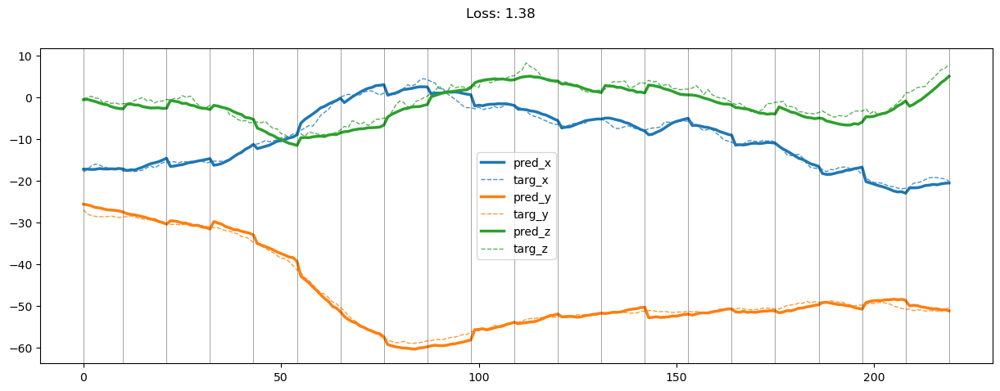

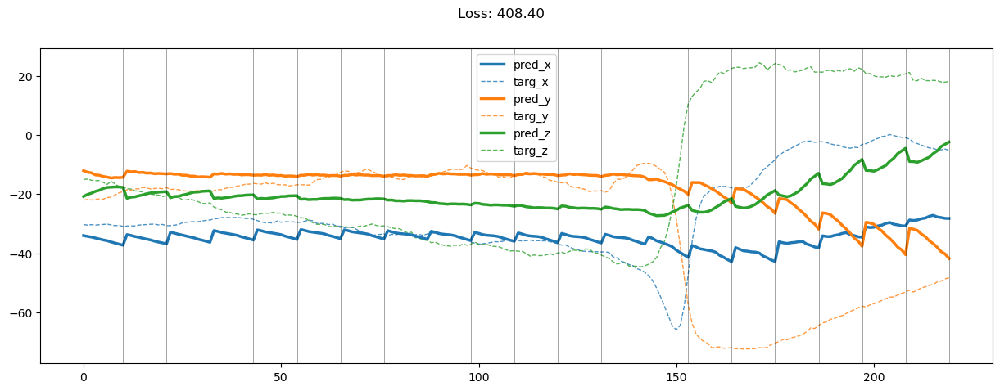

01399: train total loss:  1.906, pred loss:  1.906, valid total loss:  110.789, pred loss:  110.789


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01400: train total loss:  1.832, pred loss:  1.832, valid total loss:  114.556, pred loss:  114.556


100%|██████████| 7/7 [00:00<00:00, 33.33it/s]


01401: train total loss:  1.837, pred loss:  1.837, valid total loss:  109.205, pred loss:  109.205


100%|██████████| 7/7 [00:00<00:00, 33.09it/s]


01402: train total loss:  1.812, pred loss:  1.812, valid total loss:  105.882, pred loss:  105.882


100%|██████████| 7/7 [00:00<00:00, 33.38it/s]


01403: train total loss:  1.806, pred loss:  1.806, valid total loss:  105.409, pred loss:  105.409


100%|██████████| 7/7 [00:00<00:00, 34.01it/s]


01404: train total loss:  1.783, pred loss:  1.783, valid total loss:  109.760, pred loss:  109.760


100%|██████████| 7/7 [00:00<00:00, 33.97it/s]


01405: train total loss:  1.762, pred loss:  1.762, valid total loss:  111.840, pred loss:  111.840


100%|██████████| 7/7 [00:00<00:00, 33.84it/s]


01406: train total loss:  1.820, pred loss:  1.820, valid total loss:  110.877, pred loss:  110.877


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


01407: train total loss:  1.773, pred loss:  1.773, valid total loss:  108.202, pred loss:  108.202


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


01408: train total loss:  1.770, pred loss:  1.770, valid total loss:  107.584, pred loss:  107.584


100%|██████████| 7/7 [00:00<00:00, 29.79it/s]


01409: train total loss:  1.774, pred loss:  1.774, valid total loss:  108.409, pred loss:  108.409


100%|██████████| 7/7 [00:00<00:00, 30.23it/s]


01410: train total loss:  1.866, pred loss:  1.866, valid total loss:  107.677, pred loss:  107.677


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01411: train total loss:  1.951, pred loss:  1.951, valid total loss:  110.577, pred loss:  110.577


100%|██████████| 7/7 [00:00<00:00, 29.39it/s]


01412: train total loss:  1.952, pred loss:  1.952, valid total loss:  106.907, pred loss:  106.907


100%|██████████| 7/7 [00:00<00:00, 30.56it/s]


01413: train total loss:  1.869, pred loss:  1.869, valid total loss:  105.307, pred loss:  105.307


100%|██████████| 7/7 [00:00<00:00, 28.96it/s]


01414: train total loss:  1.867, pred loss:  1.867, valid total loss:  111.271, pred loss:  111.271


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


01415: train total loss:  1.813, pred loss:  1.813, valid total loss:  109.732, pred loss:  109.732


100%|██████████| 7/7 [00:00<00:00, 29.97it/s]


01416: train total loss:  1.849, pred loss:  1.849, valid total loss:  109.188, pred loss:  109.188


100%|██████████| 7/7 [00:00<00:00, 29.78it/s]


01417: train total loss:  1.815, pred loss:  1.815, valid total loss:  108.325, pred loss:  108.325


100%|██████████| 7/7 [00:00<00:00, 29.99it/s]


01418: train total loss:  1.851, pred loss:  1.851, valid total loss:  108.318, pred loss:  108.318


100%|██████████| 7/7 [00:00<00:00, 29.45it/s]


01419: train total loss:  1.878, pred loss:  1.878, valid total loss:  107.423, pred loss:  107.423


100%|██████████| 7/7 [00:00<00:00, 30.81it/s]


01420: train total loss:  1.852, pred loss:  1.852, valid total loss:  110.654, pred loss:  110.654


100%|██████████| 7/7 [00:00<00:00, 29.78it/s]


01421: train total loss:  1.770, pred loss:  1.770, valid total loss:  112.371, pred loss:  112.371


100%|██████████| 7/7 [00:00<00:00, 29.73it/s]


01422: train total loss:  1.829, pred loss:  1.829, valid total loss:  111.014, pred loss:  111.014


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


01423: train total loss:  1.880, pred loss:  1.880, valid total loss:  112.202, pred loss:  112.202


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


01424: train total loss:  1.852, pred loss:  1.852, valid total loss:  111.125, pred loss:  111.125


100%|██████████| 7/7 [00:00<00:00, 28.09it/s]


01425: train total loss:  1.797, pred loss:  1.797, valid total loss:  108.920, pred loss:  108.920


100%|██████████| 7/7 [00:00<00:00, 30.56it/s]


01426: train total loss:  1.742, pred loss:  1.742, valid total loss:  109.626, pred loss:  109.626


100%|██████████| 7/7 [00:00<00:00, 26.83it/s]


01427: train total loss:  1.788, pred loss:  1.788, valid total loss:  107.162, pred loss:  107.162


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01428: train total loss:  1.836, pred loss:  1.836, valid total loss:  110.215, pred loss:  110.215


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01429: train total loss:  1.804, pred loss:  1.804, valid total loss:  109.384, pred loss:  109.384


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


01430: train total loss:  1.795, pred loss:  1.795, valid total loss:  109.936, pred loss:  109.936


100%|██████████| 7/7 [00:00<00:00, 33.35it/s]


01431: train total loss:  1.792, pred loss:  1.792, valid total loss:  115.652, pred loss:  115.652


100%|██████████| 7/7 [00:00<00:00, 33.89it/s]


01432: train total loss:  1.770, pred loss:  1.770, valid total loss:  115.230, pred loss:  115.230


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


01433: train total loss:  1.819, pred loss:  1.819, valid total loss:  111.968, pred loss:  111.968


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01434: train total loss:  1.893, pred loss:  1.893, valid total loss:  107.958, pred loss:  107.958


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


01435: train total loss:  1.907, pred loss:  1.907, valid total loss:  103.839, pred loss:  103.839


100%|██████████| 7/7 [00:00<00:00, 31.88it/s]


01436: train total loss:  1.876, pred loss:  1.876, valid total loss:  107.773, pred loss:  107.773


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


01437: train total loss:  1.836, pred loss:  1.836, valid total loss:  108.150, pred loss:  108.150


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


01438: train total loss:  1.771, pred loss:  1.771, valid total loss:  108.493, pred loss:  108.493


100%|██████████| 7/7 [00:00<00:00, 33.12it/s]


01439: train total loss:  1.802, pred loss:  1.802, valid total loss:  104.526, pred loss:  104.526


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01440: train total loss:  1.756, pred loss:  1.756, valid total loss:  109.592, pred loss:  109.592


100%|██████████| 7/7 [00:00<00:00, 33.78it/s]


01441: train total loss:  1.813, pred loss:  1.813, valid total loss:  112.936, pred loss:  112.936


100%|██████████| 7/7 [00:00<00:00, 33.25it/s]


01442: train total loss:  1.760, pred loss:  1.760, valid total loss:  111.843, pred loss:  111.843


100%|██████████| 7/7 [00:00<00:00, 34.03it/s]


01443: train total loss:  1.782, pred loss:  1.782, valid total loss:  109.171, pred loss:  109.171


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


01444: train total loss:  1.802, pred loss:  1.802, valid total loss:  112.578, pred loss:  112.578


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


01445: train total loss:  1.747, pred loss:  1.747, valid total loss:  111.295, pred loss:  111.295


100%|██████████| 7/7 [00:00<00:00, 34.17it/s]


01446: train total loss:  1.777, pred loss:  1.777, valid total loss:  108.240, pred loss:  108.240


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


01447: train total loss:  1.794, pred loss:  1.794, valid total loss:  104.793, pred loss:  104.793


100%|██████████| 7/7 [00:00<00:00, 33.44it/s]


01448: train total loss:  1.749, pred loss:  1.749, valid total loss:  104.563, pred loss:  104.563


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


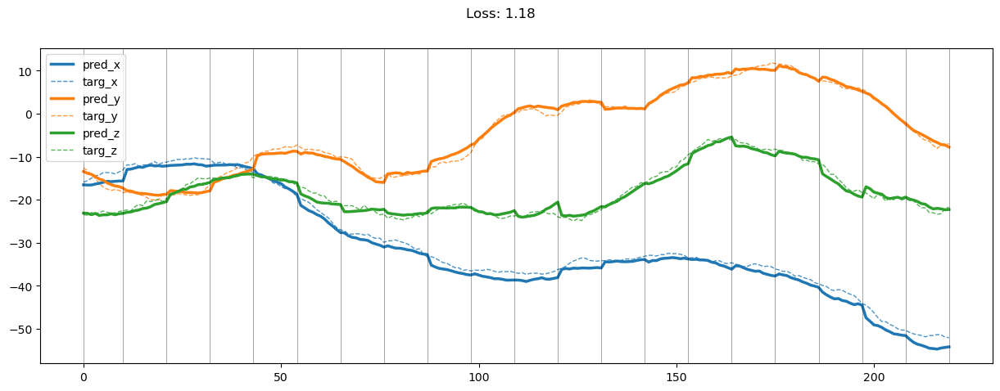

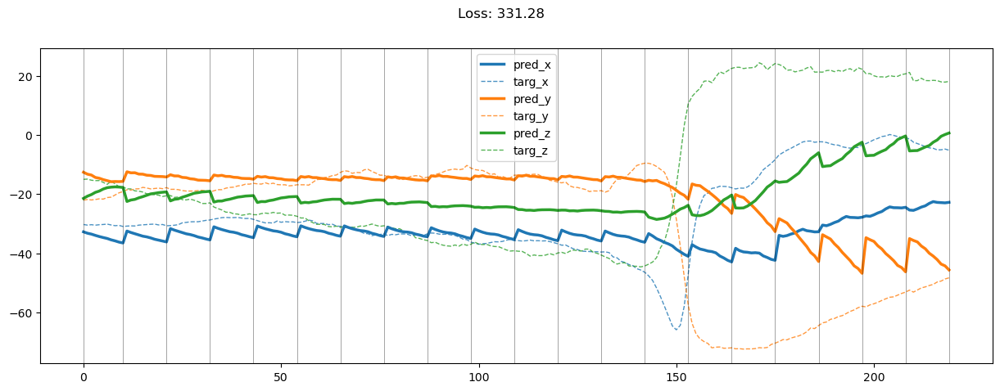

01449: train total loss:  1.760, pred loss:  1.760, valid total loss:  105.694, pred loss:  105.694


100%|██████████| 7/7 [00:00<00:00, 33.95it/s]


01450: train total loss:  1.801, pred loss:  1.801, valid total loss:  110.172, pred loss:  110.172


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01451: train total loss:  1.771, pred loss:  1.771, valid total loss:  106.594, pred loss:  106.594


100%|██████████| 7/7 [00:00<00:00, 33.71it/s]


01452: train total loss:  1.731, pred loss:  1.731, valid total loss:  107.085, pred loss:  107.085


100%|██████████| 7/7 [00:00<00:00, 32.96it/s]


01453: train total loss:  1.716, pred loss:  1.716, valid total loss:  107.580, pred loss:  107.580


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01454: train total loss:  1.673, pred loss:  1.673, valid total loss:  104.325, pred loss:  104.325


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


01455: train total loss:  1.745, pred loss:  1.745, valid total loss:  102.959, pred loss:  102.959


100%|██████████| 7/7 [00:00<00:00, 34.29it/s]


01456: train total loss:  1.749, pred loss:  1.749, valid total loss:  104.192, pred loss:  104.192


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


01457: train total loss:  1.744, pred loss:  1.744, valid total loss:  105.929, pred loss:  105.929


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


01458: train total loss:  1.776, pred loss:  1.776, valid total loss:  107.949, pred loss:  107.949


100%|██████████| 7/7 [00:00<00:00, 33.04it/s]


01459: train total loss:  1.738, pred loss:  1.738, valid total loss:  103.149, pred loss:  103.149


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


01460: train total loss:  1.707, pred loss:  1.707, valid total loss:  106.182, pred loss:  106.182


100%|██████████| 7/7 [00:00<00:00, 34.09it/s]


01461: train total loss:  1.785, pred loss:  1.785, valid total loss:  108.390, pred loss:  108.390


100%|██████████| 7/7 [00:00<00:00, 34.36it/s]


01462: train total loss:  1.762, pred loss:  1.762, valid total loss:  103.890, pred loss:  103.890


100%|██████████| 7/7 [00:00<00:00, 33.97it/s]


01463: train total loss:  1.731, pred loss:  1.731, valid total loss:  108.219, pred loss:  108.219


100%|██████████| 7/7 [00:00<00:00, 33.97it/s]


01464: train total loss:  1.781, pred loss:  1.781, valid total loss:  109.803, pred loss:  109.803


100%|██████████| 7/7 [00:00<00:00, 31.47it/s]


01465: train total loss:  1.760, pred loss:  1.760, valid total loss:  106.890, pred loss:  106.890


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


01466: train total loss:  1.746, pred loss:  1.746, valid total loss:  110.360, pred loss:  110.360


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


01467: train total loss:  1.729, pred loss:  1.729, valid total loss:  111.381, pred loss:  111.381


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


01468: train total loss:  1.730, pred loss:  1.730, valid total loss:  106.746, pred loss:  106.746


100%|██████████| 7/7 [00:00<00:00, 33.44it/s]


01469: train total loss:  1.693, pred loss:  1.693, valid total loss:  110.483, pred loss:  110.483


100%|██████████| 7/7 [00:00<00:00, 33.79it/s]


01470: train total loss:  1.748, pred loss:  1.748, valid total loss:  113.724, pred loss:  113.724


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


01471: train total loss:  1.774, pred loss:  1.774, valid total loss:  110.850, pred loss:  110.850


100%|██████████| 7/7 [00:00<00:00, 33.19it/s]


01472: train total loss:  1.710, pred loss:  1.710, valid total loss:  105.810, pred loss:  105.810


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01473: train total loss:  1.717, pred loss:  1.717, valid total loss:  108.077, pred loss:  108.077


100%|██████████| 7/7 [00:00<00:00, 33.17it/s]


01474: train total loss:  1.742, pred loss:  1.742, valid total loss:  111.272, pred loss:  111.272


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


01475: train total loss:  1.729, pred loss:  1.729, valid total loss:  110.144, pred loss:  110.144


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


01476: train total loss:  1.787, pred loss:  1.787, valid total loss:  112.671, pred loss:  112.671


100%|██████████| 7/7 [00:00<00:00, 33.22it/s]


01477: train total loss:  1.736, pred loss:  1.736, valid total loss:  111.218, pred loss:  111.218


100%|██████████| 7/7 [00:00<00:00, 33.85it/s]


01478: train total loss:  1.791, pred loss:  1.791, valid total loss:  106.962, pred loss:  106.962


100%|██████████| 7/7 [00:00<00:00, 33.44it/s]


01479: train total loss:  1.785, pred loss:  1.785, valid total loss:  105.661, pred loss:  105.661


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01480: train total loss:  1.804, pred loss:  1.804, valid total loss:  107.536, pred loss:  107.536


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


01481: train total loss:  1.767, pred loss:  1.767, valid total loss:  107.754, pred loss:  107.754


100%|██████████| 7/7 [00:00<00:00, 33.25it/s]


01482: train total loss:  1.741, pred loss:  1.741, valid total loss:  111.205, pred loss:  111.205


100%|██████████| 7/7 [00:00<00:00, 23.99it/s]


01483: train total loss:  1.760, pred loss:  1.760, valid total loss:  106.897, pred loss:  106.897


100%|██████████| 7/7 [00:00<00:00, 29.83it/s]


01484: train total loss:  1.812, pred loss:  1.812, valid total loss:  109.446, pred loss:  109.446


100%|██████████| 7/7 [00:00<00:00, 30.30it/s]


01485: train total loss:  1.823, pred loss:  1.823, valid total loss:  106.650, pred loss:  106.650


100%|██████████| 7/7 [00:00<00:00, 30.45it/s]


01486: train total loss:  1.765, pred loss:  1.765, valid total loss:  104.687, pred loss:  104.687


100%|██████████| 7/7 [00:00<00:00, 30.43it/s]


01487: train total loss:  1.774, pred loss:  1.774, valid total loss:  107.574, pred loss:  107.574


100%|██████████| 7/7 [00:00<00:00, 27.84it/s]


01488: train total loss:  1.732, pred loss:  1.732, valid total loss:  104.537, pred loss:  104.537


100%|██████████| 7/7 [00:00<00:00, 23.89it/s]


01489: train total loss:  1.744, pred loss:  1.744, valid total loss:  108.495, pred loss:  108.495


100%|██████████| 7/7 [00:00<00:00, 30.69it/s]


01490: train total loss:  1.751, pred loss:  1.751, valid total loss:  105.588, pred loss:  105.588


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


01491: train total loss:  1.775, pred loss:  1.775, valid total loss:  107.035, pred loss:  107.035


100%|██████████| 7/7 [00:00<00:00, 29.63it/s]


01492: train total loss:  1.818, pred loss:  1.818, valid total loss:  113.039, pred loss:  113.039


100%|██████████| 7/7 [00:00<00:00, 26.12it/s]


01493: train total loss:  1.777, pred loss:  1.777, valid total loss:  111.376, pred loss:  111.376


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01494: train total loss:  1.733, pred loss:  1.733, valid total loss:  110.752, pred loss:  110.752


100%|██████████| 7/7 [00:00<00:00, 33.89it/s]


01495: train total loss:  1.668, pred loss:  1.668, valid total loss:  112.491, pred loss:  112.491


100%|██████████| 7/7 [00:00<00:00, 29.47it/s]


01496: train total loss:  1.709, pred loss:  1.709, valid total loss:  105.955, pred loss:  105.955


100%|██████████| 7/7 [00:00<00:00, 30.29it/s]


01497: train total loss:  1.724, pred loss:  1.724, valid total loss:  107.761, pred loss:  107.761


100%|██████████| 7/7 [00:00<00:00, 24.62it/s]


01498: train total loss:  1.685, pred loss:  1.685, valid total loss:  106.424, pred loss:  106.424


100%|██████████| 7/7 [00:00<00:00, 34.03it/s]


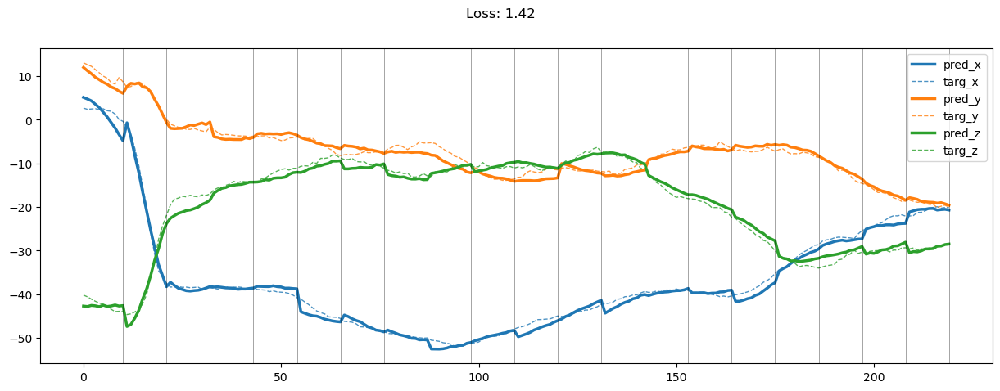

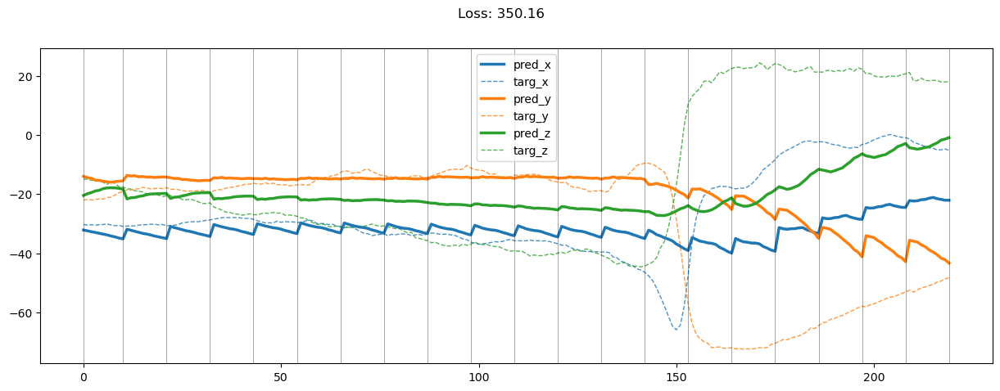

01499: train total loss:  1.694, pred loss:  1.694, valid total loss:  111.501, pred loss:  111.501


100%|██████████| 7/7 [00:00<00:00, 30.36it/s]


01500: train total loss:  1.682, pred loss:  1.682, valid total loss:  109.266, pred loss:  109.266


100%|██████████| 7/7 [00:00<00:00, 29.71it/s]


01501: train total loss:  1.670, pred loss:  1.670, valid total loss:  103.388, pred loss:  103.388


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


01502: train total loss:  1.698, pred loss:  1.698, valid total loss:  110.453, pred loss:  110.453


100%|██████████| 7/7 [00:00<00:00, 30.10it/s]


01503: train total loss:  1.625, pred loss:  1.625, valid total loss:  113.744, pred loss:  113.744


100%|██████████| 7/7 [00:00<00:00, 29.92it/s]


01504: train total loss:  1.733, pred loss:  1.733, valid total loss:  110.481, pred loss:  110.481


100%|██████████| 7/7 [00:00<00:00, 29.90it/s]


01505: train total loss:  1.674, pred loss:  1.674, valid total loss:  107.842, pred loss:  107.842


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


01506: train total loss:  1.715, pred loss:  1.715, valid total loss:  109.831, pred loss:  109.831


100%|██████████| 7/7 [00:00<00:00, 29.32it/s]


01507: train total loss:  1.672, pred loss:  1.672, valid total loss:  108.985, pred loss:  108.985


100%|██████████| 7/7 [00:00<00:00, 29.53it/s]


01508: train total loss:  1.660, pred loss:  1.660, valid total loss:  109.392, pred loss:  109.392


100%|██████████| 7/7 [00:00<00:00, 29.51it/s]


01509: train total loss:  1.714, pred loss:  1.714, valid total loss:  109.882, pred loss:  109.882


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


01510: train total loss:  1.693, pred loss:  1.693, valid total loss:  109.828, pred loss:  109.828


100%|██████████| 7/7 [00:00<00:00, 29.92it/s]


01511: train total loss:  1.683, pred loss:  1.683, valid total loss:  108.834, pred loss:  108.834


100%|██████████| 7/7 [00:00<00:00, 29.77it/s]


01512: train total loss:  1.729, pred loss:  1.729, valid total loss:  108.193, pred loss:  108.193


100%|██████████| 7/7 [00:00<00:00, 28.00it/s]


01513: train total loss:  1.707, pred loss:  1.707, valid total loss:  109.300, pred loss:  109.300


100%|██████████| 7/7 [00:00<00:00, 29.91it/s]


01514: train total loss:  1.652, pred loss:  1.652, valid total loss:  110.014, pred loss:  110.014


100%|██████████| 7/7 [00:00<00:00, 29.91it/s]


01515: train total loss:  1.604, pred loss:  1.604, valid total loss:  104.896, pred loss:  104.896


100%|██████████| 7/7 [00:00<00:00, 29.68it/s]


01516: train total loss:  1.684, pred loss:  1.684, valid total loss:  106.138, pred loss:  106.138


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


01517: train total loss:  1.684, pred loss:  1.684, valid total loss:  108.408, pred loss:  108.408


100%|██████████| 7/7 [00:00<00:00, 29.78it/s]


01518: train total loss:  1.723, pred loss:  1.723, valid total loss:  108.015, pred loss:  108.015


100%|██████████| 7/7 [00:00<00:00, 28.33it/s]


01519: train total loss:  1.705, pred loss:  1.705, valid total loss:  108.460, pred loss:  108.460


100%|██████████| 7/7 [00:00<00:00, 29.81it/s]


01520: train total loss:  1.678, pred loss:  1.678, valid total loss:  108.868, pred loss:  108.868


100%|██████████| 7/7 [00:00<00:00, 33.88it/s]


01521: train total loss:  1.767, pred loss:  1.767, valid total loss:  110.870, pred loss:  110.870


100%|██████████| 7/7 [00:00<00:00, 34.16it/s]


01522: train total loss:  1.752, pred loss:  1.752, valid total loss:  111.570, pred loss:  111.570


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


01523: train total loss:  1.725, pred loss:  1.725, valid total loss:  115.607, pred loss:  115.607


100%|██████████| 7/7 [00:00<00:00, 31.74it/s]


01524: train total loss:  1.688, pred loss:  1.688, valid total loss:  116.143, pred loss:  116.143


100%|██████████| 7/7 [00:00<00:00, 32.53it/s]


01525: train total loss:  1.661, pred loss:  1.661, valid total loss:  112.212, pred loss:  112.212


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01526: train total loss:  1.692, pred loss:  1.692, valid total loss:  115.254, pred loss:  115.254


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


01527: train total loss:  1.640, pred loss:  1.640, valid total loss:  113.429, pred loss:  113.429


100%|██████████| 7/7 [00:00<00:00, 34.15it/s]


01528: train total loss:  1.727, pred loss:  1.727, valid total loss:  115.919, pred loss:  115.919


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01529: train total loss:  1.697, pred loss:  1.697, valid total loss:  115.757, pred loss:  115.757


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


01530: train total loss:  1.665, pred loss:  1.665, valid total loss:  111.584, pred loss:  111.584


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


01531: train total loss:  1.630, pred loss:  1.630, valid total loss:  113.536, pred loss:  113.536


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01532: train total loss:  1.670, pred loss:  1.670, valid total loss:  117.539, pred loss:  117.539


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01533: train total loss:  1.667, pred loss:  1.667, valid total loss:  113.402, pred loss:  113.402


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


01534: train total loss:  1.668, pred loss:  1.668, valid total loss:  109.424, pred loss:  109.424


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


01535: train total loss:  1.685, pred loss:  1.685, valid total loss:  112.681, pred loss:  112.681


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01536: train total loss:  1.705, pred loss:  1.705, valid total loss:  111.071, pred loss:  111.071


100%|██████████| 7/7 [00:00<00:00, 22.86it/s]


01537: train total loss:  1.771, pred loss:  1.771, valid total loss:  112.310, pred loss:  112.310


100%|██████████| 7/7 [00:00<00:00, 24.24it/s]


01538: train total loss:  1.783, pred loss:  1.783, valid total loss:  117.140, pred loss:  117.140


100%|██████████| 7/7 [00:00<00:00, 32.13it/s]


01539: train total loss:  1.700, pred loss:  1.700, valid total loss:  114.101, pred loss:  114.101


100%|██████████| 7/7 [00:00<00:00, 33.79it/s]


01540: train total loss:  1.688, pred loss:  1.688, valid total loss:  114.249, pred loss:  114.249


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


01541: train total loss:  1.669, pred loss:  1.669, valid total loss:  115.166, pred loss:  115.166


100%|██████████| 7/7 [00:00<00:00, 33.27it/s]


01542: train total loss:  1.659, pred loss:  1.659, valid total loss:  110.053, pred loss:  110.053


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01543: train total loss:  1.595, pred loss:  1.595, valid total loss:  110.372, pred loss:  110.372


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01544: train total loss:  1.607, pred loss:  1.607, valid total loss:  110.706, pred loss:  110.706


100%|██████████| 7/7 [00:00<00:00, 34.23it/s]


01545: train total loss:  1.658, pred loss:  1.658, valid total loss:  113.309, pred loss:  113.309


100%|██████████| 7/7 [00:00<00:00, 28.42it/s]


01546: train total loss:  1.618, pred loss:  1.618, valid total loss:  109.763, pred loss:  109.763


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01547: train total loss:  1.624, pred loss:  1.624, valid total loss:  110.849, pred loss:  110.849


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


01548: train total loss:  1.667, pred loss:  1.667, valid total loss:  108.005, pred loss:  108.005


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


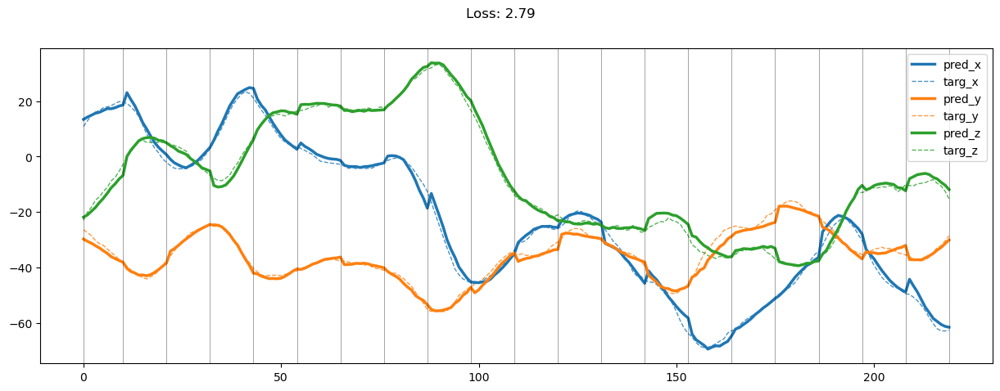

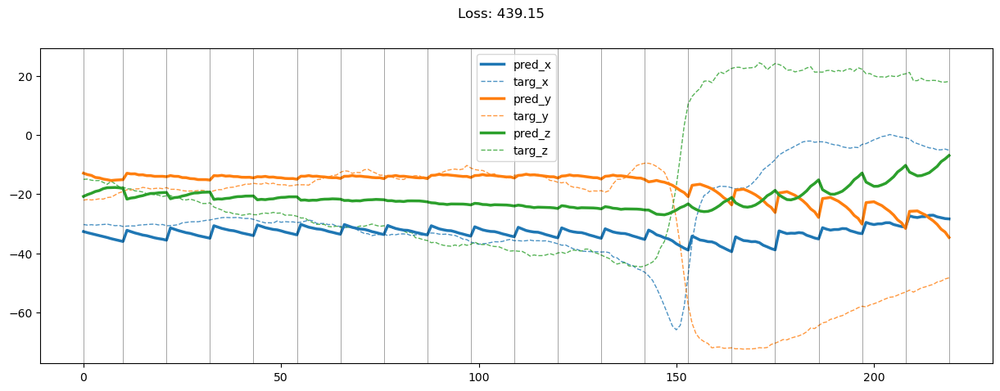

01549: train total loss:  1.687, pred loss:  1.687, valid total loss:  107.128, pred loss:  107.128


100%|██████████| 7/7 [00:00<00:00, 34.07it/s]


01550: train total loss:  1.698, pred loss:  1.698, valid total loss:  107.555, pred loss:  107.555


100%|██████████| 7/7 [00:00<00:00, 34.03it/s]


01551: train total loss:  1.684, pred loss:  1.684, valid total loss:  108.631, pred loss:  108.631


100%|██████████| 7/7 [00:00<00:00, 34.27it/s]


01552: train total loss:  1.747, pred loss:  1.747, valid total loss:  109.678, pred loss:  109.678


100%|██████████| 7/7 [00:00<00:00, 30.43it/s]


01553: train total loss:  1.749, pred loss:  1.749, valid total loss:  105.206, pred loss:  105.206


100%|██████████| 7/7 [00:00<00:00, 33.40it/s]


01554: train total loss:  1.741, pred loss:  1.741, valid total loss:  111.073, pred loss:  111.073


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


01555: train total loss:  1.726, pred loss:  1.726, valid total loss:  109.038, pred loss:  109.038


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01556: train total loss:  1.762, pred loss:  1.762, valid total loss:  110.678, pred loss:  110.678


100%|██████████| 7/7 [00:00<00:00, 33.87it/s]


01557: train total loss:  1.741, pred loss:  1.741, valid total loss:  109.512, pred loss:  109.512


100%|██████████| 7/7 [00:00<00:00, 31.60it/s]


01558: train total loss:  1.699, pred loss:  1.699, valid total loss:  107.547, pred loss:  107.547


100%|██████████| 7/7 [00:00<00:00, 33.88it/s]


01559: train total loss:  1.626, pred loss:  1.626, valid total loss:  112.081, pred loss:  112.081


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


01560: train total loss:  1.658, pred loss:  1.658, valid total loss:  113.837, pred loss:  113.837


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01561: train total loss:  1.579, pred loss:  1.579, valid total loss:  112.017, pred loss:  112.017


100%|██████████| 7/7 [00:00<00:00, 34.27it/s]


01562: train total loss:  1.585, pred loss:  1.585, valid total loss:  111.273, pred loss:  111.273


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


01563: train total loss:  1.567, pred loss:  1.567, valid total loss:  110.748, pred loss:  110.748


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


01564: train total loss:  1.570, pred loss:  1.570, valid total loss:  113.977, pred loss:  113.977


100%|██████████| 7/7 [00:00<00:00, 31.06it/s]


01565: train total loss:  1.610, pred loss:  1.610, valid total loss:  115.183, pred loss:  115.183


100%|██████████| 7/7 [00:00<00:00, 31.37it/s]


01566: train total loss:  1.612, pred loss:  1.612, valid total loss:  113.143, pred loss:  113.143


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


01567: train total loss:  1.565, pred loss:  1.565, valid total loss:  109.524, pred loss:  109.524


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01568: train total loss:  1.565, pred loss:  1.565, valid total loss:  111.509, pred loss:  111.509


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01569: train total loss:  1.569, pred loss:  1.569, valid total loss:  111.482, pred loss:  111.482


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01570: train total loss:  1.540, pred loss:  1.540, valid total loss:  115.235, pred loss:  115.235


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01571: train total loss:  1.603, pred loss:  1.603, valid total loss:  112.150, pred loss:  112.150


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


01572: train total loss:  1.626, pred loss:  1.626, valid total loss:  111.628, pred loss:  111.628


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01573: train total loss:  1.626, pred loss:  1.626, valid total loss:  114.885, pred loss:  114.885


100%|██████████| 7/7 [00:00<00:00, 34.00it/s]


01574: train total loss:  1.656, pred loss:  1.656, valid total loss:  111.189, pred loss:  111.189


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01575: train total loss:  1.672, pred loss:  1.672, valid total loss:  109.085, pred loss:  109.085


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


01576: train total loss:  1.609, pred loss:  1.609, valid total loss:  112.660, pred loss:  112.660


100%|██████████| 7/7 [00:00<00:00, 33.73it/s]


01577: train total loss:  1.623, pred loss:  1.623, valid total loss:  111.045, pred loss:  111.045


100%|██████████| 7/7 [00:00<00:00, 34.09it/s]


01578: train total loss:  1.664, pred loss:  1.664, valid total loss:  111.115, pred loss:  111.115


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


01579: train total loss:  1.648, pred loss:  1.648, valid total loss:  112.511, pred loss:  112.511


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01580: train total loss:  1.604, pred loss:  1.604, valid total loss:  112.081, pred loss:  112.081


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01581: train total loss:  1.614, pred loss:  1.614, valid total loss:  109.954, pred loss:  109.954


100%|██████████| 7/7 [00:00<00:00, 32.74it/s]


01582: train total loss:  1.599, pred loss:  1.599, valid total loss:  111.417, pred loss:  111.417


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


01583: train total loss:  1.708, pred loss:  1.708, valid total loss:  117.168, pred loss:  117.168


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01584: train total loss:  1.689, pred loss:  1.689, valid total loss:  112.995, pred loss:  112.995


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


01585: train total loss:  1.666, pred loss:  1.666, valid total loss:  113.003, pred loss:  113.003


100%|██████████| 7/7 [00:00<00:00, 34.03it/s]


01586: train total loss:  1.578, pred loss:  1.578, valid total loss:  117.065, pred loss:  117.065


100%|██████████| 7/7 [00:00<00:00, 34.18it/s]


01587: train total loss:  1.649, pred loss:  1.649, valid total loss:  114.894, pred loss:  114.894


100%|██████████| 7/7 [00:00<00:00, 29.13it/s]


01588: train total loss:  1.624, pred loss:  1.624, valid total loss:  111.390, pred loss:  111.390


100%|██████████| 7/7 [00:00<00:00, 31.34it/s]


01589: train total loss:  1.618, pred loss:  1.618, valid total loss:  114.007, pred loss:  114.007


100%|██████████| 7/7 [00:00<00:00, 33.30it/s]


01590: train total loss:  1.578, pred loss:  1.578, valid total loss:  111.536, pred loss:  111.536


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


01591: train total loss:  1.586, pred loss:  1.586, valid total loss:  109.158, pred loss:  109.158


100%|██████████| 7/7 [00:00<00:00, 33.85it/s]


01592: train total loss:  1.564, pred loss:  1.564, valid total loss:  112.319, pred loss:  112.319


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


01593: train total loss:  1.565, pred loss:  1.565, valid total loss:  114.024, pred loss:  114.024


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


01594: train total loss:  1.557, pred loss:  1.557, valid total loss:  112.507, pred loss:  112.507


100%|██████████| 7/7 [00:00<00:00, 33.47it/s]


01595: train total loss:  1.556, pred loss:  1.556, valid total loss:  114.906, pred loss:  114.906


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


01596: train total loss:  1.571, pred loss:  1.571, valid total loss:  111.680, pred loss:  111.680


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


01597: train total loss:  1.562, pred loss:  1.562, valid total loss:  112.722, pred loss:  112.722


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01598: train total loss:  1.618, pred loss:  1.618, valid total loss:  109.610, pred loss:  109.610


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


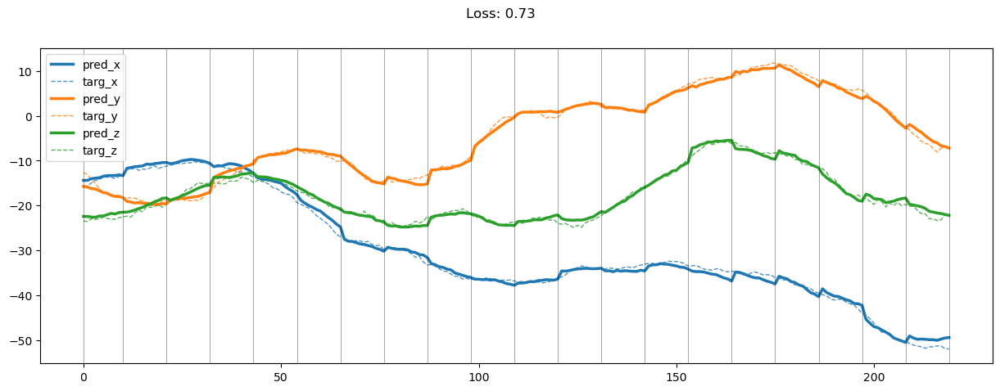

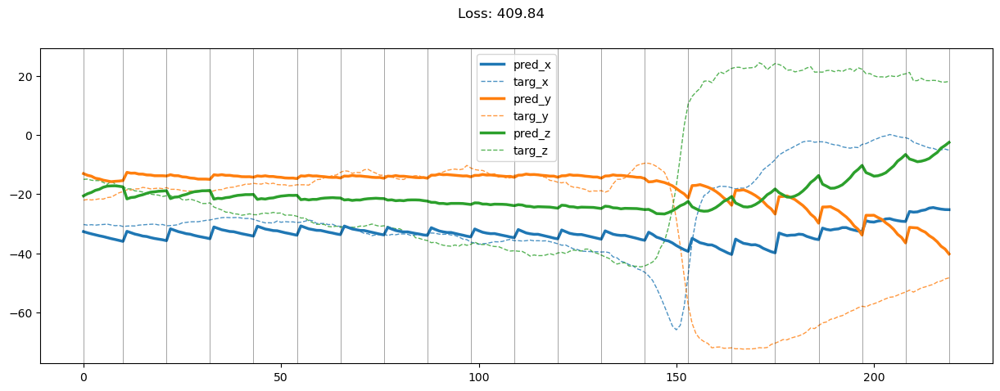

01599: train total loss:  1.643, pred loss:  1.643, valid total loss:  110.129, pred loss:  110.129


100%|██████████| 7/7 [00:00<00:00, 34.25it/s]


01600: train total loss:  1.663, pred loss:  1.663, valid total loss:  113.429, pred loss:  113.429


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01601: train total loss:  1.682, pred loss:  1.682, valid total loss:  113.277, pred loss:  113.277


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


01602: train total loss:  1.736, pred loss:  1.736, valid total loss:  108.182, pred loss:  108.182


100%|██████████| 7/7 [00:00<00:00, 34.30it/s]


01603: train total loss:  1.724, pred loss:  1.724, valid total loss:  111.114, pred loss:  111.114


100%|██████████| 7/7 [00:00<00:00, 33.91it/s]


01604: train total loss:  1.688, pred loss:  1.688, valid total loss:  111.949, pred loss:  111.949


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


01605: train total loss:  1.669, pred loss:  1.669, valid total loss:  117.010, pred loss:  117.010


100%|██████████| 7/7 [00:00<00:00, 33.89it/s]


01606: train total loss:  1.596, pred loss:  1.596, valid total loss:  112.448, pred loss:  112.448


100%|██████████| 7/7 [00:00<00:00, 33.36it/s]


01607: train total loss:  1.599, pred loss:  1.599, valid total loss:  112.920, pred loss:  112.920


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


01608: train total loss:  1.564, pred loss:  1.564, valid total loss:  110.531, pred loss:  110.531


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


01609: train total loss:  1.557, pred loss:  1.557, valid total loss:  114.469, pred loss:  114.469


100%|██████████| 7/7 [00:00<00:00, 33.56it/s]


01610: train total loss:  1.556, pred loss:  1.556, valid total loss:  115.032, pred loss:  115.032


100%|██████████| 7/7 [00:00<00:00, 33.97it/s]


01611: train total loss:  1.573, pred loss:  1.573, valid total loss:  108.570, pred loss:  108.570


100%|██████████| 7/7 [00:00<00:00, 33.73it/s]


01612: train total loss:  1.665, pred loss:  1.665, valid total loss:  109.065, pred loss:  109.065


100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


01613: train total loss:  1.628, pred loss:  1.628, valid total loss:  113.310, pred loss:  113.310


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


01614: train total loss:  1.739, pred loss:  1.739, valid total loss:  114.356, pred loss:  114.356


100%|██████████| 7/7 [00:00<00:00, 33.70it/s]


01615: train total loss:  1.578, pred loss:  1.578, valid total loss:  110.116, pred loss:  110.116


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


01616: train total loss:  1.606, pred loss:  1.606, valid total loss:  110.396, pred loss:  110.396


100%|██████████| 7/7 [00:00<00:00, 33.82it/s]


01617: train total loss:  1.599, pred loss:  1.599, valid total loss:  115.110, pred loss:  115.110


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


01618: train total loss:  1.608, pred loss:  1.608, valid total loss:  111.210, pred loss:  111.210


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


01619: train total loss:  1.570, pred loss:  1.570, valid total loss:  110.371, pred loss:  110.371


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


01620: train total loss:  1.617, pred loss:  1.617, valid total loss:  108.310, pred loss:  108.310


100%|██████████| 7/7 [00:00<00:00, 33.94it/s]


01621: train total loss:  1.561, pred loss:  1.561, valid total loss:  109.243, pred loss:  109.243


100%|██████████| 7/7 [00:00<00:00, 32.14it/s]


01622: train total loss:  1.612, pred loss:  1.612, valid total loss:  112.300, pred loss:  112.300


100%|██████████| 7/7 [00:00<00:00, 33.64it/s]


01623: train total loss:  1.645, pred loss:  1.645, valid total loss:  111.265, pred loss:  111.265


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


01624: train total loss:  1.704, pred loss:  1.704, valid total loss:  111.013, pred loss:  111.013


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


01625: train total loss:  1.823, pred loss:  1.823, valid total loss:  109.026, pred loss:  109.026


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


01626: train total loss:  2.122, pred loss:  2.122, valid total loss:  112.345, pred loss:  112.345


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


01627: train total loss:  3.015, pred loss:  3.015, valid total loss:  123.068, pred loss:  123.068


100%|██████████| 7/7 [00:00<00:00, 32.77it/s]


01628: train total loss:  4.028, pred loss:  4.028, valid total loss:  119.337, pred loss:  119.337


100%|██████████| 7/7 [00:00<00:00, 33.44it/s]


01629: train total loss:  4.733, pred loss:  4.733, valid total loss:  119.585, pred loss:  119.585


100%|██████████| 7/7 [00:00<00:00, 33.87it/s]


01630: train total loss:  3.982, pred loss:  3.982, valid total loss:  128.926, pred loss:  128.926


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01631: train total loss:  3.750, pred loss:  3.750, valid total loss:  105.521, pred loss:  105.521


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01632: train total loss:  3.194, pred loss:  3.194, valid total loss:  118.397, pred loss:  118.397


100%|██████████| 7/7 [00:00<00:00, 34.31it/s]


01633: train total loss:  3.222, pred loss:  3.222, valid total loss:  123.481, pred loss:  123.481


100%|██████████| 7/7 [00:00<00:00, 32.99it/s]


01634: train total loss:  2.769, pred loss:  2.769, valid total loss:  112.799, pred loss:  112.799


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


01635: train total loss:  2.485, pred loss:  2.485, valid total loss:  110.153, pred loss:  110.153


100%|██████████| 7/7 [00:00<00:00, 32.73it/s]


01636: train total loss:  2.204, pred loss:  2.204, valid total loss:  117.633, pred loss:  117.633


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


01637: train total loss:  2.078, pred loss:  2.078, valid total loss:  122.786, pred loss:  122.786


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


01638: train total loss:  2.022, pred loss:  2.022, valid total loss:  119.205, pred loss:  119.205


100%|██████████| 7/7 [00:00<00:00, 33.70it/s]


01639: train total loss:  1.861, pred loss:  1.861, valid total loss:  115.824, pred loss:  115.824


100%|██████████| 7/7 [00:00<00:00, 33.08it/s]


01640: train total loss:  1.796, pred loss:  1.796, valid total loss:  118.644, pred loss:  118.644


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


01641: train total loss:  1.768, pred loss:  1.768, valid total loss:  119.413, pred loss:  119.413


100%|██████████| 7/7 [00:00<00:00, 33.52it/s]


01642: train total loss:  1.733, pred loss:  1.733, valid total loss:  116.569, pred loss:  116.569


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


01643: train total loss:  1.752, pred loss:  1.752, valid total loss:  115.001, pred loss:  115.001


100%|██████████| 7/7 [00:00<00:00, 33.33it/s]


01644: train total loss:  1.651, pred loss:  1.651, valid total loss:  115.380, pred loss:  115.380


100%|██████████| 7/7 [00:00<00:00, 33.62it/s]


01645: train total loss:  1.683, pred loss:  1.683, valid total loss:  115.966, pred loss:  115.966


100%|██████████| 7/7 [00:00<00:00, 33.29it/s]


01646: train total loss:  1.671, pred loss:  1.671, valid total loss:  119.936, pred loss:  119.936


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01647: train total loss:  1.721, pred loss:  1.721, valid total loss:  117.195, pred loss:  117.195


100%|██████████| 7/7 [00:00<00:00, 30.85it/s]


01648: train total loss:  1.650, pred loss:  1.650, valid total loss:  116.380, pred loss:  116.380


100%|██████████| 7/7 [00:00<00:00, 28.11it/s]


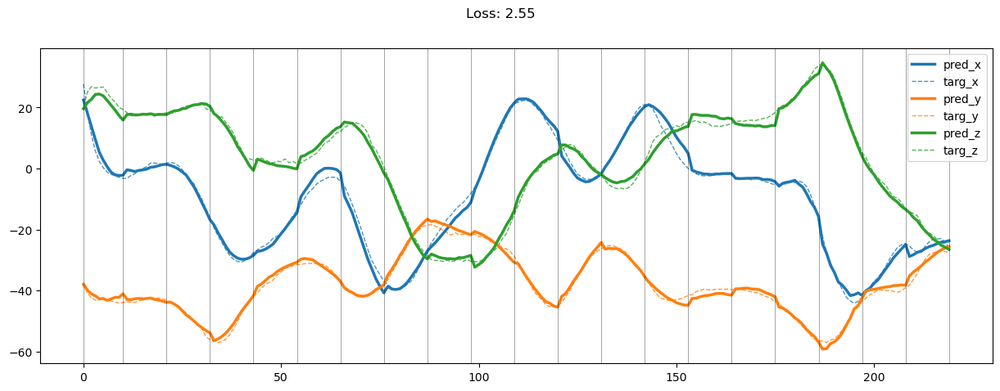

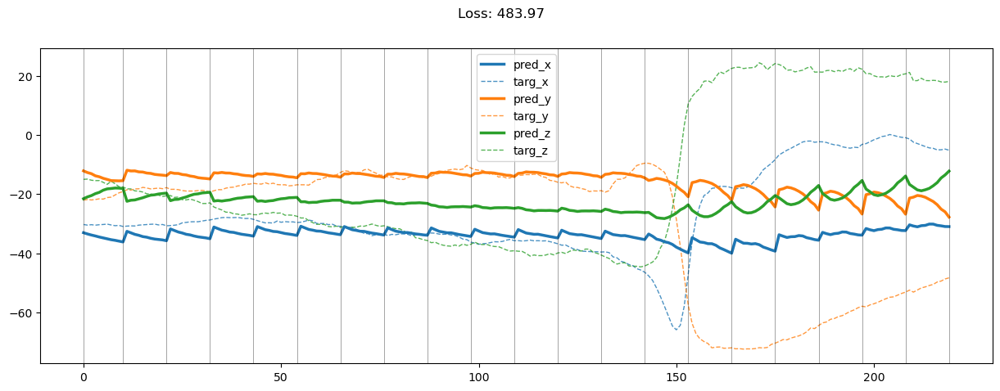

01649: train total loss:  1.625, pred loss:  1.625, valid total loss:  114.633, pred loss:  114.633


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


01650: train total loss:  1.581, pred loss:  1.581, valid total loss:  115.170, pred loss:  115.170


100%|██████████| 7/7 [00:00<00:00, 31.11it/s]


01651: train total loss:  1.594, pred loss:  1.594, valid total loss:  115.697, pred loss:  115.697


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


01652: train total loss:  1.639, pred loss:  1.639, valid total loss:  115.788, pred loss:  115.788


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


01653: train total loss:  1.671, pred loss:  1.671, valid total loss:  115.619, pred loss:  115.619


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01654: train total loss:  1.562, pred loss:  1.562, valid total loss:  116.679, pred loss:  116.679


100%|██████████| 7/7 [00:00<00:00, 33.91it/s]


01655: train total loss:  1.611, pred loss:  1.611, valid total loss:  115.974, pred loss:  115.974


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01656: train total loss:  1.580, pred loss:  1.580, valid total loss:  116.114, pred loss:  116.114


100%|██████████| 7/7 [00:00<00:00, 34.13it/s]


01657: train total loss:  1.585, pred loss:  1.585, valid total loss:  114.420, pred loss:  114.420


100%|██████████| 7/7 [00:00<00:00, 33.80it/s]


01658: train total loss:  1.524, pred loss:  1.524, valid total loss:  115.614, pred loss:  115.614


100%|██████████| 7/7 [00:00<00:00, 33.43it/s]


01659: train total loss:  1.564, pred loss:  1.564, valid total loss:  116.447, pred loss:  116.447


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


01660: train total loss:  1.506, pred loss:  1.506, valid total loss:  116.977, pred loss:  116.977


100%|██████████| 7/7 [00:00<00:00, 33.52it/s]


01661: train total loss:  1.529, pred loss:  1.529, valid total loss:  113.382, pred loss:  113.382


100%|██████████| 7/7 [00:00<00:00, 31.28it/s]


01662: train total loss:  1.520, pred loss:  1.520, valid total loss:  114.792, pred loss:  114.792


100%|██████████| 7/7 [00:00<00:00, 30.62it/s]


01663: train total loss:  1.531, pred loss:  1.531, valid total loss:  115.872, pred loss:  115.872


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01664: train total loss:  1.512, pred loss:  1.512, valid total loss:  116.349, pred loss:  116.349


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


01665: train total loss:  1.502, pred loss:  1.502, valid total loss:  111.664, pred loss:  111.664


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


01666: train total loss:  1.537, pred loss:  1.537, valid total loss:  119.548, pred loss:  119.548


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


01667: train total loss:  1.554, pred loss:  1.554, valid total loss:  117.963, pred loss:  117.963


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


01668: train total loss:  1.529, pred loss:  1.529, valid total loss:  115.831, pred loss:  115.831


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01669: train total loss:  1.590, pred loss:  1.590, valid total loss:  116.580, pred loss:  116.580


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


01670: train total loss:  1.576, pred loss:  1.576, valid total loss:  119.284, pred loss:  119.284


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01671: train total loss:  1.559, pred loss:  1.559, valid total loss:  117.026, pred loss:  117.026


100%|██████████| 7/7 [00:00<00:00, 34.31it/s]


01672: train total loss:  1.545, pred loss:  1.545, valid total loss:  116.661, pred loss:  116.661


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01673: train total loss:  1.542, pred loss:  1.542, valid total loss:  116.147, pred loss:  116.147


100%|██████████| 7/7 [00:00<00:00, 33.00it/s]


01674: train total loss:  1.537, pred loss:  1.537, valid total loss:  113.649, pred loss:  113.649


100%|██████████| 7/7 [00:00<00:00, 33.75it/s]


01675: train total loss:  1.514, pred loss:  1.514, valid total loss:  116.708, pred loss:  116.708


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


01676: train total loss:  1.546, pred loss:  1.546, valid total loss:  115.284, pred loss:  115.284


100%|██████████| 7/7 [00:00<00:00, 34.28it/s]


01677: train total loss:  1.539, pred loss:  1.539, valid total loss:  115.024, pred loss:  115.024


100%|██████████| 7/7 [00:00<00:00, 34.03it/s]


01678: train total loss:  1.539, pred loss:  1.539, valid total loss:  117.126, pred loss:  117.126


100%|██████████| 7/7 [00:00<00:00, 33.87it/s]


01679: train total loss:  1.553, pred loss:  1.553, valid total loss:  117.068, pred loss:  117.068


100%|██████████| 7/7 [00:00<00:00, 33.18it/s]


01680: train total loss:  1.530, pred loss:  1.530, valid total loss:  113.194, pred loss:  113.194


100%|██████████| 7/7 [00:00<00:00, 31.68it/s]


01681: train total loss:  1.558, pred loss:  1.558, valid total loss:  116.620, pred loss:  116.620


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


01682: train total loss:  1.584, pred loss:  1.584, valid total loss:  117.448, pred loss:  117.448


100%|██████████| 7/7 [00:00<00:00, 33.58it/s]


01683: train total loss:  1.572, pred loss:  1.572, valid total loss:  118.884, pred loss:  118.884


100%|██████████| 7/7 [00:00<00:00, 34.31it/s]


01684: train total loss:  1.579, pred loss:  1.579, valid total loss:  116.404, pred loss:  116.404


100%|██████████| 7/7 [00:00<00:00, 33.38it/s]


01685: train total loss:  1.568, pred loss:  1.568, valid total loss:  118.094, pred loss:  118.094


100%|██████████| 7/7 [00:00<00:00, 33.86it/s]


01686: train total loss:  1.498, pred loss:  1.498, valid total loss:  118.896, pred loss:  118.896


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01687: train total loss:  1.564, pred loss:  1.564, valid total loss:  118.108, pred loss:  118.108


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


01688: train total loss:  1.473, pred loss:  1.473, valid total loss:  118.514, pred loss:  118.514


100%|██████████| 7/7 [00:00<00:00, 33.74it/s]


01689: train total loss:  1.489, pred loss:  1.489, valid total loss:  115.928, pred loss:  115.928


100%|██████████| 7/7 [00:00<00:00, 33.53it/s]


01690: train total loss:  1.487, pred loss:  1.487, valid total loss:  117.837, pred loss:  117.837


100%|██████████| 7/7 [00:00<00:00, 34.30it/s]


01691: train total loss:  1.478, pred loss:  1.478, valid total loss:  117.722, pred loss:  117.722


100%|██████████| 7/7 [00:00<00:00, 33.70it/s]


01692: train total loss:  1.494, pred loss:  1.494, valid total loss:  119.109, pred loss:  119.109


100%|██████████| 7/7 [00:00<00:00, 33.92it/s]


01693: train total loss:  1.518, pred loss:  1.518, valid total loss:  121.523, pred loss:  121.523


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


01694: train total loss:  1.514, pred loss:  1.514, valid total loss:  118.485, pred loss:  118.485


100%|██████████| 7/7 [00:00<00:00, 28.42it/s]


01695: train total loss:  1.525, pred loss:  1.525, valid total loss:  116.155, pred loss:  116.155


100%|██████████| 7/7 [00:00<00:00, 30.37it/s]


01696: train total loss:  1.566, pred loss:  1.566, valid total loss:  115.146, pred loss:  115.146


100%|██████████| 7/7 [00:00<00:00, 26.51it/s]


01697: train total loss:  1.543, pred loss:  1.543, valid total loss:  117.583, pred loss:  117.583


100%|██████████| 7/7 [00:00<00:00, 30.44it/s]


01698: train total loss:  1.560, pred loss:  1.560, valid total loss:  117.168, pred loss:  117.168


100%|██████████| 7/7 [00:00<00:00, 30.11it/s]


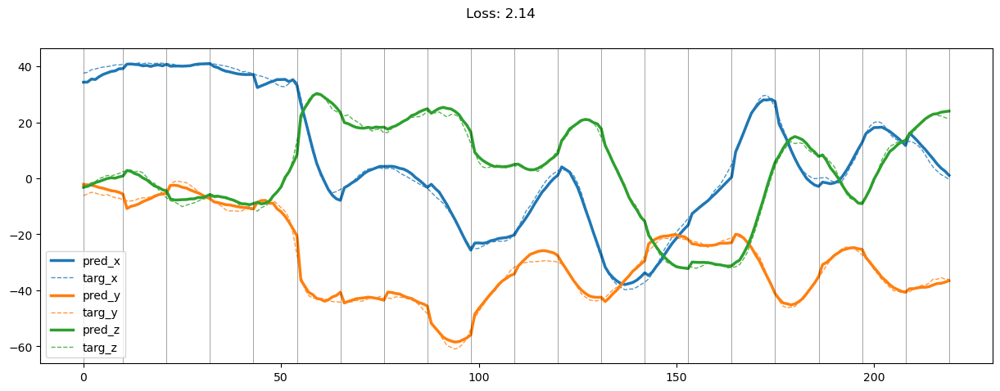

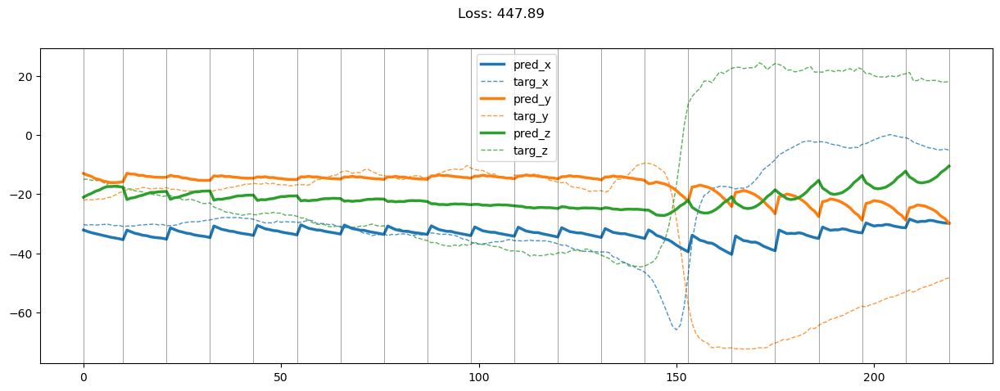

01699: train total loss:  1.507, pred loss:  1.507, valid total loss:  117.880, pred loss:  117.880


100%|██████████| 7/7 [00:00<00:00, 29.66it/s]


01700: train total loss:  1.496, pred loss:  1.496, valid total loss:  118.286, pred loss:  118.286


100%|██████████| 7/7 [00:00<00:00, 29.85it/s]


01701: train total loss:  1.504, pred loss:  1.504, valid total loss:  118.480, pred loss:  118.480


100%|██████████| 7/7 [00:00<00:00, 28.96it/s]


01702: train total loss:  1.541, pred loss:  1.541, valid total loss:  119.715, pred loss:  119.715


100%|██████████| 7/7 [00:00<00:00, 30.01it/s]


01703: train total loss:  1.519, pred loss:  1.519, valid total loss:  117.668, pred loss:  117.668


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


01704: train total loss:  1.543, pred loss:  1.543, valid total loss:  115.810, pred loss:  115.810


100%|██████████| 7/7 [00:00<00:00, 29.93it/s]


01705: train total loss:  1.532, pred loss:  1.532, valid total loss:  115.591, pred loss:  115.591


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


01706: train total loss:  1.589, pred loss:  1.589, valid total loss:  116.463, pred loss:  116.463


100%|██████████| 7/7 [00:00<00:00, 28.97it/s]


01707: train total loss:  1.544, pred loss:  1.544, valid total loss:  119.907, pred loss:  119.907


100%|██████████| 7/7 [00:00<00:00, 30.23it/s]


01708: train total loss:  1.554, pred loss:  1.554, valid total loss:  116.723, pred loss:  116.723


100%|██████████| 7/7 [00:00<00:00, 30.15it/s]


01709: train total loss:  1.532, pred loss:  1.532, valid total loss:  118.208, pred loss:  118.208


100%|██████████| 7/7 [00:00<00:00, 30.28it/s]


01710: train total loss:  1.502, pred loss:  1.502, valid total loss:  117.331, pred loss:  117.331


100%|██████████| 7/7 [00:00<00:00, 30.04it/s]


01711: train total loss:  1.526, pred loss:  1.526, valid total loss:  116.088, pred loss:  116.088


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


01712: train total loss:  1.547, pred loss:  1.547, valid total loss:  117.779, pred loss:  117.779


100%|██████████| 7/7 [00:00<00:00, 26.69it/s]


01713: train total loss:  1.506, pred loss:  1.506, valid total loss:  122.045, pred loss:  122.045


100%|██████████| 7/7 [00:00<00:00, 29.40it/s]


01714: train total loss:  1.557, pred loss:  1.557, valid total loss:  119.890, pred loss:  119.890


100%|██████████| 7/7 [00:00<00:00, 24.50it/s]


01715: train total loss:  1.524, pred loss:  1.524, valid total loss:  120.142, pred loss:  120.142


100%|██████████| 7/7 [00:00<00:00, 30.20it/s]


01716: train total loss:  1.530, pred loss:  1.530, valid total loss:  118.401, pred loss:  118.401


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


01717: train total loss:  1.450, pred loss:  1.450, valid total loss:  114.945, pred loss:  114.945


100%|██████████| 7/7 [00:00<00:00, 29.26it/s]


01718: train total loss:  1.460, pred loss:  1.460, valid total loss:  121.248, pred loss:  121.248


100%|██████████| 7/7 [00:00<00:00, 29.99it/s]


01719: train total loss:  1.393, pred loss:  1.393, valid total loss:  122.267, pred loss:  122.267


100%|██████████| 7/7 [00:00<00:00, 29.94it/s]


01720: train total loss:  1.437, pred loss:  1.437, valid total loss:  118.404, pred loss:  118.404


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


01721: train total loss:  1.473, pred loss:  1.473, valid total loss:  120.390, pred loss:  120.390


100%|██████████| 7/7 [00:00<00:00, 30.18it/s]


01722: train total loss:  1.488, pred loss:  1.488, valid total loss:  120.246, pred loss:  120.246


100%|██████████| 7/7 [00:00<00:00, 29.51it/s]


01723: train total loss:  1.460, pred loss:  1.460, valid total loss:  118.153, pred loss:  118.153


100%|██████████| 7/7 [00:00<00:00, 30.24it/s]


01724: train total loss:  1.418, pred loss:  1.418, valid total loss:  120.763, pred loss:  120.763


100%|██████████| 7/7 [00:00<00:00, 29.39it/s]


01725: train total loss:  1.425, pred loss:  1.425, valid total loss:  121.858, pred loss:  121.858


100%|██████████| 7/7 [00:00<00:00, 30.24it/s]


01726: train total loss:  1.411, pred loss:  1.411, valid total loss:  118.503, pred loss:  118.503


100%|██████████| 7/7 [00:00<00:00, 30.28it/s]


01727: train total loss:  1.434, pred loss:  1.434, valid total loss:  119.113, pred loss:  119.113


100%|██████████| 7/7 [00:00<00:00, 30.08it/s]


01728: train total loss:  1.422, pred loss:  1.422, valid total loss:  117.524, pred loss:  117.524


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


01729: train total loss:  1.459, pred loss:  1.459, valid total loss:  117.084, pred loss:  117.084


100%|██████████| 7/7 [00:00<00:00, 30.56it/s]


01730: train total loss:  1.437, pred loss:  1.437, valid total loss:  118.459, pred loss:  118.459


100%|██████████| 7/7 [00:00<00:00, 29.77it/s]


01731: train total loss:  1.485, pred loss:  1.485, valid total loss:  117.796, pred loss:  117.796


100%|██████████| 7/7 [00:00<00:00, 27.64it/s]


01732: train total loss:  1.448, pred loss:  1.448, valid total loss:  122.522, pred loss:  122.522


100%|██████████| 7/7 [00:00<00:00, 30.47it/s]


01733: train total loss:  1.500, pred loss:  1.500, valid total loss:  117.733, pred loss:  117.733


100%|██████████| 7/7 [00:00<00:00, 29.35it/s]


01734: train total loss:  1.496, pred loss:  1.496, valid total loss:  117.534, pred loss:  117.534


100%|██████████| 7/7 [00:00<00:00, 30.67it/s]


01735: train total loss:  1.466, pred loss:  1.466, valid total loss:  120.844, pred loss:  120.844


100%|██████████| 7/7 [00:00<00:00, 28.31it/s]


01736: train total loss:  1.423, pred loss:  1.423, valid total loss:  121.545, pred loss:  121.545


100%|██████████| 7/7 [00:00<00:00, 34.10it/s]


01737: train total loss:  1.491, pred loss:  1.491, valid total loss:  116.434, pred loss:  116.434


100%|██████████| 7/7 [00:00<00:00, 23.15it/s]


01738: train total loss:  1.494, pred loss:  1.494, valid total loss:  119.872, pred loss:  119.872


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


01739: train total loss:  1.474, pred loss:  1.474, valid total loss:  116.161, pred loss:  116.161


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01740: train total loss:  1.499, pred loss:  1.499, valid total loss:  116.955, pred loss:  116.955


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01741: train total loss:  1.451, pred loss:  1.451, valid total loss:  118.603, pred loss:  118.603


100%|██████████| 7/7 [00:00<00:00, 33.82it/s]


01742: train total loss:  1.470, pred loss:  1.470, valid total loss:  117.299, pred loss:  117.299


100%|██████████| 7/7 [00:00<00:00, 34.09it/s]


01743: train total loss:  1.470, pred loss:  1.470, valid total loss:  118.855, pred loss:  118.855


100%|██████████| 7/7 [00:00<00:00, 33.85it/s]


01744: train total loss:  1.459, pred loss:  1.459, valid total loss:  116.421, pred loss:  116.421


100%|██████████| 7/7 [00:00<00:00, 33.38it/s]


01745: train total loss:  1.431, pred loss:  1.431, valid total loss:  120.799, pred loss:  120.799


100%|██████████| 7/7 [00:00<00:00, 33.80it/s]


01746: train total loss:  1.485, pred loss:  1.485, valid total loss:  120.171, pred loss:  120.171


100%|██████████| 7/7 [00:00<00:00, 33.51it/s]


01747: train total loss:  1.495, pred loss:  1.495, valid total loss:  120.388, pred loss:  120.388


100%|██████████| 7/7 [00:00<00:00, 33.53it/s]


01748: train total loss:  1.494, pred loss:  1.494, valid total loss:  120.438, pred loss:  120.438


100%|██████████| 7/7 [00:00<00:00, 33.37it/s]


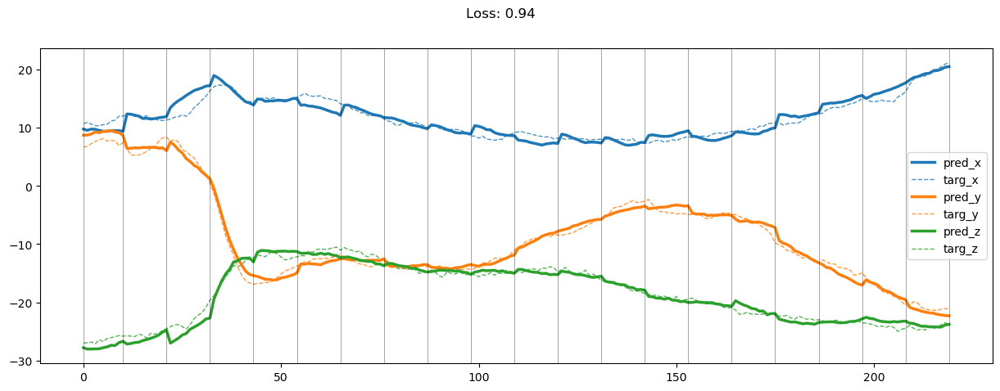

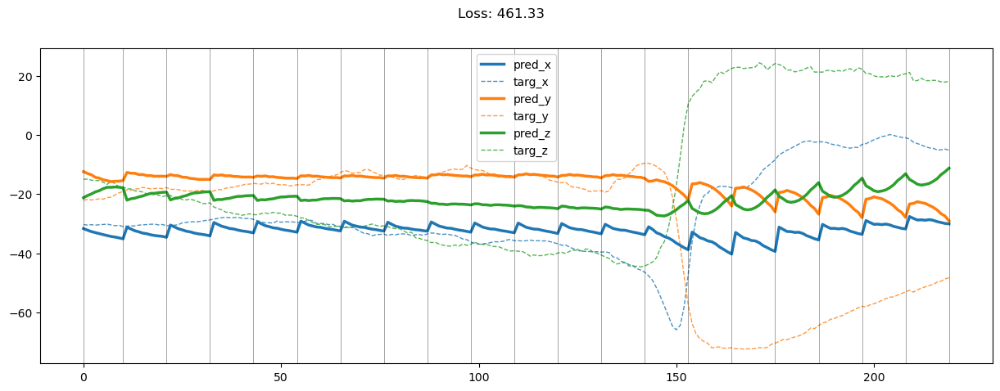

01749: train total loss:  1.495, pred loss:  1.495, valid total loss:  119.368, pred loss:  119.368


100%|██████████| 7/7 [00:00<00:00, 32.25it/s]


01750: train total loss:  1.494, pred loss:  1.494, valid total loss:  119.296, pred loss:  119.296


100%|██████████| 7/7 [00:00<00:00, 33.90it/s]


01751: train total loss:  1.457, pred loss:  1.457, valid total loss:  120.617, pred loss:  120.617


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01752: train total loss:  1.425, pred loss:  1.425, valid total loss:  120.239, pred loss:  120.239


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


01753: train total loss:  1.474, pred loss:  1.474, valid total loss:  117.103, pred loss:  117.103


100%|██████████| 7/7 [00:00<00:00, 33.52it/s]


01754: train total loss:  1.432, pred loss:  1.432, valid total loss:  118.987, pred loss:  118.987


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


01755: train total loss:  1.440, pred loss:  1.440, valid total loss:  122.953, pred loss:  122.953


100%|██████████| 7/7 [00:00<00:00, 28.65it/s]


01756: train total loss:  1.488, pred loss:  1.488, valid total loss:  122.054, pred loss:  122.054


100%|██████████| 7/7 [00:00<00:00, 25.79it/s]


01757: train total loss:  1.459, pred loss:  1.459, valid total loss:  114.460, pred loss:  114.460


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01758: train total loss:  1.437, pred loss:  1.437, valid total loss:  118.299, pred loss:  118.299


100%|██████████| 7/7 [00:00<00:00, 33.72it/s]


01759: train total loss:  1.441, pred loss:  1.441, valid total loss:  118.178, pred loss:  118.178


100%|██████████| 7/7 [00:00<00:00, 31.12it/s]


01760: train total loss:  1.429, pred loss:  1.429, valid total loss:  116.417, pred loss:  116.417


100%|██████████| 7/7 [00:00<00:00, 30.60it/s]


01761: train total loss:  1.460, pred loss:  1.460, valid total loss:  115.478, pred loss:  115.478


100%|██████████| 7/7 [00:00<00:00, 30.33it/s]


01762: train total loss:  1.406, pred loss:  1.406, valid total loss:  116.077, pred loss:  116.077


100%|██████████| 7/7 [00:00<00:00, 30.04it/s]


01763: train total loss:  1.374, pred loss:  1.374, valid total loss:  116.533, pred loss:  116.533


100%|██████████| 7/7 [00:00<00:00, 29.96it/s]


01764: train total loss:  1.434, pred loss:  1.434, valid total loss:  116.268, pred loss:  116.268


100%|██████████| 7/7 [00:00<00:00, 30.17it/s]


01765: train total loss:  1.428, pred loss:  1.428, valid total loss:  116.801, pred loss:  116.801


100%|██████████| 7/7 [00:00<00:00, 30.00it/s]


01766: train total loss:  1.444, pred loss:  1.444, valid total loss:  118.613, pred loss:  118.613


100%|██████████| 7/7 [00:00<00:00, 28.58it/s]


01767: train total loss:  1.436, pred loss:  1.436, valid total loss:  119.831, pred loss:  119.831


100%|██████████| 7/7 [00:00<00:00, 30.54it/s]


01768: train total loss:  1.444, pred loss:  1.444, valid total loss:  116.997, pred loss:  116.997


100%|██████████| 7/7 [00:00<00:00, 30.04it/s]


01769: train total loss:  1.430, pred loss:  1.430, valid total loss:  116.211, pred loss:  116.211


100%|██████████| 7/7 [00:00<00:00, 26.97it/s]


01770: train total loss:  1.433, pred loss:  1.433, valid total loss:  116.619, pred loss:  116.619


100%|██████████| 7/7 [00:00<00:00, 28.54it/s]


01771: train total loss:  1.395, pred loss:  1.395, valid total loss:  119.128, pred loss:  119.128


100%|██████████| 7/7 [00:00<00:00, 29.99it/s]


01772: train total loss:  1.413, pred loss:  1.413, valid total loss:  115.779, pred loss:  115.779


100%|██████████| 7/7 [00:00<00:00, 29.81it/s]


01773: train total loss:  1.447, pred loss:  1.447, valid total loss:  114.868, pred loss:  114.868


100%|██████████| 7/7 [00:00<00:00, 29.54it/s]


01774: train total loss:  1.422, pred loss:  1.422, valid total loss:  116.182, pred loss:  116.182


100%|██████████| 7/7 [00:00<00:00, 30.43it/s]


01775: train total loss:  1.398, pred loss:  1.398, valid total loss:  114.812, pred loss:  114.812


100%|██████████| 7/7 [00:00<00:00, 30.05it/s]


01776: train total loss:  1.415, pred loss:  1.415, valid total loss:  117.804, pred loss:  117.804


100%|██████████| 7/7 [00:00<00:00, 28.34it/s]


01777: train total loss:  1.441, pred loss:  1.441, valid total loss:  119.560, pred loss:  119.560


100%|██████████| 7/7 [00:00<00:00, 28.71it/s]


01778: train total loss:  1.434, pred loss:  1.434, valid total loss:  115.338, pred loss:  115.338


100%|██████████| 7/7 [00:00<00:00, 30.20it/s]


01779: train total loss:  1.440, pred loss:  1.440, valid total loss:  115.388, pred loss:  115.388


100%|██████████| 7/7 [00:00<00:00, 29.85it/s]


01780: train total loss:  1.441, pred loss:  1.441, valid total loss:  117.905, pred loss:  117.905


100%|██████████| 7/7 [00:00<00:00, 25.72it/s]


01781: train total loss:  1.443, pred loss:  1.443, valid total loss:  120.273, pred loss:  120.273


100%|██████████| 7/7 [00:00<00:00, 33.47it/s]


01782: train total loss:  1.472, pred loss:  1.472, valid total loss:  123.020, pred loss:  123.020


100%|██████████| 7/7 [00:00<00:00, 33.06it/s]


01783: train total loss:  1.410, pred loss:  1.410, valid total loss:  120.197, pred loss:  120.197


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


01784: train total loss:  1.398, pred loss:  1.398, valid total loss:  120.724, pred loss:  120.724


100%|██████████| 7/7 [00:00<00:00, 22.36it/s]


01785: train total loss:  1.384, pred loss:  1.384, valid total loss:  118.615, pred loss:  118.615


100%|██████████| 7/7 [00:00<00:00, 23.31it/s]


01786: train total loss:  1.397, pred loss:  1.397, valid total loss:  116.439, pred loss:  116.439


100%|██████████| 7/7 [00:00<00:00, 24.10it/s]


01787: train total loss:  1.356, pred loss:  1.356, valid total loss:  117.536, pred loss:  117.536


100%|██████████| 7/7 [00:00<00:00, 31.71it/s]


01788: train total loss:  1.382, pred loss:  1.382, valid total loss:  117.825, pred loss:  117.825


100%|██████████| 7/7 [00:00<00:00, 33.88it/s]


01789: train total loss:  1.407, pred loss:  1.407, valid total loss:  117.453, pred loss:  117.453


100%|██████████| 7/7 [00:00<00:00, 29.26it/s]


01790: train total loss:  1.360, pred loss:  1.360, valid total loss:  116.999, pred loss:  116.999


100%|██████████| 7/7 [00:00<00:00, 30.39it/s]


01791: train total loss:  1.415, pred loss:  1.415, valid total loss:  116.748, pred loss:  116.748


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


01792: train total loss:  1.460, pred loss:  1.460, valid total loss:  114.632, pred loss:  114.632


100%|██████████| 7/7 [00:00<00:00, 28.94it/s]


01793: train total loss:  1.483, pred loss:  1.483, valid total loss:  119.072, pred loss:  119.072


100%|██████████| 7/7 [00:00<00:00, 26.48it/s]


01794: train total loss:  1.548, pred loss:  1.548, valid total loss:  121.803, pred loss:  121.803


100%|██████████| 7/7 [00:00<00:00, 28.99it/s]


01795: train total loss:  1.491, pred loss:  1.491, valid total loss:  119.912, pred loss:  119.912


100%|██████████| 7/7 [00:00<00:00, 33.78it/s]


01796: train total loss:  1.471, pred loss:  1.471, valid total loss:  119.995, pred loss:  119.995


100%|██████████| 7/7 [00:00<00:00, 33.79it/s]


01797: train total loss:  1.442, pred loss:  1.442, valid total loss:  119.639, pred loss:  119.639


100%|██████████| 7/7 [00:00<00:00, 33.14it/s]


01798: train total loss:  1.435, pred loss:  1.435, valid total loss:  115.963, pred loss:  115.963


100%|██████████| 7/7 [00:00<00:00, 33.63it/s]


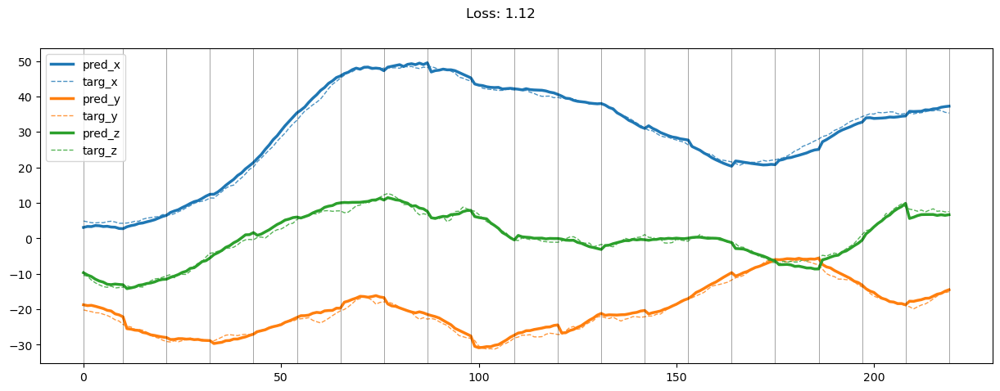

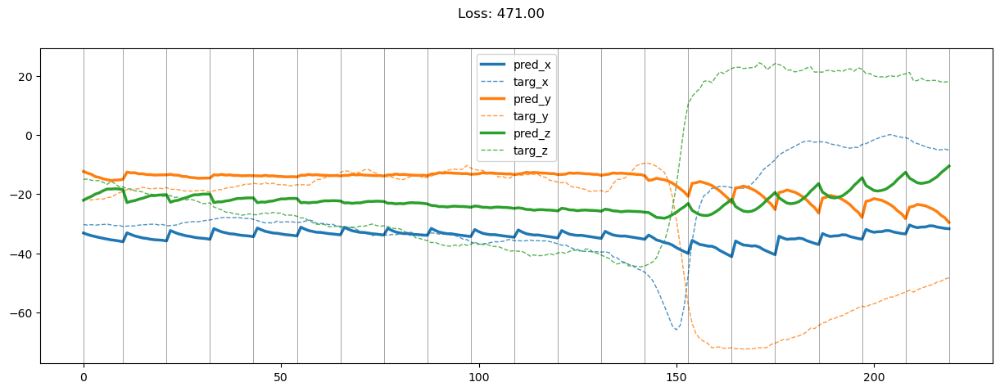

01799: train total loss:  1.467, pred loss:  1.467, valid total loss:  119.475, pred loss:  119.475


100%|██████████| 7/7 [00:00<00:00, 33.53it/s]


01800: train total loss:  1.455, pred loss:  1.455, valid total loss:  114.750, pred loss:  114.750


100%|██████████| 7/7 [00:00<00:00, 33.14it/s]


01801: train total loss:  1.528, pred loss:  1.528, valid total loss:  117.925, pred loss:  117.925


100%|██████████| 7/7 [00:00<00:00, 33.41it/s]


01802: train total loss:  1.453, pred loss:  1.453, valid total loss:  120.035, pred loss:  120.035


100%|██████████| 7/7 [00:00<00:00, 33.54it/s]


01803: train total loss:  1.421, pred loss:  1.421, valid total loss:  117.064, pred loss:  117.064


100%|██████████| 7/7 [00:00<00:00, 30.48it/s]


01804: train total loss:  1.452, pred loss:  1.452, valid total loss:  121.248, pred loss:  121.248


100%|██████████| 7/7 [00:00<00:00, 30.02it/s]


01805: train total loss:  1.415, pred loss:  1.415, valid total loss:  120.990, pred loss:  120.990


100%|██████████| 7/7 [00:00<00:00, 30.29it/s]


01806: train total loss:  1.451, pred loss:  1.451, valid total loss:  117.049, pred loss:  117.049


100%|██████████| 7/7 [00:00<00:00, 30.09it/s]


01807: train total loss:  1.466, pred loss:  1.466, valid total loss:  115.750, pred loss:  115.750


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


01808: train total loss:  1.462, pred loss:  1.462, valid total loss:  118.278, pred loss:  118.278


100%|██████████| 7/7 [00:00<00:00, 29.06it/s]


01809: train total loss:  1.448, pred loss:  1.448, valid total loss:  123.488, pred loss:  123.488


100%|██████████| 7/7 [00:00<00:00, 30.52it/s]


01810: train total loss:  1.385, pred loss:  1.385, valid total loss:  118.058, pred loss:  118.058


100%|██████████| 7/7 [00:00<00:00, 30.35it/s]


01811: train total loss:  1.368, pred loss:  1.368, valid total loss:  118.419, pred loss:  118.419


100%|██████████| 7/7 [00:00<00:00, 28.28it/s]


01812: train total loss:  1.390, pred loss:  1.390, valid total loss:  115.501, pred loss:  115.501


100%|██████████| 7/7 [00:00<00:00, 26.18it/s]


01813: train total loss:  1.376, pred loss:  1.376, valid total loss:  116.528, pred loss:  116.528


100%|██████████| 7/7 [00:00<00:00, 29.86it/s]


01814: train total loss:  1.368, pred loss:  1.368, valid total loss:  116.399, pred loss:  116.399


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


01815: train total loss:  1.410, pred loss:  1.410, valid total loss:  118.077, pred loss:  118.077


100%|██████████| 7/7 [00:00<00:00, 26.23it/s]


01816: train total loss:  1.460, pred loss:  1.460, valid total loss:  119.987, pred loss:  119.987


100%|██████████| 7/7 [00:00<00:00, 23.92it/s]


01817: train total loss:  1.439, pred loss:  1.439, valid total loss:  116.880, pred loss:  116.880


100%|██████████| 7/7 [00:00<00:00, 33.10it/s]


01818: train total loss:  1.410, pred loss:  1.410, valid total loss:  116.840, pred loss:  116.840


100%|██████████| 7/7 [00:00<00:00, 28.96it/s]


01819: train total loss:  1.443, pred loss:  1.443, valid total loss:  122.714, pred loss:  122.714


100%|██████████| 7/7 [00:00<00:00, 30.60it/s]


01820: train total loss:  1.443, pred loss:  1.443, valid total loss:  118.801, pred loss:  118.801


100%|██████████| 7/7 [00:00<00:00, 29.85it/s]


01821: train total loss:  1.445, pred loss:  1.445, valid total loss:  115.883, pred loss:  115.883


100%|██████████| 7/7 [00:00<00:00, 30.29it/s]


01822: train total loss:  1.432, pred loss:  1.432, valid total loss:  120.042, pred loss:  120.042


100%|██████████| 7/7 [00:00<00:00, 27.65it/s]


01823: train total loss:  1.387, pred loss:  1.387, valid total loss:  120.794, pred loss:  120.794


100%|██████████| 7/7 [00:00<00:00, 28.25it/s]


01824: train total loss:  1.383, pred loss:  1.383, valid total loss:  124.380, pred loss:  124.380


100%|██████████| 7/7 [00:00<00:00, 27.42it/s]


01825: train total loss:  1.333, pred loss:  1.333, valid total loss:  117.698, pred loss:  117.698


100%|██████████| 7/7 [00:00<00:00, 28.00it/s]


01826: train total loss:  1.377, pred loss:  1.377, valid total loss:  117.398, pred loss:  117.398


100%|██████████| 7/7 [00:00<00:00, 30.32it/s]


01827: train total loss:  1.322, pred loss:  1.322, valid total loss:  119.764, pred loss:  119.764


100%|██████████| 7/7 [00:00<00:00, 30.69it/s]


01828: train total loss:  1.321, pred loss:  1.321, valid total loss:  116.434, pred loss:  116.434


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


01829: train total loss:  1.333, pred loss:  1.333, valid total loss:  119.178, pred loss:  119.178


100%|██████████| 7/7 [00:00<00:00, 29.88it/s]


01830: train total loss:  1.329, pred loss:  1.329, valid total loss:  119.902, pred loss:  119.902


100%|██████████| 7/7 [00:00<00:00, 24.43it/s]


01831: train total loss:  1.323, pred loss:  1.323, valid total loss:  120.048, pred loss:  120.048


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01832: train total loss:  1.379, pred loss:  1.379, valid total loss:  120.310, pred loss:  120.310


100%|██████████| 7/7 [00:00<00:00, 31.15it/s]


01833: train total loss:  1.338, pred loss:  1.338, valid total loss:  118.623, pred loss:  118.623


100%|██████████| 7/7 [00:00<00:00, 33.42it/s]


01834: train total loss:  1.379, pred loss:  1.379, valid total loss:  120.602, pred loss:  120.602


100%|██████████| 7/7 [00:00<00:00, 29.40it/s]


01835: train total loss:  1.339, pred loss:  1.339, valid total loss:  120.650, pred loss:  120.650


100%|██████████| 7/7 [00:00<00:00, 30.58it/s]


01836: train total loss:  1.353, pred loss:  1.353, valid total loss:  120.271, pred loss:  120.271


100%|██████████| 7/7 [00:00<00:00, 29.78it/s]


01837: train total loss:  1.322, pred loss:  1.322, valid total loss:  118.313, pred loss:  118.313


100%|██████████| 7/7 [00:00<00:00, 29.33it/s]


01838: train total loss:  1.333, pred loss:  1.333, valid total loss:  117.766, pred loss:  117.766


100%|██████████| 7/7 [00:00<00:00, 31.14it/s]


01839: train total loss:  1.331, pred loss:  1.331, valid total loss:  119.665, pred loss:  119.665


100%|██████████| 7/7 [00:00<00:00, 30.19it/s]


01840: train total loss:  1.336, pred loss:  1.336, valid total loss:  120.963, pred loss:  120.963


100%|██████████| 7/7 [00:00<00:00, 33.31it/s]


01841: train total loss:  1.308, pred loss:  1.308, valid total loss:  119.986, pred loss:  119.986


100%|██████████| 7/7 [00:00<00:00, 30.52it/s]


01842: train total loss:  1.308, pred loss:  1.308, valid total loss:  122.726, pred loss:  122.726


100%|██████████| 7/7 [00:00<00:00, 30.70it/s]


01843: train total loss:  1.359, pred loss:  1.359, valid total loss:  119.002, pred loss:  119.002


100%|██████████| 7/7 [00:00<00:00, 29.56it/s]


01844: train total loss:  1.402, pred loss:  1.402, valid total loss:  119.354, pred loss:  119.354


100%|██████████| 7/7 [00:00<00:00, 32.37it/s]


01845: train total loss:  1.394, pred loss:  1.394, valid total loss:  115.797, pred loss:  115.797


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


01846: train total loss:  1.338, pred loss:  1.338, valid total loss:  116.852, pred loss:  116.852


100%|██████████| 7/7 [00:00<00:00, 32.25it/s]


01847: train total loss:  1.445, pred loss:  1.445, valid total loss:  122.086, pred loss:  122.086


100%|██████████| 7/7 [00:00<00:00, 29.87it/s]


01848: train total loss:  1.386, pred loss:  1.386, valid total loss:  123.984, pred loss:  123.984


100%|██████████| 7/7 [00:00<00:00, 28.10it/s]


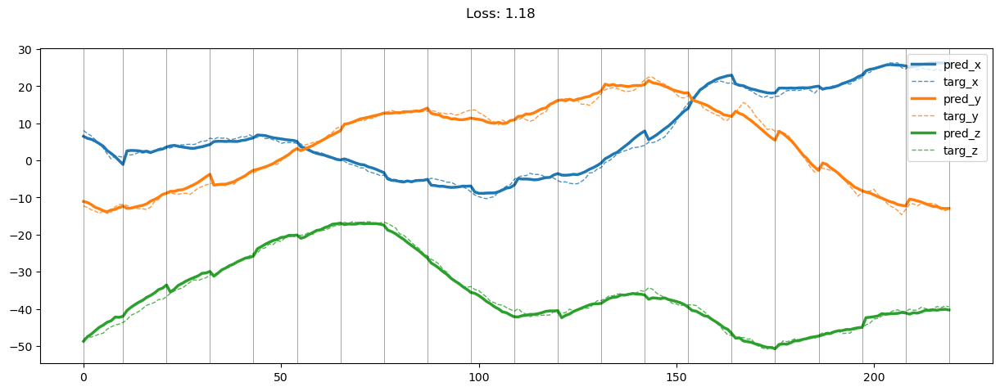

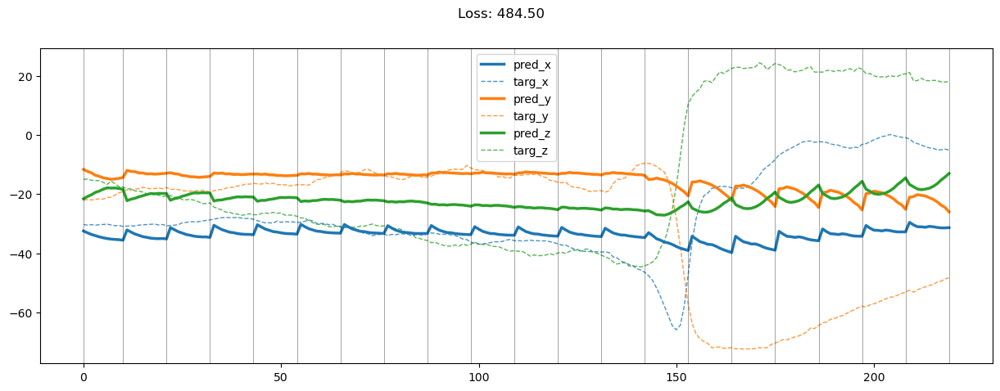

01849: train total loss:  1.393, pred loss:  1.393, valid total loss:  120.369, pred loss:  120.369


100%|██████████| 7/7 [00:00<00:00, 22.56it/s]


01850: train total loss:  1.362, pred loss:  1.362, valid total loss:  121.081, pred loss:  121.081


100%|██████████| 7/7 [00:00<00:00, 23.18it/s]


01851: train total loss:  1.352, pred loss:  1.352, valid total loss:  119.371, pred loss:  119.371


100%|██████████| 7/7 [00:00<00:00, 33.48it/s]


01852: train total loss:  1.344, pred loss:  1.344, valid total loss:  120.956, pred loss:  120.956


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


01853: train total loss:  1.379, pred loss:  1.379, valid total loss:  126.597, pred loss:  126.597


100%|██████████| 7/7 [00:00<00:00, 33.97it/s]


01854: train total loss:  1.383, pred loss:  1.383, valid total loss:  123.169, pred loss:  123.169


100%|██████████| 7/7 [00:00<00:00, 33.98it/s]


01855: train total loss:  1.361, pred loss:  1.361, valid total loss:  122.257, pred loss:  122.257


100%|██████████| 7/7 [00:00<00:00, 28.85it/s]


01856: train total loss:  1.314, pred loss:  1.314, valid total loss:  122.779, pred loss:  122.779


100%|██████████| 7/7 [00:00<00:00, 23.42it/s]


01857: train total loss:  1.342, pred loss:  1.342, valid total loss:  121.703, pred loss:  121.703


100%|██████████| 7/7 [00:00<00:00, 29.18it/s]


01858: train total loss:  1.369, pred loss:  1.369, valid total loss:  116.719, pred loss:  116.719


100%|██████████| 7/7 [00:00<00:00, 30.06it/s]


01859: train total loss:  1.357, pred loss:  1.357, valid total loss:  116.638, pred loss:  116.638


100%|██████████| 7/7 [00:00<00:00, 30.13it/s]


01860: train total loss:  1.361, pred loss:  1.361, valid total loss:  117.301, pred loss:  117.301


100%|██████████| 7/7 [00:00<00:00, 28.81it/s]


01861: train total loss:  1.384, pred loss:  1.384, valid total loss:  114.408, pred loss:  114.408


100%|██████████| 7/7 [00:00<00:00, 27.46it/s]


01862: train total loss:  1.380, pred loss:  1.380, valid total loss:  117.871, pred loss:  117.871


100%|██████████| 7/7 [00:00<00:00, 26.48it/s]


01863: train total loss:  1.326, pred loss:  1.326, valid total loss:  117.335, pred loss:  117.335


100%|██████████| 7/7 [00:00<00:00, 26.54it/s]


01864: train total loss:  1.325, pred loss:  1.325, valid total loss:  118.219, pred loss:  118.219


100%|██████████| 7/7 [00:00<00:00, 22.85it/s]


01865: train total loss:  1.318, pred loss:  1.318, valid total loss:  118.354, pred loss:  118.354


100%|██████████| 7/7 [00:00<00:00, 28.25it/s]


01866: train total loss:  1.307, pred loss:  1.307, valid total loss:  118.743, pred loss:  118.743


100%|██████████| 7/7 [00:00<00:00, 27.94it/s]


01867: train total loss:  1.346, pred loss:  1.346, valid total loss:  118.893, pred loss:  118.893


100%|██████████| 7/7 [00:00<00:00, 22.35it/s]


01868: train total loss:  1.413, pred loss:  1.413, valid total loss:  117.197, pred loss:  117.197


100%|██████████| 7/7 [00:00<00:00, 22.51it/s]


01869: train total loss:  1.415, pred loss:  1.415, valid total loss:  117.011, pred loss:  117.011


100%|██████████| 7/7 [00:00<00:00, 30.21it/s]


01870: train total loss:  1.418, pred loss:  1.418, valid total loss:  122.292, pred loss:  122.292


100%|██████████| 7/7 [00:00<00:00, 28.22it/s]


01871: train total loss:  1.385, pred loss:  1.385, valid total loss:  117.604, pred loss:  117.604


100%|██████████| 7/7 [00:00<00:00, 30.40it/s]


01872: train total loss:  1.369, pred loss:  1.369, valid total loss:  116.375, pred loss:  116.375


100%|██████████| 7/7 [00:00<00:00, 29.82it/s]


01873: train total loss:  1.370, pred loss:  1.370, valid total loss:  119.268, pred loss:  119.268


100%|██████████| 7/7 [00:00<00:00, 28.83it/s]


01874: train total loss:  1.335, pred loss:  1.335, valid total loss:  121.488, pred loss:  121.488


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


01875: train total loss:  1.366, pred loss:  1.366, valid total loss:  113.167, pred loss:  113.167


100%|██████████| 7/7 [00:00<00:00, 29.89it/s]


01876: train total loss:  1.336, pred loss:  1.336, valid total loss:  115.484, pred loss:  115.484


100%|██████████| 7/7 [00:00<00:00, 30.31it/s]


01877: train total loss:  1.273, pred loss:  1.273, valid total loss:  120.071, pred loss:  120.071


100%|██████████| 7/7 [00:00<00:00, 29.52it/s]


01878: train total loss:  1.317, pred loss:  1.317, valid total loss:  119.374, pred loss:  119.374


100%|██████████| 7/7 [00:00<00:00, 30.27it/s]


01879: train total loss:  1.335, pred loss:  1.335, valid total loss:  119.034, pred loss:  119.034


100%|██████████| 7/7 [00:00<00:00, 31.15it/s]


01880: train total loss:  1.312, pred loss:  1.312, valid total loss:  119.596, pred loss:  119.596


100%|██████████| 7/7 [00:00<00:00, 29.91it/s]


01881: train total loss:  1.307, pred loss:  1.307, valid total loss:  121.683, pred loss:  121.683


100%|██████████| 7/7 [00:00<00:00, 29.35it/s]


01882: train total loss:  1.263, pred loss:  1.263, valid total loss:  119.073, pred loss:  119.073


100%|██████████| 7/7 [00:00<00:00, 29.28it/s]


01883: train total loss:  1.372, pred loss:  1.372, valid total loss:  119.449, pred loss:  119.449


100%|██████████| 7/7 [00:00<00:00, 30.72it/s]


01884: train total loss:  1.349, pred loss:  1.349, valid total loss:  120.091, pred loss:  120.091


100%|██████████| 7/7 [00:00<00:00, 29.98it/s]


01885: train total loss:  1.318, pred loss:  1.318, valid total loss:  122.349, pred loss:  122.349


100%|██████████| 7/7 [00:00<00:00, 33.96it/s]


01886: train total loss:  1.325, pred loss:  1.325, valid total loss:  119.927, pred loss:  119.927


100%|██████████| 7/7 [00:00<00:00, 33.60it/s]


01887: train total loss:  1.291, pred loss:  1.291, valid total loss:  126.424, pred loss:  126.424


100%|██████████| 7/7 [00:00<00:00, 33.93it/s]


01888: train total loss:  1.337, pred loss:  1.337, valid total loss:  121.750, pred loss:  121.750


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01889: train total loss:  1.312, pred loss:  1.312, valid total loss:  121.312, pred loss:  121.312


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


01890: train total loss:  1.310, pred loss:  1.310, valid total loss:  120.532, pred loss:  120.532


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


01891: train total loss:  1.342, pred loss:  1.342, valid total loss:  121.271, pred loss:  121.271


100%|██████████| 7/7 [00:00<00:00, 33.42it/s]


01892: train total loss:  1.322, pred loss:  1.322, valid total loss:  118.839, pred loss:  118.839


100%|██████████| 7/7 [00:00<00:00, 34.19it/s]


01893: train total loss:  1.334, pred loss:  1.334, valid total loss:  119.109, pred loss:  119.109


100%|██████████| 7/7 [00:00<00:00, 33.83it/s]


01894: train total loss:  1.301, pred loss:  1.301, valid total loss:  118.854, pred loss:  118.854


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


01895: train total loss:  1.379, pred loss:  1.379, valid total loss:  122.242, pred loss:  122.242


100%|██████████| 7/7 [00:00<00:00, 33.73it/s]


01896: train total loss:  1.329, pred loss:  1.329, valid total loss:  119.641, pred loss:  119.641


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01897: train total loss:  1.318, pred loss:  1.318, valid total loss:  114.297, pred loss:  114.297


100%|██████████| 7/7 [00:00<00:00, 33.43it/s]


01898: train total loss:  1.334, pred loss:  1.334, valid total loss:  118.061, pred loss:  118.061


100%|██████████| 7/7 [00:00<00:00, 33.30it/s]


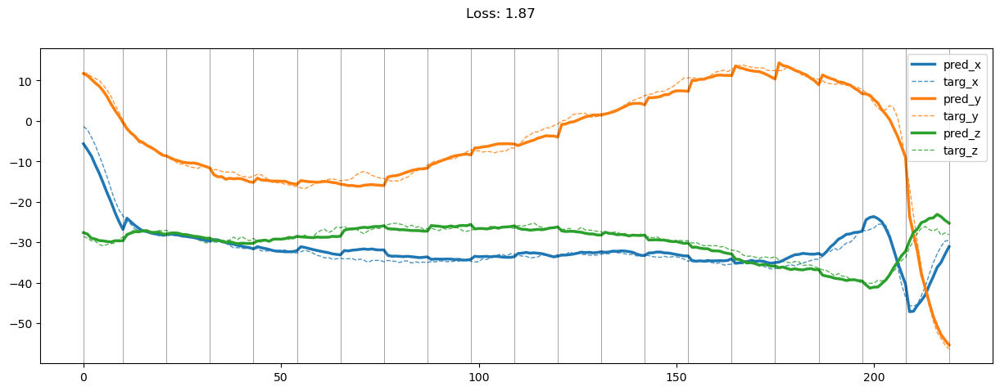

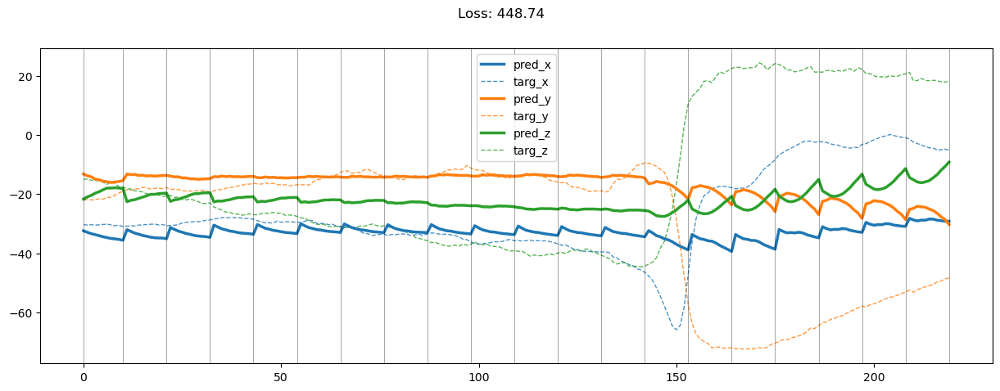

01899: train total loss:  1.298, pred loss:  1.298, valid total loss:  118.783, pred loss:  118.783


100%|██████████| 7/7 [00:00<00:00, 30.07it/s]


01900: train total loss:  1.316, pred loss:  1.316, valid total loss:  118.384, pred loss:  118.384


100%|██████████| 7/7 [00:00<00:00, 30.41it/s]


01901: train total loss:  1.290, pred loss:  1.290, valid total loss:  119.104, pred loss:  119.104


100%|██████████| 7/7 [00:00<00:00, 30.11it/s]


01902: train total loss:  1.328, pred loss:  1.328, valid total loss:  117.441, pred loss:  117.441


100%|██████████| 7/7 [00:00<00:00, 29.31it/s]


01903: train total loss:  1.320, pred loss:  1.320, valid total loss:  120.019, pred loss:  120.019


100%|██████████| 7/7 [00:00<00:00, 30.14it/s]


01904: train total loss:  1.331, pred loss:  1.331, valid total loss:  117.961, pred loss:  117.961


100%|██████████| 7/7 [00:00<00:00, 27.48it/s]


01905: train total loss:  1.345, pred loss:  1.345, valid total loss:  120.877, pred loss:  120.877


100%|██████████| 7/7 [00:00<00:00, 25.43it/s]


01906: train total loss:  1.442, pred loss:  1.442, valid total loss:  122.288, pred loss:  122.288


100%|██████████| 7/7 [00:00<00:00, 27.67it/s]


01907: train total loss:  1.462, pred loss:  1.462, valid total loss:  117.058, pred loss:  117.058


100%|██████████| 7/7 [00:00<00:00, 29.34it/s]


01908: train total loss:  1.394, pred loss:  1.394, valid total loss:  120.959, pred loss:  120.959


100%|██████████| 7/7 [00:00<00:00, 28.19it/s]


01909: train total loss:  1.474, pred loss:  1.474, valid total loss:  123.018, pred loss:  123.018


100%|██████████| 7/7 [00:00<00:00, 29.93it/s]


01910: train total loss:  1.432, pred loss:  1.432, valid total loss:  122.639, pred loss:  122.639


100%|██████████| 7/7 [00:00<00:00, 33.38it/s]


01911: train total loss:  1.364, pred loss:  1.364, valid total loss:  117.955, pred loss:  117.955


100%|██████████| 7/7 [00:00<00:00, 33.46it/s]


01912: train total loss:  1.371, pred loss:  1.371, valid total loss:  119.684, pred loss:  119.684


100%|██████████| 7/7 [00:00<00:00, 32.73it/s]


01913: train total loss:  1.365, pred loss:  1.365, valid total loss:  120.105, pred loss:  120.105


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01914: train total loss:  1.326, pred loss:  1.326, valid total loss:  119.023, pred loss:  119.023


100%|██████████| 7/7 [00:00<00:00, 33.12it/s]


01915: train total loss:  1.271, pred loss:  1.271, valid total loss:  118.338, pred loss:  118.338


100%|██████████| 7/7 [00:00<00:00, 33.77it/s]


01916: train total loss:  1.300, pred loss:  1.300, valid total loss:  118.416, pred loss:  118.416


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01917: train total loss:  1.313, pred loss:  1.313, valid total loss:  121.524, pred loss:  121.524


100%|██████████| 7/7 [00:00<00:00, 33.18it/s]


01918: train total loss:  1.304, pred loss:  1.304, valid total loss:  118.827, pred loss:  118.827


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01919: train total loss:  1.344, pred loss:  1.344, valid total loss:  119.131, pred loss:  119.131


100%|██████████| 7/7 [00:00<00:00, 33.23it/s]


01920: train total loss:  1.321, pred loss:  1.321, valid total loss:  123.213, pred loss:  123.213


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01921: train total loss:  1.311, pred loss:  1.311, valid total loss:  121.504, pred loss:  121.504


100%|██████████| 7/7 [00:00<00:00, 33.39it/s]


01922: train total loss:  1.272, pred loss:  1.272, valid total loss:  123.893, pred loss:  123.893


100%|██████████| 7/7 [00:00<00:00, 33.14it/s]


01923: train total loss:  1.325, pred loss:  1.325, valid total loss:  121.915, pred loss:  121.915


100%|██████████| 7/7 [00:00<00:00, 33.30it/s]


01924: train total loss:  1.307, pred loss:  1.307, valid total loss:  122.005, pred loss:  122.005


100%|██████████| 7/7 [00:00<00:00, 30.59it/s]


01925: train total loss:  1.303, pred loss:  1.303, valid total loss:  120.980, pred loss:  120.980


100%|██████████| 7/7 [00:00<00:00, 28.32it/s]


01926: train total loss:  1.318, pred loss:  1.318, valid total loss:  117.344, pred loss:  117.344


100%|██████████| 7/7 [00:00<00:00, 30.75it/s]


01927: train total loss:  1.325, pred loss:  1.325, valid total loss:  117.933, pred loss:  117.933


100%|██████████| 7/7 [00:00<00:00, 29.95it/s]


01928: train total loss:  1.333, pred loss:  1.333, valid total loss:  118.425, pred loss:  118.425


100%|██████████| 7/7 [00:00<00:00, 25.21it/s]


01929: train total loss:  1.281, pred loss:  1.281, valid total loss:  117.109, pred loss:  117.109


100%|██████████| 7/7 [00:00<00:00, 30.24it/s]


01930: train total loss:  1.277, pred loss:  1.277, valid total loss:  121.637, pred loss:  121.637


100%|██████████| 7/7 [00:00<00:00, 26.62it/s]


01931: train total loss:  1.259, pred loss:  1.259, valid total loss:  123.222, pred loss:  123.222


100%|██████████| 7/7 [00:00<00:00, 27.04it/s]


01932: train total loss:  1.239, pred loss:  1.239, valid total loss:  120.500, pred loss:  120.500


100%|██████████| 7/7 [00:00<00:00, 22.38it/s]


01933: train total loss:  1.216, pred loss:  1.216, valid total loss:  120.553, pred loss:  120.553


100%|██████████| 7/7 [00:00<00:00, 33.81it/s]


01934: train total loss:  1.253, pred loss:  1.253, valid total loss:  124.065, pred loss:  124.065


100%|██████████| 7/7 [00:00<00:00, 34.08it/s]


01935: train total loss:  1.283, pred loss:  1.283, valid total loss:  123.785, pred loss:  123.785


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01936: train total loss:  1.264, pred loss:  1.264, valid total loss:  122.327, pred loss:  122.327


100%|██████████| 7/7 [00:00<00:00, 33.07it/s]


01937: train total loss:  1.300, pred loss:  1.300, valid total loss:  121.112, pred loss:  121.112


100%|██████████| 7/7 [00:00<00:00, 22.50it/s]


01938: train total loss:  1.324, pred loss:  1.324, valid total loss:  120.062, pred loss:  120.062


100%|██████████| 7/7 [00:00<00:00, 23.24it/s]


01939: train total loss:  1.294, pred loss:  1.294, valid total loss:  120.140, pred loss:  120.140


100%|██████████| 7/7 [00:00<00:00, 25.03it/s]


01940: train total loss:  1.279, pred loss:  1.279, valid total loss:  120.207, pred loss:  120.207


100%|██████████| 7/7 [00:00<00:00, 23.24it/s]


01941: train total loss:  1.348, pred loss:  1.348, valid total loss:  115.717, pred loss:  115.717


100%|██████████| 7/7 [00:00<00:00, 33.26it/s]


01942: train total loss:  1.401, pred loss:  1.401, valid total loss:  112.956, pred loss:  112.956


100%|██████████| 7/7 [00:00<00:00, 33.99it/s]


01943: train total loss:  1.409, pred loss:  1.409, valid total loss:  113.113, pred loss:  113.113


100%|██████████| 7/7 [00:00<00:00, 33.68it/s]


01944: train total loss:  1.424, pred loss:  1.424, valid total loss:  115.432, pred loss:  115.432


100%|██████████| 7/7 [00:00<00:00, 34.04it/s]


01945: train total loss:  1.370, pred loss:  1.370, valid total loss:  119.948, pred loss:  119.948


100%|██████████| 7/7 [00:00<00:00, 33.61it/s]


01946: train total loss:  1.347, pred loss:  1.347, valid total loss:  116.690, pred loss:  116.690


100%|██████████| 7/7 [00:00<00:00, 26.68it/s]


01947: train total loss:  1.325, pred loss:  1.325, valid total loss:  114.845, pred loss:  114.845


100%|██████████| 7/7 [00:00<00:00, 33.59it/s]


01948: train total loss:  1.318, pred loss:  1.318, valid total loss:  117.498, pred loss:  117.498


100%|██████████| 7/7 [00:00<00:00, 34.14it/s]


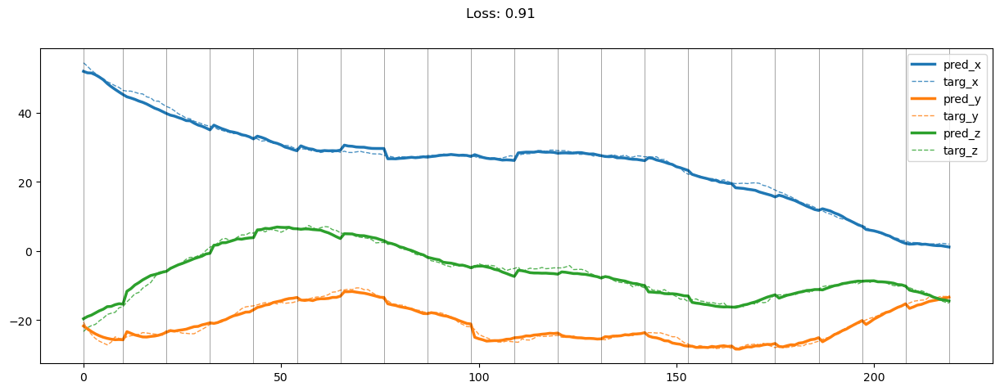

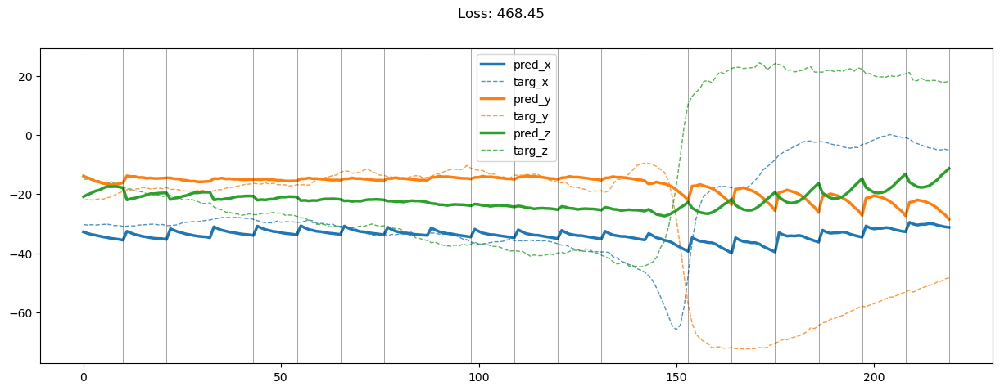

01949: train total loss:  1.318, pred loss:  1.318, valid total loss:  119.136, pred loss:  119.136


100%|██████████| 7/7 [00:00<00:00, 28.46it/s]


01950: train total loss:  1.299, pred loss:  1.299, valid total loss:  117.813, pred loss:  117.813


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


01951: train total loss:  1.273, pred loss:  1.273, valid total loss:  115.473, pred loss:  115.473


100%|██████████| 7/7 [00:00<00:00, 32.59it/s]


01952: train total loss:  1.280, pred loss:  1.280, valid total loss:  120.050, pred loss:  120.050


100%|██████████| 7/7 [00:00<00:00, 34.05it/s]


01953: train total loss:  1.293, pred loss:  1.293, valid total loss:  120.414, pred loss:  120.414


100%|██████████| 7/7 [00:00<00:00, 33.76it/s]


01954: train total loss:  1.296, pred loss:  1.296, valid total loss:  117.676, pred loss:  117.676


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


01955: train total loss:  1.341, pred loss:  1.341, valid total loss:  117.602, pred loss:  117.602


100%|██████████| 7/7 [00:00<00:00, 34.28it/s]


01956: train total loss:  1.266, pred loss:  1.266, valid total loss:  121.819, pred loss:  121.819


100%|██████████| 7/7 [00:00<00:00, 34.02it/s]


01957: train total loss:  1.317, pred loss:  1.317, valid total loss:  119.753, pred loss:  119.753


100%|██████████| 7/7 [00:00<00:00, 33.25it/s]


01958: train total loss:  1.270, pred loss:  1.270, valid total loss:  115.479, pred loss:  115.479


100%|██████████| 7/7 [00:00<00:00, 28.74it/s]


01959: train total loss:  1.276, pred loss:  1.276, valid total loss:  119.034, pred loss:  119.034


100%|██████████| 7/7 [00:00<00:00, 29.38it/s]


01960: train total loss:  1.288, pred loss:  1.288, valid total loss:  118.339, pred loss:  118.339


100%|██████████| 7/7 [00:00<00:00, 33.45it/s]


01961: train total loss:  1.269, pred loss:  1.269, valid total loss:  118.257, pred loss:  118.257


100%|██████████| 7/7 [00:00<00:00, 25.98it/s]


01962: train total loss:  1.274, pred loss:  1.274, valid total loss:  117.749, pred loss:  117.749


100%|██████████| 7/7 [00:00<00:00, 23.56it/s]


01963: train total loss:  1.244, pred loss:  1.244, valid total loss:  120.872, pred loss:  120.872


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


01964: train total loss:  1.256, pred loss:  1.256, valid total loss:  123.665, pred loss:  123.665


100%|██████████| 7/7 [00:00<00:00, 34.04it/s]


01965: train total loss:  1.234, pred loss:  1.234, valid total loss:  120.493, pred loss:  120.493


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01966: train total loss:  1.247, pred loss:  1.247, valid total loss:  120.549, pred loss:  120.549


100%|██████████| 7/7 [00:00<00:00, 34.21it/s]


01967: train total loss:  1.258, pred loss:  1.258, valid total loss:  119.062, pred loss:  119.062


100%|██████████| 7/7 [00:00<00:00, 34.20it/s]


01968: train total loss:  1.244, pred loss:  1.244, valid total loss:  121.453, pred loss:  121.453


100%|██████████| 7/7 [00:00<00:00, 33.65it/s]


01969: train total loss:  1.267, pred loss:  1.267, valid total loss:  118.129, pred loss:  118.129


100%|██████████| 7/7 [00:00<00:00, 34.41it/s]


01970: train total loss:  1.236, pred loss:  1.236, valid total loss:  119.468, pred loss:  119.468


100%|██████████| 7/7 [00:00<00:00, 34.12it/s]


01971: train total loss:  1.240, pred loss:  1.240, valid total loss:  119.316, pred loss:  119.316


100%|██████████| 7/7 [00:00<00:00, 22.27it/s]


01972: train total loss:  1.247, pred loss:  1.247, valid total loss:  121.784, pred loss:  121.784


100%|██████████| 7/7 [00:00<00:00, 29.73it/s]


01973: train total loss:  1.248, pred loss:  1.248, valid total loss:  121.594, pred loss:  121.594


100%|██████████| 7/7 [00:00<00:00, 28.83it/s]


01974: train total loss:  1.333, pred loss:  1.333, valid total loss:  119.125, pred loss:  119.125


100%|██████████| 7/7 [00:00<00:00, 30.55it/s]


01975: train total loss:  1.258, pred loss:  1.258, valid total loss:  121.203, pred loss:  121.203


100%|██████████| 7/7 [00:00<00:00, 26.42it/s]


01976: train total loss:  1.337, pred loss:  1.337, valid total loss:  119.279, pred loss:  119.279


100%|██████████| 7/7 [00:00<00:00, 33.57it/s]


01977: train total loss:  1.368, pred loss:  1.368, valid total loss:  120.120, pred loss:  120.120


100%|██████████| 7/7 [00:00<00:00, 33.40it/s]


01978: train total loss:  1.321, pred loss:  1.321, valid total loss:  118.999, pred loss:  118.999


100%|██████████| 7/7 [00:00<00:00, 33.69it/s]


01979: train total loss:  1.347, pred loss:  1.347, valid total loss:  118.683, pred loss:  118.683


100%|██████████| 7/7 [00:00<00:00, 33.50it/s]


01980: train total loss:  1.303, pred loss:  1.303, valid total loss:  118.659, pred loss:  118.659


100%|██████████| 7/7 [00:00<00:00, 33.44it/s]


01981: train total loss:  1.253, pred loss:  1.253, valid total loss:  119.503, pred loss:  119.503


100%|██████████| 7/7 [00:00<00:00, 33.82it/s]


01982: train total loss:  1.266, pred loss:  1.266, valid total loss:  122.858, pred loss:  122.858


100%|██████████| 7/7 [00:00<00:00, 33.71it/s]


01983: train total loss:  1.255, pred loss:  1.255, valid total loss:  123.844, pred loss:  123.844


100%|██████████| 7/7 [00:00<00:00, 33.84it/s]


01984: train total loss:  1.228, pred loss:  1.228, valid total loss:  118.097, pred loss:  118.097


100%|██████████| 7/7 [00:00<00:00, 33.99it/s]


01985: train total loss:  1.239, pred loss:  1.239, valid total loss:  117.331, pred loss:  117.331


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01986: train total loss:  1.279, pred loss:  1.279, valid total loss:  119.529, pred loss:  119.529


100%|██████████| 7/7 [00:00<00:00, 34.30it/s]


01987: train total loss:  1.272, pred loss:  1.272, valid total loss:  119.563, pred loss:  119.563


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


01988: train total loss:  1.325, pred loss:  1.325, valid total loss:  120.529, pred loss:  120.529


100%|██████████| 7/7 [00:00<00:00, 34.06it/s]


01989: train total loss:  1.369, pred loss:  1.369, valid total loss:  121.006, pred loss:  121.006


100%|██████████| 7/7 [00:00<00:00, 34.34it/s]


01990: train total loss:  1.306, pred loss:  1.306, valid total loss:  116.375, pred loss:  116.375


100%|██████████| 7/7 [00:00<00:00, 33.82it/s]


01991: train total loss:  1.294, pred loss:  1.294, valid total loss:  113.657, pred loss:  113.657


100%|██████████| 7/7 [00:00<00:00, 33.67it/s]


01992: train total loss:  1.247, pred loss:  1.247, valid total loss:  119.251, pred loss:  119.251


100%|██████████| 7/7 [00:00<00:00, 34.29it/s]


01993: train total loss:  1.297, pred loss:  1.297, valid total loss:  115.930, pred loss:  115.930


100%|██████████| 7/7 [00:00<00:00, 33.93it/s]


01994: train total loss:  1.288, pred loss:  1.288, valid total loss:  120.666, pred loss:  120.666


100%|██████████| 7/7 [00:00<00:00, 33.66it/s]


01995: train total loss:  1.235, pred loss:  1.235, valid total loss:  119.500, pred loss:  119.500


100%|██████████| 7/7 [00:00<00:00, 34.22it/s]


01996: train total loss:  1.275, pred loss:  1.275, valid total loss:  115.309, pred loss:  115.309


100%|██████████| 7/7 [00:00<00:00, 33.87it/s]


01997: train total loss:  1.242, pred loss:  1.242, valid total loss:  115.357, pred loss:  115.357


100%|██████████| 7/7 [00:00<00:00, 33.55it/s]


01998: train total loss:  1.271, pred loss:  1.271, valid total loss:  116.224, pred loss:  116.224


100%|██████████| 7/7 [00:00<00:00, 34.26it/s]


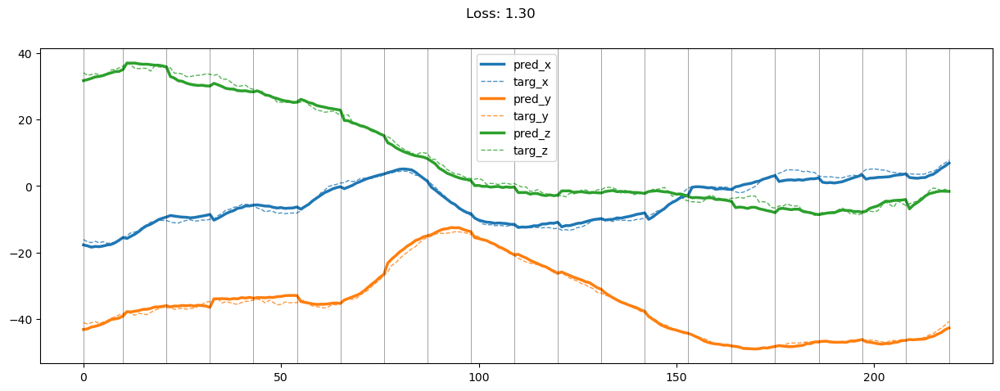

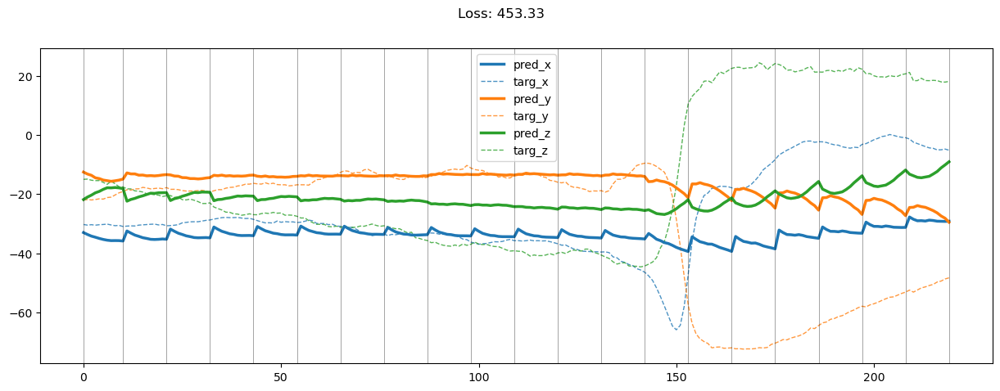

01999: train total loss:  1.306, pred loss:  1.306, valid total loss:  117.476, pred loss:  117.476


In [29]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 50 == 0:
        draw = True
    
    train_loss, train_pred_loss = train(model, train_loader, optimizer, draw)
    valid_loss, valid_pred_loss = evalute(model, valid_loader, draw)
    
    draw = False
    
    ep = str(epoch).zfill(5)
    print(f'{ep}: train total loss: {train_loss: 2.3f}, pred loss: {train_pred_loss: 2.3f}, valid total loss: {valid_loss: 2.3f}, pred loss: {valid_pred_loss: 2.3f}')

In [33]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12])

            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            
            results.extend(zip(predict_mag.detach().cpu().numpy(), target_data[:, :, :, 9:12].cpu().numpy()))
            
            break
    
    return np.array(results)

In [34]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(32, 2, 20, 11, 3)


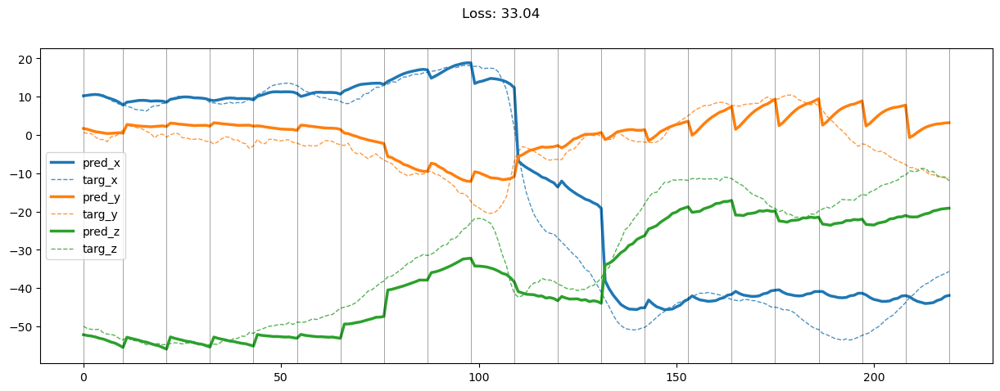

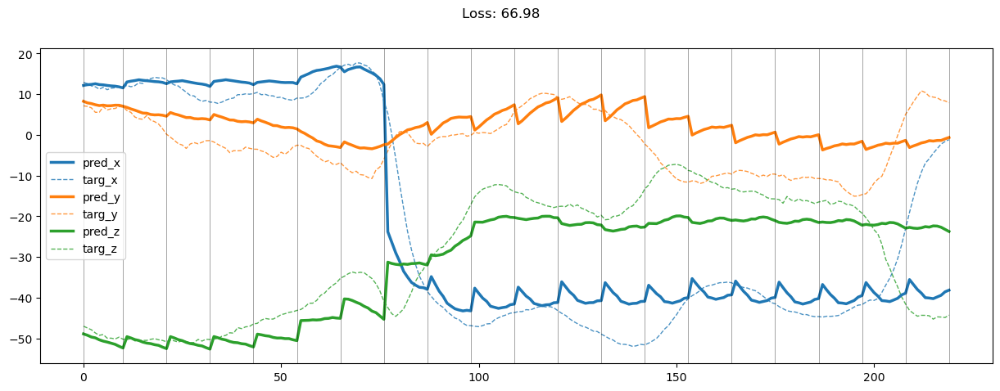

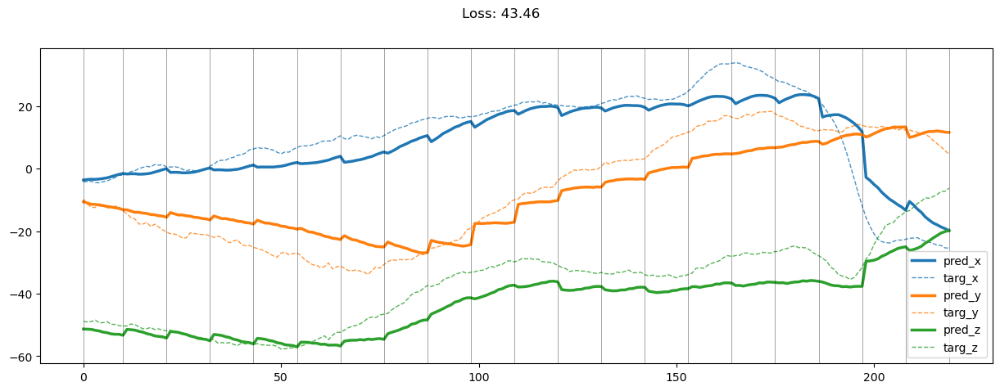

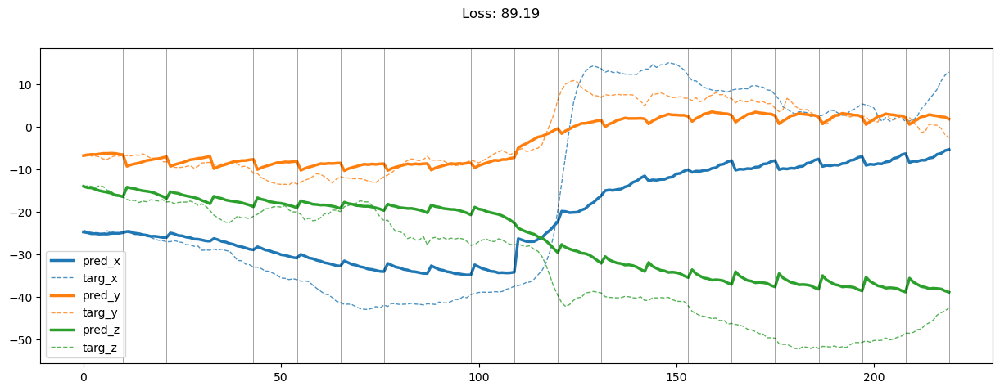

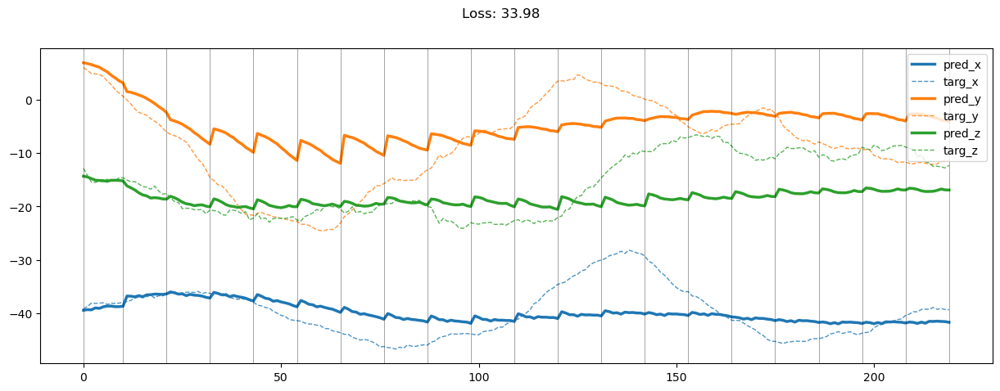

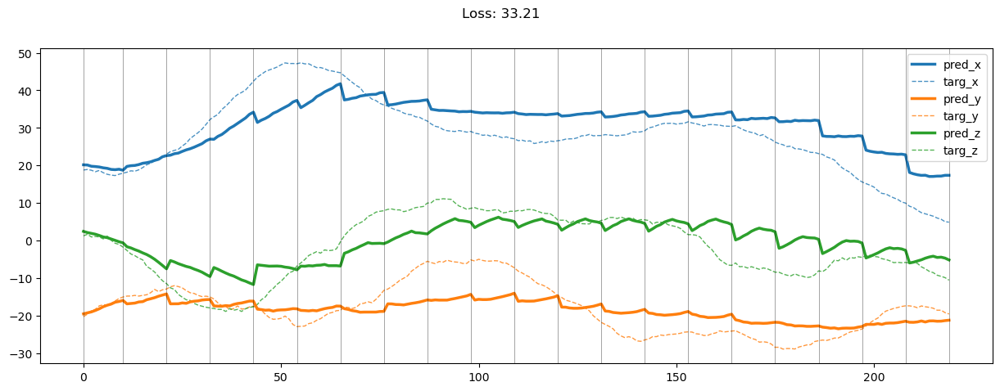

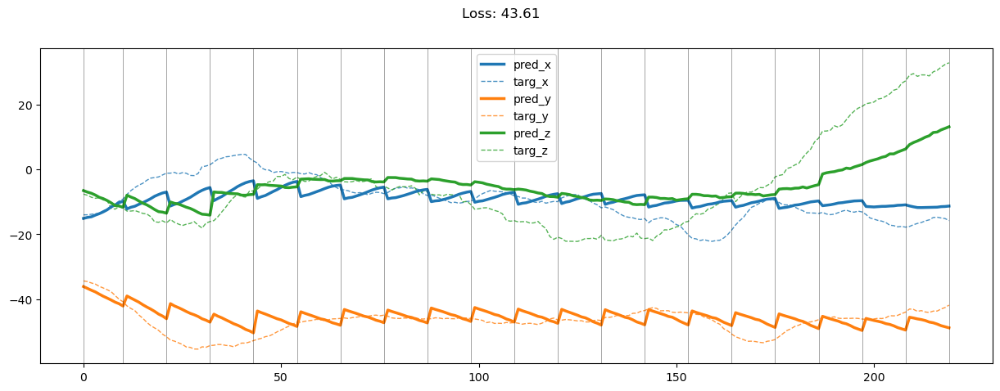

In [35]:
results = output_eval(model, train_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)

(32, 2, 20, 11, 3)


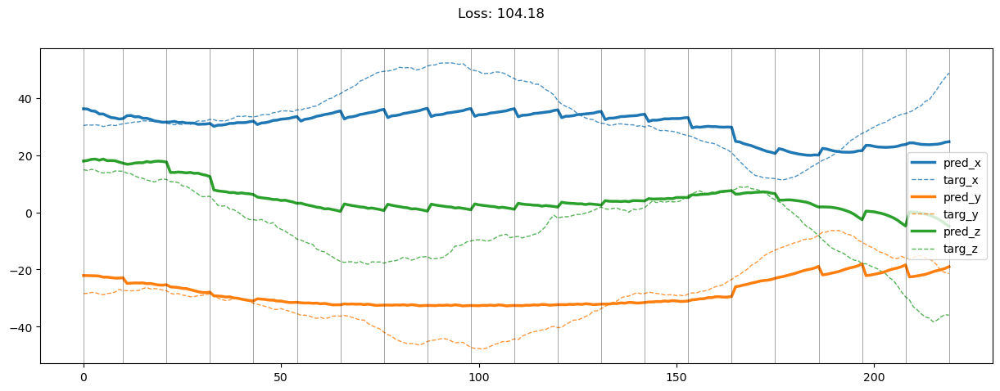

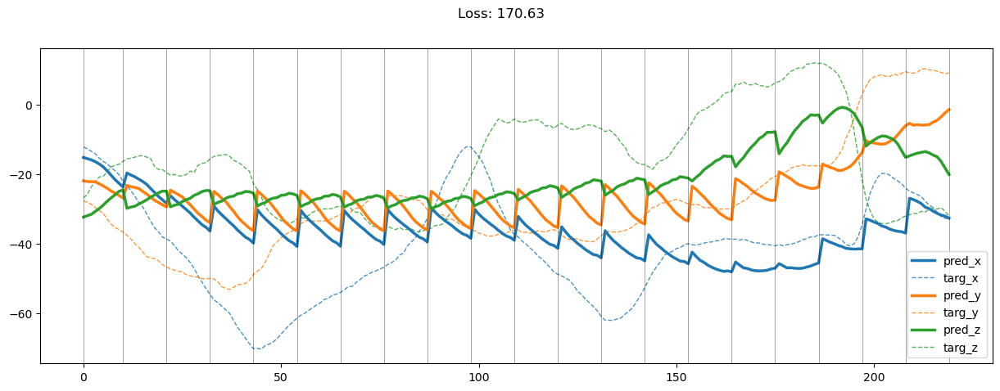

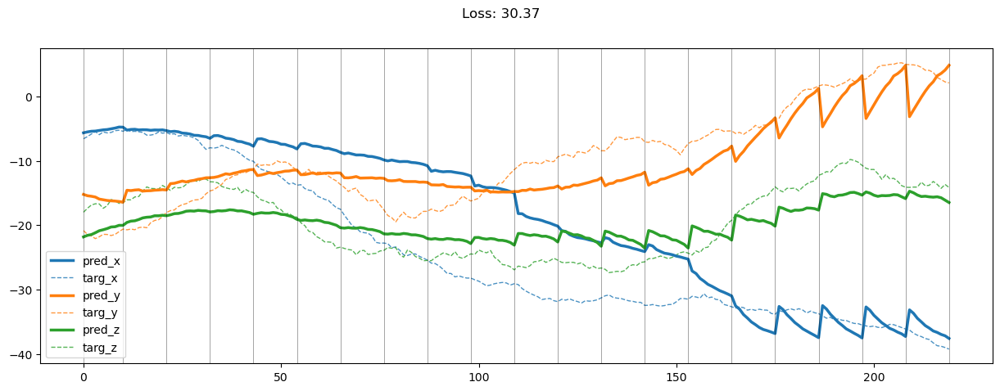

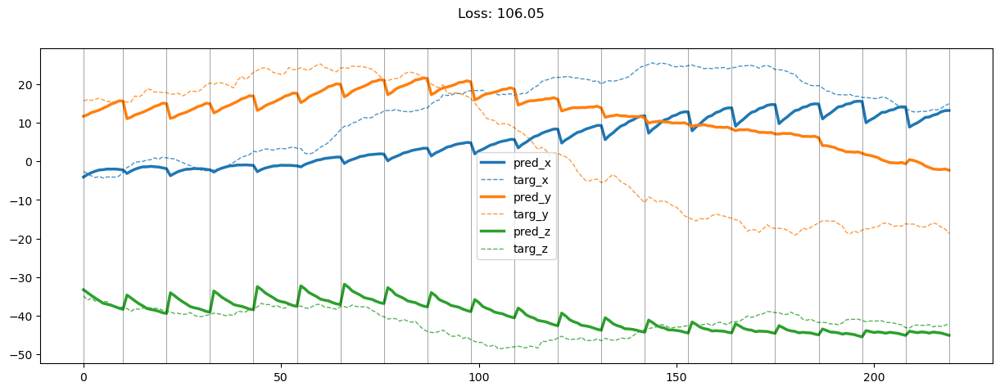

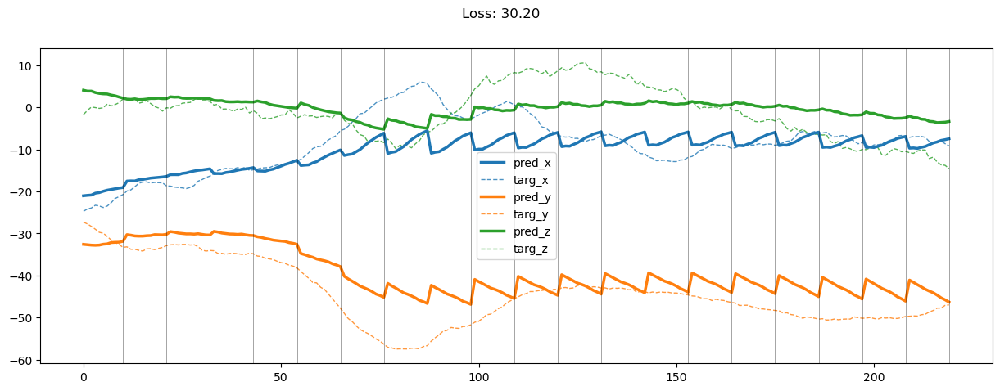

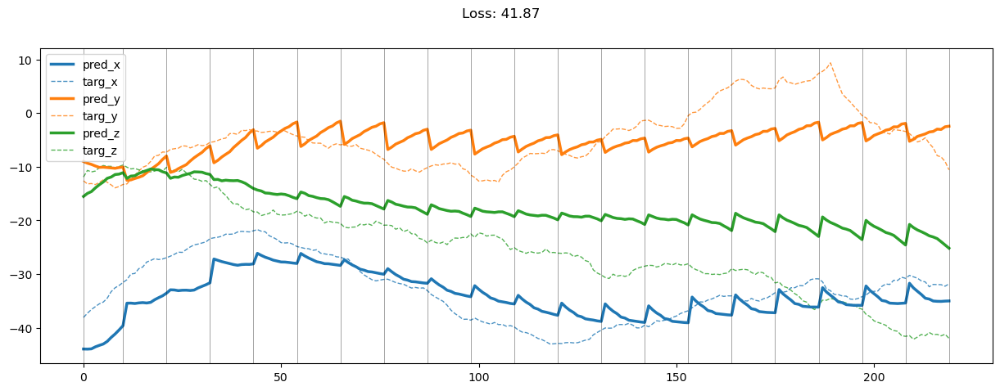

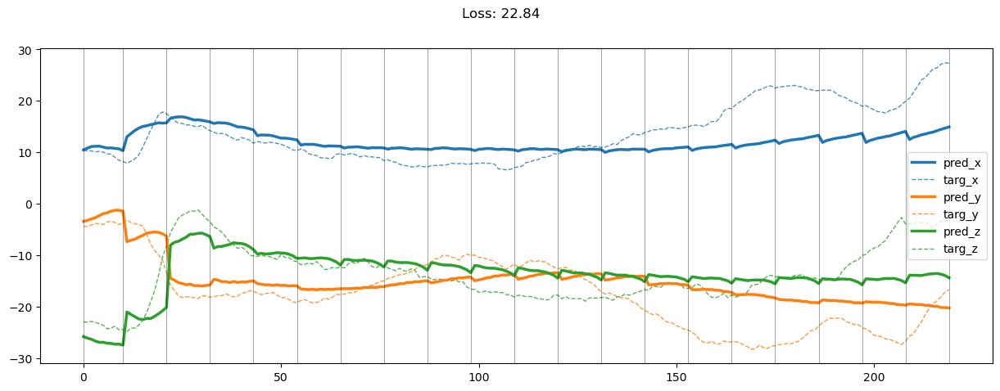

In [36]:
results = output_eval(model, valid_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)